<a href="https://colab.research.google.com/github/Atom-101/PokeGAN/blob/master/Colab/PokeGAN_Final_34to45.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass

!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}


E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package libfuse2:amd64.
(Reading database ... 22298 files and directories currently installed.)
Preparing to unpack .../libfuse2_2.9.7-1ubuntu1_amd64.deb ...
Unpacking libfuse2:amd64 (2.9.7-1ubuntu1) ...
Selecting previously unselected package fuse.
Preparing to unpack .../fuse_2.9.7-1ubuntu1_amd64.deb ...
Unpacking fuse (2.9.7-1ubuntu1) ...
Selecting previously unselected package google-drive-ocamlfuse.
Preparing to unpack .../google-drive-ocamlfuse_0.7.1-0ubuntu2~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Setting up libfuse2:amd64 (2.9.7-1ubuntu1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up fuse (2.9.7-1ubuntu1) ...
Setting up google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleus

In [0]:
!mkdir -p drive
!google-drive-ocamlfuse drive

import os

In [3]:
import tensorflow as tf
tf.test.gpu_device_name()


'/device:GPU:0'

In [0]:
!apt-get -qq install -y libsm6 libxext6 && pip install -q -U opencv-python
import cv2

import os
from random import shuffle
import glob
import numpy as np
import h5py
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [0]:
def show_images(images):

  image = images[0]
  image += 1
  image /= 2.0
  #image = np.ceil(image)
  
  plt.axis('off')
  plt.imshow(image)

#Load

In [6]:
dat = h5py.File('drive/Pokemon/Dataset/HDF5/Pokemon_Fire_Dataset.h5', 'r')
img_array = dat['Pokemon']

print(img_array.shape)

img_array = np.asarray(img_array, dtype = np.float16)

(37962, 96, 96, 3)


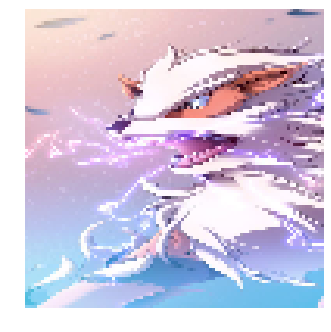

In [0]:
show_images(np.asarray(img_array[3119:3200], dtype = np.float32))
plt.show()

#Discriminator

In [0]:
def discriminator(x,isTrain,keep_prob):
  
    with tf.variable_scope("discriminator"):
        
        
        print(x.shape)
        #print([-1,tf.sqrt(tf.cast(x.shape[1],tf.float32)),tf.sqrt(tf.cast(x.shape[1],tf.float32)),1])
        #x = tf.reshape(x,[-1,(int)((int)(x.shape[1])**.5),(int)((int)(x.shape[1])**.5),1])
        
        x = tf.reshape(x,[-1,96,96,3])
        
        print(x.shape)
        
        logits = tf.layers.conv2d(x,128,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,256,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,512,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,1024,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.flatten(logits)
        
        logits = tf.layers.dense(logits, 1, name = 'discriminator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        
        return logits


# Generator

In [0]:
def generator(z,isTrain,keep_prob):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    with tf.variable_scope("generator"):
        # TODO: implement architecture
        
        #print(z.shape)     
        
        img = tf.layers.dense(z, 6*6*1024, activation = tf.nn.leaky_relu, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.layers.dense(img, 32*16*16, activation = tf.nn.relu, kernel_initializer=tf.random_normal_initializer(dtype=tf.float16) )
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.reshape(img,[-1,6,6,1024])
        
        img = tf.layers.conv2d_transpose(img, 512, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 256, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 128, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 3, 3, strides = 2, padding ='same', name = 'generator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.nn.tanh(img)
        
        print(img.shape)
        
        #img  = tf.layers.flatten(img)
        
        pass
        return img

In [0]:
def get_solvers(learning_rate=1e-4, beta1=0, beta2=0.9):

    D_solver = None
    G_solver = None
    
    D_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'D_solver_adam')
    G_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'G_solver_adam')
    
    pass
    return D_solver, G_solver

In [0]:
def wgan_loss(logits_real, logits_fake, real_data, fake_data,keep_prob,isTrain, batch_size = 32):

  lambd = 10
  G_loss = -tf.reduce_mean(logits_fake)
  D_loss = tf.reduce_mean(logits_fake) - tf.reduce_mean(logits_real) 
  
  #Implement gradient penalty
  epsilon = tf.random_uniform([batch_size,1,1,1], minval = 0, maxval = 1)
  #interpolates = tf.multiply((1-epsilon),real_data)+tf.multiply(epsilon,fake_data) #introduce randomness using epsilon
  interpolates = (1-epsilon)*real_data + epsilon* fake_data
  with tf.variable_scope('', reuse =True):
      grads = tf.gradients(discriminator(interpolates,isTrain,keep_prob), [interpolates])[0] #why is this zero used?
  
  slopes = tf.sqrt(tf.reduce_sum(tf.square(grads))) #L2-norm
  grad_penalty = tf.reduce_mean((slopes-1.)**2)#penalty is a scalar
  
  D_loss += lambd*grad_penalty
    
  pass
  return D_loss, G_loss

In [11]:
tf.reset_default_graph()

batch_size = 32
# our noise dimension
noise_dim = 100

# placeholders for images from the training dataset
x = tf.placeholder(tf.float32, [None, 96, 96, 3])
isTrain = tf.placeholder(tf.bool, shape=(), name = 'isTrain')
keep_prob = tf.placeholder_with_default(1.0, shape=())

z = tf.random_uniform([batch_size,noise_dim],minval = -1, maxval = 1)
# generated images

G_sample = generator(z,isTrain,keep_prob)

#Variable to store D_loss of each epoch
d_losses = []

#Run when D_loss and G_loss are called
with tf.variable_scope("") as scope:
    logits_real = discriminator(x,isTrain,keep_prob)
    fake_data = G_sample
    scope.reuse_variables()
    logits_fake = discriminator(fake_data,isTrain,keep_prob)

# Get the list of variables for the discriminator and generator
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'discriminator')
G_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'generator') 


D_solver,G_solver = get_solvers()
D_loss, G_loss = wgan_loss(logits_real, logits_fake, x, fake_data,keep_prob,isTrain, batch_size = batch_size)




#Update extra variables like batch_norm gamma and beta
D_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'discriminator')
G_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'generator')


with tf.control_dependencies(D_extra_step):
  D_train_step = D_solver.minimize(D_loss, var_list=D_vars)

with tf.control_dependencies(G_extra_step):
  G_train_step = G_solver.minimize(G_loss, var_list=G_vars)


(32, 96, 96, 3)
(?, 96, 96, 3)
(?, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)


In [0]:
def minibatches(inputs, batchsize):
    indices = np.arange(inputs.shape[0])
    np.random.shuffle(indices)
    x = []
    for i in range(batchsize):
        x.append(inputs[indices[i]])
    return np.asarray(x)

In [0]:
def run_a_gan(sess, G_train_step, G_loss, D_train_step, D_loss, G_extra_step, D_extra_step, saver,
                     show_every=20, print_every=1, batch_size=32, num_epoch=10):
   
   
    for epoch in range(35599,35599+num_epoch):
        prob = 1 - 0.4**epoch #ranges from 0.6 to 1
        #X = minibatches(img_array,batch_size)
        # every so often, show a sample result
        if (epoch % show_every == 0):
            samples = sess.run(G_sample, feed_dict={isTrain:False})
            fig = show_images(samples[:4])
            plt.show()
            #Save image samples generated while training
            
            print()
        
        _, G_loss_curr = sess.run([G_train_step, G_loss], feed_dict={isTrain:True,keep_prob:prob})
           
        #Train critic 5 times per epoch
        for _ in range(5):
          X = minibatches(img_array,batch_size)
          _, D_loss_curr = sess.run([D_train_step, D_loss], feed_dict={x: X, isTrain:True,keep_prob:prob})
          

        #Various displays
        if (epoch % print_every == 0):
            print('Epoch: {}, D: {:.4}, G: {:.4}'.format(epoch,D_loss_curr,G_loss_curr))
        
        #Save stuff every 400 epochs
        if (epoch % 400 == 399):    
          try: 
            saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoints/Model_'+str(epoch)+'.ckpt')
            np.save('drive/Pokemon_Fire/Final_Discriminator_loss.npy', np.asarray(d_losses))
          except:
            pass
          
          
        d_losses.append(D_loss_curr)
          
        if(epoch%500 == 0):  
          try:
            if(epoch>=1000):
                 with h5py.File('drive/Pokemon_Fire/Final_gen_while_training.h5','a') as file:
                     file.create_dataset('Samples'+str(epoch),samples.shape, np.float32)
                     file['Samples'+str(epoch)][...] = np.asarray(samples, dtype = np.float32)
          except:
            pass

    
    saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoint_Complete/model.ckpt')
    
    print('Final images')
    samples = sess.run(G_sample, feed_dict={isTrain:False})
    fig = show_images(samples1[:4])
    plt.show()

drive/Pokemon_Fire/Final_Checkpoints/Model_35599.ckpt
INFO:tensorflow:Restoring parameters from drive/Pokemon_Fire/Final_Checkpoints/Model_35599.ckpt
Restored!
Epoch: 35599, D: -5.325, G: 3.824


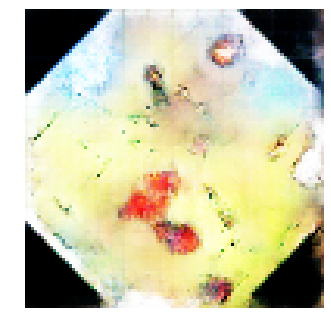


Epoch: 35600, D: -5.268, G: 5.02
Epoch: 35601, D: -7.297, G: 3.42
Epoch: 35602, D: -6.649, G: 4.17
Epoch: 35603, D: -5.376, G: 3.654
Epoch: 35604, D: -5.643, G: 6.726
Epoch: 35605, D: -5.189, G: 4.391
Epoch: 35606, D: -5.498, G: 3.083
Epoch: 35607, D: -6.844, G: 4.724
Epoch: 35608, D: -6.452, G: 4.393
Epoch: 35609, D: -6.69, G: 2.578
Epoch: 35610, D: -6.41, G: 4.095
Epoch: 35611, D: -6.309, G: 3.276
Epoch: 35612, D: -5.699, G: 3.708
Epoch: 35613, D: -6.456, G: 3.162
Epoch: 35614, D: -6.148, G: 4.54
Epoch: 35615, D: -6.88, G: 4.131
Epoch: 35616, D: -6.558, G: 3.17
Epoch: 35617, D: -6.147, G: 2.981
Epoch: 35618, D: -5.866, G: 3.672
Epoch: 35619, D: -7.235, G: 2.607


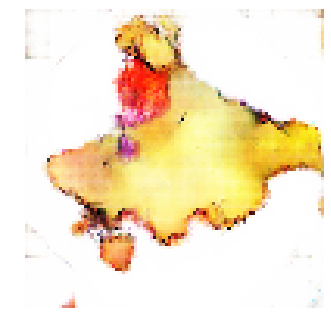


Epoch: 35620, D: -4.969, G: 4.719
Epoch: 35621, D: -5.174, G: 3.921
Epoch: 35622, D: -5.549, G: 5.041
Epoch: 35623, D: -5.231, G: 4.265
Epoch: 35624, D: -5.007, G: 4.751
Epoch: 35625, D: -6.428, G: 4.064
Epoch: 35626, D: -6.858, G: 4.799
Epoch: 35627, D: -5.804, G: 6.007
Epoch: 35628, D: -5.424, G: 4.857
Epoch: 35629, D: -7.57, G: 4.387
Epoch: 35630, D: -6.087, G: 2.731
Epoch: 35631, D: -6.273, G: 2.451
Epoch: 35632, D: -5.925, G: 3.101
Epoch: 35633, D: -5.759, G: 1.153
Epoch: 35634, D: -5.83, G: 2.686
Epoch: 35635, D: -7.649, G: 3.201
Epoch: 35636, D: -5.756, G: 3.604
Epoch: 35637, D: -6.234, G: 4.351
Epoch: 35638, D: -6.552, G: 2.63
Epoch: 35639, D: -4.58, G: 5.183


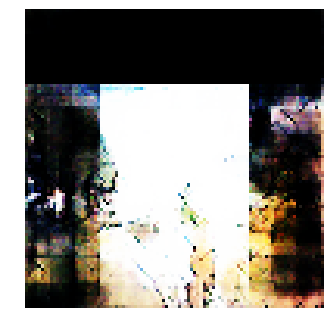


Epoch: 35640, D: -5.431, G: 3.917
Epoch: 35641, D: -7.469, G: 3.765
Epoch: 35642, D: -5.881, G: 4.668
Epoch: 35643, D: -6.974, G: 4.383
Epoch: 35644, D: -6.536, G: 2.995
Epoch: 35645, D: -6.696, G: 3.172
Epoch: 35646, D: -7.458, G: 3.597
Epoch: 35647, D: -6.655, G: 3.576
Epoch: 35648, D: -6.3, G: 5.287
Epoch: 35649, D: -5.529, G: 3.083
Epoch: 35650, D: -6.064, G: 3.086
Epoch: 35651, D: -6.579, G: 3.616
Epoch: 35652, D: -4.714, G: 4.167
Epoch: 35653, D: -5.495, G: 2.837
Epoch: 35654, D: -6.651, G: 4.94
Epoch: 35655, D: -6.213, G: 2.619
Epoch: 35656, D: -7.226, G: 2.759
Epoch: 35657, D: -5.628, G: 3.485
Epoch: 35658, D: -5.309, G: 4.487
Epoch: 35659, D: -7.752, G: 3.034


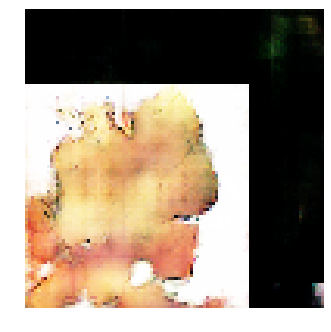


Epoch: 35660, D: -5.188, G: 2.213
Epoch: 35661, D: -5.636, G: 3.377
Epoch: 35662, D: -4.932, G: 3.707
Epoch: 35663, D: -5.995, G: 5.02
Epoch: 35664, D: -7.097, G: 3.155
Epoch: 35665, D: -6.811, G: 2.236
Epoch: 35666, D: -5.649, G: 3.232
Epoch: 35667, D: -6.98, G: 3.236
Epoch: 35668, D: -5.417, G: 3.617
Epoch: 35669, D: -5.802, G: 3.595
Epoch: 35670, D: -7.116, G: 3.624
Epoch: 35671, D: -5.686, G: 2.331
Epoch: 35672, D: -6.359, G: 5.23
Epoch: 35673, D: -6.48, G: 5.263
Epoch: 35674, D: -5.227, G: 3.569
Epoch: 35675, D: -5.8, G: 3.608
Epoch: 35676, D: -5.363, G: 5.699
Epoch: 35677, D: -5.479, G: 3.775
Epoch: 35678, D: -5.626, G: 2.781
Epoch: 35679, D: -5.387, G: 3.062


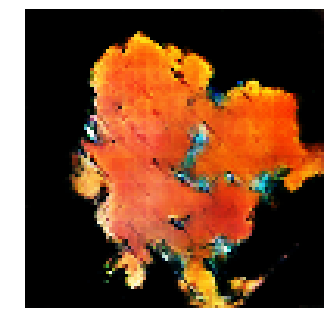


Epoch: 35680, D: -4.354, G: 2.698
Epoch: 35681, D: -7.99, G: 3.892
Epoch: 35682, D: -5.359, G: 1.106
Epoch: 35683, D: -5.624, G: 3.654
Epoch: 35684, D: -6.918, G: 3.213
Epoch: 35685, D: -6.456, G: 4.556
Epoch: 35686, D: -6.797, G: 5.174
Epoch: 35687, D: -6.228, G: 3.334
Epoch: 35688, D: -5.412, G: 5.686
Epoch: 35689, D: -4.085, G: 4.294
Epoch: 35690, D: -6.012, G: 2.872
Epoch: 35691, D: -5.394, G: 3.23
Epoch: 35692, D: -6.033, G: 2.11
Epoch: 35693, D: -6.182, G: 3.778
Epoch: 35694, D: -5.516, G: 3.371
Epoch: 35695, D: -5.412, G: 3.842
Epoch: 35696, D: -6.062, G: 3.823
Epoch: 35697, D: -7.38, G: 3.599
Epoch: 35698, D: -6.349, G: 3.482
Epoch: 35699, D: -6.596, G: 1.968


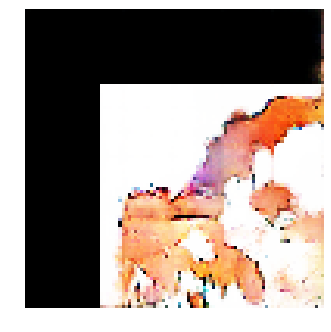


Epoch: 35700, D: -5.235, G: 3.58
Epoch: 35701, D: -6.452, G: 3.873
Epoch: 35702, D: -4.668, G: 3.248
Epoch: 35703, D: -7.545, G: 3.203
Epoch: 35704, D: -7.678, G: 2.667
Epoch: 35705, D: -5.85, G: 4.365
Epoch: 35706, D: -6.041, G: 4.014
Epoch: 35707, D: -5.91, G: 4.759
Epoch: 35708, D: -5.923, G: 5.15
Epoch: 35709, D: -6.583, G: 5.098
Epoch: 35710, D: -7.342, G: 3.891
Epoch: 35711, D: -5.589, G: 4.132
Epoch: 35712, D: -6.796, G: 3.354
Epoch: 35713, D: -6.114, G: 4.223
Epoch: 35714, D: -5.519, G: 6.52
Epoch: 35715, D: -7.13, G: 6.293
Epoch: 35716, D: -6.296, G: 2.668
Epoch: 35717, D: -6.519, G: 2.873
Epoch: 35718, D: -4.66, G: 4.304
Epoch: 35719, D: -8.058, G: 3.1


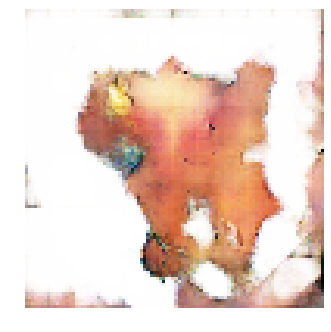


Epoch: 35720, D: -6.225, G: 5.129
Epoch: 35721, D: -5.473, G: 5.78
Epoch: 35722, D: -6.769, G: 4.917
Epoch: 35723, D: -4.997, G: 3.619
Epoch: 35724, D: -6.876, G: 3.432
Epoch: 35725, D: -5.938, G: 5.151
Epoch: 35726, D: -4.622, G: 4.726
Epoch: 35727, D: -7.59, G: 4.623
Epoch: 35728, D: -5.521, G: 4.82
Epoch: 35729, D: -6.17, G: 6.509
Epoch: 35730, D: -7.669, G: 3.375
Epoch: 35731, D: -5.506, G: 2.845
Epoch: 35732, D: -7.295, G: 3.618
Epoch: 35733, D: -5.221, G: 4.177
Epoch: 35734, D: -6.902, G: 3.185
Epoch: 35735, D: -6.713, G: 4.796
Epoch: 35736, D: -6.245, G: 1.754
Epoch: 35737, D: -4.654, G: 3.836
Epoch: 35738, D: -5.831, G: 3.99
Epoch: 35739, D: -5.569, G: 2.157


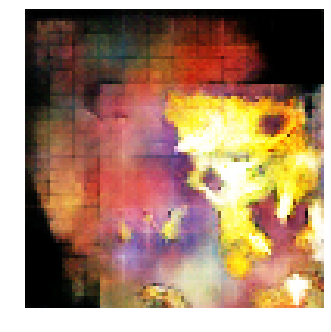


Epoch: 35740, D: -6.064, G: 3.413
Epoch: 35741, D: -5.387, G: 3.988
Epoch: 35742, D: -5.413, G: 3.945
Epoch: 35743, D: -5.236, G: 3.888
Epoch: 35744, D: -5.574, G: 3.901
Epoch: 35745, D: -7.895, G: 3.334
Epoch: 35746, D: -6.059, G: 2.862
Epoch: 35747, D: -6.817, G: 3.261
Epoch: 35748, D: -5.624, G: 3.176
Epoch: 35749, D: -5.019, G: 5.186
Epoch: 35750, D: -5.012, G: 4.982
Epoch: 35751, D: -6.297, G: 3.4
Epoch: 35752, D: -7.047, G: 3.658
Epoch: 35753, D: -6.43, G: 1.338
Epoch: 35754, D: -5.814, G: 2.501
Epoch: 35755, D: -5.338, G: 4.549
Epoch: 35756, D: -6.285, G: 3.953
Epoch: 35757, D: -6.136, G: 3.812
Epoch: 35758, D: -6.915, G: 3.923
Epoch: 35759, D: -5.936, G: 3.156


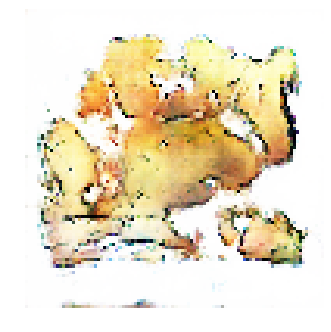


Epoch: 35760, D: -7.114, G: 3.969
Epoch: 35761, D: -6.825, G: 3.43
Epoch: 35762, D: -7.827, G: 5.377
Epoch: 35763, D: -5.885, G: 2.006
Epoch: 35764, D: -6.705, G: 2.587
Epoch: 35765, D: -5.944, G: 3.048
Epoch: 35766, D: -6.286, G: 4.894
Epoch: 35767, D: -5.884, G: 3.437
Epoch: 35768, D: -6.041, G: 4.073
Epoch: 35769, D: -6.153, G: 3.846
Epoch: 35770, D: -5.861, G: 4.325
Epoch: 35771, D: -8.678, G: 3.37
Epoch: 35772, D: -6.749, G: 4.204
Epoch: 35773, D: -7.073, G: 4.784
Epoch: 35774, D: -6.497, G: 3.171
Epoch: 35775, D: -5.667, G: 3.478
Epoch: 35776, D: -7.158, G: 4.96
Epoch: 35777, D: -4.398, G: 3.563
Epoch: 35778, D: -6.039, G: 4.592
Epoch: 35779, D: -5.267, G: 3.181


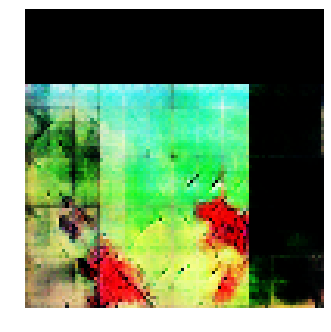


Epoch: 35780, D: -6.259, G: 3.988
Epoch: 35781, D: -5.315, G: 3.516
Epoch: 35782, D: -6.106, G: 4.345
Epoch: 35783, D: -5.392, G: 3.355
Epoch: 35784, D: -6.623, G: 2.982
Epoch: 35785, D: -5.432, G: 3.082
Epoch: 35786, D: -6.938, G: 3.172
Epoch: 35787, D: -6.142, G: 2.76
Epoch: 35788, D: -6.342, G: 4.102
Epoch: 35789, D: -5.808, G: 3.435
Epoch: 35790, D: -5.612, G: 4.968
Epoch: 35791, D: -7.581, G: 3.344
Epoch: 35792, D: -6.039, G: 2.164
Epoch: 35793, D: -5.664, G: 3.419
Epoch: 35794, D: -5.856, G: 4.387
Epoch: 35795, D: -6.427, G: 3.881
Epoch: 35796, D: -5.616, G: 3.139
Epoch: 35797, D: -5.887, G: 3.218
Epoch: 35798, D: -6.688, G: 2.327
Epoch: 35799, D: -5.43, G: 4.486


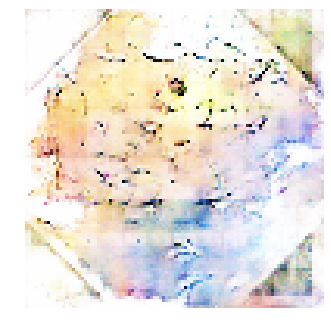


Epoch: 35800, D: -6.347, G: 3.595
Epoch: 35801, D: -4.656, G: 2.863
Epoch: 35802, D: -6.854, G: 3.203
Epoch: 35803, D: -6.737, G: 3.243
Epoch: 35804, D: -5.755, G: 3.186
Epoch: 35805, D: -5.921, G: 2.387
Epoch: 35806, D: -6.332, G: 3.2
Epoch: 35807, D: -6.089, G: 4.65
Epoch: 35808, D: -5.925, G: 3.787
Epoch: 35809, D: -6.285, G: 1.126
Epoch: 35810, D: -6.833, G: 2.195
Epoch: 35811, D: -6.761, G: 3.567
Epoch: 35812, D: -5.781, G: 2.897
Epoch: 35813, D: -5.141, G: 4.134
Epoch: 35814, D: -6.865, G: 5.09
Epoch: 35815, D: -6.57, G: 2.922
Epoch: 35816, D: -7.399, G: 5.784
Epoch: 35817, D: -3.58, G: 3.124
Epoch: 35818, D: -6.151, G: 4.056
Epoch: 35819, D: -7.74, G: 1.428


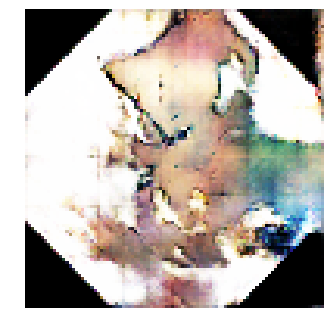


Epoch: 35820, D: -5.999, G: 3.513
Epoch: 35821, D: -7.597, G: 4.229
Epoch: 35822, D: -6.738, G: 4.989
Epoch: 35823, D: -8.037, G: 5.191
Epoch: 35824, D: -5.995, G: 4.553
Epoch: 35825, D: -6.094, G: 3.522
Epoch: 35826, D: -7.018, G: 4.7
Epoch: 35827, D: -5.597, G: 3.13
Epoch: 35828, D: -6.694, G: 4.0
Epoch: 35829, D: -6.791, G: 6.999
Epoch: 35830, D: -4.553, G: 6.536
Epoch: 35831, D: -6.167, G: 5.255
Epoch: 35832, D: -5.332, G: 3.025
Epoch: 35833, D: -7.418, G: 3.797
Epoch: 35834, D: -6.397, G: 4.034
Epoch: 35835, D: -8.424, G: 4.11
Epoch: 35836, D: -5.497, G: 5.741
Epoch: 35837, D: -6.331, G: 3.514
Epoch: 35838, D: -5.89, G: 4.575
Epoch: 35839, D: -6.178, G: 3.575


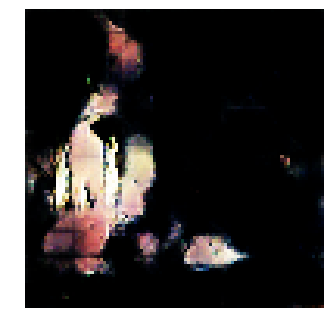


Epoch: 35840, D: -6.133, G: 2.562
Epoch: 35841, D: -5.66, G: 3.262
Epoch: 35842, D: -5.761, G: 4.273
Epoch: 35843, D: -6.102, G: 3.478
Epoch: 35844, D: -7.951, G: 4.616
Epoch: 35845, D: -5.35, G: 4.643
Epoch: 35846, D: -7.219, G: 5.738
Epoch: 35847, D: -6.327, G: 3.914
Epoch: 35848, D: -6.6, G: 4.219
Epoch: 35849, D: -6.604, G: 4.19
Epoch: 35850, D: -5.238, G: 2.74
Epoch: 35851, D: -6.288, G: 3.7
Epoch: 35852, D: -6.559, G: 3.096
Epoch: 35853, D: -6.146, G: 4.045
Epoch: 35854, D: -7.106, G: 3.412
Epoch: 35855, D: -6.037, G: 2.165
Epoch: 35856, D: -7.145, G: 4.381
Epoch: 35857, D: -5.153, G: 4.742
Epoch: 35858, D: -6.842, G: 2.418
Epoch: 35859, D: -6.713, G: 3.496


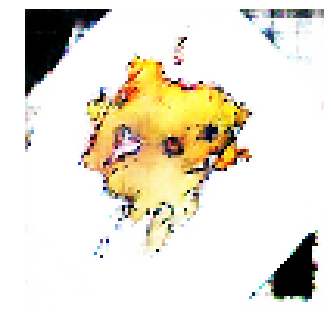


Epoch: 35860, D: -5.062, G: 4.301
Epoch: 35861, D: -6.241, G: 3.201
Epoch: 35862, D: -6.556, G: 4.276
Epoch: 35863, D: -6.335, G: 3.739
Epoch: 35864, D: -6.945, G: 4.635
Epoch: 35865, D: -7.415, G: 3.496
Epoch: 35866, D: -6.723, G: 3.113
Epoch: 35867, D: -6.697, G: 3.252
Epoch: 35868, D: -7.363, G: 2.636
Epoch: 35869, D: -6.466, G: 2.35
Epoch: 35870, D: -5.327, G: 3.415
Epoch: 35871, D: -6.562, G: 1.954
Epoch: 35872, D: -5.66, G: 4.222
Epoch: 35873, D: -4.988, G: 4.684
Epoch: 35874, D: -4.827, G: 4.249
Epoch: 35875, D: -7.228, G: 4.743
Epoch: 35876, D: -4.934, G: 2.874
Epoch: 35877, D: -5.876, G: 5.381
Epoch: 35878, D: -6.504, G: 5.46
Epoch: 35879, D: -6.647, G: 3.806


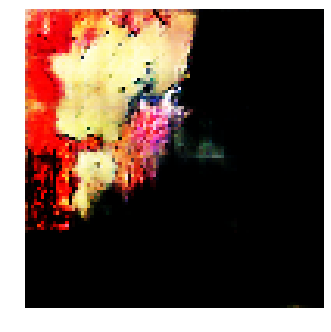


Epoch: 35880, D: -6.856, G: 4.375
Epoch: 35881, D: -6.051, G: 3.766
Epoch: 35882, D: -5.954, G: 4.997
Epoch: 35883, D: -5.439, G: 4.186
Epoch: 35884, D: -5.984, G: 3.566
Epoch: 35885, D: -7.943, G: 3.257
Epoch: 35886, D: -6.168, G: 4.079
Epoch: 35887, D: -6.016, G: 2.521
Epoch: 35888, D: -6.131, G: 4.602
Epoch: 35889, D: -6.107, G: 2.105
Epoch: 35890, D: -5.458, G: 2.671
Epoch: 35891, D: -4.721, G: 2.817
Epoch: 35892, D: -6.521, G: 3.442
Epoch: 35893, D: -7.027, G: 1.984
Epoch: 35894, D: -6.944, G: 2.917
Epoch: 35895, D: -7.517, G: 3.008
Epoch: 35896, D: -4.775, G: 3.993
Epoch: 35897, D: -6.97, G: 3.71
Epoch: 35898, D: -5.51, G: 3.975
Epoch: 35899, D: -6.815, G: 4.623


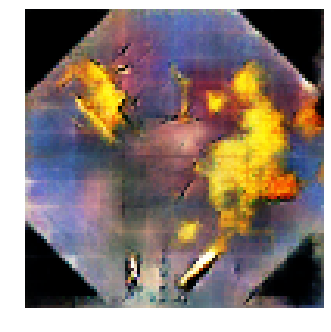


Epoch: 35900, D: -6.429, G: 3.594
Epoch: 35901, D: -5.924, G: 4.569
Epoch: 35902, D: -5.9, G: 2.665
Epoch: 35903, D: -7.032, G: 3.507
Epoch: 35904, D: -5.436, G: 3.243
Epoch: 35905, D: -6.417, G: 3.697
Epoch: 35906, D: -5.258, G: 3.591
Epoch: 35907, D: -6.272, G: 4.004
Epoch: 35908, D: -7.298, G: 3.699
Epoch: 35909, D: -6.559, G: 5.018
Epoch: 35910, D: -6.035, G: 3.556
Epoch: 35911, D: -5.903, G: 2.965
Epoch: 35912, D: -3.698, G: 2.644
Epoch: 35913, D: -5.623, G: 4.329
Epoch: 35914, D: -6.564, G: 3.262
Epoch: 35915, D: -5.967, G: 2.642
Epoch: 35916, D: -6.566, G: 4.015
Epoch: 35917, D: -6.547, G: 3.512
Epoch: 35918, D: -6.276, G: 4.694
Epoch: 35919, D: -6.588, G: 3.915


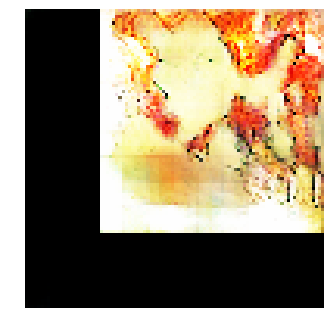


Epoch: 35920, D: -7.487, G: 3.599
Epoch: 35921, D: -6.652, G: 3.869
Epoch: 35922, D: -7.325, G: 3.59
Epoch: 35923, D: -6.858, G: 2.594
Epoch: 35924, D: -6.843, G: 4.33
Epoch: 35925, D: -4.422, G: 4.685
Epoch: 35926, D: -6.048, G: 4.224
Epoch: 35927, D: -5.247, G: 6.079
Epoch: 35928, D: -6.273, G: 3.958
Epoch: 35929, D: -5.971, G: 3.052
Epoch: 35930, D: -6.02, G: 3.883
Epoch: 35931, D: -5.537, G: 3.595
Epoch: 35932, D: -5.599, G: 4.165
Epoch: 35933, D: -5.623, G: 2.579
Epoch: 35934, D: -6.032, G: 2.916
Epoch: 35935, D: -6.761, G: 4.553
Epoch: 35936, D: -6.417, G: 2.019
Epoch: 35937, D: -5.174, G: 2.311
Epoch: 35938, D: -7.766, G: 5.261
Epoch: 35939, D: -7.435, G: 2.74


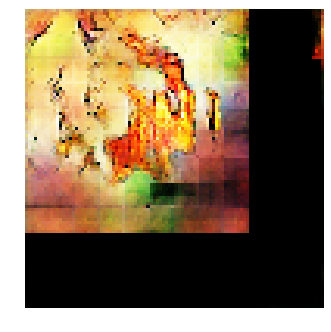


Epoch: 35940, D: -6.384, G: 1.902
Epoch: 35941, D: -5.617, G: 4.257
Epoch: 35942, D: -5.78, G: 4.035
Epoch: 35943, D: -7.113, G: 3.062
Epoch: 35944, D: -6.048, G: 4.83
Epoch: 35945, D: -6.932, G: 3.984
Epoch: 35946, D: -6.796, G: 2.051
Epoch: 35947, D: -6.895, G: 4.461
Epoch: 35948, D: -5.246, G: 3.515
Epoch: 35949, D: -6.669, G: 5.09
Epoch: 35950, D: -6.205, G: 3.657
Epoch: 35951, D: -6.29, G: 6.073
Epoch: 35952, D: -6.344, G: 5.172
Epoch: 35953, D: -6.082, G: 2.644
Epoch: 35954, D: -5.475, G: 4.109
Epoch: 35955, D: -5.509, G: 2.811
Epoch: 35956, D: -7.128, G: 2.593
Epoch: 35957, D: -5.842, G: 1.679
Epoch: 35958, D: -6.48, G: 2.625
Epoch: 35959, D: -6.944, G: 4.831


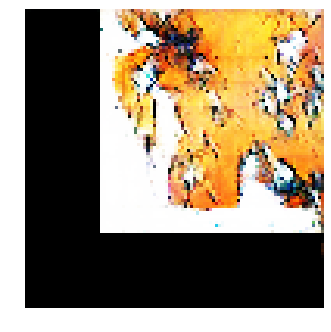


Epoch: 35960, D: -7.132, G: 4.565
Epoch: 35961, D: -6.505, G: 2.222
Epoch: 35962, D: -6.077, G: 3.24
Epoch: 35963, D: -5.41, G: 5.35
Epoch: 35964, D: -7.389, G: 4.637
Epoch: 35965, D: -7.228, G: 2.841
Epoch: 35966, D: -6.437, G: 3.876
Epoch: 35967, D: -6.765, G: 3.228
Epoch: 35968, D: -6.623, G: 2.935
Epoch: 35969, D: -6.553, G: 3.034
Epoch: 35970, D: -6.091, G: 3.282
Epoch: 35971, D: -6.329, G: 4.453
Epoch: 35972, D: -5.364, G: 3.894
Epoch: 35973, D: -5.8, G: 3.857
Epoch: 35974, D: -6.392, G: 4.742
Epoch: 35975, D: -5.294, G: 4.438
Epoch: 35976, D: -6.616, G: 4.689
Epoch: 35977, D: -6.151, G: 3.995
Epoch: 35978, D: -6.107, G: 2.198
Epoch: 35979, D: -6.886, G: 2.064


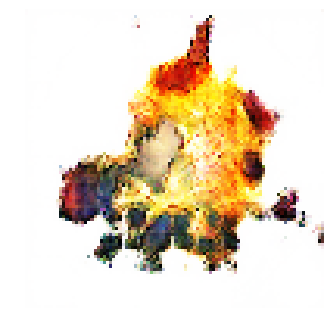


Epoch: 35980, D: -6.25, G: 2.72
Epoch: 35981, D: -5.833, G: 3.082
Epoch: 35982, D: -7.137, G: 3.852
Epoch: 35983, D: -6.389, G: 3.509
Epoch: 35984, D: -6.557, G: 4.562
Epoch: 35985, D: -5.997, G: 4.244
Epoch: 35986, D: -6.247, G: 5.731
Epoch: 35987, D: -5.209, G: 4.069
Epoch: 35988, D: -6.25, G: 1.529
Epoch: 35989, D: -6.003, G: 4.58
Epoch: 35990, D: -7.203, G: 2.616
Epoch: 35991, D: -5.516, G: 3.42
Epoch: 35992, D: -6.902, G: 6.376
Epoch: 35993, D: -6.363, G: 3.992
Epoch: 35994, D: -6.915, G: 2.767
Epoch: 35995, D: -6.646, G: 3.966
Epoch: 35996, D: -6.385, G: 3.292
Epoch: 35997, D: -6.095, G: 4.434
Epoch: 35998, D: -5.903, G: 3.378
Epoch: 35999, D: -5.689, G: 3.83


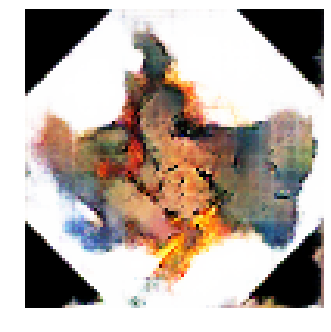


Epoch: 36000, D: -5.433, G: 4.632
Epoch: 36001, D: -6.078, G: 3.079
Epoch: 36002, D: -6.961, G: 2.744
Epoch: 36003, D: -5.874, G: 2.958
Epoch: 36004, D: -6.097, G: 4.893
Epoch: 36005, D: -5.159, G: 6.132
Epoch: 36006, D: -7.01, G: 3.901
Epoch: 36007, D: -5.918, G: 3.454
Epoch: 36008, D: -5.764, G: 5.128
Epoch: 36009, D: -7.012, G: 3.951
Epoch: 36010, D: -7.402, G: 3.05
Epoch: 36011, D: -7.033, G: 3.724
Epoch: 36012, D: -7.358, G: 3.21
Epoch: 36013, D: -6.668, G: 4.331
Epoch: 36014, D: -7.092, G: 5.394
Epoch: 36015, D: -7.017, G: 4.398
Epoch: 36016, D: -6.669, G: 3.363
Epoch: 36017, D: -7.368, G: 3.269
Epoch: 36018, D: -6.562, G: 4.533
Epoch: 36019, D: -5.318, G: 3.93


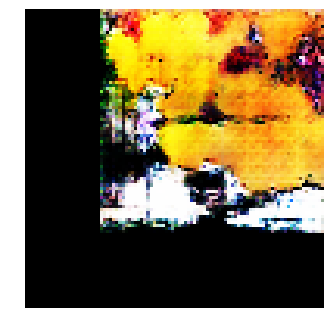


Epoch: 36020, D: -6.076, G: 4.619
Epoch: 36021, D: -5.596, G: 5.238
Epoch: 36022, D: -5.938, G: 4.224
Epoch: 36023, D: -6.733, G: 4.428
Epoch: 36024, D: -6.053, G: 3.929
Epoch: 36025, D: -5.192, G: 5.758
Epoch: 36026, D: -5.792, G: 5.61
Epoch: 36027, D: -5.071, G: 3.35
Epoch: 36028, D: -5.9, G: 2.883
Epoch: 36029, D: -4.81, G: 2.3
Epoch: 36030, D: -5.727, G: 5.989
Epoch: 36031, D: -5.575, G: 2.115
Epoch: 36032, D: -7.706, G: 3.749
Epoch: 36033, D: -5.491, G: 3.532
Epoch: 36034, D: -6.305, G: 2.912
Epoch: 36035, D: -6.076, G: 2.732
Epoch: 36036, D: -6.675, G: 3.845
Epoch: 36037, D: -6.696, G: 3.993
Epoch: 36038, D: -4.709, G: 2.989
Epoch: 36039, D: -6.283, G: 4.718


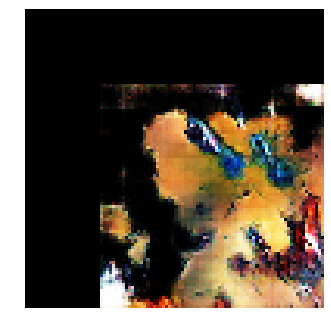


Epoch: 36040, D: -5.584, G: 4.599
Epoch: 36041, D: -7.865, G: 2.972
Epoch: 36042, D: -6.249, G: 3.476
Epoch: 36043, D: -7.213, G: 3.171
Epoch: 36044, D: -6.341, G: 3.439
Epoch: 36045, D: -6.895, G: 3.595
Epoch: 36046, D: -6.173, G: 3.572
Epoch: 36047, D: -6.571, G: 4.306
Epoch: 36048, D: -5.829, G: 4.465
Epoch: 36049, D: -5.258, G: 4.162
Epoch: 36050, D: -6.477, G: 1.276
Epoch: 36051, D: -6.502, G: 4.252
Epoch: 36052, D: -6.554, G: 4.005
Epoch: 36053, D: -5.092, G: 4.179
Epoch: 36054, D: -5.969, G: 4.006
Epoch: 36055, D: -5.664, G: 4.419
Epoch: 36056, D: -5.822, G: 3.948
Epoch: 36057, D: -5.807, G: 3.584
Epoch: 36058, D: -6.389, G: 4.741
Epoch: 36059, D: -5.465, G: 3.16


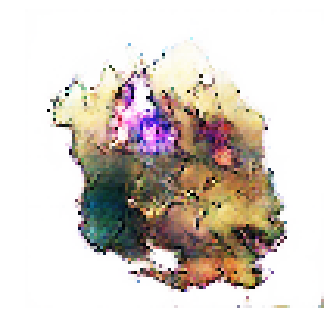


Epoch: 36060, D: -6.246, G: 2.755
Epoch: 36061, D: -7.067, G: 4.802
Epoch: 36062, D: -6.129, G: 1.523
Epoch: 36063, D: -6.953, G: 3.576
Epoch: 36064, D: -5.63, G: 4.501
Epoch: 36065, D: -6.299, G: 3.165
Epoch: 36066, D: -5.231, G: 4.288
Epoch: 36067, D: -6.446, G: 3.808
Epoch: 36068, D: -6.447, G: 4.543
Epoch: 36069, D: -5.768, G: 3.772
Epoch: 36070, D: -6.152, G: 3.551
Epoch: 36071, D: -6.46, G: 3.11
Epoch: 36072, D: -6.281, G: 2.434
Epoch: 36073, D: -6.385, G: 6.418
Epoch: 36074, D: -6.014, G: 4.925
Epoch: 36075, D: -6.168, G: 2.72
Epoch: 36076, D: -6.102, G: 4.989
Epoch: 36077, D: -5.568, G: 4.009
Epoch: 36078, D: -5.242, G: 3.399
Epoch: 36079, D: -5.376, G: 2.457


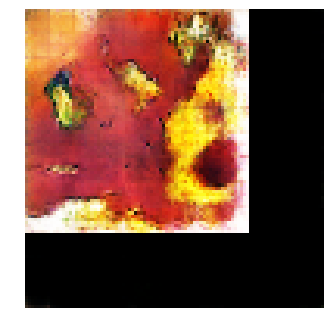


Epoch: 36080, D: -6.744, G: 4.771
Epoch: 36081, D: -7.652, G: 3.175
Epoch: 36082, D: -5.505, G: 4.014
Epoch: 36083, D: -5.669, G: 5.357
Epoch: 36084, D: -7.042, G: 3.543
Epoch: 36085, D: -6.755, G: 3.571
Epoch: 36086, D: -5.73, G: 5.119
Epoch: 36087, D: -6.003, G: 4.115
Epoch: 36088, D: -5.833, G: 5.886
Epoch: 36089, D: -7.529, G: 4.015
Epoch: 36090, D: -6.081, G: 2.045
Epoch: 36091, D: -6.404, G: 2.272
Epoch: 36092, D: -6.477, G: 5.217
Epoch: 36093, D: -7.391, G: 4.761
Epoch: 36094, D: -7.246, G: 2.544
Epoch: 36095, D: -4.845, G: 4.239
Epoch: 36096, D: -7.323, G: 4.126
Epoch: 36097, D: -6.567, G: 2.566
Epoch: 36098, D: -7.356, G: 2.733
Epoch: 36099, D: -5.523, G: 4.364


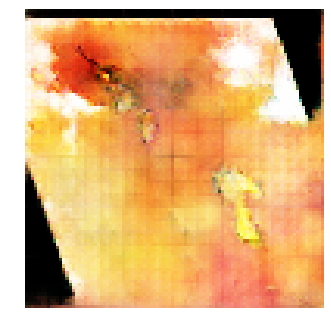


Epoch: 36100, D: -6.099, G: 5.431
Epoch: 36101, D: -7.789, G: 4.126
Epoch: 36102, D: -7.146, G: 5.663
Epoch: 36103, D: -6.404, G: 4.6
Epoch: 36104, D: -5.59, G: 3.014
Epoch: 36105, D: -7.164, G: 4.039
Epoch: 36106, D: -6.099, G: 5.141
Epoch: 36107, D: -7.273, G: 4.553
Epoch: 36108, D: -7.987, G: 3.323
Epoch: 36109, D: -7.299, G: 3.086
Epoch: 36110, D: -5.591, G: 6.35
Epoch: 36111, D: -8.759, G: 2.441
Epoch: 36112, D: -6.862, G: 3.614
Epoch: 36113, D: -6.214, G: 2.657
Epoch: 36114, D: -7.539, G: 4.779
Epoch: 36115, D: -4.935, G: 4.143
Epoch: 36116, D: -4.895, G: 3.087
Epoch: 36117, D: -6.329, G: 3.354
Epoch: 36118, D: -6.222, G: 4.24
Epoch: 36119, D: -6.929, G: 3.848


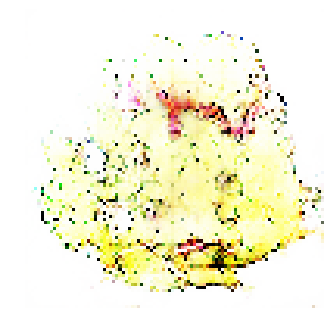


Epoch: 36120, D: -8.07, G: 4.3
Epoch: 36121, D: -5.452, G: 2.078
Epoch: 36122, D: -6.726, G: 3.557
Epoch: 36123, D: -5.648, G: 5.681
Epoch: 36124, D: -5.22, G: 2.399
Epoch: 36125, D: -6.892, G: 2.848
Epoch: 36126, D: -8.055, G: 2.9
Epoch: 36127, D: -4.666, G: 2.957
Epoch: 36128, D: -5.929, G: 4.916
Epoch: 36129, D: -5.073, G: 3.374
Epoch: 36130, D: -5.607, G: 3.356
Epoch: 36131, D: -4.915, G: 2.13
Epoch: 36132, D: -5.294, G: 4.33
Epoch: 36133, D: -7.013, G: 3.428
Epoch: 36134, D: -6.517, G: 1.934
Epoch: 36135, D: -7.45, G: 3.519
Epoch: 36136, D: -7.44, G: 3.156
Epoch: 36137, D: -5.518, G: 5.658
Epoch: 36138, D: -6.063, G: 3.307
Epoch: 36139, D: -5.631, G: 3.537


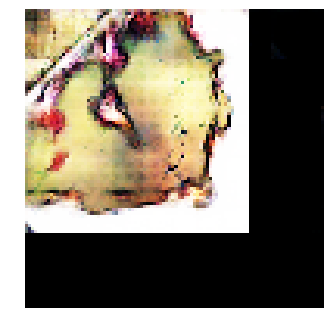


Epoch: 36140, D: -5.481, G: 3.495
Epoch: 36141, D: -6.525, G: 3.808
Epoch: 36142, D: -6.482, G: 4.301
Epoch: 36143, D: -5.839, G: 3.581
Epoch: 36144, D: -4.917, G: 3.904
Epoch: 36145, D: -6.902, G: 1.977
Epoch: 36146, D: -6.057, G: 1.557
Epoch: 36147, D: -5.037, G: 4.024
Epoch: 36148, D: -5.773, G: 3.746
Epoch: 36149, D: -5.44, G: 4.638
Epoch: 36150, D: -5.714, G: 5.286
Epoch: 36151, D: -6.45, G: 3.863
Epoch: 36152, D: -7.536, G: 2.017
Epoch: 36153, D: -5.803, G: 3.439
Epoch: 36154, D: -6.507, G: 3.706
Epoch: 36155, D: -6.029, G: 1.964
Epoch: 36156, D: -5.502, G: 6.156
Epoch: 36157, D: -6.43, G: 5.319
Epoch: 36158, D: -7.002, G: 5.0
Epoch: 36159, D: -7.119, G: 4.422


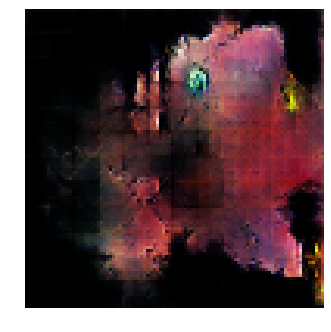


Epoch: 36160, D: -6.134, G: 4.218
Epoch: 36161, D: -6.673, G: 3.232
Epoch: 36162, D: -6.271, G: 4.589
Epoch: 36163, D: -6.167, G: 2.236
Epoch: 36164, D: -5.617, G: 4.453
Epoch: 36165, D: -5.183, G: 3.961
Epoch: 36166, D: -4.882, G: 3.457
Epoch: 36167, D: -6.015, G: 4.318
Epoch: 36168, D: -6.497, G: 3.329
Epoch: 36169, D: -8.227, G: 1.6
Epoch: 36170, D: -4.851, G: 3.049
Epoch: 36171, D: -5.209, G: 3.559
Epoch: 36172, D: -5.195, G: 4.228
Epoch: 36173, D: -4.94, G: 4.617
Epoch: 36174, D: -6.171, G: 3.657
Epoch: 36175, D: -6.427, G: 3.441
Epoch: 36176, D: -5.467, G: 4.356
Epoch: 36177, D: -7.482, G: 3.529
Epoch: 36178, D: -6.042, G: 3.293
Epoch: 36179, D: -5.758, G: 3.926


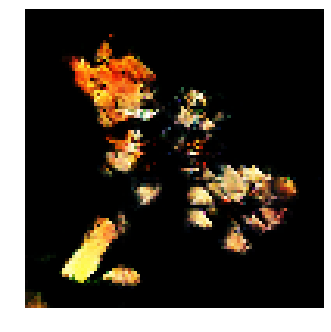


Epoch: 36180, D: -5.136, G: 4.846
Epoch: 36181, D: -4.756, G: 4.065
Epoch: 36182, D: -5.438, G: 3.431
Epoch: 36183, D: -5.422, G: 5.135
Epoch: 36184, D: -6.337, G: 5.624
Epoch: 36185, D: -7.538, G: 3.803
Epoch: 36186, D: -5.741, G: 5.466
Epoch: 36187, D: -7.026, G: 5.063
Epoch: 36188, D: -5.974, G: 5.143
Epoch: 36189, D: -5.523, G: 5.689
Epoch: 36190, D: -5.514, G: 2.751
Epoch: 36191, D: -5.552, G: 3.523
Epoch: 36192, D: -6.204, G: 4.577
Epoch: 36193, D: -5.694, G: 3.788
Epoch: 36194, D: -5.457, G: 4.633
Epoch: 36195, D: -6.074, G: 4.449
Epoch: 36196, D: -6.715, G: 3.321
Epoch: 36197, D: -7.028, G: 2.444
Epoch: 36198, D: -5.043, G: 5.542
Epoch: 36199, D: -5.801, G: 2.854


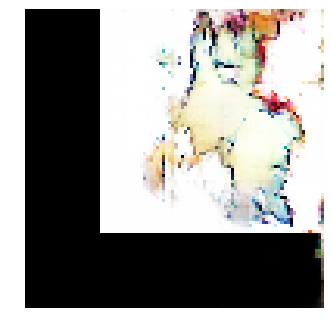


Epoch: 36200, D: -5.91, G: 3.119
Epoch: 36201, D: -6.085, G: 5.086
Epoch: 36202, D: -7.435, G: 3.643
Epoch: 36203, D: -6.3, G: 4.668
Epoch: 36204, D: -6.335, G: 4.305
Epoch: 36205, D: -5.508, G: 6.117
Epoch: 36206, D: -6.002, G: 2.76
Epoch: 36207, D: -7.066, G: 2.376
Epoch: 36208, D: -5.329, G: 3.27
Epoch: 36209, D: -6.072, G: 4.13
Epoch: 36210, D: -6.6, G: 2.506
Epoch: 36211, D: -5.596, G: 3.117
Epoch: 36212, D: -5.085, G: 4.259
Epoch: 36213, D: -6.555, G: 4.423
Epoch: 36214, D: -6.274, G: 3.852
Epoch: 36215, D: -6.237, G: 3.251
Epoch: 36216, D: -6.581, G: 5.423
Epoch: 36217, D: -6.515, G: 4.788
Epoch: 36218, D: -7.35, G: 4.104
Epoch: 36219, D: -4.868, G: 3.022


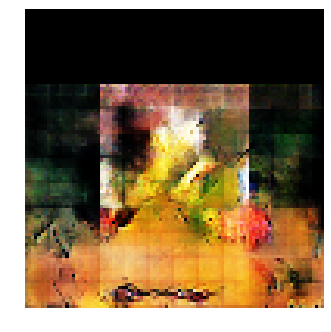


Epoch: 36220, D: -5.928, G: 5.204
Epoch: 36221, D: -7.756, G: 3.768
Epoch: 36222, D: -6.645, G: 3.447
Epoch: 36223, D: -6.666, G: 4.263
Epoch: 36224, D: -5.651, G: 4.046
Epoch: 36225, D: -5.511, G: 4.363
Epoch: 36226, D: -6.404, G: 3.415
Epoch: 36227, D: -7.502, G: 4.578
Epoch: 36228, D: -6.27, G: 2.408
Epoch: 36229, D: -6.217, G: 4.241
Epoch: 36230, D: -5.348, G: 2.974
Epoch: 36231, D: -8.342, G: 3.301
Epoch: 36232, D: -4.606, G: 3.27
Epoch: 36233, D: -5.713, G: 4.799
Epoch: 36234, D: -6.562, G: 3.542
Epoch: 36235, D: -5.696, G: 5.513
Epoch: 36236, D: -6.055, G: 4.479
Epoch: 36237, D: -6.49, G: 4.669
Epoch: 36238, D: -6.901, G: 2.924
Epoch: 36239, D: -6.679, G: 3.682


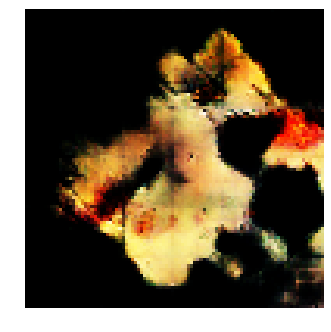


Epoch: 36240, D: -6.538, G: 3.883
Epoch: 36241, D: -5.542, G: 3.256
Epoch: 36242, D: -6.179, G: 3.959
Epoch: 36243, D: -5.404, G: 4.997
Epoch: 36244, D: -5.885, G: 3.78
Epoch: 36245, D: -7.627, G: 3.912
Epoch: 36246, D: -5.12, G: 3.012
Epoch: 36247, D: -7.404, G: 5.677
Epoch: 36248, D: -5.702, G: 3.209
Epoch: 36249, D: -5.863, G: 3.63
Epoch: 36250, D: -8.177, G: 3.961
Epoch: 36251, D: -6.733, G: 4.963
Epoch: 36252, D: -6.787, G: 3.862
Epoch: 36253, D: -6.847, G: 2.831
Epoch: 36254, D: -6.754, G: 3.126
Epoch: 36255, D: -5.616, G: 1.989
Epoch: 36256, D: -5.598, G: 4.148
Epoch: 36257, D: -5.385, G: 4.281
Epoch: 36258, D: -7.378, G: 4.02
Epoch: 36259, D: -6.91, G: 4.386


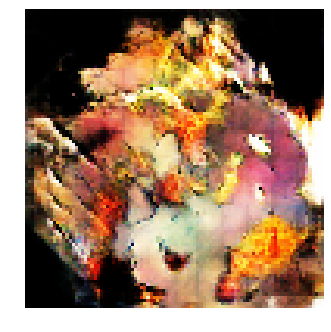


Epoch: 36260, D: -5.878, G: 3.94
Epoch: 36261, D: -6.348, G: 4.353
Epoch: 36262, D: -6.735, G: 2.317
Epoch: 36263, D: -8.161, G: 4.392
Epoch: 36264, D: -7.082, G: 2.932
Epoch: 36265, D: -5.54, G: 4.254
Epoch: 36266, D: -5.809, G: 4.782
Epoch: 36267, D: -6.792, G: 3.471
Epoch: 36268, D: -6.466, G: 1.999
Epoch: 36269, D: -6.061, G: 3.694
Epoch: 36270, D: -7.167, G: 3.759
Epoch: 36271, D: -7.766, G: 2.451
Epoch: 36272, D: -6.938, G: 3.677
Epoch: 36273, D: -6.702, G: 3.746
Epoch: 36274, D: -5.468, G: 3.952
Epoch: 36275, D: -6.256, G: 3.958
Epoch: 36276, D: -8.162, G: 4.338
Epoch: 36277, D: -5.664, G: 3.168
Epoch: 36278, D: -5.276, G: 1.782
Epoch: 36279, D: -5.136, G: 1.659


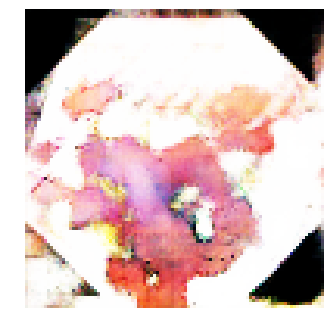


Epoch: 36280, D: -5.621, G: 4.641
Epoch: 36281, D: -5.194, G: 6.007
Epoch: 36282, D: -6.362, G: 3.96
Epoch: 36283, D: -6.773, G: 4.22
Epoch: 36284, D: -4.818, G: 3.542
Epoch: 36285, D: -5.451, G: 4.264
Epoch: 36286, D: -6.585, G: 3.916
Epoch: 36287, D: -3.196, G: 4.402
Epoch: 36288, D: -5.84, G: 3.863
Epoch: 36289, D: -6.514, G: 4.182
Epoch: 36290, D: -5.332, G: 4.435
Epoch: 36291, D: -7.155, G: 2.516
Epoch: 36292, D: -6.825, G: 2.397
Epoch: 36293, D: -4.778, G: 1.188
Epoch: 36294, D: -7.363, G: 3.943
Epoch: 36295, D: -6.951, G: 1.743
Epoch: 36296, D: -6.086, G: 1.209
Epoch: 36297, D: -5.364, G: 2.739
Epoch: 36298, D: -6.048, G: 2.912
Epoch: 36299, D: -5.032, G: 5.904


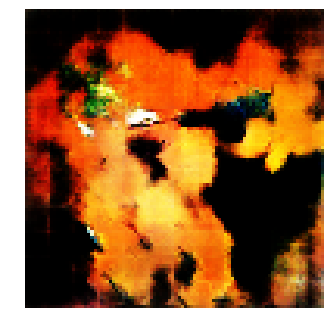


Epoch: 36300, D: -5.195, G: 1.356
Epoch: 36301, D: -6.167, G: 3.137
Epoch: 36302, D: -5.612, G: 2.114
Epoch: 36303, D: -7.11, G: 4.702
Epoch: 36304, D: -5.972, G: 2.167
Epoch: 36305, D: -6.03, G: 5.382
Epoch: 36306, D: -7.377, G: 2.463
Epoch: 36307, D: -5.331, G: 3.995
Epoch: 36308, D: -4.918, G: 6.906
Epoch: 36309, D: -6.387, G: 3.552
Epoch: 36310, D: -7.897, G: 2.927
Epoch: 36311, D: -6.16, G: 3.848
Epoch: 36312, D: -5.653, G: 2.217
Epoch: 36313, D: -5.921, G: 4.322
Epoch: 36314, D: -6.838, G: 4.693
Epoch: 36315, D: -6.219, G: 2.688
Epoch: 36316, D: -6.541, G: 4.806
Epoch: 36317, D: -6.579, G: 2.935
Epoch: 36318, D: -5.292, G: 2.974
Epoch: 36319, D: -7.601, G: 3.151


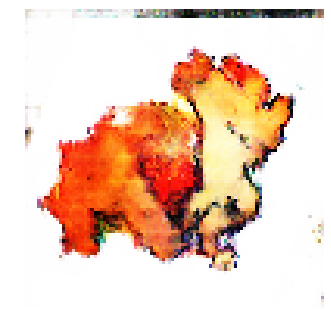


Epoch: 36320, D: -5.783, G: 3.61
Epoch: 36321, D: -5.549, G: 4.449
Epoch: 36322, D: -5.861, G: 5.231
Epoch: 36323, D: -6.087, G: 3.813
Epoch: 36324, D: -6.863, G: 4.001
Epoch: 36325, D: -4.989, G: 2.824
Epoch: 36326, D: -6.89, G: 3.219
Epoch: 36327, D: -5.699, G: 3.275
Epoch: 36328, D: -5.502, G: 3.138
Epoch: 36329, D: -6.925, G: 2.603
Epoch: 36330, D: -5.997, G: 2.588
Epoch: 36331, D: -6.541, G: 4.34
Epoch: 36332, D: -6.34, G: 4.878
Epoch: 36333, D: -5.658, G: 3.156
Epoch: 36334, D: -5.569, G: 2.724
Epoch: 36335, D: -4.428, G: 3.059
Epoch: 36336, D: -6.756, G: 3.257
Epoch: 36337, D: -5.517, G: 2.17
Epoch: 36338, D: -7.367, G: 3.161
Epoch: 36339, D: -5.565, G: 3.608


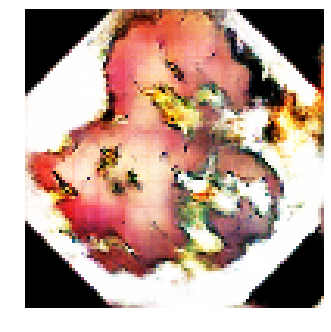


Epoch: 36340, D: -6.37, G: 3.419
Epoch: 36341, D: -6.119, G: 4.063
Epoch: 36342, D: -5.995, G: 6.067
Epoch: 36343, D: -6.242, G: 5.41
Epoch: 36344, D: -7.036, G: 4.793
Epoch: 36345, D: -6.806, G: 4.98
Epoch: 36346, D: -6.603, G: 2.043
Epoch: 36347, D: -6.397, G: 2.954
Epoch: 36348, D: -5.396, G: 3.049
Epoch: 36349, D: -5.512, G: 2.538
Epoch: 36350, D: -5.13, G: 1.586
Epoch: 36351, D: -6.104, G: 3.095
Epoch: 36352, D: -6.725, G: 4.076
Epoch: 36353, D: -7.187, G: 2.842
Epoch: 36354, D: -5.644, G: 3.945
Epoch: 36355, D: -6.554, G: 4.976
Epoch: 36356, D: -6.653, G: 4.262
Epoch: 36357, D: -5.661, G: 2.644
Epoch: 36358, D: -6.062, G: 2.542
Epoch: 36359, D: -4.981, G: 3.311


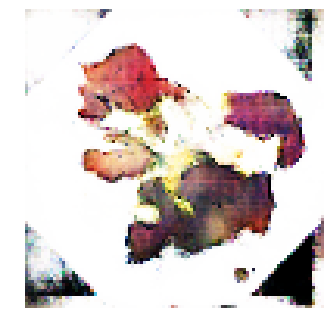


Epoch: 36360, D: -6.225, G: 3.591
Epoch: 36361, D: -6.178, G: 3.59
Epoch: 36362, D: -5.271, G: 3.879
Epoch: 36363, D: -5.927, G: 4.68
Epoch: 36364, D: -6.127, G: 5.48
Epoch: 36365, D: -5.604, G: 2.985
Epoch: 36366, D: -6.211, G: 4.698
Epoch: 36367, D: -6.662, G: 3.469
Epoch: 36368, D: -6.869, G: 2.427
Epoch: 36369, D: -6.409, G: 3.319
Epoch: 36370, D: -4.928, G: 1.722
Epoch: 36371, D: -5.792, G: 3.601
Epoch: 36372, D: -6.842, G: 5.659
Epoch: 36373, D: -5.02, G: 3.929
Epoch: 36374, D: -6.871, G: 3.147
Epoch: 36375, D: -6.648, G: 2.628
Epoch: 36376, D: -5.996, G: 3.75
Epoch: 36377, D: -5.511, G: 4.105
Epoch: 36378, D: -6.044, G: 3.751
Epoch: 36379, D: -6.0, G: 3.276


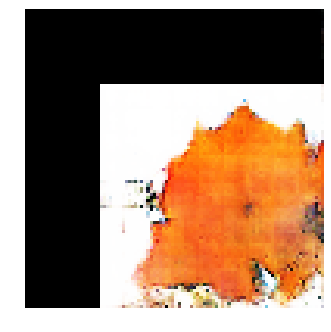


Epoch: 36380, D: -5.912, G: 5.463
Epoch: 36381, D: -6.224, G: 3.181
Epoch: 36382, D: -6.491, G: 2.866
Epoch: 36383, D: -5.413, G: 3.788
Epoch: 36384, D: -5.34, G: 3.059
Epoch: 36385, D: -5.772, G: 5.929
Epoch: 36386, D: -6.916, G: 3.549
Epoch: 36387, D: -4.896, G: 5.896
Epoch: 36388, D: -6.194, G: 1.239
Epoch: 36389, D: -6.426, G: 4.087
Epoch: 36390, D: -6.106, G: 4.604
Epoch: 36391, D: -7.434, G: 4.765
Epoch: 36392, D: -6.078, G: 4.448
Epoch: 36393, D: -7.07, G: 4.808
Epoch: 36394, D: -6.635, G: 3.248
Epoch: 36395, D: -6.389, G: 2.292
Epoch: 36396, D: -4.614, G: 4.029
Epoch: 36397, D: -8.411, G: 3.154
Epoch: 36398, D: -7.817, G: 2.784
Epoch: 36399, D: -6.566, G: 2.373


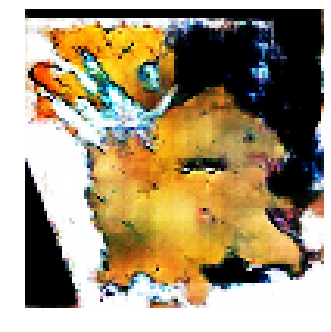


Epoch: 36400, D: -5.857, G: 5.079
Epoch: 36401, D: -5.774, G: 4.197
Epoch: 36402, D: -5.297, G: 5.89
Epoch: 36403, D: -6.389, G: 4.07
Epoch: 36404, D: -7.037, G: 3.18
Epoch: 36405, D: -6.591, G: 1.639
Epoch: 36406, D: -5.933, G: 2.023
Epoch: 36407, D: -7.388, G: 4.59
Epoch: 36408, D: -7.628, G: 2.037
Epoch: 36409, D: -6.845, G: 2.399
Epoch: 36410, D: -6.812, G: 5.634
Epoch: 36411, D: -5.854, G: 2.449
Epoch: 36412, D: -5.282, G: 3.426
Epoch: 36413, D: -5.631, G: 4.504
Epoch: 36414, D: -6.26, G: 4.551
Epoch: 36415, D: -6.93, G: 2.708
Epoch: 36416, D: -7.03, G: 1.109
Epoch: 36417, D: -4.991, G: 2.639
Epoch: 36418, D: -5.71, G: 3.471
Epoch: 36419, D: -6.051, G: 4.032


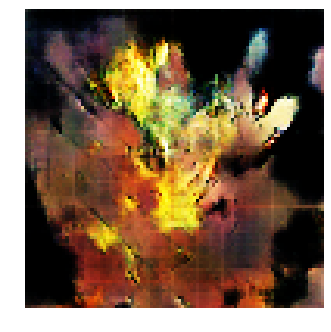


Epoch: 36420, D: -6.872, G: 3.379
Epoch: 36421, D: -6.151, G: 2.198
Epoch: 36422, D: -5.925, G: 3.484
Epoch: 36423, D: -5.792, G: 4.133
Epoch: 36424, D: -4.694, G: 4.845
Epoch: 36425, D: -7.001, G: 3.746
Epoch: 36426, D: -4.626, G: 4.165
Epoch: 36427, D: -7.847, G: 3.433
Epoch: 36428, D: -6.842, G: 3.772
Epoch: 36429, D: -6.782, G: 3.621
Epoch: 36430, D: -6.03, G: 2.992
Epoch: 36431, D: -6.652, G: 3.497
Epoch: 36432, D: -5.865, G: 3.126
Epoch: 36433, D: -6.683, G: 3.815
Epoch: 36434, D: -6.315, G: 3.922
Epoch: 36435, D: -6.941, G: 2.982
Epoch: 36436, D: -5.693, G: 3.306
Epoch: 36437, D: -7.007, G: 3.468
Epoch: 36438, D: -5.042, G: 2.744
Epoch: 36439, D: -6.381, G: 3.578


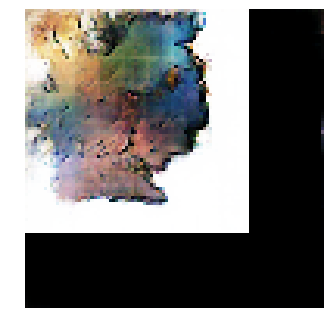


Epoch: 36440, D: -7.81, G: 4.256
Epoch: 36441, D: -6.788, G: 3.359
Epoch: 36442, D: -6.876, G: 1.359
Epoch: 36443, D: -6.457, G: 2.984
Epoch: 36444, D: -5.8, G: 3.324
Epoch: 36445, D: -6.127, G: 2.878
Epoch: 36446, D: -5.546, G: 2.553
Epoch: 36447, D: -4.643, G: 5.398
Epoch: 36448, D: -6.937, G: 4.955
Epoch: 36449, D: -6.972, G: 3.142
Epoch: 36450, D: -7.21, G: 4.786
Epoch: 36451, D: -5.188, G: 3.006
Epoch: 36452, D: -6.187, G: 4.349
Epoch: 36453, D: -5.894, G: 3.806
Epoch: 36454, D: -6.315, G: 4.041
Epoch: 36455, D: -7.893, G: 4.894
Epoch: 36456, D: -5.564, G: 2.421
Epoch: 36457, D: -6.12, G: 3.016
Epoch: 36458, D: -5.499, G: 2.402
Epoch: 36459, D: -5.456, G: 2.523


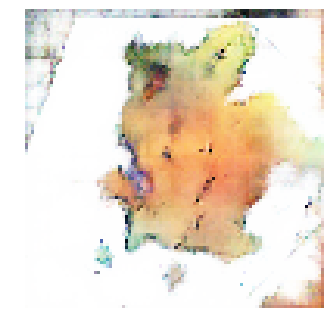


Epoch: 36460, D: -6.008, G: 4.535
Epoch: 36461, D: -5.843, G: 3.775
Epoch: 36462, D: -5.719, G: 2.736
Epoch: 36463, D: -6.227, G: 1.761
Epoch: 36464, D: -6.559, G: 3.056
Epoch: 36465, D: -6.764, G: 4.681
Epoch: 36466, D: -6.542, G: 2.201
Epoch: 36467, D: -6.966, G: 3.051
Epoch: 36468, D: -4.877, G: 3.79
Epoch: 36469, D: -4.863, G: 2.091
Epoch: 36470, D: -5.907, G: 4.307
Epoch: 36471, D: -5.905, G: 3.294
Epoch: 36472, D: -6.309, G: 4.339
Epoch: 36473, D: -5.921, G: 4.577
Epoch: 36474, D: -7.188, G: 5.802
Epoch: 36475, D: -5.839, G: 3.829
Epoch: 36476, D: -4.979, G: 5.687
Epoch: 36477, D: -7.035, G: 6.631
Epoch: 36478, D: -5.364, G: 6.666
Epoch: 36479, D: -6.489, G: 4.119


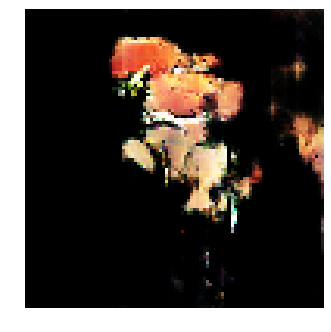


Epoch: 36480, D: -5.162, G: 2.951
Epoch: 36481, D: -5.827, G: 1.36
Epoch: 36482, D: -5.329, G: 4.454
Epoch: 36483, D: -6.239, G: 5.652
Epoch: 36484, D: -6.092, G: 3.343
Epoch: 36485, D: -7.516, G: 3.192
Epoch: 36486, D: -5.924, G: 2.575
Epoch: 36487, D: -4.116, G: 6.2
Epoch: 36488, D: -5.378, G: 4.288
Epoch: 36489, D: -5.503, G: 3.166
Epoch: 36490, D: -5.565, G: 2.862
Epoch: 36491, D: -6.006, G: 3.2
Epoch: 36492, D: -5.177, G: 3.422
Epoch: 36493, D: -6.63, G: 4.309
Epoch: 36494, D: -6.795, G: 2.084
Epoch: 36495, D: -6.765, G: 4.898
Epoch: 36496, D: -5.69, G: 3.561
Epoch: 36497, D: -6.814, G: 4.056
Epoch: 36498, D: -4.819, G: 4.7
Epoch: 36499, D: -7.584, G: 2.521


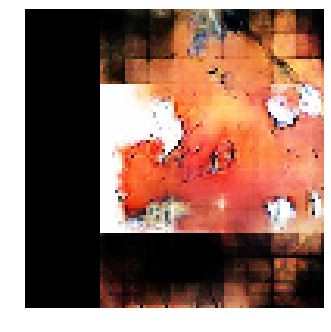


Epoch: 36500, D: -6.01, G: 3.561
Epoch: 36501, D: -6.788, G: 4.701
Epoch: 36502, D: -5.375, G: 3.528
Epoch: 36503, D: -5.676, G: 2.791
Epoch: 36504, D: -6.401, G: 2.694
Epoch: 36505, D: -6.17, G: 4.722
Epoch: 36506, D: -6.223, G: 4.078
Epoch: 36507, D: -5.785, G: 3.834
Epoch: 36508, D: -5.417, G: 2.868
Epoch: 36509, D: -6.885, G: 2.935
Epoch: 36510, D: -6.908, G: 2.189
Epoch: 36511, D: -4.993, G: 4.057
Epoch: 36512, D: -7.235, G: 3.759
Epoch: 36513, D: -5.694, G: 4.612
Epoch: 36514, D: -6.404, G: 3.083
Epoch: 36515, D: -5.232, G: 5.195
Epoch: 36516, D: -6.122, G: 5.179
Epoch: 36517, D: -5.433, G: 3.493
Epoch: 36518, D: -6.515, G: 2.871
Epoch: 36519, D: -6.935, G: 4.536


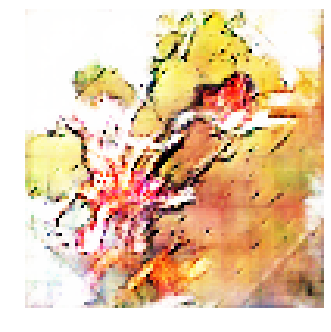


Epoch: 36520, D: -5.995, G: 5.301
Epoch: 36521, D: -6.116, G: 4.29
Epoch: 36522, D: -6.3, G: 4.646
Epoch: 36523, D: -6.811, G: 2.839
Epoch: 36524, D: -4.244, G: 4.196
Epoch: 36525, D: -6.529, G: 5.017
Epoch: 36526, D: -4.121, G: 3.209
Epoch: 36527, D: -6.268, G: 4.909
Epoch: 36528, D: -5.801, G: 2.784
Epoch: 36529, D: -5.094, G: 2.156
Epoch: 36530, D: -6.153, G: 3.821
Epoch: 36531, D: -6.102, G: 2.443
Epoch: 36532, D: -7.008, G: 2.32
Epoch: 36533, D: -6.705, G: 2.671
Epoch: 36534, D: -5.592, G: 2.67
Epoch: 36535, D: -5.97, G: 3.873
Epoch: 36536, D: -6.65, G: 4.762
Epoch: 36537, D: -5.856, G: 1.642
Epoch: 36538, D: -5.486, G: 2.436
Epoch: 36539, D: -7.137, G: 2.955


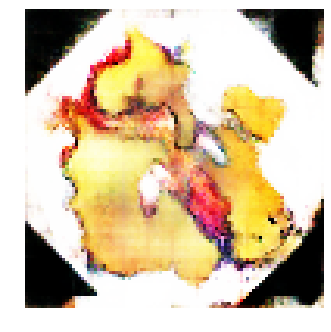


Epoch: 36540, D: -6.838, G: 3.982
Epoch: 36541, D: -7.076, G: 4.203
Epoch: 36542, D: -7.177, G: 0.7447
Epoch: 36543, D: -6.146, G: 4.211
Epoch: 36544, D: -6.535, G: 3.255
Epoch: 36545, D: -5.744, G: 2.812
Epoch: 36546, D: -6.886, G: 5.351
Epoch: 36547, D: -6.559, G: 3.855
Epoch: 36548, D: -7.705, G: 3.576
Epoch: 36549, D: -6.32, G: 3.736
Epoch: 36550, D: -5.134, G: 5.417
Epoch: 36551, D: -6.759, G: 3.701
Epoch: 36552, D: -7.052, G: 1.964
Epoch: 36553, D: -6.438, G: 2.806
Epoch: 36554, D: -5.494, G: 4.1
Epoch: 36555, D: -5.615, G: 5.644
Epoch: 36556, D: -6.108, G: 6.293
Epoch: 36557, D: -5.532, G: 3.234
Epoch: 36558, D: -6.73, G: 2.54
Epoch: 36559, D: -6.022, G: 3.265


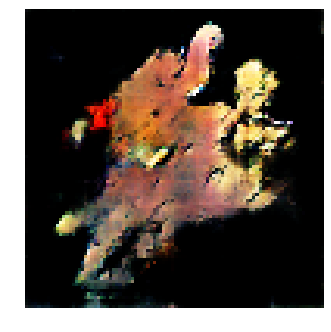


Epoch: 36560, D: -5.475, G: 2.931
Epoch: 36561, D: -5.695, G: 3.588
Epoch: 36562, D: -6.633, G: 3.047
Epoch: 36563, D: -6.62, G: 3.232
Epoch: 36564, D: -5.648, G: 2.801
Epoch: 36565, D: -7.014, G: 3.739
Epoch: 36566, D: -6.163, G: 3.038
Epoch: 36567, D: -6.642, G: 2.081
Epoch: 36568, D: -7.667, G: 4.225
Epoch: 36569, D: -5.928, G: 2.817
Epoch: 36570, D: -5.501, G: 4.243
Epoch: 36571, D: -5.475, G: 3.631
Epoch: 36572, D: -5.695, G: 3.538
Epoch: 36573, D: -6.794, G: 3.314
Epoch: 36574, D: -6.084, G: 4.577
Epoch: 36575, D: -6.043, G: 3.297
Epoch: 36576, D: -6.547, G: 4.39
Epoch: 36577, D: -6.053, G: 4.056
Epoch: 36578, D: -5.665, G: 2.729
Epoch: 36579, D: -7.383, G: 3.376


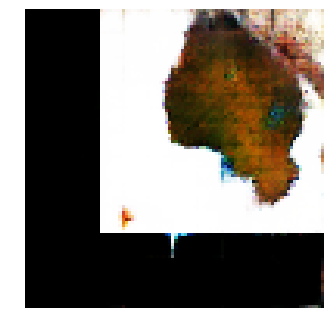


Epoch: 36580, D: -5.584, G: 3.868
Epoch: 36581, D: -5.255, G: 3.475
Epoch: 36582, D: -5.818, G: 4.096
Epoch: 36583, D: -6.519, G: 3.399
Epoch: 36584, D: -6.599, G: 3.916
Epoch: 36585, D: -6.881, G: 3.165
Epoch: 36586, D: -6.834, G: 3.288
Epoch: 36587, D: -5.761, G: 4.152
Epoch: 36588, D: -5.449, G: 5.18
Epoch: 36589, D: -7.064, G: 4.57
Epoch: 36590, D: -6.38, G: 5.325
Epoch: 36591, D: -4.886, G: 4.272
Epoch: 36592, D: -8.672, G: 5.592
Epoch: 36593, D: -6.942, G: 4.378
Epoch: 36594, D: -5.833, G: 2.755
Epoch: 36595, D: -7.184, G: 3.432
Epoch: 36596, D: -6.236, G: 5.174
Epoch: 36597, D: -7.168, G: 3.759
Epoch: 36598, D: -6.573, G: 5.377
Epoch: 36599, D: -6.053, G: 3.043


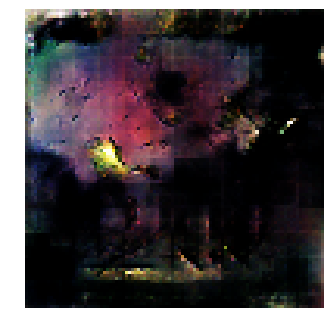


Epoch: 36600, D: -4.541, G: 3.491
Epoch: 36601, D: -6.943, G: 3.98
Epoch: 36602, D: -7.052, G: 3.218
Epoch: 36603, D: -4.924, G: 2.846
Epoch: 36604, D: -6.843, G: 4.146
Epoch: 36605, D: -5.895, G: 3.082
Epoch: 36606, D: -4.599, G: 2.754
Epoch: 36607, D: -7.32, G: 3.196
Epoch: 36608, D: -6.225, G: 4.199
Epoch: 36609, D: -6.186, G: 2.176
Epoch: 36610, D: -5.32, G: 3.527
Epoch: 36611, D: -5.228, G: 4.286
Epoch: 36612, D: -6.237, G: 3.951
Epoch: 36613, D: -6.615, G: 2.333
Epoch: 36614, D: -5.812, G: 3.765
Epoch: 36615, D: -8.015, G: 3.916
Epoch: 36616, D: -5.336, G: 3.254
Epoch: 36617, D: -6.249, G: 4.53
Epoch: 36618, D: -7.256, G: 4.209
Epoch: 36619, D: -8.822, G: 3.632


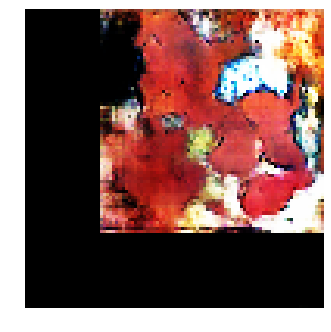


Epoch: 36620, D: -7.483, G: 2.418
Epoch: 36621, D: -6.616, G: 2.636
Epoch: 36622, D: -7.121, G: 3.748
Epoch: 36623, D: -6.401, G: 3.428
Epoch: 36624, D: -6.573, G: 3.303
Epoch: 36625, D: -6.917, G: 3.341
Epoch: 36626, D: -5.804, G: 4.413
Epoch: 36627, D: -5.349, G: 5.366
Epoch: 36628, D: -6.787, G: 6.177
Epoch: 36629, D: -5.968, G: 2.994
Epoch: 36630, D: -6.517, G: 3.385
Epoch: 36631, D: -6.358, G: 3.508
Epoch: 36632, D: -5.757, G: 3.953
Epoch: 36633, D: -7.013, G: 4.837
Epoch: 36634, D: -4.95, G: 5.126
Epoch: 36635, D: -5.907, G: 3.957
Epoch: 36636, D: -4.9, G: 3.48
Epoch: 36637, D: -7.331, G: 1.714
Epoch: 36638, D: -6.038, G: 3.978
Epoch: 36639, D: -6.87, G: 4.266


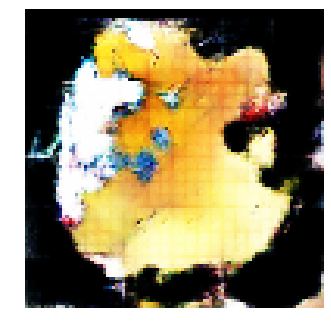


Epoch: 36640, D: -6.72, G: 3.073
Epoch: 36641, D: -6.104, G: 2.174
Epoch: 36642, D: -5.017, G: 4.301
Epoch: 36643, D: -5.302, G: 5.161
Epoch: 36644, D: -5.143, G: 4.527
Epoch: 36645, D: -5.267, G: 3.176
Epoch: 36646, D: -5.061, G: 3.493
Epoch: 36647, D: -6.403, G: 4.088
Epoch: 36648, D: -5.651, G: 3.555
Epoch: 36649, D: -7.244, G: 3.536
Epoch: 36650, D: -6.363, G: 3.101
Epoch: 36651, D: -6.99, G: 3.919
Epoch: 36652, D: -5.762, G: 0.9427
Epoch: 36653, D: -6.098, G: 4.122
Epoch: 36654, D: -7.021, G: 4.26
Epoch: 36655, D: -6.771, G: 2.658
Epoch: 36656, D: -6.657, G: 5.029
Epoch: 36657, D: -5.312, G: 4.24
Epoch: 36658, D: -6.466, G: 5.57
Epoch: 36659, D: -5.476, G: 1.921


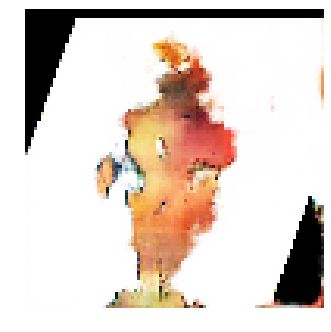


Epoch: 36660, D: -6.294, G: 4.772
Epoch: 36661, D: -6.316, G: 4.208
Epoch: 36662, D: -5.444, G: 2.748
Epoch: 36663, D: -5.871, G: 3.927
Epoch: 36664, D: -6.091, G: 3.559
Epoch: 36665, D: -7.271, G: 3.604
Epoch: 36666, D: -7.818, G: 2.977
Epoch: 36667, D: -6.903, G: 3.767
Epoch: 36668, D: -5.935, G: 2.97
Epoch: 36669, D: -5.03, G: 2.898
Epoch: 36670, D: -6.229, G: 1.288
Epoch: 36671, D: -6.321, G: 3.201
Epoch: 36672, D: -7.076, G: 2.417
Epoch: 36673, D: -5.63, G: 2.226
Epoch: 36674, D: -6.095, G: 4.132
Epoch: 36675, D: -6.25, G: 3.015
Epoch: 36676, D: -5.755, G: 3.015
Epoch: 36677, D: -6.364, G: 2.205
Epoch: 36678, D: -6.337, G: 3.059
Epoch: 36679, D: -4.782, G: 4.281


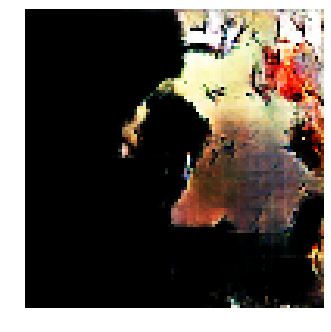


Epoch: 36680, D: -5.764, G: 5.418
Epoch: 36681, D: -5.971, G: 3.806
Epoch: 36682, D: -6.678, G: 3.891
Epoch: 36683, D: -7.445, G: 3.116
Epoch: 36684, D: -6.669, G: 4.969
Epoch: 36685, D: -6.074, G: 4.2
Epoch: 36686, D: -6.79, G: 5.661
Epoch: 36687, D: -7.727, G: 5.294
Epoch: 36688, D: -5.776, G: 4.112
Epoch: 36689, D: -5.92, G: 4.704
Epoch: 36690, D: -4.817, G: 6.485
Epoch: 36691, D: -6.7, G: 4.429
Epoch: 36692, D: -4.87, G: 3.45
Epoch: 36693, D: -6.408, G: 4.916
Epoch: 36694, D: -7.556, G: 3.636
Epoch: 36695, D: -6.472, G: 3.757
Epoch: 36696, D: -4.989, G: 1.01
Epoch: 36697, D: -7.845, G: 4.794
Epoch: 36698, D: -7.373, G: 3.345
Epoch: 36699, D: -7.646, G: 3.129


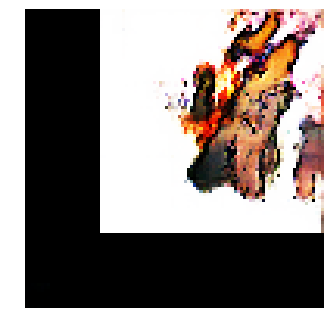


Epoch: 36700, D: -7.071, G: 4.882
Epoch: 36701, D: -6.799, G: 4.55
Epoch: 36702, D: -5.934, G: 3.735
Epoch: 36703, D: -6.985, G: 4.839
Epoch: 36704, D: -7.421, G: 1.909
Epoch: 36705, D: -7.079, G: 5.306
Epoch: 36706, D: -6.193, G: 3.128
Epoch: 36707, D: -5.421, G: 3.749
Epoch: 36708, D: -6.555, G: 2.193
Epoch: 36709, D: -7.51, G: 4.435
Epoch: 36710, D: -6.804, G: 3.239
Epoch: 36711, D: -5.601, G: 5.182
Epoch: 36712, D: -4.806, G: 4.386
Epoch: 36713, D: -6.186, G: 4.731
Epoch: 36714, D: -6.123, G: 2.232
Epoch: 36715, D: -6.967, G: 4.047
Epoch: 36716, D: -5.146, G: 4.081
Epoch: 36717, D: -6.347, G: 3.822
Epoch: 36718, D: -7.174, G: 4.79
Epoch: 36719, D: -4.614, G: 3.137


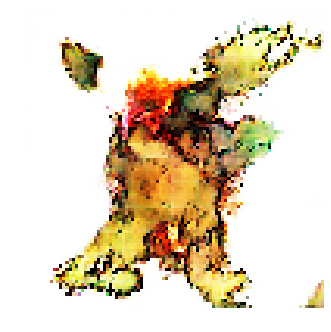


Epoch: 36720, D: -5.918, G: 3.819
Epoch: 36721, D: -6.626, G: 3.118
Epoch: 36722, D: -6.959, G: 4.762
Epoch: 36723, D: -6.513, G: 1.419
Epoch: 36724, D: -5.168, G: 4.876
Epoch: 36725, D: -6.743, G: 3.688
Epoch: 36726, D: -6.068, G: 3.101
Epoch: 36727, D: -6.146, G: 3.556
Epoch: 36728, D: -7.113, G: 3.015
Epoch: 36729, D: -5.733, G: 3.489
Epoch: 36730, D: -5.406, G: 3.107
Epoch: 36731, D: -5.254, G: 3.387
Epoch: 36732, D: -6.232, G: 3.186
Epoch: 36733, D: -6.537, G: 2.76
Epoch: 36734, D: -6.365, G: 3.901
Epoch: 36735, D: -5.15, G: 3.723
Epoch: 36736, D: -4.664, G: 3.966
Epoch: 36737, D: -6.877, G: 4.393
Epoch: 36738, D: -6.187, G: 3.123
Epoch: 36739, D: -6.225, G: 1.851


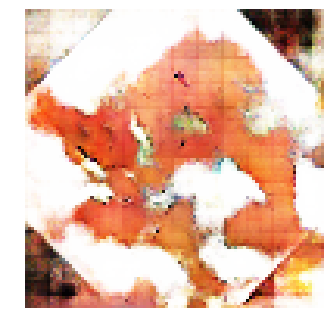


Epoch: 36740, D: -5.849, G: 3.019
Epoch: 36741, D: -5.036, G: 2.404
Epoch: 36742, D: -5.713, G: 2.511
Epoch: 36743, D: -6.029, G: 2.936
Epoch: 36744, D: -4.913, G: 4.019
Epoch: 36745, D: -7.342, G: 5.949
Epoch: 36746, D: -5.574, G: 3.091
Epoch: 36747, D: -6.55, G: 3.164
Epoch: 36748, D: -5.545, G: 4.072
Epoch: 36749, D: -4.461, G: 2.365
Epoch: 36750, D: -7.675, G: 3.778
Epoch: 36751, D: -5.553, G: 2.801
Epoch: 36752, D: -6.533, G: 2.302
Epoch: 36753, D: -7.604, G: 4.399
Epoch: 36754, D: -6.103, G: 3.755
Epoch: 36755, D: -5.384, G: 5.207
Epoch: 36756, D: -6.422, G: 4.399
Epoch: 36757, D: -5.351, G: 2.708
Epoch: 36758, D: -6.473, G: 3.983
Epoch: 36759, D: -6.558, G: 2.649


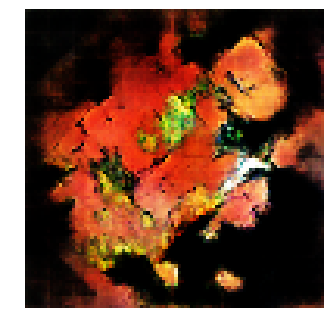


Epoch: 36760, D: -5.228, G: 3.55
Epoch: 36761, D: -6.207, G: 2.537
Epoch: 36762, D: -6.648, G: 3.335
Epoch: 36763, D: -4.79, G: 2.655
Epoch: 36764, D: -5.93, G: 4.504
Epoch: 36765, D: -7.126, G: 2.911
Epoch: 36766, D: -5.974, G: 5.541
Epoch: 36767, D: -5.465, G: 5.996
Epoch: 36768, D: -6.384, G: 4.275
Epoch: 36769, D: -5.664, G: 3.586
Epoch: 36770, D: -5.219, G: 3.749
Epoch: 36771, D: -7.717, G: 4.438
Epoch: 36772, D: -7.263, G: 2.927
Epoch: 36773, D: -4.549, G: 3.661
Epoch: 36774, D: -6.135, G: 3.223
Epoch: 36775, D: -5.473, G: 5.402
Epoch: 36776, D: -6.343, G: 3.638
Epoch: 36777, D: -5.254, G: 3.715
Epoch: 36778, D: -6.995, G: 3.669
Epoch: 36779, D: -5.754, G: 4.227


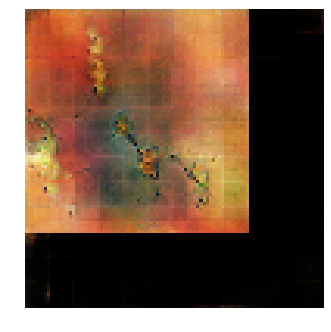


Epoch: 36780, D: -6.05, G: 3.236
Epoch: 36781, D: -5.692, G: 3.211
Epoch: 36782, D: -7.5, G: 4.3
Epoch: 36783, D: -5.668, G: 4.684
Epoch: 36784, D: -5.92, G: 1.246
Epoch: 36785, D: -7.116, G: 3.602
Epoch: 36786, D: -6.765, G: 4.431
Epoch: 36787, D: -5.986, G: 3.385
Epoch: 36788, D: -5.788, G: 3.702
Epoch: 36789, D: -5.348, G: 4.572
Epoch: 36790, D: -6.31, G: 5.047
Epoch: 36791, D: -5.213, G: 3.233
Epoch: 36792, D: -6.225, G: 3.361
Epoch: 36793, D: -5.938, G: 3.718
Epoch: 36794, D: -6.084, G: 2.723
Epoch: 36795, D: -7.384, G: 4.024
Epoch: 36796, D: -7.667, G: 3.248
Epoch: 36797, D: -6.939, G: 3.89
Epoch: 36798, D: -6.318, G: 4.955
Epoch: 36799, D: -5.693, G: 2.747


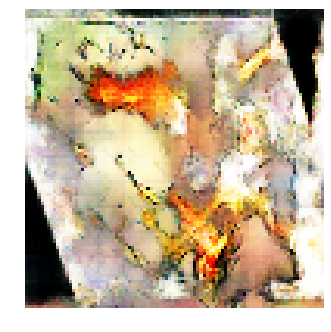


Epoch: 36800, D: -7.086, G: 3.606
Epoch: 36801, D: -6.584, G: 3.326
Epoch: 36802, D: -6.714, G: 5.044
Epoch: 36803, D: -5.793, G: 3.635
Epoch: 36804, D: -5.873, G: 3.483
Epoch: 36805, D: -8.811, G: 2.756
Epoch: 36806, D: -6.519, G: 5.028
Epoch: 36807, D: -7.037, G: 2.162
Epoch: 36808, D: -5.673, G: 4.596
Epoch: 36809, D: -6.332, G: 4.622
Epoch: 36810, D: -5.873, G: 2.573
Epoch: 36811, D: -6.315, G: 3.401
Epoch: 36812, D: -6.085, G: 2.118
Epoch: 36813, D: -5.448, G: 4.361
Epoch: 36814, D: -6.167, G: 1.874
Epoch: 36815, D: -6.725, G: 5.289
Epoch: 36816, D: -6.345, G: 3.284
Epoch: 36817, D: -6.252, G: 3.423
Epoch: 36818, D: -6.498, G: 2.594
Epoch: 36819, D: -5.026, G: 3.683


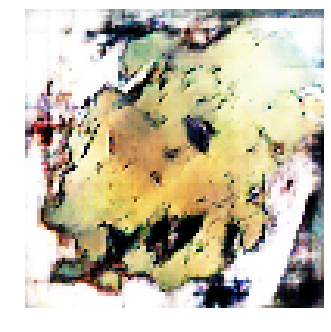


Epoch: 36820, D: -6.121, G: 5.577
Epoch: 36821, D: -6.429, G: 3.015
Epoch: 36822, D: -6.055, G: 1.783
Epoch: 36823, D: -5.518, G: 4.334
Epoch: 36824, D: -6.078, G: 2.773
Epoch: 36825, D: -4.855, G: 2.509
Epoch: 36826, D: -5.511, G: 3.576
Epoch: 36827, D: -6.098, G: 4.407
Epoch: 36828, D: -5.282, G: 3.156
Epoch: 36829, D: -6.346, G: 4.037
Epoch: 36830, D: -6.016, G: 3.334
Epoch: 36831, D: -6.472, G: 4.668
Epoch: 36832, D: -7.117, G: 4.55
Epoch: 36833, D: -6.571, G: 1.954
Epoch: 36834, D: -5.598, G: 4.098
Epoch: 36835, D: -7.88, G: 3.258
Epoch: 36836, D: -6.247, G: 4.65
Epoch: 36837, D: -5.467, G: 3.879
Epoch: 36838, D: -5.839, G: 5.374
Epoch: 36839, D: -7.576, G: 5.077


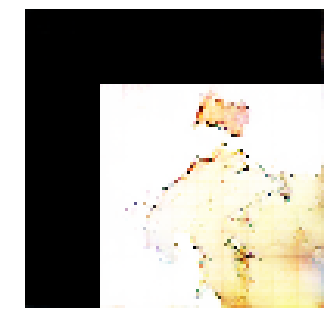


Epoch: 36840, D: -6.466, G: 3.579
Epoch: 36841, D: -5.835, G: 4.237
Epoch: 36842, D: -5.596, G: 4.108
Epoch: 36843, D: -6.422, G: 3.881
Epoch: 36844, D: -5.374, G: 1.838
Epoch: 36845, D: -5.617, G: 3.252
Epoch: 36846, D: -5.84, G: 3.779
Epoch: 36847, D: -8.231, G: 2.497
Epoch: 36848, D: -7.135, G: 2.057
Epoch: 36849, D: -6.818, G: 4.175
Epoch: 36850, D: -5.922, G: 4.546
Epoch: 36851, D: -6.221, G: 2.934
Epoch: 36852, D: -6.551, G: 3.467
Epoch: 36853, D: -7.542, G: 3.172
Epoch: 36854, D: -6.987, G: 4.485
Epoch: 36855, D: -6.697, G: 5.31
Epoch: 36856, D: -5.754, G: 4.863
Epoch: 36857, D: -7.791, G: 5.997
Epoch: 36858, D: -6.114, G: 1.783
Epoch: 36859, D: -7.591, G: 4.015


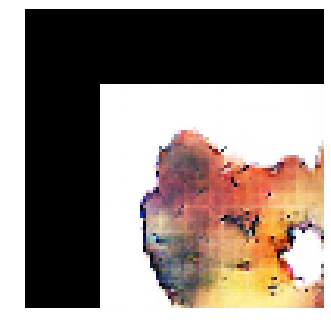


Epoch: 36860, D: -6.268, G: 3.124
Epoch: 36861, D: -7.708, G: 3.48
Epoch: 36862, D: -5.654, G: 4.047
Epoch: 36863, D: -5.9, G: 2.077
Epoch: 36864, D: -7.13, G: 3.138
Epoch: 36865, D: -5.5, G: 5.068
Epoch: 36866, D: -8.059, G: 2.666
Epoch: 36867, D: -8.053, G: 2.859
Epoch: 36868, D: -8.201, G: 3.135
Epoch: 36869, D: -6.029, G: 1.701
Epoch: 36870, D: -7.962, G: 4.257
Epoch: 36871, D: -6.295, G: 4.623
Epoch: 36872, D: -6.731, G: 3.526
Epoch: 36873, D: -5.127, G: 3.38
Epoch: 36874, D: -6.539, G: 2.763
Epoch: 36875, D: -6.813, G: 3.122
Epoch: 36876, D: -7.763, G: 2.904
Epoch: 36877, D: -5.965, G: 3.079
Epoch: 36878, D: -6.356, G: 3.388
Epoch: 36879, D: -6.444, G: 4.016


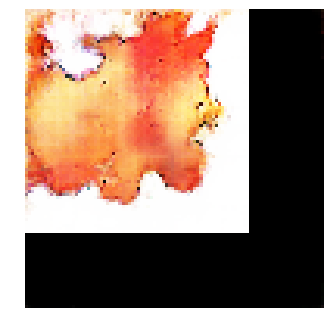


Epoch: 36880, D: -5.712, G: 3.292
Epoch: 36881, D: -5.945, G: 2.723
Epoch: 36882, D: -8.317, G: 3.7
Epoch: 36883, D: -6.981, G: 3.618
Epoch: 36884, D: -7.323, G: 4.826
Epoch: 36885, D: -7.089, G: 4.79
Epoch: 36886, D: -5.833, G: 3.174
Epoch: 36887, D: -6.191, G: 3.918
Epoch: 36888, D: -5.325, G: 5.187
Epoch: 36889, D: -5.893, G: 3.045
Epoch: 36890, D: -5.928, G: 1.869
Epoch: 36891, D: -6.287, G: 3.243
Epoch: 36892, D: -6.612, G: 2.928
Epoch: 36893, D: -7.102, G: 4.02
Epoch: 36894, D: -7.316, G: 3.681
Epoch: 36895, D: -7.173, G: 3.312
Epoch: 36896, D: -5.857, G: 2.846
Epoch: 36897, D: -8.018, G: 4.544
Epoch: 36898, D: -7.696, G: 3.639
Epoch: 36899, D: -5.676, G: 4.277


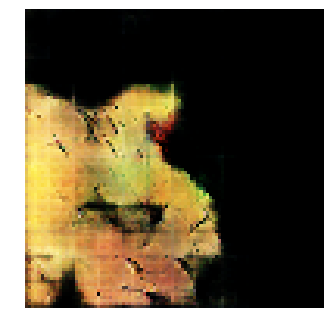


Epoch: 36900, D: -7.479, G: 3.591
Epoch: 36901, D: -8.506, G: 2.463
Epoch: 36902, D: -6.972, G: 3.568
Epoch: 36903, D: -8.053, G: 3.704
Epoch: 36904, D: -5.783, G: 2.93
Epoch: 36905, D: -7.072, G: 3.881
Epoch: 36906, D: -6.552, G: 3.173
Epoch: 36907, D: -4.809, G: 4.389
Epoch: 36908, D: -6.985, G: 4.325
Epoch: 36909, D: -6.258, G: 4.491
Epoch: 36910, D: -7.628, G: 3.96
Epoch: 36911, D: -5.295, G: 2.221
Epoch: 36912, D: -7.769, G: 4.127
Epoch: 36913, D: -5.698, G: 2.871
Epoch: 36914, D: -6.915, G: 3.859
Epoch: 36915, D: -7.362, G: 2.521
Epoch: 36916, D: -6.73, G: 3.321
Epoch: 36917, D: -7.938, G: 4.774
Epoch: 36918, D: -7.305, G: 4.403
Epoch: 36919, D: -5.902, G: 3.479


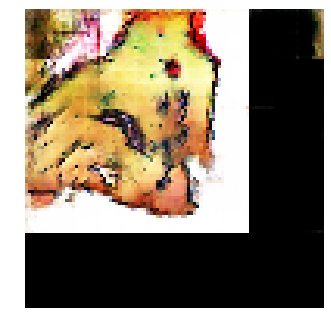


Epoch: 36920, D: -6.643, G: 2.412
Epoch: 36921, D: -6.467, G: 3.268
Epoch: 36922, D: -5.654, G: 5.408
Epoch: 36923, D: -5.974, G: 4.811
Epoch: 36924, D: -8.132, G: 3.271
Epoch: 36925, D: -5.765, G: 6.676
Epoch: 36926, D: -5.762, G: 4.994
Epoch: 36927, D: -7.191, G: 4.157
Epoch: 36928, D: -7.204, G: 3.943
Epoch: 36929, D: -5.062, G: 4.036
Epoch: 36930, D: -5.692, G: 2.515
Epoch: 36931, D: -6.804, G: 4.112
Epoch: 36932, D: -5.81, G: 4.52
Epoch: 36933, D: -5.06, G: 5.439
Epoch: 36934, D: -6.725, G: 4.32
Epoch: 36935, D: -6.207, G: 4.081
Epoch: 36936, D: -6.47, G: 4.694
Epoch: 36937, D: -5.806, G: 4.965
Epoch: 36938, D: -6.327, G: 5.076
Epoch: 36939, D: -5.059, G: 4.059


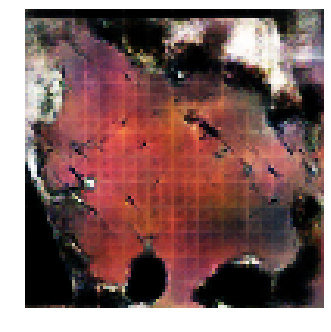


Epoch: 36940, D: -6.268, G: 4.331
Epoch: 36941, D: -7.002, G: 4.863
Epoch: 36942, D: -5.47, G: 5.167
Epoch: 36943, D: -5.172, G: 5.998
Epoch: 36944, D: -6.563, G: 5.642
Epoch: 36945, D: -6.428, G: 3.773
Epoch: 36946, D: -6.004, G: 4.224
Epoch: 36947, D: -6.64, G: 4.206
Epoch: 36948, D: -6.558, G: 4.816
Epoch: 36949, D: -6.894, G: 5.125
Epoch: 36950, D: -5.006, G: 4.627
Epoch: 36951, D: -5.29, G: 4.174
Epoch: 36952, D: -4.59, G: 3.042
Epoch: 36953, D: -6.062, G: 3.256
Epoch: 36954, D: -5.002, G: 3.986
Epoch: 36955, D: -5.272, G: 4.125
Epoch: 36956, D: -5.216, G: 4.814
Epoch: 36957, D: -6.307, G: 6.174
Epoch: 36958, D: -7.192, G: 3.629
Epoch: 36959, D: -5.408, G: 3.222


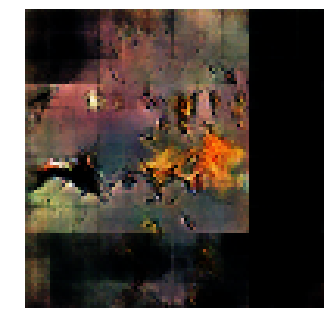


Epoch: 36960, D: -6.24, G: 3.692
Epoch: 36961, D: -7.123, G: 5.118
Epoch: 36962, D: -6.066, G: 4.883
Epoch: 36963, D: -5.219, G: 4.305
Epoch: 36964, D: -6.837, G: 4.711
Epoch: 36965, D: -5.894, G: 3.208
Epoch: 36966, D: -5.965, G: 3.093
Epoch: 36967, D: -6.581, G: 2.922
Epoch: 36968, D: -6.557, G: 3.032
Epoch: 36969, D: -6.661, G: 3.33
Epoch: 36970, D: -6.704, G: 3.312
Epoch: 36971, D: -6.014, G: 4.546
Epoch: 36972, D: -6.027, G: 4.572
Epoch: 36973, D: -5.843, G: 2.091
Epoch: 36974, D: -6.697, G: 5.599
Epoch: 36975, D: -5.639, G: 3.42
Epoch: 36976, D: -8.119, G: 3.165
Epoch: 36977, D: -4.909, G: 3.456
Epoch: 36978, D: -5.954, G: 2.725
Epoch: 36979, D: -7.048, G: 3.844


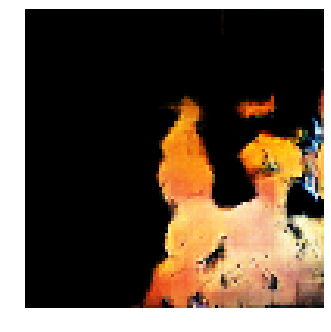


Epoch: 36980, D: -6.45, G: 3.026
Epoch: 36981, D: -6.039, G: 4.72
Epoch: 36982, D: -6.735, G: 3.39
Epoch: 36983, D: -4.896, G: 2.57
Epoch: 36984, D: -6.697, G: 2.382
Epoch: 36985, D: -6.948, G: 3.157
Epoch: 36986, D: -6.979, G: 2.729
Epoch: 36987, D: -6.198, G: 4.486
Epoch: 36988, D: -6.3, G: 1.777
Epoch: 36989, D: -5.623, G: 4.368
Epoch: 36990, D: -6.437, G: 5.063
Epoch: 36991, D: -5.752, G: 2.795
Epoch: 36992, D: -6.223, G: 5.86
Epoch: 36993, D: -7.237, G: 5.028
Epoch: 36994, D: -7.727, G: 5.002
Epoch: 36995, D: -6.747, G: 5.128
Epoch: 36996, D: -7.202, G: 2.971
Epoch: 36997, D: -7.233, G: 2.281
Epoch: 36998, D: -4.76, G: 2.548
Epoch: 36999, D: -5.772, G: 3.708


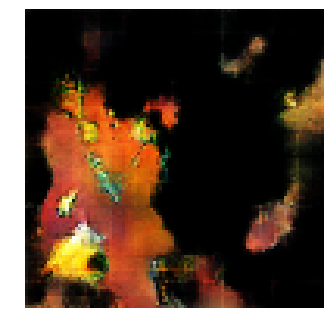


Epoch: 37000, D: -6.563, G: 1.986
Epoch: 37001, D: -5.994, G: 3.33
Epoch: 37002, D: -7.237, G: 4.832
Epoch: 37003, D: -6.538, G: 4.045
Epoch: 37004, D: -5.578, G: 3.924
Epoch: 37005, D: -6.588, G: 4.175
Epoch: 37006, D: -6.676, G: 4.818
Epoch: 37007, D: -5.18, G: 3.684
Epoch: 37008, D: -6.24, G: 3.573
Epoch: 37009, D: -5.691, G: 2.5
Epoch: 37010, D: -6.313, G: 3.739
Epoch: 37011, D: -6.461, G: 2.582
Epoch: 37012, D: -5.04, G: 1.841
Epoch: 37013, D: -7.411, G: 3.656
Epoch: 37014, D: -6.07, G: 4.1
Epoch: 37015, D: -7.602, G: 4.321
Epoch: 37016, D: -5.663, G: 3.931
Epoch: 37017, D: -5.114, G: 3.458
Epoch: 37018, D: -5.483, G: 2.487
Epoch: 37019, D: -6.711, G: 3.563


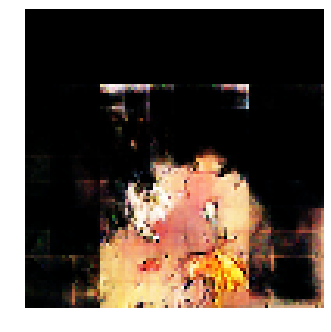


Epoch: 37020, D: -6.298, G: 2.987
Epoch: 37021, D: -6.356, G: 4.132
Epoch: 37022, D: -6.337, G: 4.547
Epoch: 37023, D: -7.128, G: 4.309
Epoch: 37024, D: -5.879, G: 4.869
Epoch: 37025, D: -5.246, G: 3.393
Epoch: 37026, D: -6.826, G: 4.691
Epoch: 37027, D: -5.372, G: 3.877
Epoch: 37028, D: -6.831, G: 4.372
Epoch: 37029, D: -7.592, G: 3.107
Epoch: 37030, D: -7.353, G: 5.198
Epoch: 37031, D: -6.72, G: 3.261
Epoch: 37032, D: -5.965, G: 4.166
Epoch: 37033, D: -5.917, G: 4.855
Epoch: 37034, D: -7.218, G: 4.084
Epoch: 37035, D: -6.492, G: 3.289
Epoch: 37036, D: -5.768, G: 4.771
Epoch: 37037, D: -5.686, G: 2.263
Epoch: 37038, D: -7.212, G: 5.38
Epoch: 37039, D: -5.616, G: 5.538


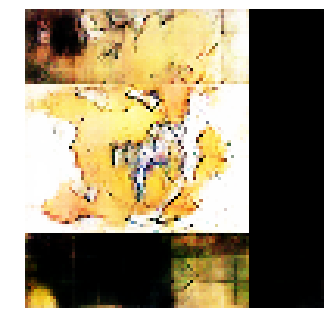


Epoch: 37040, D: -6.462, G: 5.179
Epoch: 37041, D: -6.773, G: 3.784
Epoch: 37042, D: -6.646, G: 3.179
Epoch: 37043, D: -8.023, G: 3.431
Epoch: 37044, D: -6.38, G: 2.685
Epoch: 37045, D: -7.144, G: 2.254
Epoch: 37046, D: -7.655, G: 4.881
Epoch: 37047, D: -6.756, G: 2.015
Epoch: 37048, D: -8.238, G: 3.654
Epoch: 37049, D: -5.944, G: 3.802
Epoch: 37050, D: -7.194, G: 2.575
Epoch: 37051, D: -8.008, G: 3.737
Epoch: 37052, D: -7.494, G: 2.404
Epoch: 37053, D: -4.998, G: 3.971
Epoch: 37054, D: -5.678, G: 3.359
Epoch: 37055, D: -5.562, G: 3.645
Epoch: 37056, D: -5.981, G: 3.699
Epoch: 37057, D: -4.909, G: 2.123
Epoch: 37058, D: -9.064, G: 3.042
Epoch: 37059, D: -7.075, G: 2.093


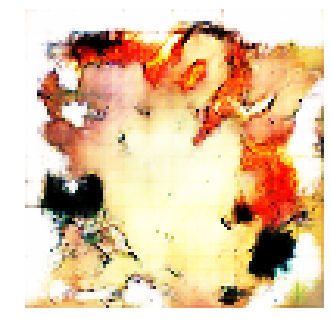


Epoch: 37060, D: -6.733, G: 2.101
Epoch: 37061, D: -6.76, G: 4.2
Epoch: 37062, D: -5.488, G: 1.88
Epoch: 37063, D: -5.854, G: 3.383
Epoch: 37064, D: -6.448, G: 2.846
Epoch: 37065, D: -6.035, G: 3.212
Epoch: 37066, D: -7.991, G: 1.49
Epoch: 37067, D: -6.469, G: 2.792
Epoch: 37068, D: -6.3, G: 4.491
Epoch: 37069, D: -7.203, G: 3.282
Epoch: 37070, D: -6.666, G: 4.781
Epoch: 37071, D: -5.336, G: 4.456
Epoch: 37072, D: -7.738, G: 2.808
Epoch: 37073, D: -4.388, G: 3.038
Epoch: 37074, D: -6.254, G: 4.685
Epoch: 37075, D: -5.147, G: 3.279
Epoch: 37076, D: -6.624, G: 2.118
Epoch: 37077, D: -6.787, G: 3.425
Epoch: 37078, D: -5.083, G: 3.938
Epoch: 37079, D: -6.057, G: 5.424


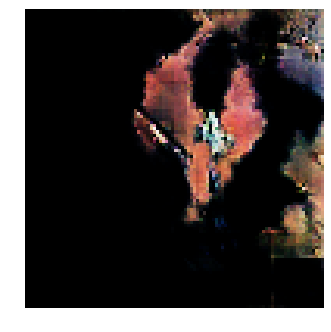


Epoch: 37080, D: -7.283, G: 2.986
Epoch: 37081, D: -7.804, G: 4.48
Epoch: 37082, D: -5.423, G: 4.57
Epoch: 37083, D: -6.395, G: 5.344
Epoch: 37084, D: -6.047, G: 4.492
Epoch: 37085, D: -8.161, G: 3.983
Epoch: 37086, D: -5.323, G: 4.764
Epoch: 37087, D: -6.362, G: 3.884
Epoch: 37088, D: -8.253, G: 4.255
Epoch: 37089, D: -7.154, G: 4.0
Epoch: 37090, D: -6.0, G: 3.703
Epoch: 37091, D: -6.124, G: 4.527
Epoch: 37092, D: -5.304, G: 3.789
Epoch: 37093, D: -5.729, G: 3.422
Epoch: 37094, D: -5.747, G: 3.76
Epoch: 37095, D: -6.445, G: 4.89
Epoch: 37096, D: -6.091, G: 3.688
Epoch: 37097, D: -5.91, G: 3.551
Epoch: 37098, D: -6.514, G: 3.068
Epoch: 37099, D: -6.345, G: 5.041


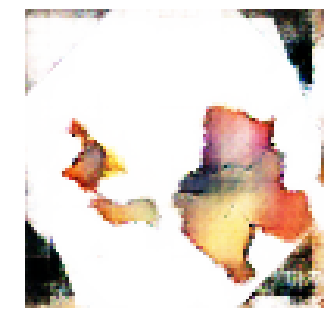


Epoch: 37100, D: -5.385, G: 3.529
Epoch: 37101, D: -5.775, G: 2.138
Epoch: 37102, D: -5.014, G: 3.381
Epoch: 37103, D: -5.421, G: 4.988
Epoch: 37104, D: -5.351, G: 4.034
Epoch: 37105, D: -4.388, G: 3.715
Epoch: 37106, D: -6.374, G: 3.909
Epoch: 37107, D: -5.274, G: 4.034
Epoch: 37108, D: -5.775, G: 4.053
Epoch: 37109, D: -4.629, G: 5.664
Epoch: 37110, D: -5.725, G: 5.562
Epoch: 37111, D: -6.022, G: 5.328
Epoch: 37112, D: -5.901, G: 2.458
Epoch: 37113, D: -6.561, G: 2.84
Epoch: 37114, D: -5.972, G: 3.794
Epoch: 37115, D: -6.067, G: 3.746
Epoch: 37116, D: -5.277, G: 3.589
Epoch: 37117, D: -6.407, G: 4.485
Epoch: 37118, D: -6.577, G: 2.715
Epoch: 37119, D: -7.011, G: 3.047


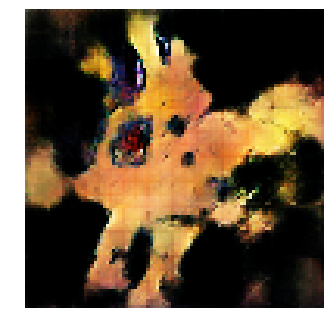


Epoch: 37120, D: -6.361, G: 4.386
Epoch: 37121, D: -6.281, G: 4.446
Epoch: 37122, D: -6.732, G: 5.996
Epoch: 37123, D: -6.017, G: 5.201
Epoch: 37124, D: -5.263, G: 3.929
Epoch: 37125, D: -5.742, G: 4.069
Epoch: 37126, D: -5.239, G: 3.519
Epoch: 37127, D: -6.996, G: 4.394
Epoch: 37128, D: -6.313, G: 4.162
Epoch: 37129, D: -5.477, G: 3.992
Epoch: 37130, D: -6.585, G: 2.873
Epoch: 37131, D: -6.099, G: 4.0
Epoch: 37132, D: -5.873, G: 4.54
Epoch: 37133, D: -6.249, G: 4.109
Epoch: 37134, D: -7.037, G: 2.213
Epoch: 37135, D: -7.759, G: 3.862
Epoch: 37136, D: -5.86, G: 4.381
Epoch: 37137, D: -6.441, G: 5.259
Epoch: 37138, D: -6.024, G: 2.76
Epoch: 37139, D: -5.119, G: 4.042


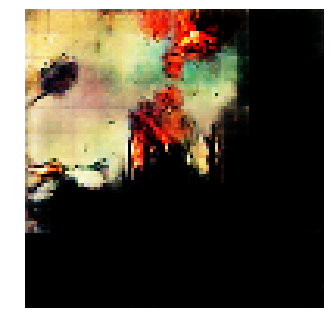


Epoch: 37140, D: -6.963, G: 4.907
Epoch: 37141, D: -5.085, G: 4.902
Epoch: 37142, D: -4.662, G: 1.841
Epoch: 37143, D: -6.732, G: 2.993
Epoch: 37144, D: -7.161, G: 4.202
Epoch: 37145, D: -5.141, G: 3.354
Epoch: 37146, D: -6.344, G: 5.111
Epoch: 37147, D: -5.801, G: 3.912
Epoch: 37148, D: -7.132, G: 4.431
Epoch: 37149, D: -4.865, G: 3.241
Epoch: 37150, D: -6.301, G: 4.25
Epoch: 37151, D: -5.332, G: 3.599
Epoch: 37152, D: -6.5, G: 2.556
Epoch: 37153, D: -7.376, G: 2.975
Epoch: 37154, D: -7.695, G: 3.544
Epoch: 37155, D: -6.769, G: 3.825
Epoch: 37156, D: -6.984, G: 3.505
Epoch: 37157, D: -5.49, G: 3.814
Epoch: 37158, D: -4.974, G: 5.554
Epoch: 37159, D: -6.277, G: 3.266


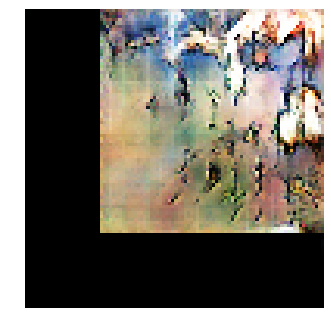


Epoch: 37160, D: -5.457, G: 3.124
Epoch: 37161, D: -4.086, G: 5.249
Epoch: 37162, D: -7.188, G: 3.927
Epoch: 37163, D: -7.1, G: 3.134
Epoch: 37164, D: -5.674, G: 3.342
Epoch: 37165, D: -4.887, G: 3.606
Epoch: 37166, D: -5.59, G: 4.594
Epoch: 37167, D: -5.841, G: 2.961
Epoch: 37168, D: -6.295, G: 3.873
Epoch: 37169, D: -5.666, G: 4.985
Epoch: 37170, D: -7.046, G: 2.754
Epoch: 37171, D: -5.483, G: 3.533
Epoch: 37172, D: -6.462, G: 4.637
Epoch: 37173, D: -5.17, G: 3.992
Epoch: 37174, D: -7.859, G: 5.016
Epoch: 37175, D: -6.283, G: 3.926
Epoch: 37176, D: -5.151, G: 2.405
Epoch: 37177, D: -6.597, G: 2.763
Epoch: 37178, D: -4.974, G: 4.542
Epoch: 37179, D: -6.01, G: 5.452


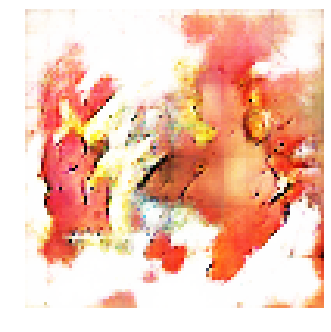


Epoch: 37180, D: -6.14, G: 4.648
Epoch: 37181, D: -6.197, G: 3.402
Epoch: 37182, D: -6.471, G: 4.014
Epoch: 37183, D: -6.177, G: 2.73
Epoch: 37184, D: -6.41, G: 4.241
Epoch: 37185, D: -7.66, G: 4.932
Epoch: 37186, D: -6.774, G: 4.118
Epoch: 37187, D: -7.756, G: 6.223
Epoch: 37188, D: -6.1, G: 4.547
Epoch: 37189, D: -6.405, G: 6.243
Epoch: 37190, D: -5.576, G: 3.115
Epoch: 37191, D: -6.872, G: 3.714
Epoch: 37192, D: -8.126, G: 4.51
Epoch: 37193, D: -5.542, G: 3.317
Epoch: 37194, D: -5.968, G: 4.518
Epoch: 37195, D: -6.965, G: 4.554
Epoch: 37196, D: -6.804, G: 4.646
Epoch: 37197, D: -6.224, G: 3.201
Epoch: 37198, D: -5.827, G: 5.506
Epoch: 37199, D: -7.09, G: 5.323


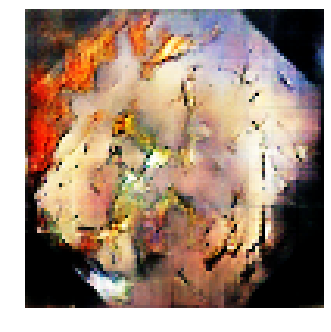


Epoch: 37200, D: -7.033, G: 4.061
Epoch: 37201, D: -7.114, G: 4.522
Epoch: 37202, D: -6.607, G: 5.063
Epoch: 37203, D: -6.402, G: 3.839
Epoch: 37204, D: -6.02, G: 3.919
Epoch: 37205, D: -6.177, G: 4.523
Epoch: 37206, D: -4.18, G: 3.749
Epoch: 37207, D: -6.454, G: 3.021
Epoch: 37208, D: -6.253, G: 4.139
Epoch: 37209, D: -5.915, G: 3.718
Epoch: 37210, D: -6.679, G: 3.918
Epoch: 37211, D: -6.208, G: 2.896
Epoch: 37212, D: -7.605, G: 2.745
Epoch: 37213, D: -6.762, G: 4.318
Epoch: 37214, D: -5.37, G: 4.864
Epoch: 37215, D: -6.32, G: 3.973
Epoch: 37216, D: -6.101, G: 2.34
Epoch: 37217, D: -5.862, G: 3.575
Epoch: 37218, D: -6.15, G: 3.017
Epoch: 37219, D: -6.276, G: 3.784


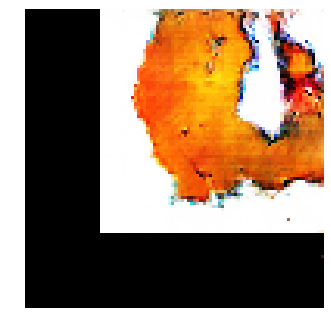


Epoch: 37220, D: -6.154, G: 4.358
Epoch: 37221, D: -6.023, G: 4.348
Epoch: 37222, D: -6.748, G: 5.488
Epoch: 37223, D: -5.546, G: 4.155
Epoch: 37224, D: -6.649, G: 4.75
Epoch: 37225, D: -5.563, G: 4.935
Epoch: 37226, D: -4.944, G: 4.734
Epoch: 37227, D: -5.325, G: 3.793
Epoch: 37228, D: -7.018, G: 3.717
Epoch: 37229, D: -6.135, G: 6.853
Epoch: 37230, D: -6.412, G: 4.523
Epoch: 37231, D: -6.396, G: 3.637
Epoch: 37232, D: -7.252, G: 3.595
Epoch: 37233, D: -6.551, G: 3.692
Epoch: 37234, D: -7.424, G: 3.09
Epoch: 37235, D: -6.798, G: 3.764
Epoch: 37236, D: -5.697, G: 5.479
Epoch: 37237, D: -6.126, G: 4.022
Epoch: 37238, D: -5.933, G: 1.32
Epoch: 37239, D: -6.708, G: 3.552


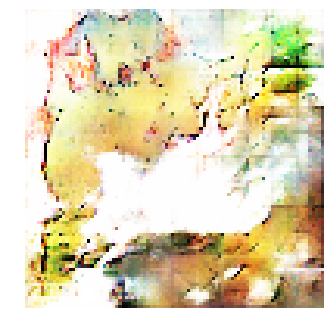


Epoch: 37240, D: -5.345, G: 4.972
Epoch: 37241, D: -5.621, G: 3.139
Epoch: 37242, D: -5.91, G: 2.945
Epoch: 37243, D: -6.012, G: 3.832
Epoch: 37244, D: -6.375, G: 2.392
Epoch: 37245, D: -7.756, G: 3.556
Epoch: 37246, D: -6.676, G: 4.278
Epoch: 37247, D: -6.521, G: 3.77
Epoch: 37248, D: -6.585, G: 4.128
Epoch: 37249, D: -7.109, G: 3.65
Epoch: 37250, D: -5.456, G: 4.108
Epoch: 37251, D: -5.83, G: 3.561
Epoch: 37252, D: -5.914, G: 3.334
Epoch: 37253, D: -6.235, G: 2.917
Epoch: 37254, D: -5.344, G: 4.471
Epoch: 37255, D: -5.51, G: 3.038
Epoch: 37256, D: -6.563, G: 2.492
Epoch: 37257, D: -6.694, G: 3.343
Epoch: 37258, D: -5.823, G: 5.45
Epoch: 37259, D: -5.086, G: 3.391


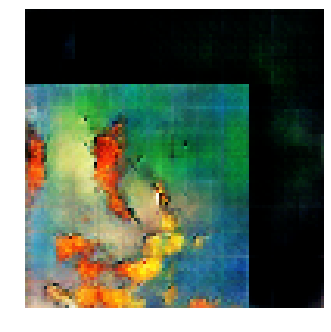


Epoch: 37260, D: -6.108, G: 1.79
Epoch: 37261, D: -7.214, G: 4.338
Epoch: 37262, D: -6.6, G: 3.067
Epoch: 37263, D: -6.113, G: 2.248
Epoch: 37264, D: -6.035, G: 4.693
Epoch: 37265, D: -4.221, G: 5.249
Epoch: 37266, D: -6.582, G: 4.991
Epoch: 37267, D: -5.423, G: 3.44
Epoch: 37268, D: -7.084, G: 4.307
Epoch: 37269, D: -5.863, G: 3.753
Epoch: 37270, D: -5.502, G: 4.029
Epoch: 37271, D: -6.96, G: 3.524
Epoch: 37272, D: -5.167, G: 4.757
Epoch: 37273, D: -5.136, G: 4.019
Epoch: 37274, D: -5.253, G: 3.663
Epoch: 37275, D: -5.053, G: 2.324
Epoch: 37276, D: -6.682, G: 3.491
Epoch: 37277, D: -6.29, G: 3.34
Epoch: 37278, D: -3.736, G: 3.605
Epoch: 37279, D: -6.774, G: 2.999


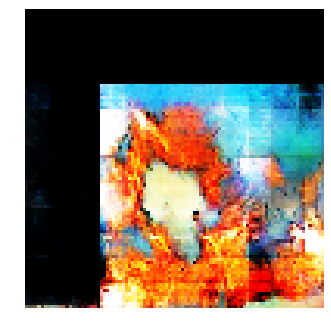


Epoch: 37280, D: -6.095, G: 2.819
Epoch: 37281, D: -6.179, G: 0.8088
Epoch: 37282, D: -6.292, G: 0.7592
Epoch: 37283, D: -6.49, G: 1.934
Epoch: 37284, D: -5.717, G: 4.411
Epoch: 37285, D: -6.466, G: 3.416
Epoch: 37286, D: -5.754, G: 2.873
Epoch: 37287, D: -5.286, G: 4.772
Epoch: 37288, D: -5.662, G: 4.21
Epoch: 37289, D: -5.553, G: 4.09
Epoch: 37290, D: -7.216, G: 3.464
Epoch: 37291, D: -6.338, G: 3.874
Epoch: 37292, D: -5.702, G: 4.035
Epoch: 37293, D: -6.041, G: 2.499
Epoch: 37294, D: -5.802, G: 4.267
Epoch: 37295, D: -6.832, G: 4.134
Epoch: 37296, D: -6.781, G: 5.45
Epoch: 37297, D: -5.689, G: 4.86
Epoch: 37298, D: -5.156, G: 5.164
Epoch: 37299, D: -6.261, G: 2.755


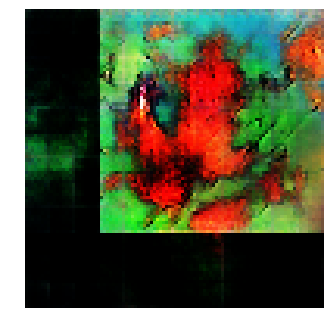


Epoch: 37300, D: -6.511, G: 2.924
Epoch: 37301, D: -5.459, G: 2.645
Epoch: 37302, D: -6.906, G: 4.048
Epoch: 37303, D: -4.544, G: 2.731
Epoch: 37304, D: -6.259, G: 2.741
Epoch: 37305, D: -6.352, G: 3.139
Epoch: 37306, D: -6.221, G: 3.616
Epoch: 37307, D: -6.382, G: 3.799
Epoch: 37308, D: -6.538, G: 3.018
Epoch: 37309, D: -8.483, G: 4.031
Epoch: 37310, D: -5.445, G: 4.147
Epoch: 37311, D: -6.595, G: 3.799
Epoch: 37312, D: -5.078, G: 4.32
Epoch: 37313, D: -6.838, G: 3.1
Epoch: 37314, D: -6.721, G: 4.798
Epoch: 37315, D: -6.842, G: 3.978
Epoch: 37316, D: -6.222, G: 3.409
Epoch: 37317, D: -5.365, G: 3.42
Epoch: 37318, D: -6.763, G: 3.742
Epoch: 37319, D: -4.95, G: 4.301


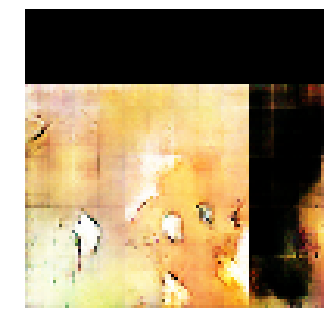


Epoch: 37320, D: -5.923, G: 4.885
Epoch: 37321, D: -5.243, G: 3.743
Epoch: 37322, D: -7.096, G: 4.387
Epoch: 37323, D: -5.904, G: 2.524
Epoch: 37324, D: -7.382, G: 4.084
Epoch: 37325, D: -6.908, G: 3.362
Epoch: 37326, D: -7.301, G: 4.883
Epoch: 37327, D: -6.27, G: 4.559
Epoch: 37328, D: -6.088, G: 3.822
Epoch: 37329, D: -6.656, G: 1.39
Epoch: 37330, D: -4.709, G: 4.054
Epoch: 37331, D: -7.007, G: 4.232
Epoch: 37332, D: -4.795, G: 3.204
Epoch: 37333, D: -5.918, G: 4.906
Epoch: 37334, D: -5.372, G: 2.93
Epoch: 37335, D: -7.119, G: 1.974
Epoch: 37336, D: -5.533, G: 4.139
Epoch: 37337, D: -6.962, G: 1.978
Epoch: 37338, D: -5.407, G: 3.37
Epoch: 37339, D: -6.814, G: 2.694


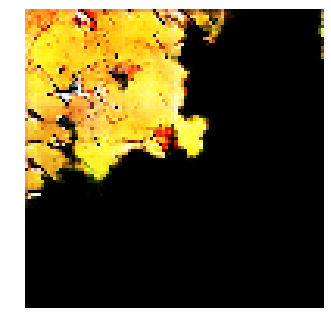


Epoch: 37340, D: -6.051, G: 0.1984
Epoch: 37341, D: -7.106, G: 3.206
Epoch: 37342, D: -7.297, G: 3.186
Epoch: 37343, D: -7.846, G: 5.451
Epoch: 37344, D: -5.547, G: 4.094
Epoch: 37345, D: -5.617, G: 5.549
Epoch: 37346, D: -6.36, G: 5.266
Epoch: 37347, D: -4.241, G: 3.083
Epoch: 37348, D: -7.131, G: 2.704
Epoch: 37349, D: -6.252, G: 3.477
Epoch: 37350, D: -6.074, G: 5.012
Epoch: 37351, D: -5.677, G: 3.286
Epoch: 37352, D: -5.333, G: 2.823
Epoch: 37353, D: -5.814, G: 2.537
Epoch: 37354, D: -5.483, G: 4.774
Epoch: 37355, D: -7.44, G: 2.862
Epoch: 37356, D: -4.679, G: 3.631
Epoch: 37357, D: -6.222, G: 3.284
Epoch: 37358, D: -6.71, G: 2.186
Epoch: 37359, D: -5.882, G: 4.034


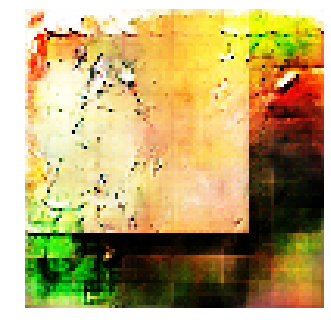


Epoch: 37360, D: -6.955, G: 3.777
Epoch: 37361, D: -6.082, G: 3.744
Epoch: 37362, D: -7.064, G: 4.464
Epoch: 37363, D: -6.267, G: 4.902
Epoch: 37364, D: -5.619, G: 5.784
Epoch: 37365, D: -6.697, G: 5.076
Epoch: 37366, D: -5.698, G: 3.404
Epoch: 37367, D: -5.881, G: 3.292
Epoch: 37368, D: -5.787, G: 3.028
Epoch: 37369, D: -6.219, G: 3.432
Epoch: 37370, D: -5.79, G: 3.327
Epoch: 37371, D: -6.255, G: 4.25
Epoch: 37372, D: -8.16, G: 6.703
Epoch: 37373, D: -5.474, G: 3.321
Epoch: 37374, D: -5.887, G: 3.967
Epoch: 37375, D: -6.535, G: 3.638
Epoch: 37376, D: -8.278, G: 4.124
Epoch: 37377, D: -7.022, G: 3.33
Epoch: 37378, D: -7.945, G: 3.653
Epoch: 37379, D: -6.413, G: 2.592


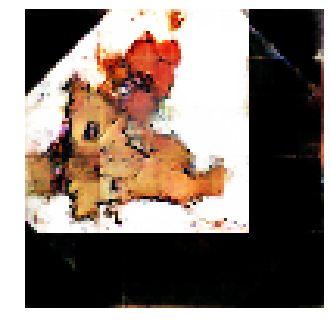


Epoch: 37380, D: -5.19, G: 3.322
Epoch: 37381, D: -6.763, G: 6.019
Epoch: 37382, D: -7.281, G: 3.532
Epoch: 37383, D: -7.034, G: 3.247
Epoch: 37384, D: -4.721, G: 1.693
Epoch: 37385, D: -8.712, G: 3.128
Epoch: 37386, D: -7.06, G: 1.433
Epoch: 37387, D: -5.857, G: 3.022
Epoch: 37388, D: -7.643, G: 4.819
Epoch: 37389, D: -6.064, G: 3.655
Epoch: 37390, D: -5.789, G: 4.654
Epoch: 37391, D: -5.849, G: 4.779
Epoch: 37392, D: -5.992, G: 2.93
Epoch: 37393, D: -5.22, G: 5.1
Epoch: 37394, D: -5.369, G: 4.067
Epoch: 37395, D: -6.462, G: 3.941
Epoch: 37396, D: -6.076, G: 3.307
Epoch: 37397, D: -6.726, G: 3.527
Epoch: 37398, D: -6.599, G: 3.166
Epoch: 37399, D: -6.274, G: 3.769


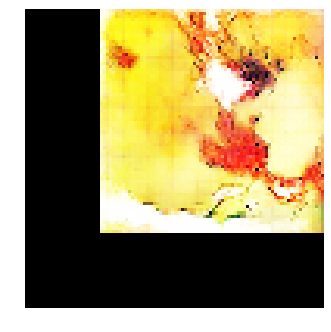


Epoch: 37400, D: -5.506, G: 3.538
Epoch: 37401, D: -7.12, G: 3.14
Epoch: 37402, D: -6.364, G: 3.742
Epoch: 37403, D: -6.315, G: 4.464
Epoch: 37404, D: -5.059, G: 5.184
Epoch: 37405, D: -5.216, G: 5.03
Epoch: 37406, D: -5.182, G: 4.165
Epoch: 37407, D: -7.715, G: 3.981
Epoch: 37408, D: -5.124, G: 3.721
Epoch: 37409, D: -5.937, G: 3.287
Epoch: 37410, D: -6.944, G: 1.978
Epoch: 37411, D: -6.217, G: 2.919
Epoch: 37412, D: -5.351, G: 2.73
Epoch: 37413, D: -5.2, G: 5.343
Epoch: 37414, D: -6.101, G: 2.961
Epoch: 37415, D: -4.836, G: 3.391
Epoch: 37416, D: -5.793, G: 5.398
Epoch: 37417, D: -5.138, G: 3.598
Epoch: 37418, D: -7.789, G: 6.421
Epoch: 37419, D: -5.711, G: 2.909


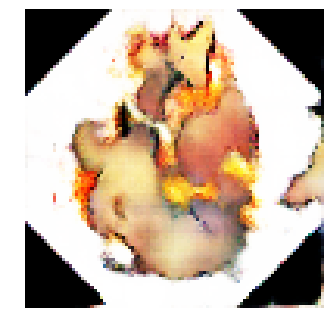


Epoch: 37420, D: -7.258, G: 2.583
Epoch: 37421, D: -5.97, G: 2.134
Epoch: 37422, D: -5.522, G: 3.428
Epoch: 37423, D: -5.096, G: 5.193
Epoch: 37424, D: -6.865, G: 5.734
Epoch: 37425, D: -5.395, G: 4.457
Epoch: 37426, D: -5.949, G: 3.144
Epoch: 37427, D: -5.911, G: 3.372
Epoch: 37428, D: -6.511, G: 3.575
Epoch: 37429, D: -6.591, G: 4.019
Epoch: 37430, D: -6.359, G: 2.397
Epoch: 37431, D: -6.445, G: 4.212
Epoch: 37432, D: -5.965, G: 3.463
Epoch: 37433, D: -6.245, G: 3.474
Epoch: 37434, D: -4.717, G: 4.128
Epoch: 37435, D: -7.453, G: 2.97
Epoch: 37436, D: -7.234, G: 4.713
Epoch: 37437, D: -6.531, G: 1.098
Epoch: 37438, D: -6.152, G: 3.189
Epoch: 37439, D: -6.234, G: 4.626


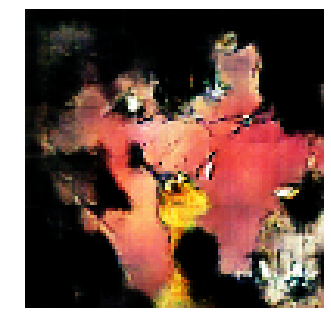


Epoch: 37440, D: -4.626, G: 3.343
Epoch: 37441, D: -5.463, G: 3.637
Epoch: 37442, D: -5.785, G: 5.299
Epoch: 37443, D: -6.372, G: 6.233
Epoch: 37444, D: -6.491, G: 4.146
Epoch: 37445, D: -5.164, G: 4.451
Epoch: 37446, D: -7.134, G: 3.091
Epoch: 37447, D: -6.992, G: 2.297
Epoch: 37448, D: -5.984, G: 3.474
Epoch: 37449, D: -5.351, G: 5.675
Epoch: 37450, D: -6.896, G: 4.588
Epoch: 37451, D: -5.636, G: 5.184
Epoch: 37452, D: -4.807, G: 3.754
Epoch: 37453, D: -6.54, G: 4.862
Epoch: 37454, D: -5.629, G: 3.412
Epoch: 37455, D: -5.831, G: 4.555
Epoch: 37456, D: -6.845, G: 4.591
Epoch: 37457, D: -7.019, G: 3.856
Epoch: 37458, D: -5.193, G: 5.116
Epoch: 37459, D: -6.428, G: 2.345


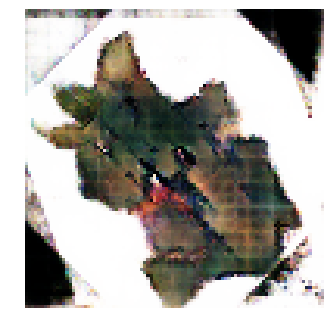


Epoch: 37460, D: -6.828, G: 5.576
Epoch: 37461, D: -6.52, G: 5.649
Epoch: 37462, D: -7.287, G: 4.286
Epoch: 37463, D: -6.382, G: 3.186
Epoch: 37464, D: -6.702, G: 5.544
Epoch: 37465, D: -6.204, G: 6.379
Epoch: 37466, D: -6.197, G: 2.931
Epoch: 37467, D: -6.363, G: 4.704
Epoch: 37468, D: -6.554, G: 4.214
Epoch: 37469, D: -6.866, G: 3.024
Epoch: 37470, D: -6.465, G: 5.556
Epoch: 37471, D: -5.578, G: 2.956
Epoch: 37472, D: -6.821, G: 3.865
Epoch: 37473, D: -5.857, G: 2.931
Epoch: 37474, D: -5.879, G: 3.965
Epoch: 37475, D: -5.799, G: 3.491
Epoch: 37476, D: -6.302, G: 3.976
Epoch: 37477, D: -5.251, G: 4.422
Epoch: 37478, D: -5.869, G: 2.951
Epoch: 37479, D: -7.32, G: 3.708


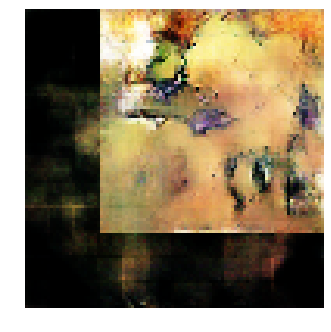


Epoch: 37480, D: -5.151, G: 2.712
Epoch: 37481, D: -5.432, G: 3.93
Epoch: 37482, D: -5.638, G: 3.464
Epoch: 37483, D: -5.218, G: 3.507
Epoch: 37484, D: -6.097, G: 3.859
Epoch: 37485, D: -4.826, G: 3.921
Epoch: 37486, D: -5.914, G: 2.974
Epoch: 37487, D: -5.428, G: 3.517
Epoch: 37488, D: -5.362, G: 5.27
Epoch: 37489, D: -6.392, G: 4.784
Epoch: 37490, D: -6.93, G: 3.967
Epoch: 37491, D: -7.168, G: 3.434
Epoch: 37492, D: -7.037, G: 3.198
Epoch: 37493, D: -7.946, G: 3.868
Epoch: 37494, D: -7.032, G: 2.339
Epoch: 37495, D: -7.233, G: 4.351
Epoch: 37496, D: -6.467, G: 3.455
Epoch: 37497, D: -6.469, G: 4.267
Epoch: 37498, D: -4.875, G: 4.409
Epoch: 37499, D: -6.274, G: 4.111


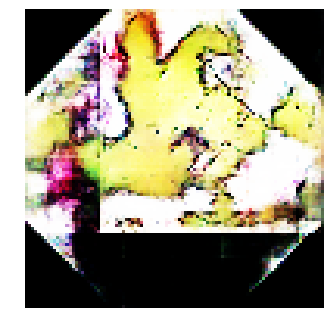


Epoch: 37500, D: -7.258, G: 3.881
Epoch: 37501, D: -5.806, G: 2.922
Epoch: 37502, D: -5.69, G: 1.854
Epoch: 37503, D: -6.642, G: 3.725
Epoch: 37504, D: -6.215, G: 1.71
Epoch: 37505, D: -6.679, G: 5.064
Epoch: 37506, D: -5.234, G: 2.815
Epoch: 37507, D: -5.83, G: 5.786
Epoch: 37508, D: -6.086, G: 4.636
Epoch: 37509, D: -5.806, G: 3.431
Epoch: 37510, D: -7.284, G: 1.763
Epoch: 37511, D: -6.879, G: 4.252
Epoch: 37512, D: -7.304, G: 2.013
Epoch: 37513, D: -5.812, G: 5.05
Epoch: 37514, D: -7.241, G: 3.814
Epoch: 37515, D: -6.396, G: 3.34
Epoch: 37516, D: -6.403, G: 3.466
Epoch: 37517, D: -6.499, G: 4.762
Epoch: 37518, D: -6.679, G: 3.431
Epoch: 37519, D: -5.576, G: 4.541


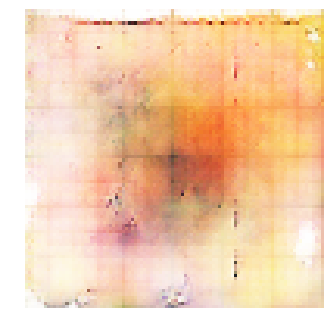


Epoch: 37520, D: -5.823, G: 5.51
Epoch: 37521, D: -6.861, G: 3.988
Epoch: 37522, D: -4.496, G: 3.553
Epoch: 37523, D: -7.524, G: 5.987
Epoch: 37524, D: -6.613, G: 3.335
Epoch: 37525, D: -5.245, G: 5.157
Epoch: 37526, D: -5.303, G: 2.214
Epoch: 37527, D: -6.94, G: 2.061
Epoch: 37528, D: -5.331, G: 5.448
Epoch: 37529, D: -5.1, G: 5.272
Epoch: 37530, D: -5.653, G: 3.907
Epoch: 37531, D: -5.392, G: 4.956
Epoch: 37532, D: -4.77, G: 4.884
Epoch: 37533, D: -6.009, G: 3.618
Epoch: 37534, D: -6.07, G: 2.935
Epoch: 37535, D: -5.893, G: 2.835
Epoch: 37536, D: -6.377, G: 1.411
Epoch: 37537, D: -6.873, G: 3.526
Epoch: 37538, D: -6.802, G: 3.879
Epoch: 37539, D: -7.552, G: 2.648


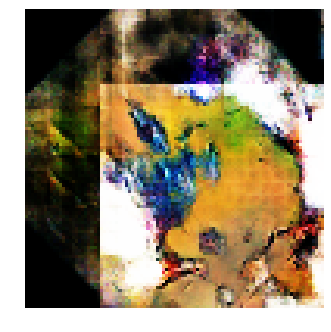


Epoch: 37540, D: -5.866, G: 2.275
Epoch: 37541, D: -5.815, G: 5.729
Epoch: 37542, D: -7.327, G: 5.436
Epoch: 37543, D: -5.381, G: 2.982
Epoch: 37544, D: -5.603, G: 2.996
Epoch: 37545, D: -6.615, G: 2.913
Epoch: 37546, D: -5.996, G: 5.482
Epoch: 37547, D: -6.541, G: 2.517
Epoch: 37548, D: -6.467, G: 4.867
Epoch: 37549, D: -5.926, G: 4.95
Epoch: 37550, D: -5.971, G: 5.105
Epoch: 37551, D: -4.882, G: 4.029
Epoch: 37552, D: -6.911, G: 3.875
Epoch: 37553, D: -7.251, G: 3.886
Epoch: 37554, D: -7.682, G: 3.106
Epoch: 37555, D: -5.906, G: 4.877
Epoch: 37556, D: -5.845, G: 3.792
Epoch: 37557, D: -6.368, G: 5.177
Epoch: 37558, D: -5.436, G: 4.809
Epoch: 37559, D: -6.799, G: 4.189


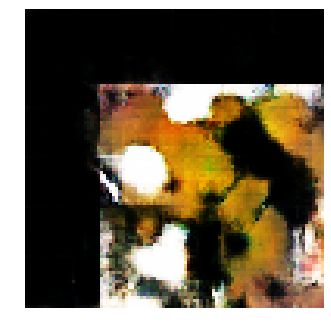


Epoch: 37560, D: -7.043, G: 3.8
Epoch: 37561, D: -5.674, G: 3.239
Epoch: 37562, D: -6.285, G: 2.615
Epoch: 37563, D: -8.332, G: 3.693
Epoch: 37564, D: -6.959, G: 3.725
Epoch: 37565, D: -6.014, G: 3.521
Epoch: 37566, D: -6.977, G: 2.958
Epoch: 37567, D: -7.18, G: 3.544
Epoch: 37568, D: -5.98, G: 2.044
Epoch: 37569, D: -6.009, G: 4.903
Epoch: 37570, D: -6.327, G: 4.032
Epoch: 37571, D: -5.515, G: 2.087
Epoch: 37572, D: -5.305, G: 3.584
Epoch: 37573, D: -5.831, G: 4.538
Epoch: 37574, D: -5.42, G: 3.473
Epoch: 37575, D: -7.641, G: 2.475
Epoch: 37576, D: -6.227, G: 2.905
Epoch: 37577, D: -6.947, G: 3.922
Epoch: 37578, D: -5.867, G: 3.958
Epoch: 37579, D: -6.713, G: 4.811


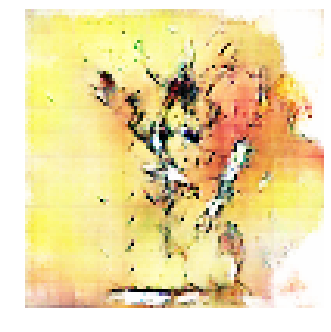


Epoch: 37580, D: -6.251, G: 4.029
Epoch: 37581, D: -7.108, G: 2.279
Epoch: 37582, D: -7.4, G: 2.966
Epoch: 37583, D: -6.177, G: 2.884
Epoch: 37584, D: -8.027, G: 4.153
Epoch: 37585, D: -6.228, G: 4.532
Epoch: 37586, D: -6.258, G: 5.199
Epoch: 37587, D: -6.226, G: 5.368
Epoch: 37588, D: -5.654, G: 5.433
Epoch: 37589, D: -6.123, G: 3.148
Epoch: 37590, D: -6.065, G: 2.386
Epoch: 37591, D: -5.718, G: 3.019
Epoch: 37592, D: -4.822, G: 2.005
Epoch: 37593, D: -6.395, G: 3.895
Epoch: 37594, D: -5.782, G: 2.428
Epoch: 37595, D: -6.399, G: 2.995
Epoch: 37596, D: -4.283, G: 3.189
Epoch: 37597, D: -6.248, G: 3.612
Epoch: 37598, D: -5.956, G: 4.561
Epoch: 37599, D: -5.807, G: 3.963


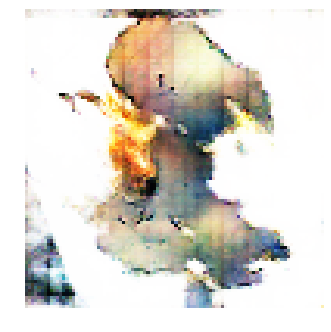


Epoch: 37600, D: -8.42, G: 5.232
Epoch: 37601, D: -5.242, G: 4.42
Epoch: 37602, D: -6.481, G: 4.127
Epoch: 37603, D: -5.321, G: 5.051
Epoch: 37604, D: -6.71, G: 5.606
Epoch: 37605, D: -5.206, G: 2.838
Epoch: 37606, D: -5.25, G: 6.128
Epoch: 37607, D: -6.765, G: 4.035
Epoch: 37608, D: -4.814, G: 4.531
Epoch: 37609, D: -7.14, G: 3.104
Epoch: 37610, D: -5.583, G: 4.733
Epoch: 37611, D: -8.003, G: 5.473
Epoch: 37612, D: -6.347, G: 3.036
Epoch: 37613, D: -5.569, G: 2.832
Epoch: 37614, D: -6.135, G: 3.495
Epoch: 37615, D: -5.788, G: 3.698
Epoch: 37616, D: -5.196, G: 3.396
Epoch: 37617, D: -5.918, G: 4.804
Epoch: 37618, D: -8.135, G: 4.476
Epoch: 37619, D: -7.041, G: 5.538


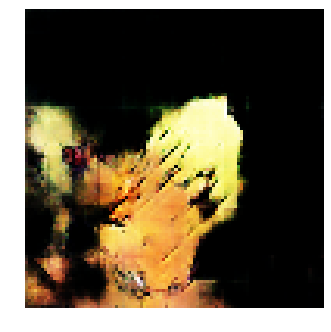


Epoch: 37620, D: -5.851, G: 2.538
Epoch: 37621, D: -4.974, G: 3.295
Epoch: 37622, D: -5.854, G: 4.183
Epoch: 37623, D: -6.032, G: 2.718
Epoch: 37624, D: -5.701, G: 3.217
Epoch: 37625, D: -5.28, G: 5.027
Epoch: 37626, D: -6.415, G: 3.896
Epoch: 37627, D: -5.193, G: 5.41
Epoch: 37628, D: -7.074, G: 4.876
Epoch: 37629, D: -6.725, G: 4.261
Epoch: 37630, D: -6.246, G: 2.646
Epoch: 37631, D: -6.348, G: 3.838
Epoch: 37632, D: -6.76, G: 4.471
Epoch: 37633, D: -7.02, G: 5.56
Epoch: 37634, D: -6.657, G: 4.604
Epoch: 37635, D: -7.395, G: 3.992
Epoch: 37636, D: -5.975, G: 3.44
Epoch: 37637, D: -7.008, G: 2.797
Epoch: 37638, D: -6.896, G: 5.19
Epoch: 37639, D: -6.12, G: 3.595


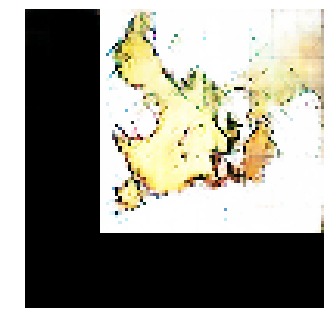


Epoch: 37640, D: -5.718, G: 2.721
Epoch: 37641, D: -6.195, G: 4.231
Epoch: 37642, D: -4.457, G: 5.103
Epoch: 37643, D: -6.776, G: 4.277
Epoch: 37644, D: -7.606, G: 4.98
Epoch: 37645, D: -6.539, G: 2.963
Epoch: 37646, D: -4.234, G: 4.877
Epoch: 37647, D: -6.375, G: 4.175
Epoch: 37648, D: -5.455, G: 2.407
Epoch: 37649, D: -7.758, G: 4.407
Epoch: 37650, D: -6.284, G: 3.63
Epoch: 37651, D: -7.657, G: 1.866
Epoch: 37652, D: -5.789, G: 3.867
Epoch: 37653, D: -6.841, G: 4.356
Epoch: 37654, D: -5.609, G: 3.013
Epoch: 37655, D: -6.207, G: 4.749
Epoch: 37656, D: -5.824, G: 4.831
Epoch: 37657, D: -6.361, G: 2.634
Epoch: 37658, D: -6.215, G: 3.88
Epoch: 37659, D: -5.848, G: 5.589


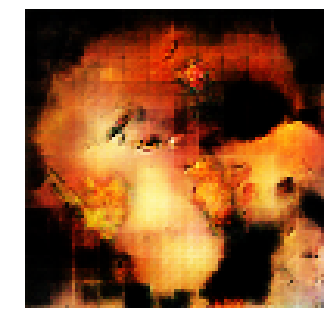


Epoch: 37660, D: -4.488, G: 3.682
Epoch: 37661, D: -5.143, G: 2.882
Epoch: 37662, D: -7.952, G: 3.614
Epoch: 37663, D: -6.132, G: 2.62
Epoch: 37664, D: -6.152, G: 4.59
Epoch: 37665, D: -7.357, G: 3.403
Epoch: 37666, D: -6.107, G: 3.167
Epoch: 37667, D: -6.883, G: 4.806
Epoch: 37668, D: -6.274, G: 3.804
Epoch: 37669, D: -7.902, G: 4.977
Epoch: 37670, D: -4.986, G: 4.703
Epoch: 37671, D: -7.343, G: 4.973
Epoch: 37672, D: -7.327, G: 1.012
Epoch: 37673, D: -7.326, G: 3.053
Epoch: 37674, D: -6.75, G: 4.356
Epoch: 37675, D: -6.264, G: 4.501
Epoch: 37676, D: -7.5, G: 6.636
Epoch: 37677, D: -7.127, G: 2.647
Epoch: 37678, D: -6.262, G: 3.733
Epoch: 37679, D: -6.375, G: 3.57


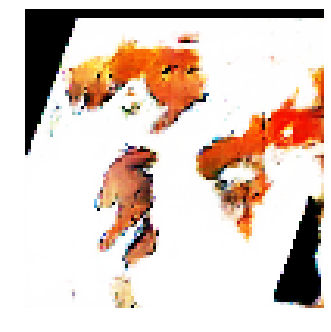


Epoch: 37680, D: -5.51, G: 6.351
Epoch: 37681, D: -5.614, G: 2.298
Epoch: 37682, D: -6.242, G: 4.141
Epoch: 37683, D: -7.4, G: 2.388
Epoch: 37684, D: -5.608, G: 2.797
Epoch: 37685, D: -6.932, G: 3.651
Epoch: 37686, D: -6.32, G: 1.238
Epoch: 37687, D: -7.393, G: 3.797
Epoch: 37688, D: -6.944, G: 3.029
Epoch: 37689, D: -5.806, G: 1.486
Epoch: 37690, D: -4.887, G: 3.966
Epoch: 37691, D: -5.002, G: 4.455
Epoch: 37692, D: -5.811, G: 3.046
Epoch: 37693, D: -6.929, G: 4.666
Epoch: 37694, D: -5.012, G: 4.318
Epoch: 37695, D: -7.084, G: 4.423
Epoch: 37696, D: -6.285, G: 3.991
Epoch: 37697, D: -6.679, G: 2.688
Epoch: 37698, D: -5.623, G: 2.867
Epoch: 37699, D: -6.679, G: 3.321


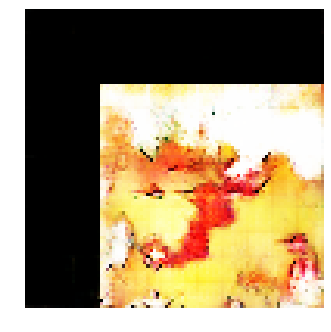


Epoch: 37700, D: -9.083, G: 3.927
Epoch: 37701, D: -4.952, G: 3.107
Epoch: 37702, D: -6.235, G: 3.99
Epoch: 37703, D: -6.7, G: 4.503
Epoch: 37704, D: -4.874, G: 3.398
Epoch: 37705, D: -5.751, G: 2.253
Epoch: 37706, D: -6.453, G: 3.698
Epoch: 37707, D: -6.919, G: 2.465
Epoch: 37708, D: -5.583, G: 5.093
Epoch: 37709, D: -6.434, G: 5.493
Epoch: 37710, D: -5.698, G: 3.287
Epoch: 37711, D: -6.08, G: 5.04
Epoch: 37712, D: -4.653, G: 2.28
Epoch: 37713, D: -5.02, G: 4.351
Epoch: 37714, D: -7.582, G: 2.745
Epoch: 37715, D: -6.938, G: 3.601
Epoch: 37716, D: -5.782, G: 3.383
Epoch: 37717, D: -6.971, G: 4.087
Epoch: 37718, D: -8.423, G: 3.248
Epoch: 37719, D: -5.364, G: 4.157


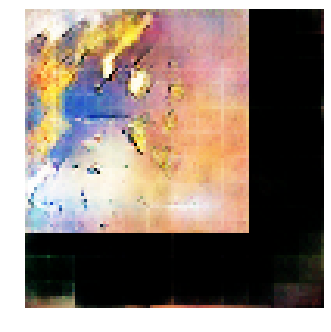


Epoch: 37720, D: -7.954, G: 4.79
Epoch: 37721, D: -6.533, G: 3.829
Epoch: 37722, D: -7.282, G: 4.104
Epoch: 37723, D: -7.145, G: 3.971
Epoch: 37724, D: -5.826, G: 5.844
Epoch: 37725, D: -8.25, G: 1.177
Epoch: 37726, D: -7.102, G: 3.811
Epoch: 37727, D: -7.355, G: 2.171
Epoch: 37728, D: -7.726, G: 7.717
Epoch: 37729, D: -6.786, G: 4.773
Epoch: 37730, D: -4.186, G: 4.986
Epoch: 37731, D: -5.257, G: 5.729
Epoch: 37732, D: -5.688, G: 5.04
Epoch: 37733, D: -5.391, G: 3.6
Epoch: 37734, D: -7.04, G: 2.47
Epoch: 37735, D: -6.761, G: 2.24
Epoch: 37736, D: -5.948, G: 2.989
Epoch: 37737, D: -6.946, G: 4.532
Epoch: 37738, D: -6.249, G: 5.356
Epoch: 37739, D: -6.484, G: 4.074


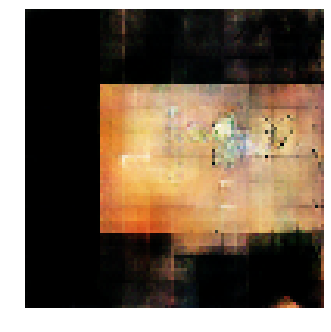


Epoch: 37740, D: -5.368, G: 2.844
Epoch: 37741, D: -6.006, G: 3.835
Epoch: 37742, D: -6.692, G: 2.899
Epoch: 37743, D: -6.535, G: 3.948
Epoch: 37744, D: -5.499, G: 2.981
Epoch: 37745, D: -6.701, G: 3.877
Epoch: 37746, D: -5.037, G: 1.998
Epoch: 37747, D: -6.015, G: 4.807
Epoch: 37748, D: -6.497, G: 4.648
Epoch: 37749, D: -6.661, G: 2.921
Epoch: 37750, D: -5.395, G: 2.916
Epoch: 37751, D: -6.355, G: 3.239
Epoch: 37752, D: -7.401, G: 3.076
Epoch: 37753, D: -7.62, G: 3.017
Epoch: 37754, D: -5.899, G: 2.682
Epoch: 37755, D: -6.455, G: 5.261
Epoch: 37756, D: -6.201, G: 5.27
Epoch: 37757, D: -7.89, G: 3.076
Epoch: 37758, D: -6.585, G: 4.239
Epoch: 37759, D: -4.896, G: 4.349


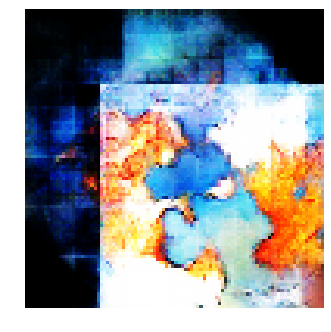


Epoch: 37760, D: -6.365, G: 3.428
Epoch: 37761, D: -7.563, G: 3.846
Epoch: 37762, D: -5.665, G: 3.523
Epoch: 37763, D: -5.142, G: 1.98
Epoch: 37764, D: -6.332, G: 3.898
Epoch: 37765, D: -7.416, G: 2.571
Epoch: 37766, D: -6.161, G: 0.8499
Epoch: 37767, D: -5.739, G: 2.376
Epoch: 37768, D: -7.463, G: 1.294
Epoch: 37769, D: -5.756, G: 2.627
Epoch: 37770, D: -6.843, G: 3.444
Epoch: 37771, D: -4.499, G: 4.223
Epoch: 37772, D: -5.57, G: 4.637
Epoch: 37773, D: -7.041, G: 4.024
Epoch: 37774, D: -5.785, G: 3.704
Epoch: 37775, D: -5.824, G: 3.96
Epoch: 37776, D: -5.007, G: 4.056
Epoch: 37777, D: -8.164, G: 2.811
Epoch: 37778, D: -7.121, G: 2.083
Epoch: 37779, D: -6.6, G: 2.848


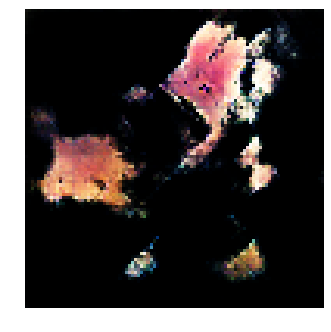


Epoch: 37780, D: -7.1, G: 3.195
Epoch: 37781, D: -6.768, G: 4.608
Epoch: 37782, D: -5.941, G: 4.051
Epoch: 37783, D: -5.999, G: 3.754
Epoch: 37784, D: -5.438, G: 3.086
Epoch: 37785, D: -7.258, G: 3.813
Epoch: 37786, D: -7.685, G: 3.614
Epoch: 37787, D: -5.029, G: 3.855
Epoch: 37788, D: -4.371, G: 4.044
Epoch: 37789, D: -4.577, G: 3.478
Epoch: 37790, D: -5.914, G: 4.898
Epoch: 37791, D: -7.873, G: 3.567
Epoch: 37792, D: -6.314, G: 3.104
Epoch: 37793, D: -5.873, G: 5.411
Epoch: 37794, D: -5.759, G: 4.739
Epoch: 37795, D: -6.506, G: 4.504
Epoch: 37796, D: -6.478, G: 4.721
Epoch: 37797, D: -5.378, G: 3.39
Epoch: 37798, D: -4.854, G: 4.379
Epoch: 37799, D: -5.74, G: 3.749


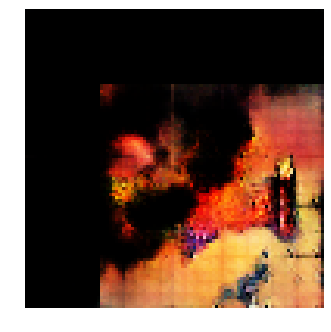


Epoch: 37800, D: -6.167, G: 3.414
Epoch: 37801, D: -7.065, G: 3.849
Epoch: 37802, D: -6.687, G: 4.276
Epoch: 37803, D: -4.987, G: 3.243
Epoch: 37804, D: -6.8, G: 2.289
Epoch: 37805, D: -7.004, G: 4.332
Epoch: 37806, D: -5.367, G: 3.461
Epoch: 37807, D: -5.432, G: 4.272
Epoch: 37808, D: -4.983, G: 3.25
Epoch: 37809, D: -6.426, G: 3.607
Epoch: 37810, D: -4.878, G: 2.571
Epoch: 37811, D: -6.657, G: 3.899
Epoch: 37812, D: -7.373, G: 2.098
Epoch: 37813, D: -6.568, G: 4.321
Epoch: 37814, D: -5.655, G: 2.587
Epoch: 37815, D: -6.225, G: 2.608
Epoch: 37816, D: -7.39, G: 4.032
Epoch: 37817, D: -6.001, G: 2.579
Epoch: 37818, D: -5.749, G: 4.781
Epoch: 37819, D: -6.829, G: 3.401


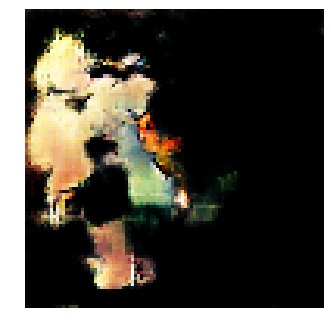


Epoch: 37820, D: -4.806, G: 3.177
Epoch: 37821, D: -6.304, G: 2.652
Epoch: 37822, D: -6.929, G: 5.125
Epoch: 37823, D: -6.802, G: 2.913
Epoch: 37824, D: -6.095, G: 5.145
Epoch: 37825, D: -6.83, G: 3.223
Epoch: 37826, D: -4.916, G: 4.319
Epoch: 37827, D: -5.64, G: 5.053
Epoch: 37828, D: -6.275, G: 2.331
Epoch: 37829, D: -6.389, G: 3.443
Epoch: 37830, D: -6.411, G: 3.4
Epoch: 37831, D: -5.839, G: 2.789
Epoch: 37832, D: -6.464, G: 3.059
Epoch: 37833, D: -6.01, G: 4.11
Epoch: 37834, D: -5.045, G: 4.449
Epoch: 37835, D: -7.229, G: 4.392
Epoch: 37836, D: -6.7, G: 3.781
Epoch: 37837, D: -5.776, G: 3.703
Epoch: 37838, D: -5.782, G: 2.577
Epoch: 37839, D: -5.085, G: 4.816


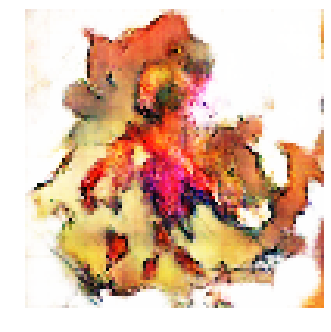


Epoch: 37840, D: -5.043, G: 4.452
Epoch: 37841, D: -5.965, G: 3.526
Epoch: 37842, D: -6.037, G: 2.539
Epoch: 37843, D: -4.575, G: 3.647
Epoch: 37844, D: -8.081, G: 3.882
Epoch: 37845, D: -6.446, G: 2.461
Epoch: 37846, D: -5.391, G: 3.758
Epoch: 37847, D: -6.64, G: 3.876
Epoch: 37848, D: -5.61, G: 3.559
Epoch: 37849, D: -6.614, G: 4.682
Epoch: 37850, D: -6.092, G: 3.307
Epoch: 37851, D: -6.658, G: 3.341
Epoch: 37852, D: -5.654, G: 2.947
Epoch: 37853, D: -7.598, G: 1.909
Epoch: 37854, D: -4.398, G: 3.726
Epoch: 37855, D: -5.708, G: 3.042
Epoch: 37856, D: -7.728, G: 5.408
Epoch: 37857, D: -6.792, G: 5.057
Epoch: 37858, D: -7.356, G: 4.175
Epoch: 37859, D: -5.437, G: 4.025


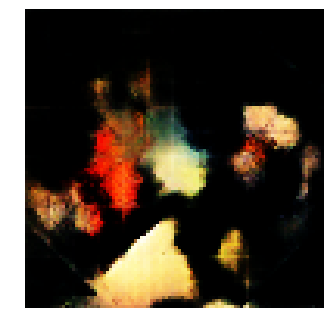


Epoch: 37860, D: -6.529, G: 4.85
Epoch: 37861, D: -5.981, G: 5.353
Epoch: 37862, D: -6.498, G: 4.897
Epoch: 37863, D: -4.436, G: 3.464
Epoch: 37864, D: -7.744, G: 3.191
Epoch: 37865, D: -5.291, G: 4.02
Epoch: 37866, D: -6.206, G: 4.298
Epoch: 37867, D: -6.672, G: 4.053
Epoch: 37868, D: -5.214, G: 2.419
Epoch: 37869, D: -6.329, G: 3.997
Epoch: 37870, D: -6.119, G: 4.709
Epoch: 37871, D: -5.838, G: 4.124
Epoch: 37872, D: -5.665, G: 4.705
Epoch: 37873, D: -6.302, G: 5.575
Epoch: 37874, D: -6.045, G: 3.58
Epoch: 37875, D: -5.786, G: 4.546
Epoch: 37876, D: -6.266, G: 4.772
Epoch: 37877, D: -6.587, G: 4.491
Epoch: 37878, D: -7.147, G: 4.405
Epoch: 37879, D: -7.055, G: 4.281


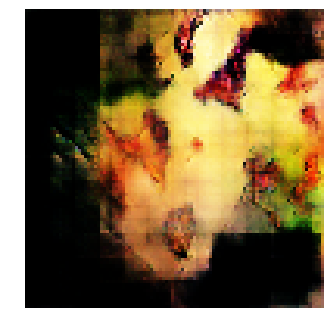


Epoch: 37880, D: -6.949, G: 6.216
Epoch: 37881, D: -6.574, G: 3.207
Epoch: 37882, D: -6.064, G: 4.584
Epoch: 37883, D: -7.477, G: 4.582
Epoch: 37884, D: -5.717, G: 4.115
Epoch: 37885, D: -6.891, G: 2.431
Epoch: 37886, D: -6.139, G: 3.556
Epoch: 37887, D: -6.179, G: 3.607
Epoch: 37888, D: -5.184, G: 2.794
Epoch: 37889, D: -5.627, G: 3.041
Epoch: 37890, D: -7.774, G: 3.474
Epoch: 37891, D: -6.14, G: 1.861
Epoch: 37892, D: -6.658, G: 3.356
Epoch: 37893, D: -6.831, G: 3.251
Epoch: 37894, D: -6.091, G: 2.976
Epoch: 37895, D: -6.6, G: 4.562
Epoch: 37896, D: -7.462, G: 2.747
Epoch: 37897, D: -5.604, G: 3.509
Epoch: 37898, D: -5.834, G: 5.597
Epoch: 37899, D: -7.309, G: 1.504


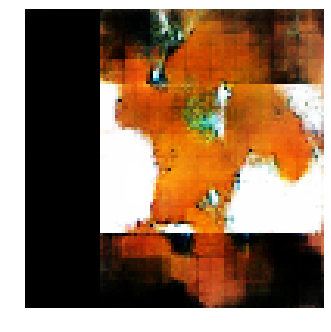


Epoch: 37900, D: -6.112, G: 4.333
Epoch: 37901, D: -4.883, G: 3.866
Epoch: 37902, D: -6.896, G: 4.512
Epoch: 37903, D: -6.288, G: 4.742
Epoch: 37904, D: -5.885, G: 4.618
Epoch: 37905, D: -6.255, G: 3.668
Epoch: 37906, D: -6.482, G: 3.391
Epoch: 37907, D: -6.894, G: 4.188
Epoch: 37908, D: -6.387, G: 2.227
Epoch: 37909, D: -6.118, G: 3.127
Epoch: 37910, D: -6.079, G: 2.48
Epoch: 37911, D: -5.888, G: 4.029
Epoch: 37912, D: -6.833, G: 4.669
Epoch: 37913, D: -4.737, G: 5.662
Epoch: 37914, D: -8.767, G: 3.927
Epoch: 37915, D: -5.74, G: 3.407
Epoch: 37916, D: -5.807, G: 4.123
Epoch: 37917, D: -6.804, G: 2.775
Epoch: 37918, D: -4.992, G: 4.342
Epoch: 37919, D: -5.499, G: 3.022


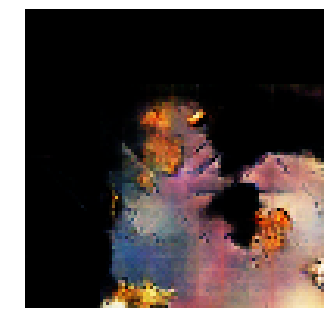


Epoch: 37920, D: -6.846, G: 2.78
Epoch: 37921, D: -6.106, G: 2.13
Epoch: 37922, D: -5.561, G: 4.218
Epoch: 37923, D: -5.296, G: 3.146
Epoch: 37924, D: -5.799, G: 1.912
Epoch: 37925, D: -5.914, G: 3.53
Epoch: 37926, D: -4.747, G: 4.086
Epoch: 37927, D: -5.644, G: 3.152
Epoch: 37928, D: -5.645, G: 2.179
Epoch: 37929, D: -5.404, G: 2.097
Epoch: 37930, D: -5.925, G: 5.484
Epoch: 37931, D: -7.676, G: 4.186
Epoch: 37932, D: -6.059, G: 4.058
Epoch: 37933, D: -6.648, G: 1.518
Epoch: 37934, D: -6.9, G: 3.348
Epoch: 37935, D: -6.925, G: 3.657
Epoch: 37936, D: -5.875, G: 3.26
Epoch: 37937, D: -8.516, G: 4.303
Epoch: 37938, D: -6.37, G: 3.858
Epoch: 37939, D: -5.368, G: 3.7


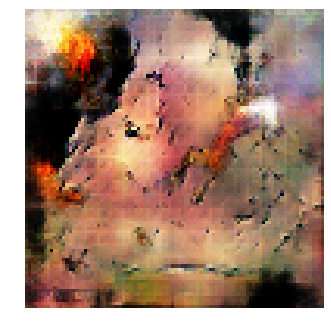


Epoch: 37940, D: -5.63, G: 3.897
Epoch: 37941, D: -6.533, G: 4.04
Epoch: 37942, D: -6.782, G: 3.352
Epoch: 37943, D: -6.05, G: 3.482
Epoch: 37944, D: -8.033, G: 3.576
Epoch: 37945, D: -5.437, G: 3.124
Epoch: 37946, D: -5.901, G: 4.001
Epoch: 37947, D: -5.613, G: 3.927
Epoch: 37948, D: -6.536, G: 4.494
Epoch: 37949, D: -6.889, G: 2.273
Epoch: 37950, D: -5.091, G: 3.06
Epoch: 37951, D: -4.602, G: 3.177
Epoch: 37952, D: -6.083, G: 4.564
Epoch: 37953, D: -6.837, G: 5.068
Epoch: 37954, D: -6.947, G: 4.165
Epoch: 37955, D: -6.988, G: 3.83
Epoch: 37956, D: -6.756, G: 4.93
Epoch: 37957, D: -6.602, G: 6.956
Epoch: 37958, D: -6.138, G: 4.398
Epoch: 37959, D: -5.768, G: 3.817


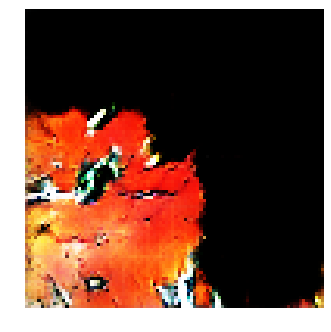


Epoch: 37960, D: -5.855, G: 3.327
Epoch: 37961, D: -6.845, G: 4.416
Epoch: 37962, D: -6.403, G: 4.175
Epoch: 37963, D: -4.597, G: 4.041
Epoch: 37964, D: -5.791, G: 4.059
Epoch: 37965, D: -6.837, G: 3.915
Epoch: 37966, D: -6.092, G: 3.158
Epoch: 37967, D: -6.909, G: 3.236
Epoch: 37968, D: -7.441, G: 4.828
Epoch: 37969, D: -6.763, G: 4.115
Epoch: 37970, D: -7.321, G: 5.482
Epoch: 37971, D: -5.635, G: 3.697
Epoch: 37972, D: -6.673, G: 3.256
Epoch: 37973, D: -6.805, G: 2.798
Epoch: 37974, D: -5.408, G: 3.583
Epoch: 37975, D: -6.092, G: 5.341
Epoch: 37976, D: -6.683, G: 4.797
Epoch: 37977, D: -5.976, G: 3.671
Epoch: 37978, D: -4.929, G: 5.171
Epoch: 37979, D: -7.302, G: 5.415


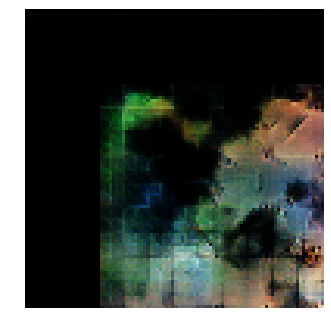


Epoch: 37980, D: -7.301, G: 3.704
Epoch: 37981, D: -5.873, G: 4.07
Epoch: 37982, D: -7.094, G: 4.241
Epoch: 37983, D: -5.681, G: 1.855
Epoch: 37984, D: -6.955, G: 4.363
Epoch: 37985, D: -6.801, G: 3.877
Epoch: 37986, D: -7.772, G: 3.163
Epoch: 37987, D: -5.728, G: 3.148
Epoch: 37988, D: -6.039, G: 3.333
Epoch: 37989, D: -5.936, G: 1.77
Epoch: 37990, D: -6.116, G: 3.605
Epoch: 37991, D: -5.376, G: 3.835
Epoch: 37992, D: -5.613, G: 4.158
Epoch: 37993, D: -7.266, G: 3.778
Epoch: 37994, D: -6.444, G: 1.966
Epoch: 37995, D: -5.849, G: 2.336
Epoch: 37996, D: -6.406, G: 2.049
Epoch: 37997, D: -5.883, G: 3.379
Epoch: 37998, D: -7.196, G: 3.563
Epoch: 37999, D: -6.057, G: 3.644


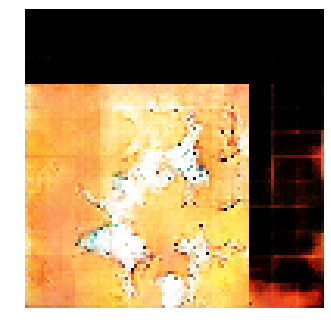


Epoch: 38000, D: -5.419, G: 2.983
Epoch: 38001, D: -4.686, G: 2.737
Epoch: 38002, D: -4.854, G: 2.771
Epoch: 38003, D: -5.812, G: 4.287
Epoch: 38004, D: -6.183, G: 2.701
Epoch: 38005, D: -6.368, G: 4.431
Epoch: 38006, D: -7.354, G: 2.423
Epoch: 38007, D: -5.209, G: 3.197
Epoch: 38008, D: -5.584, G: 3.764
Epoch: 38009, D: -6.434, G: 3.516
Epoch: 38010, D: -5.349, G: 3.89
Epoch: 38011, D: -6.316, G: 3.954
Epoch: 38012, D: -6.535, G: 2.921
Epoch: 38013, D: -5.542, G: 5.561
Epoch: 38014, D: -7.099, G: 2.953
Epoch: 38015, D: -6.956, G: 4.069
Epoch: 38016, D: -6.411, G: 2.906
Epoch: 38017, D: -5.45, G: 3.087
Epoch: 38018, D: -5.305, G: 1.718
Epoch: 38019, D: -7.43, G: 2.659


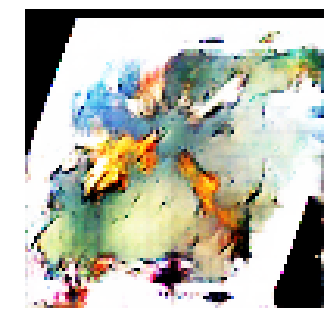


Epoch: 38020, D: -5.001, G: 1.942
Epoch: 38021, D: -6.001, G: 3.519
Epoch: 38022, D: -6.94, G: 3.021
Epoch: 38023, D: -6.065, G: 2.638
Epoch: 38024, D: -5.012, G: 4.051
Epoch: 38025, D: -5.528, G: 3.236
Epoch: 38026, D: -7.204, G: 3.225
Epoch: 38027, D: -5.028, G: 6.071
Epoch: 38028, D: -6.486, G: 4.123
Epoch: 38029, D: -6.521, G: 3.831
Epoch: 38030, D: -5.693, G: 4.959
Epoch: 38031, D: -7.296, G: 4.803
Epoch: 38032, D: -6.052, G: 4.757
Epoch: 38033, D: -6.149, G: 5.03
Epoch: 38034, D: -6.102, G: 3.76
Epoch: 38035, D: -5.561, G: 3.978
Epoch: 38036, D: -6.282, G: 4.425
Epoch: 38037, D: -6.306, G: 2.836
Epoch: 38038, D: -5.28, G: 5.205
Epoch: 38039, D: -6.13, G: 4.613


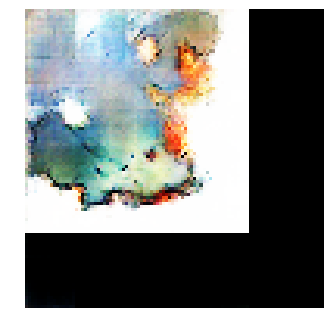


Epoch: 38040, D: -5.364, G: 2.843
Epoch: 38041, D: -5.57, G: 3.856
Epoch: 38042, D: -5.39, G: 3.559
Epoch: 38043, D: -6.842, G: 4.071
Epoch: 38044, D: -8.089, G: 0.873
Epoch: 38045, D: -6.504, G: 1.525
Epoch: 38046, D: -4.774, G: 3.617
Epoch: 38047, D: -6.988, G: 4.76
Epoch: 38048, D: -5.622, G: 3.687
Epoch: 38049, D: -6.163, G: 3.131
Epoch: 38050, D: -6.624, G: 2.988
Epoch: 38051, D: -6.453, G: 5.384
Epoch: 38052, D: -6.303, G: 3.173
Epoch: 38053, D: -4.808, G: 2.931
Epoch: 38054, D: -5.41, G: 3.305
Epoch: 38055, D: -5.414, G: 4.737
Epoch: 38056, D: -6.109, G: 1.515
Epoch: 38057, D: -6.889, G: 5.362
Epoch: 38058, D: -6.913, G: 3.732
Epoch: 38059, D: -3.774, G: 4.23


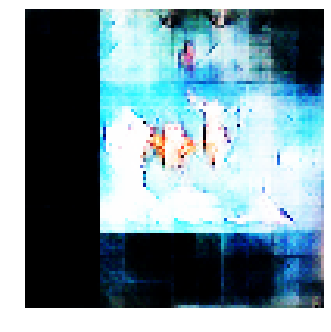


Epoch: 38060, D: -5.535, G: 4.545
Epoch: 38061, D: -6.31, G: 3.544
Epoch: 38062, D: -7.156, G: 4.106
Epoch: 38063, D: -6.338, G: 3.951
Epoch: 38064, D: -7.956, G: 3.645
Epoch: 38065, D: -5.497, G: 4.837
Epoch: 38066, D: -5.37, G: 4.946
Epoch: 38067, D: -8.011, G: 4.835
Epoch: 38068, D: -5.439, G: 3.901
Epoch: 38069, D: -5.766, G: 3.18
Epoch: 38070, D: -6.936, G: 5.931
Epoch: 38071, D: -5.161, G: 5.457
Epoch: 38072, D: -6.331, G: 5.14
Epoch: 38073, D: -4.816, G: 4.28
Epoch: 38074, D: -7.053, G: 3.919
Epoch: 38075, D: -5.461, G: 1.903
Epoch: 38076, D: -5.492, G: 3.52
Epoch: 38077, D: -6.787, G: 2.234
Epoch: 38078, D: -5.176, G: 3.205
Epoch: 38079, D: -5.025, G: 2.73


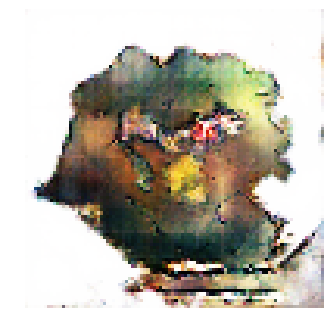


Epoch: 38080, D: -5.986, G: 2.922
Epoch: 38081, D: -5.795, G: 2.835
Epoch: 38082, D: -6.503, G: 3.497
Epoch: 38083, D: -5.147, G: 2.953
Epoch: 38084, D: -7.035, G: 3.496
Epoch: 38085, D: -7.318, G: 4.004
Epoch: 38086, D: -6.698, G: 3.953
Epoch: 38087, D: -5.321, G: 3.194
Epoch: 38088, D: -5.512, G: 5.012
Epoch: 38089, D: -4.662, G: 2.975
Epoch: 38090, D: -6.314, G: 4.329
Epoch: 38091, D: -7.138, G: 4.271
Epoch: 38092, D: -6.413, G: 4.418
Epoch: 38093, D: -6.199, G: 3.945
Epoch: 38094, D: -6.187, G: 2.95
Epoch: 38095, D: -7.112, G: 4.073
Epoch: 38096, D: -6.586, G: 3.536
Epoch: 38097, D: -7.405, G: 2.839
Epoch: 38098, D: -5.96, G: 0.5443
Epoch: 38099, D: -5.939, G: 1.702


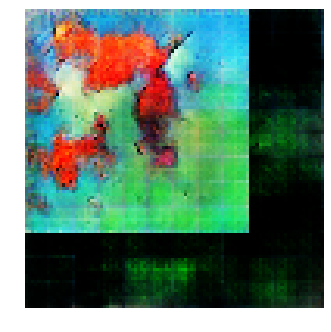


Epoch: 38100, D: -6.782, G: 2.641
Epoch: 38101, D: -6.126, G: 2.646
Epoch: 38102, D: -7.608, G: 2.695
Epoch: 38103, D: -8.016, G: 1.647
Epoch: 38104, D: -5.86, G: 3.528
Epoch: 38105, D: -5.904, G: 3.142
Epoch: 38106, D: -7.048, G: 2.913
Epoch: 38107, D: -4.447, G: 3.621
Epoch: 38108, D: -5.534, G: 3.946
Epoch: 38109, D: -6.782, G: 5.48
Epoch: 38110, D: -6.558, G: 3.881
Epoch: 38111, D: -5.277, G: 5.073
Epoch: 38112, D: -6.285, G: 4.046
Epoch: 38113, D: -6.286, G: 4.194
Epoch: 38114, D: -6.957, G: 2.292
Epoch: 38115, D: -5.454, G: 3.427
Epoch: 38116, D: -5.881, G: 3.831
Epoch: 38117, D: -6.505, G: 3.051
Epoch: 38118, D: -6.71, G: 3.371
Epoch: 38119, D: -6.111, G: 3.135


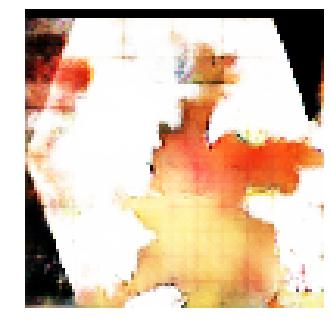


Epoch: 38120, D: -5.541, G: 4.898
Epoch: 38121, D: -6.847, G: 5.343
Epoch: 38122, D: -7.09, G: 3.01
Epoch: 38123, D: -6.172, G: 3.518
Epoch: 38124, D: -6.105, G: 3.286
Epoch: 38125, D: -8.143, G: 2.528
Epoch: 38126, D: -5.493, G: 3.12
Epoch: 38127, D: -5.568, G: 5.336
Epoch: 38128, D: -5.968, G: 5.308
Epoch: 38129, D: -5.127, G: 4.44
Epoch: 38130, D: -5.87, G: 6.059
Epoch: 38131, D: -3.857, G: 4.755
Epoch: 38132, D: -4.872, G: 3.012
Epoch: 38133, D: -7.323, G: 3.0
Epoch: 38134, D: -5.443, G: 5.667
Epoch: 38135, D: -5.348, G: 3.143
Epoch: 38136, D: -6.795, G: 3.466
Epoch: 38137, D: -5.872, G: 4.719
Epoch: 38138, D: -7.701, G: 3.209
Epoch: 38139, D: -8.085, G: 4.827


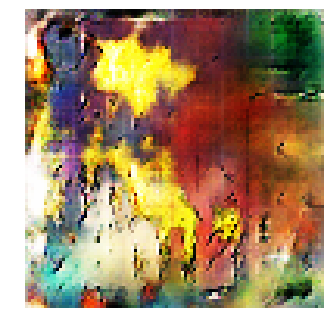


Epoch: 38140, D: -5.208, G: 3.669
Epoch: 38141, D: -5.221, G: 4.2
Epoch: 38142, D: -6.397, G: 3.539
Epoch: 38143, D: -5.508, G: 1.958
Epoch: 38144, D: -6.559, G: 2.105
Epoch: 38145, D: -6.796, G: 4.445
Epoch: 38146, D: -5.049, G: 4.751
Epoch: 38147, D: -6.939, G: 4.232
Epoch: 38148, D: -4.61, G: 3.62
Epoch: 38149, D: -5.188, G: 2.896
Epoch: 38150, D: -8.306, G: 3.641
Epoch: 38151, D: -6.756, G: 1.529
Epoch: 38152, D: -5.104, G: 3.688
Epoch: 38153, D: -7.102, G: 6.094
Epoch: 38154, D: -6.024, G: 2.655
Epoch: 38155, D: -6.569, G: 3.737
Epoch: 38156, D: -6.331, G: 4.115
Epoch: 38157, D: -6.847, G: 2.943
Epoch: 38158, D: -7.347, G: 3.952
Epoch: 38159, D: -6.658, G: 3.277


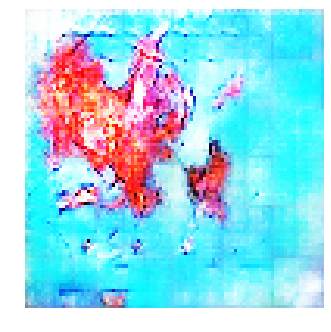


Epoch: 38160, D: -6.176, G: 2.29
Epoch: 38161, D: -5.342, G: 4.117
Epoch: 38162, D: -5.705, G: 2.529
Epoch: 38163, D: -7.185, G: 3.364
Epoch: 38164, D: -6.833, G: 4.345
Epoch: 38165, D: -5.369, G: 3.974
Epoch: 38166, D: -5.702, G: 4.502
Epoch: 38167, D: -5.277, G: 3.131
Epoch: 38168, D: -7.264, G: 3.58
Epoch: 38169, D: -7.378, G: 5.104
Epoch: 38170, D: -6.614, G: 3.604
Epoch: 38171, D: -5.167, G: 5.351
Epoch: 38172, D: -6.894, G: 5.697
Epoch: 38173, D: -5.586, G: 6.841
Epoch: 38174, D: -7.897, G: 4.639
Epoch: 38175, D: -4.802, G: 3.183
Epoch: 38176, D: -5.805, G: 3.496
Epoch: 38177, D: -6.552, G: 4.083
Epoch: 38178, D: -7.709, G: 5.404
Epoch: 38179, D: -7.333, G: 2.578


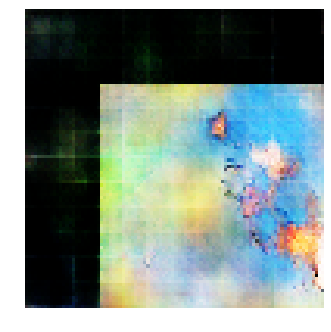


Epoch: 38180, D: -6.26, G: 3.944
Epoch: 38181, D: -8.297, G: 4.034
Epoch: 38182, D: -6.245, G: 3.57
Epoch: 38183, D: -7.021, G: 4.1
Epoch: 38184, D: -5.119, G: 3.412
Epoch: 38185, D: -6.058, G: 3.213
Epoch: 38186, D: -6.261, G: 4.26
Epoch: 38187, D: -5.765, G: 3.748
Epoch: 38188, D: -6.766, G: 4.1
Epoch: 38189, D: -5.572, G: 2.517
Epoch: 38190, D: -5.687, G: 4.099
Epoch: 38191, D: -5.954, G: 2.664
Epoch: 38192, D: -6.921, G: 4.084
Epoch: 38193, D: -7.046, G: 2.882
Epoch: 38194, D: -6.375, G: 1.771
Epoch: 38195, D: -5.932, G: 4.828
Epoch: 38196, D: -5.431, G: 2.563
Epoch: 38197, D: -5.781, G: 4.099
Epoch: 38198, D: -7.292, G: 4.142
Epoch: 38199, D: -6.103, G: 4.71


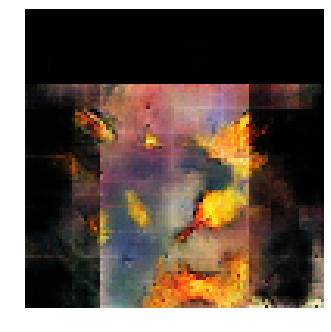


Epoch: 38200, D: -5.646, G: 4.428
Epoch: 38201, D: -5.661, G: 7.038
Epoch: 38202, D: -5.865, G: 5.184
Epoch: 38203, D: -5.197, G: 4.824
Epoch: 38204, D: -6.188, G: 3.854
Epoch: 38205, D: -7.517, G: 4.999
Epoch: 38206, D: -6.194, G: 3.815
Epoch: 38207, D: -5.938, G: 4.181
Epoch: 38208, D: -6.47, G: 3.543
Epoch: 38209, D: -6.046, G: 3.671
Epoch: 38210, D: -5.862, G: 4.219
Epoch: 38211, D: -5.928, G: 4.159
Epoch: 38212, D: -5.624, G: 5.084
Epoch: 38213, D: -6.303, G: 5.395
Epoch: 38214, D: -6.125, G: 4.462
Epoch: 38215, D: -4.983, G: 3.29
Epoch: 38216, D: -6.9, G: 4.289
Epoch: 38217, D: -6.594, G: 3.847
Epoch: 38218, D: -6.661, G: 5.216
Epoch: 38219, D: -5.971, G: 2.883


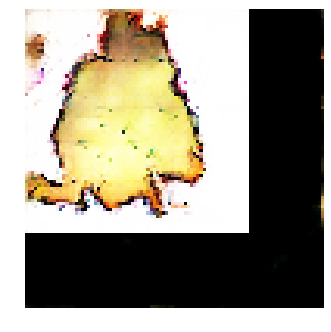


Epoch: 38220, D: -6.955, G: 2.697
Epoch: 38221, D: -5.471, G: 3.417
Epoch: 38222, D: -6.842, G: 3.522
Epoch: 38223, D: -5.875, G: 4.866
Epoch: 38224, D: -7.22, G: 4.133
Epoch: 38225, D: -6.71, G: 3.629
Epoch: 38226, D: -4.644, G: 5.519
Epoch: 38227, D: -6.91, G: 4.0
Epoch: 38228, D: -5.765, G: 4.927
Epoch: 38229, D: -6.522, G: 4.411
Epoch: 38230, D: -7.084, G: 3.648
Epoch: 38231, D: -7.648, G: 3.534
Epoch: 38232, D: -6.364, G: 2.754
Epoch: 38233, D: -6.229, G: 2.447
Epoch: 38234, D: -8.158, G: 3.811
Epoch: 38235, D: -5.277, G: 2.707
Epoch: 38236, D: -4.586, G: 2.553
Epoch: 38237, D: -7.098, G: 3.741
Epoch: 38238, D: -6.453, G: 3.907
Epoch: 38239, D: -5.852, G: 1.97


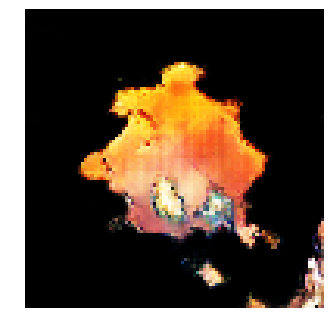


Epoch: 38240, D: -5.53, G: 3.138
Epoch: 38241, D: -7.192, G: 3.459
Epoch: 38242, D: -6.319, G: 3.396
Epoch: 38243, D: -6.02, G: 3.171
Epoch: 38244, D: -5.304, G: 3.487
Epoch: 38245, D: -5.712, G: 2.113
Epoch: 38246, D: -6.476, G: 2.744
Epoch: 38247, D: -5.67, G: 3.756
Epoch: 38248, D: -5.179, G: 1.829
Epoch: 38249, D: -4.471, G: 3.707
Epoch: 38250, D: -7.446, G: 3.74
Epoch: 38251, D: -4.17, G: 2.691
Epoch: 38252, D: -6.008, G: 3.377
Epoch: 38253, D: -6.555, G: 4.65
Epoch: 38254, D: -5.377, G: 4.834
Epoch: 38255, D: -5.664, G: 3.769
Epoch: 38256, D: -7.377, G: 5.532
Epoch: 38257, D: -4.969, G: 2.946
Epoch: 38258, D: -6.038, G: 3.634
Epoch: 38259, D: -4.808, G: 5.311


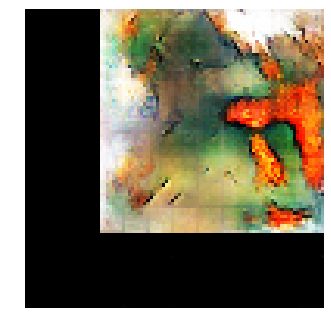


Epoch: 38260, D: -6.086, G: 4.503
Epoch: 38261, D: -5.244, G: 4.873
Epoch: 38262, D: -6.449, G: 5.701
Epoch: 38263, D: -6.452, G: 3.494
Epoch: 38264, D: -6.893, G: 4.044
Epoch: 38265, D: -6.369, G: 5.566
Epoch: 38266, D: -7.475, G: 3.495
Epoch: 38267, D: -5.981, G: 3.819
Epoch: 38268, D: -6.596, G: 3.288
Epoch: 38269, D: -5.803, G: 3.502
Epoch: 38270, D: -6.341, G: 4.712
Epoch: 38271, D: -7.468, G: 1.988
Epoch: 38272, D: -6.231, G: 4.688
Epoch: 38273, D: -5.756, G: 3.46
Epoch: 38274, D: -7.54, G: 3.176
Epoch: 38275, D: -5.881, G: 3.074
Epoch: 38276, D: -6.466, G: 2.938
Epoch: 38277, D: -6.269, G: 4.112
Epoch: 38278, D: -5.327, G: 5.298
Epoch: 38279, D: -6.411, G: 3.965


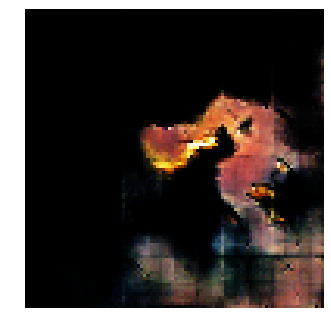


Epoch: 38280, D: -6.384, G: 3.252
Epoch: 38281, D: -8.314, G: 4.224
Epoch: 38282, D: -7.74, G: 1.629
Epoch: 38283, D: -7.619, G: 2.692
Epoch: 38284, D: -7.843, G: 4.594
Epoch: 38285, D: -4.567, G: 6.127
Epoch: 38286, D: -6.474, G: 4.439
Epoch: 38287, D: -5.688, G: 5.551
Epoch: 38288, D: -6.565, G: 5.693
Epoch: 38289, D: -6.916, G: 5.59
Epoch: 38290, D: -6.645, G: 4.204
Epoch: 38291, D: -8.148, G: 4.177
Epoch: 38292, D: -4.334, G: 4.6
Epoch: 38293, D: -6.803, G: 4.632
Epoch: 38294, D: -5.297, G: 2.759
Epoch: 38295, D: -5.893, G: 3.352
Epoch: 38296, D: -6.673, G: 4.616
Epoch: 38297, D: -6.61, G: 0.3345
Epoch: 38298, D: -5.978, G: 4.161
Epoch: 38299, D: -6.645, G: 4.646


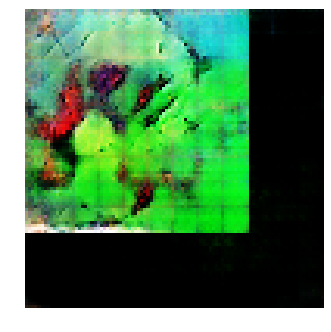


Epoch: 38300, D: -4.854, G: 4.497
Epoch: 38301, D: -7.673, G: 5.559
Epoch: 38302, D: -5.983, G: 4.217
Epoch: 38303, D: -5.392, G: 3.667
Epoch: 38304, D: -5.455, G: 3.662
Epoch: 38305, D: -5.974, G: 5.028
Epoch: 38306, D: -6.002, G: 1.734
Epoch: 38307, D: -5.9, G: 3.034
Epoch: 38308, D: -5.409, G: 4.579
Epoch: 38309, D: -6.907, G: 3.838
Epoch: 38310, D: -6.628, G: 3.251
Epoch: 38311, D: -5.442, G: 4.383
Epoch: 38312, D: -6.148, G: 2.82
Epoch: 38313, D: -6.278, G: 3.583
Epoch: 38314, D: -6.31, G: 3.599
Epoch: 38315, D: -6.253, G: 3.637
Epoch: 38316, D: -5.611, G: 3.964
Epoch: 38317, D: -5.565, G: 3.306
Epoch: 38318, D: -5.51, G: 4.453
Epoch: 38319, D: -5.927, G: 3.671


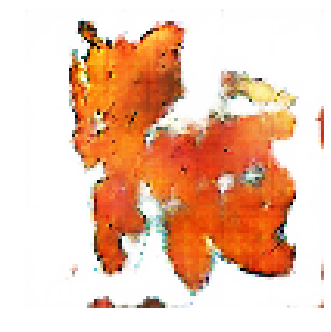


Epoch: 38320, D: -6.535, G: 2.872
Epoch: 38321, D: -5.101, G: 4.175
Epoch: 38322, D: -7.384, G: 5.023
Epoch: 38323, D: -6.019, G: 5.849
Epoch: 38324, D: -4.837, G: 4.545
Epoch: 38325, D: -5.918, G: 5.715
Epoch: 38326, D: -4.802, G: 3.229
Epoch: 38327, D: -4.694, G: 3.726
Epoch: 38328, D: -6.053, G: 4.503
Epoch: 38329, D: -5.572, G: 5.092
Epoch: 38330, D: -5.688, G: 2.328
Epoch: 38331, D: -5.179, G: 5.119
Epoch: 38332, D: -5.748, G: 3.127
Epoch: 38333, D: -7.35, G: 4.862
Epoch: 38334, D: -5.135, G: 2.95
Epoch: 38335, D: -4.928, G: 3.415
Epoch: 38336, D: -4.669, G: 2.469
Epoch: 38337, D: -6.181, G: 4.267
Epoch: 38338, D: -6.258, G: 3.37
Epoch: 38339, D: -6.947, G: 3.497


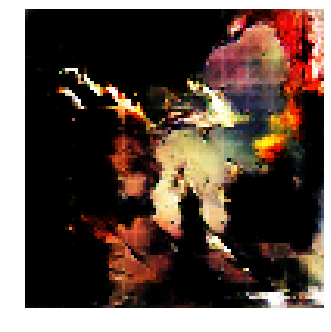


Epoch: 38340, D: -6.174, G: 2.675
Epoch: 38341, D: -5.329, G: 3.114
Epoch: 38342, D: -6.314, G: 3.229
Epoch: 38343, D: -5.472, G: 4.131
Epoch: 38344, D: -7.238, G: 5.132
Epoch: 38345, D: -5.934, G: 4.9
Epoch: 38346, D: -6.144, G: 4.501
Epoch: 38347, D: -6.888, G: 5.364
Epoch: 38348, D: -6.057, G: 3.524
Epoch: 38349, D: -6.196, G: 2.648
Epoch: 38350, D: -5.762, G: 3.621
Epoch: 38351, D: -6.925, G: 6.315
Epoch: 38352, D: -5.661, G: 5.725
Epoch: 38353, D: -5.508, G: 2.571
Epoch: 38354, D: -7.824, G: 4.5
Epoch: 38355, D: -5.237, G: 3.16
Epoch: 38356, D: -5.507, G: 3.778
Epoch: 38357, D: -7.152, G: 5.728
Epoch: 38358, D: -6.255, G: 3.193
Epoch: 38359, D: -5.974, G: 2.83


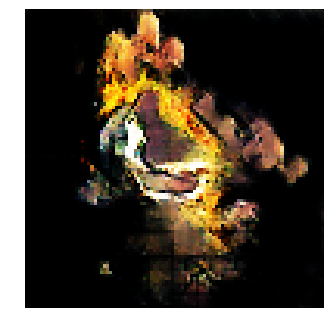


Epoch: 38360, D: -6.336, G: 3.688
Epoch: 38361, D: -6.935, G: 2.904
Epoch: 38362, D: -6.535, G: 3.273
Epoch: 38363, D: -6.323, G: 2.952
Epoch: 38364, D: -6.653, G: 4.119
Epoch: 38365, D: -5.774, G: 3.488
Epoch: 38366, D: -7.33, G: 4.076
Epoch: 38367, D: -6.13, G: 2.781
Epoch: 38368, D: -7.503, G: 3.186
Epoch: 38369, D: -5.346, G: 2.064
Epoch: 38370, D: -6.14, G: 3.178
Epoch: 38371, D: -5.922, G: 3.1
Epoch: 38372, D: -5.826, G: 4.931
Epoch: 38373, D: -5.424, G: 3.157
Epoch: 38374, D: -6.367, G: 4.568
Epoch: 38375, D: -4.672, G: 3.843
Epoch: 38376, D: -6.675, G: 5.374
Epoch: 38377, D: -4.766, G: 2.52
Epoch: 38378, D: -6.06, G: 3.239
Epoch: 38379, D: -5.991, G: 3.402


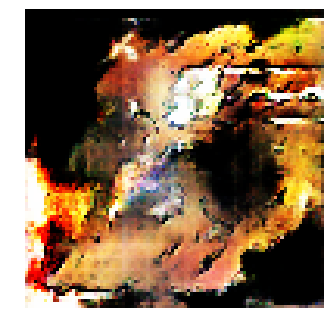


Epoch: 38380, D: -6.25, G: 4.347
Epoch: 38381, D: -5.957, G: 3.744
Epoch: 38382, D: -5.028, G: 5.01
Epoch: 38383, D: -5.705, G: 4.381
Epoch: 38384, D: -3.967, G: 5.754
Epoch: 38385, D: -5.942, G: 3.376
Epoch: 38386, D: -6.891, G: 4.866
Epoch: 38387, D: -7.008, G: 3.647
Epoch: 38388, D: -7.852, G: 3.034
Epoch: 38389, D: -6.008, G: 2.822
Epoch: 38390, D: -6.347, G: 3.267
Epoch: 38391, D: -5.397, G: 3.096
Epoch: 38392, D: -6.116, G: 3.95
Epoch: 38393, D: -7.213, G: 2.326
Epoch: 38394, D: -5.639, G: 2.99
Epoch: 38395, D: -6.202, G: 3.984
Epoch: 38396, D: -5.554, G: 3.929
Epoch: 38397, D: -6.603, G: 4.145
Epoch: 38398, D: -6.592, G: 5.018
Epoch: 38399, D: -9.093, G: 4.735


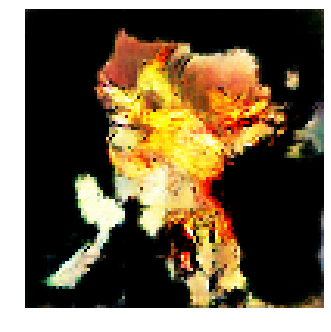


Epoch: 38400, D: -6.608, G: 4.086
Epoch: 38401, D: -7.065, G: 4.782
Epoch: 38402, D: -6.924, G: 2.699
Epoch: 38403, D: -6.961, G: 6.09
Epoch: 38404, D: -7.285, G: 4.767
Epoch: 38405, D: -5.733, G: 5.715
Epoch: 38406, D: -5.947, G: 4.729
Epoch: 38407, D: -6.154, G: 2.729
Epoch: 38408, D: -6.048, G: 5.003
Epoch: 38409, D: -5.409, G: 3.781
Epoch: 38410, D: -5.799, G: 4.81
Epoch: 38411, D: -6.256, G: 6.845
Epoch: 38412, D: -5.11, G: 4.396
Epoch: 38413, D: -6.687, G: 5.171
Epoch: 38414, D: -6.376, G: 2.89
Epoch: 38415, D: -5.548, G: 3.757
Epoch: 38416, D: -7.319, G: 3.071
Epoch: 38417, D: -7.691, G: 4.835
Epoch: 38418, D: -5.803, G: 4.63
Epoch: 38419, D: -6.468, G: 5.964


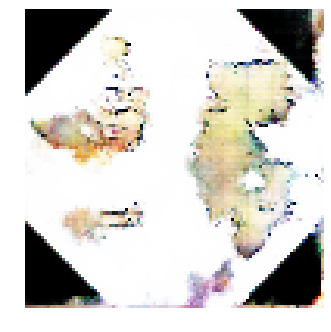


Epoch: 38420, D: -6.2, G: 4.843
Epoch: 38421, D: -5.642, G: 4.638
Epoch: 38422, D: -5.425, G: 2.474
Epoch: 38423, D: -5.527, G: 4.258
Epoch: 38424, D: -7.352, G: 5.33
Epoch: 38425, D: -4.959, G: 1.785
Epoch: 38426, D: -5.984, G: 4.779
Epoch: 38427, D: -6.02, G: 4.261
Epoch: 38428, D: -7.205, G: 3.004
Epoch: 38429, D: -5.934, G: 3.077
Epoch: 38430, D: -6.342, G: 3.947
Epoch: 38431, D: -5.214, G: 3.04
Epoch: 38432, D: -6.883, G: 4.367
Epoch: 38433, D: -5.967, G: 2.339
Epoch: 38434, D: -5.37, G: 4.619
Epoch: 38435, D: -7.056, G: 3.666
Epoch: 38436, D: -6.446, G: 2.137
Epoch: 38437, D: -6.289, G: 2.646
Epoch: 38438, D: -7.658, G: 1.532
Epoch: 38439, D: -6.664, G: 3.172


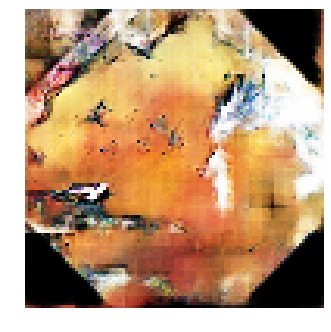


Epoch: 38440, D: -5.82, G: 3.785
Epoch: 38441, D: -6.94, G: 2.864
Epoch: 38442, D: -4.783, G: 5.092
Epoch: 38443, D: -6.477, G: 4.349
Epoch: 38444, D: -5.727, G: 4.684
Epoch: 38445, D: -5.377, G: 3.911
Epoch: 38446, D: -6.428, G: 3.606
Epoch: 38447, D: -6.443, G: 4.547
Epoch: 38448, D: -6.012, G: 3.869
Epoch: 38449, D: -5.985, G: 4.149
Epoch: 38450, D: -5.859, G: 3.35
Epoch: 38451, D: -7.216, G: 5.955
Epoch: 38452, D: -5.722, G: 2.743
Epoch: 38453, D: -7.573, G: 4.004
Epoch: 38454, D: -7.795, G: 2.68
Epoch: 38455, D: -5.962, G: 4.941
Epoch: 38456, D: -7.256, G: 4.455
Epoch: 38457, D: -5.582, G: 2.839
Epoch: 38458, D: -6.303, G: 3.265
Epoch: 38459, D: -6.391, G: 2.957


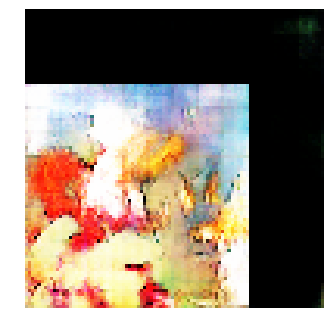


Epoch: 38460, D: -6.262, G: 3.67
Epoch: 38461, D: -6.332, G: 3.488
Epoch: 38462, D: -7.794, G: 2.089
Epoch: 38463, D: -4.806, G: 2.681
Epoch: 38464, D: -6.328, G: 4.212
Epoch: 38465, D: -6.99, G: 3.981
Epoch: 38466, D: -5.581, G: 3.959
Epoch: 38467, D: -5.931, G: 4.068
Epoch: 38468, D: -8.067, G: 3.814
Epoch: 38469, D: -4.843, G: 3.446
Epoch: 38470, D: -5.559, G: 3.338
Epoch: 38471, D: -7.363, G: 4.965
Epoch: 38472, D: -7.391, G: 5.341
Epoch: 38473, D: -5.271, G: 4.893
Epoch: 38474, D: -6.236, G: 5.603
Epoch: 38475, D: -5.573, G: 2.35
Epoch: 38476, D: -5.175, G: 4.657
Epoch: 38477, D: -8.027, G: 4.35
Epoch: 38478, D: -5.698, G: 0.9014
Epoch: 38479, D: -6.534, G: 3.071


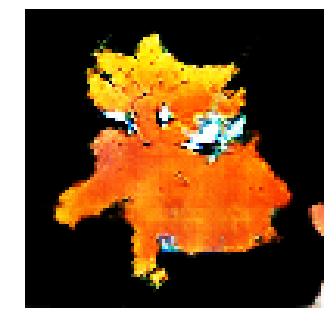


Epoch: 38480, D: -6.928, G: 4.685
Epoch: 38481, D: -5.999, G: 3.515
Epoch: 38482, D: -7.186, G: 5.417
Epoch: 38483, D: -6.21, G: 2.292
Epoch: 38484, D: -6.82, G: 3.961
Epoch: 38485, D: -6.644, G: 5.007
Epoch: 38486, D: -6.226, G: 3.227
Epoch: 38487, D: -5.634, G: 2.755
Epoch: 38488, D: -6.902, G: 3.886
Epoch: 38489, D: -6.612, G: 2.128
Epoch: 38490, D: -5.914, G: 5.071
Epoch: 38491, D: -7.099, G: 3.495
Epoch: 38492, D: -6.002, G: 5.389
Epoch: 38493, D: -5.951, G: 6.055
Epoch: 38494, D: -5.189, G: 5.341
Epoch: 38495, D: -4.237, G: 4.06
Epoch: 38496, D: -5.674, G: 3.227
Epoch: 38497, D: -6.799, G: 4.567
Epoch: 38498, D: -5.83, G: 4.349
Epoch: 38499, D: -5.366, G: 3.187


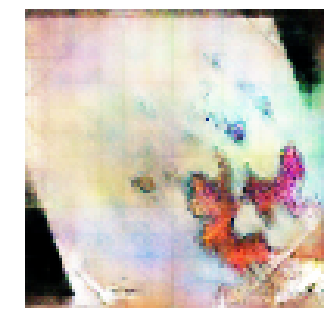


Epoch: 38500, D: -5.236, G: 3.839
Epoch: 38501, D: -6.724, G: 4.186
Epoch: 38502, D: -6.344, G: 2.534
Epoch: 38503, D: -5.737, G: 4.559
Epoch: 38504, D: -5.776, G: 3.657
Epoch: 38505, D: -8.201, G: 5.481
Epoch: 38506, D: -5.804, G: 4.945
Epoch: 38507, D: -6.961, G: 4.305
Epoch: 38508, D: -6.806, G: 3.307
Epoch: 38509, D: -5.593, G: 1.972
Epoch: 38510, D: -6.457, G: 2.432
Epoch: 38511, D: -5.01, G: 3.906
Epoch: 38512, D: -6.425, G: 3.158
Epoch: 38513, D: -7.065, G: 3.921
Epoch: 38514, D: -7.749, G: 1.703
Epoch: 38515, D: -6.046, G: 4.618
Epoch: 38516, D: -6.133, G: 3.62
Epoch: 38517, D: -5.397, G: 3.844
Epoch: 38518, D: -5.816, G: 3.319
Epoch: 38519, D: -6.141, G: 3.13


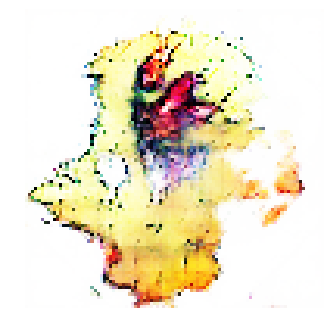


Epoch: 38520, D: -5.759, G: 2.633
Epoch: 38521, D: -7.583, G: 6.101
Epoch: 38522, D: -6.507, G: 3.1
Epoch: 38523, D: -6.148, G: 2.141
Epoch: 38524, D: -6.147, G: 4.262
Epoch: 38525, D: -5.954, G: 3.802
Epoch: 38526, D: -6.084, G: 4.658
Epoch: 38527, D: -7.287, G: 3.598
Epoch: 38528, D: -6.285, G: 3.648
Epoch: 38529, D: -5.441, G: 3.678
Epoch: 38530, D: -5.377, G: 3.023
Epoch: 38531, D: -5.975, G: 5.055
Epoch: 38532, D: -6.182, G: 4.954
Epoch: 38533, D: -6.011, G: 3.226
Epoch: 38534, D: -7.128, G: 3.108
Epoch: 38535, D: -4.881, G: 4.507
Epoch: 38536, D: -5.241, G: 3.959
Epoch: 38537, D: -4.963, G: 4.192
Epoch: 38538, D: -5.259, G: 2.851
Epoch: 38539, D: -7.746, G: 3.027


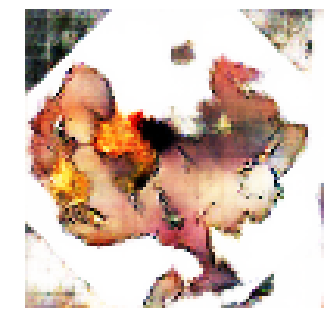


Epoch: 38540, D: -5.56, G: 2.444
Epoch: 38541, D: -6.419, G: 3.597
Epoch: 38542, D: -6.829, G: 5.11
Epoch: 38543, D: -6.568, G: 5.523
Epoch: 38544, D: -6.211, G: 4.304
Epoch: 38545, D: -7.462, G: 5.422
Epoch: 38546, D: -6.224, G: 6.747
Epoch: 38547, D: -6.311, G: 5.054
Epoch: 38548, D: -6.985, G: 4.986
Epoch: 38549, D: -7.31, G: 5.648
Epoch: 38550, D: -5.982, G: 3.213
Epoch: 38551, D: -6.207, G: 3.524
Epoch: 38552, D: -6.383, G: 5.52
Epoch: 38553, D: -6.495, G: 3.771
Epoch: 38554, D: -6.328, G: 2.31
Epoch: 38555, D: -5.337, G: 2.532
Epoch: 38556, D: -5.923, G: 4.43
Epoch: 38557, D: -5.438, G: 3.469
Epoch: 38558, D: -5.424, G: 3.568
Epoch: 38559, D: -6.694, G: 2.835


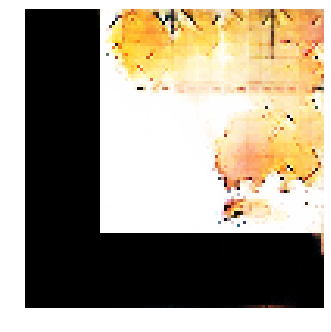


Epoch: 38560, D: -7.247, G: 2.873
Epoch: 38561, D: -5.726, G: 4.147
Epoch: 38562, D: -6.941, G: 3.711
Epoch: 38563, D: -7.348, G: 3.648
Epoch: 38564, D: -6.124, G: 5.056
Epoch: 38565, D: -4.738, G: 1.571
Epoch: 38566, D: -5.525, G: 4.002
Epoch: 38567, D: -5.988, G: 1.342
Epoch: 38568, D: -5.755, G: 3.746
Epoch: 38569, D: -6.854, G: 4.034
Epoch: 38570, D: -6.026, G: 3.417
Epoch: 38571, D: -6.452, G: 3.485
Epoch: 38572, D: -6.866, G: 5.087
Epoch: 38573, D: -5.93, G: 4.966
Epoch: 38574, D: -6.531, G: 5.317
Epoch: 38575, D: -5.282, G: 4.405
Epoch: 38576, D: -5.844, G: 4.341
Epoch: 38577, D: -4.078, G: 6.062
Epoch: 38578, D: -5.622, G: 3.334
Epoch: 38579, D: -5.558, G: 4.241


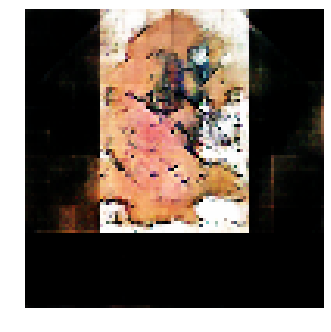


Epoch: 38580, D: -6.845, G: 1.015
Epoch: 38581, D: -7.005, G: 3.899
Epoch: 38582, D: -6.939, G: 3.024
Epoch: 38583, D: -6.86, G: 2.943
Epoch: 38584, D: -6.277, G: 3.57
Epoch: 38585, D: -7.409, G: 4.576
Epoch: 38586, D: -5.634, G: 3.364
Epoch: 38587, D: -5.464, G: 3.376
Epoch: 38588, D: -5.545, G: 2.831
Epoch: 38589, D: -6.308, G: 4.066
Epoch: 38590, D: -4.786, G: 4.319
Epoch: 38591, D: -5.696, G: 4.777
Epoch: 38592, D: -5.775, G: 3.635
Epoch: 38593, D: -4.916, G: 3.279
Epoch: 38594, D: -6.425, G: 5.495
Epoch: 38595, D: -6.004, G: 3.821
Epoch: 38596, D: -5.875, G: 2.813
Epoch: 38597, D: -6.736, G: 3.286
Epoch: 38598, D: -5.92, G: 3.065
Epoch: 38599, D: -6.546, G: 4.769


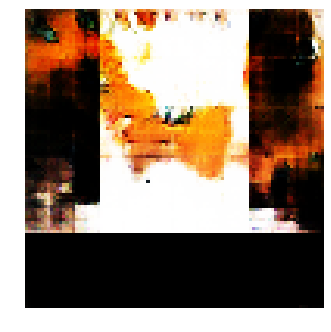


Epoch: 38600, D: -6.651, G: 2.612
Epoch: 38601, D: -5.291, G: 5.827
Epoch: 38602, D: -5.306, G: 6.226
Epoch: 38603, D: -6.351, G: 4.729
Epoch: 38604, D: -5.218, G: 3.821
Epoch: 38605, D: -6.051, G: 3.507
Epoch: 38606, D: -6.632, G: 3.634
Epoch: 38607, D: -6.618, G: 3.894
Epoch: 38608, D: -4.962, G: 2.04
Epoch: 38609, D: -6.836, G: 4.757
Epoch: 38610, D: -8.004, G: 4.652
Epoch: 38611, D: -5.315, G: 3.935
Epoch: 38612, D: -6.729, G: 3.767
Epoch: 38613, D: -6.506, G: 2.641
Epoch: 38614, D: -6.244, G: 4.509
Epoch: 38615, D: -5.215, G: 3.097
Epoch: 38616, D: -5.899, G: 3.903
Epoch: 38617, D: -6.119, G: 2.857
Epoch: 38618, D: -5.852, G: 3.619
Epoch: 38619, D: -5.405, G: 5.908


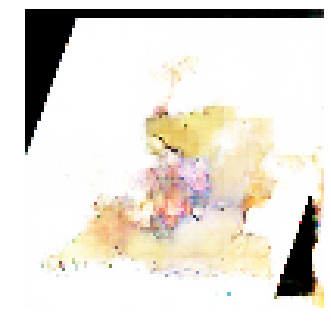


Epoch: 38620, D: -8.474, G: 2.968
Epoch: 38621, D: -6.488, G: 2.22
Epoch: 38622, D: -6.76, G: 4.972
Epoch: 38623, D: -5.959, G: 2.94
Epoch: 38624, D: -6.16, G: 4.224
Epoch: 38625, D: -4.738, G: 5.808
Epoch: 38626, D: -6.198, G: 2.712
Epoch: 38627, D: -6.764, G: 2.902
Epoch: 38628, D: -5.725, G: 2.83
Epoch: 38629, D: -5.4, G: 4.452
Epoch: 38630, D: -6.543, G: 4.515
Epoch: 38631, D: -7.239, G: 3.353
Epoch: 38632, D: -5.879, G: 3.022
Epoch: 38633, D: -7.635, G: 4.268
Epoch: 38634, D: -6.041, G: 3.184
Epoch: 38635, D: -6.709, G: 2.021
Epoch: 38636, D: -6.188, G: 4.456
Epoch: 38637, D: -4.953, G: 4.87
Epoch: 38638, D: -6.166, G: 3.608
Epoch: 38639, D: -6.552, G: 4.615


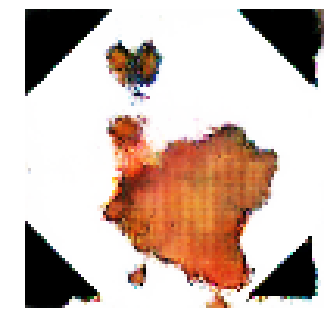


Epoch: 38640, D: -7.148, G: 4.775
Epoch: 38641, D: -5.958, G: 5.499
Epoch: 38642, D: -7.63, G: 4.608
Epoch: 38643, D: -5.097, G: 5.331
Epoch: 38644, D: -4.844, G: 2.258
Epoch: 38645, D: -6.544, G: 4.453
Epoch: 38646, D: -5.365, G: 3.266
Epoch: 38647, D: -6.46, G: 4.309
Epoch: 38648, D: -6.244, G: 1.782
Epoch: 38649, D: -5.266, G: 4.22
Epoch: 38650, D: -6.653, G: 5.036
Epoch: 38651, D: -7.163, G: 3.878
Epoch: 38652, D: -5.78, G: 3.34
Epoch: 38653, D: -5.799, G: 3.704
Epoch: 38654, D: -5.19, G: 3.844
Epoch: 38655, D: -6.675, G: 4.285
Epoch: 38656, D: -7.507, G: 2.923
Epoch: 38657, D: -7.95, G: 3.88
Epoch: 38658, D: -6.209, G: 3.145
Epoch: 38659, D: -6.634, G: 3.528


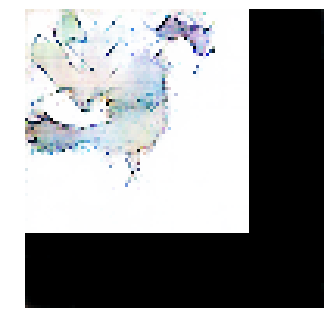


Epoch: 38660, D: -6.165, G: 2.658
Epoch: 38661, D: -5.936, G: 4.471
Epoch: 38662, D: -6.963, G: 3.353
Epoch: 38663, D: -6.379, G: 3.762
Epoch: 38664, D: -5.828, G: 3.589
Epoch: 38665, D: -5.819, G: 3.273
Epoch: 38666, D: -5.052, G: 2.893
Epoch: 38667, D: -6.137, G: 6.215
Epoch: 38668, D: -7.399, G: 2.66
Epoch: 38669, D: -6.943, G: 4.971
Epoch: 38670, D: -6.295, G: 2.456
Epoch: 38671, D: -6.053, G: 4.888
Epoch: 38672, D: -6.575, G: 4.519
Epoch: 38673, D: -6.917, G: 3.802
Epoch: 38674, D: -6.168, G: 4.652
Epoch: 38675, D: -5.326, G: 3.532
Epoch: 38676, D: -8.107, G: 3.607
Epoch: 38677, D: -4.797, G: 4.925
Epoch: 38678, D: -7.406, G: 3.675
Epoch: 38679, D: -7.05, G: 2.295


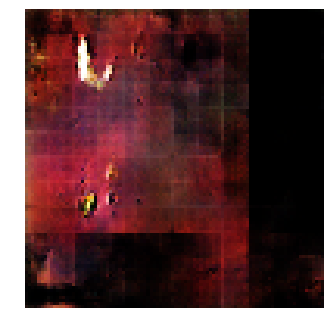


Epoch: 38680, D: -6.588, G: 5.353
Epoch: 38681, D: -8.457, G: 3.809
Epoch: 38682, D: -6.061, G: 3.001
Epoch: 38683, D: -6.526, G: 3.851
Epoch: 38684, D: -5.776, G: 5.597
Epoch: 38685, D: -8.453, G: 3.2
Epoch: 38686, D: -6.748, G: 5.939
Epoch: 38687, D: -7.013, G: 3.54
Epoch: 38688, D: -7.005, G: 2.448
Epoch: 38689, D: -6.114, G: 5.791
Epoch: 38690, D: -6.061, G: 4.302
Epoch: 38691, D: -6.117, G: 6.861
Epoch: 38692, D: -4.937, G: 4.495
Epoch: 38693, D: -6.116, G: 4.004
Epoch: 38694, D: -4.77, G: 2.505
Epoch: 38695, D: -8.281, G: 4.201
Epoch: 38696, D: -8.018, G: 1.443
Epoch: 38697, D: -7.959, G: 3.238
Epoch: 38698, D: -5.869, G: 5.228
Epoch: 38699, D: -6.252, G: 3.358


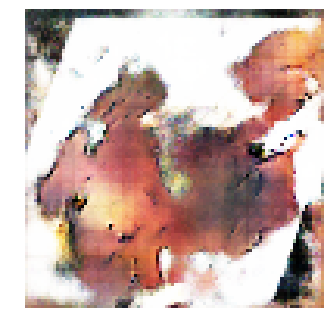


Epoch: 38700, D: -4.973, G: 5.083
Epoch: 38701, D: -6.204, G: 5.065
Epoch: 38702, D: -5.386, G: 5.43
Epoch: 38703, D: -6.448, G: 4.624
Epoch: 38704, D: -6.406, G: 4.124
Epoch: 38705, D: -7.078, G: 3.547
Epoch: 38706, D: -5.094, G: 3.581
Epoch: 38707, D: -7.871, G: 4.313
Epoch: 38708, D: -6.524, G: 4.747
Epoch: 38709, D: -7.908, G: 3.33
Epoch: 38710, D: -7.298, G: 2.41
Epoch: 38711, D: -7.223, G: 3.486
Epoch: 38712, D: -5.218, G: 3.121
Epoch: 38713, D: -5.292, G: 3.921
Epoch: 38714, D: -6.424, G: 3.495
Epoch: 38715, D: -4.655, G: 4.105
Epoch: 38716, D: -6.185, G: 4.484
Epoch: 38717, D: -6.567, G: 2.589
Epoch: 38718, D: -7.26, G: 2.463
Epoch: 38719, D: -6.069, G: 4.071


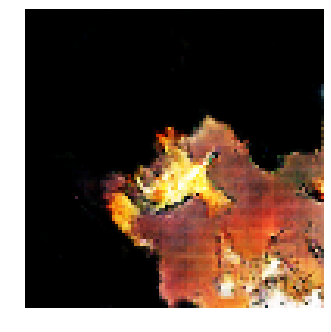


Epoch: 38720, D: -6.288, G: 3.7
Epoch: 38721, D: -7.526, G: 3.747
Epoch: 38722, D: -6.289, G: 4.638
Epoch: 38723, D: -6.224, G: 3.202
Epoch: 38724, D: -6.931, G: 3.771
Epoch: 38725, D: -6.616, G: 3.634
Epoch: 38726, D: -4.862, G: 4.312
Epoch: 38727, D: -5.327, G: 4.174
Epoch: 38728, D: -7.078, G: 2.486
Epoch: 38729, D: -6.107, G: 2.914
Epoch: 38730, D: -7.965, G: 4.331
Epoch: 38731, D: -6.844, G: 3.364
Epoch: 38732, D: -7.234, G: 2.369
Epoch: 38733, D: -6.122, G: 1.083
Epoch: 38734, D: -7.279, G: 5.468
Epoch: 38735, D: -6.107, G: 4.201
Epoch: 38736, D: -7.239, G: 2.721
Epoch: 38737, D: -5.986, G: 2.676
Epoch: 38738, D: -7.586, G: 4.075
Epoch: 38739, D: -6.783, G: 4.293


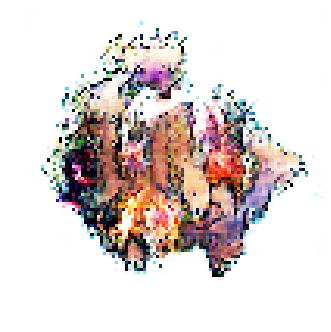


Epoch: 38740, D: -7.375, G: 7.222
Epoch: 38741, D: -6.954, G: 2.762
Epoch: 38742, D: -4.335, G: 4.718
Epoch: 38743, D: -6.097, G: 4.666
Epoch: 38744, D: -5.46, G: 3.499
Epoch: 38745, D: -7.823, G: 2.386
Epoch: 38746, D: -7.043, G: 2.671
Epoch: 38747, D: -4.295, G: 4.487
Epoch: 38748, D: -6.223, G: 4.29
Epoch: 38749, D: -7.087, G: 4.452
Epoch: 38750, D: -5.375, G: 2.635
Epoch: 38751, D: -7.03, G: 2.17
Epoch: 38752, D: -6.202, G: 3.226
Epoch: 38753, D: -8.284, G: 3.511
Epoch: 38754, D: -5.86, G: 1.85
Epoch: 38755, D: -7.174, G: 5.097
Epoch: 38756, D: -6.866, G: 5.035
Epoch: 38757, D: -6.476, G: 5.604
Epoch: 38758, D: -6.016, G: 3.557
Epoch: 38759, D: -7.372, G: 4.589


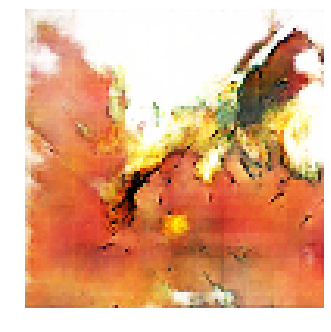


Epoch: 38760, D: -6.146, G: 4.431
Epoch: 38761, D: -6.108, G: 4.266
Epoch: 38762, D: -6.113, G: 3.794
Epoch: 38763, D: -6.002, G: 4.972
Epoch: 38764, D: -5.533, G: 4.433
Epoch: 38765, D: -8.542, G: 3.783
Epoch: 38766, D: -6.757, G: 3.434
Epoch: 38767, D: -7.555, G: 3.769
Epoch: 38768, D: -5.646, G: 4.28
Epoch: 38769, D: -6.764, G: 5.444
Epoch: 38770, D: -7.232, G: 5.189
Epoch: 38771, D: -6.026, G: 3.01
Epoch: 38772, D: -4.335, G: 3.747
Epoch: 38773, D: -7.641, G: 3.748
Epoch: 38774, D: -6.547, G: 4.012
Epoch: 38775, D: -4.633, G: 4.001
Epoch: 38776, D: -6.148, G: 2.6
Epoch: 38777, D: -5.198, G: 1.522
Epoch: 38778, D: -5.185, G: 4.736
Epoch: 38779, D: -6.021, G: 3.663


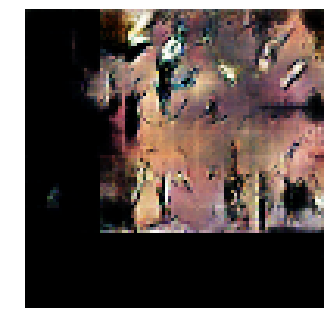


Epoch: 38780, D: -5.317, G: 4.887
Epoch: 38781, D: -5.585, G: 2.946
Epoch: 38782, D: -8.139, G: 5.009
Epoch: 38783, D: -5.83, G: 3.586
Epoch: 38784, D: -6.486, G: 4.224
Epoch: 38785, D: -5.767, G: 2.305
Epoch: 38786, D: -5.815, G: 4.3
Epoch: 38787, D: -5.922, G: 3.848
Epoch: 38788, D: -6.059, G: 3.682
Epoch: 38789, D: -7.362, G: 5.463
Epoch: 38790, D: -5.477, G: 4.525
Epoch: 38791, D: -6.385, G: 5.908
Epoch: 38792, D: -7.312, G: 3.544
Epoch: 38793, D: -5.879, G: 3.28
Epoch: 38794, D: -6.832, G: 1.908
Epoch: 38795, D: -6.91, G: 3.021
Epoch: 38796, D: -6.526, G: 5.062
Epoch: 38797, D: -7.534, G: 5.578
Epoch: 38798, D: -5.935, G: 5.281
Epoch: 38799, D: -5.978, G: 4.857


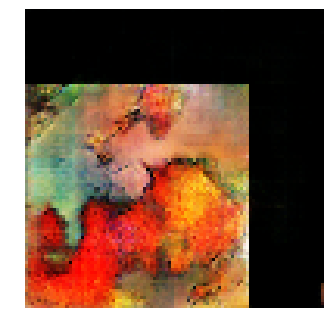


Epoch: 38800, D: -5.95, G: 6.413
Epoch: 38801, D: -4.941, G: 4.222
Epoch: 38802, D: -5.432, G: 5.03
Epoch: 38803, D: -5.892, G: 4.733
Epoch: 38804, D: -5.885, G: 6.183
Epoch: 38805, D: -7.494, G: 3.975
Epoch: 38806, D: -7.098, G: 4.278
Epoch: 38807, D: -7.325, G: 2.692
Epoch: 38808, D: -5.272, G: 1.983
Epoch: 38809, D: -7.482, G: 2.563
Epoch: 38810, D: -4.856, G: 3.612
Epoch: 38811, D: -5.743, G: 4.272
Epoch: 38812, D: -7.622, G: 2.457
Epoch: 38813, D: -6.848, G: 3.731
Epoch: 38814, D: -6.275, G: 4.068
Epoch: 38815, D: -6.179, G: 3.251
Epoch: 38816, D: -4.987, G: 3.76
Epoch: 38817, D: -4.553, G: 3.649
Epoch: 38818, D: -5.807, G: 4.795
Epoch: 38819, D: -5.677, G: 4.019


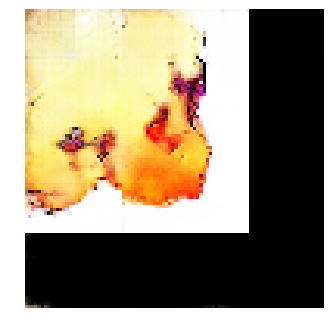


Epoch: 38820, D: -6.179, G: 2.249
Epoch: 38821, D: -6.527, G: 3.478
Epoch: 38822, D: -6.273, G: 2.135
Epoch: 38823, D: -6.619, G: 3.801
Epoch: 38824, D: -6.63, G: 3.461
Epoch: 38825, D: -5.674, G: 4.918
Epoch: 38826, D: -6.028, G: 3.632
Epoch: 38827, D: -4.333, G: 5.054
Epoch: 38828, D: -6.654, G: 2.484
Epoch: 38829, D: -5.83, G: 4.318
Epoch: 38830, D: -5.616, G: 5.113
Epoch: 38831, D: -6.946, G: 3.904
Epoch: 38832, D: -6.568, G: 4.931
Epoch: 38833, D: -6.184, G: 2.662
Epoch: 38834, D: -6.6, G: 4.753
Epoch: 38835, D: -5.321, G: 3.029
Epoch: 38836, D: -6.026, G: 3.192
Epoch: 38837, D: -6.924, G: 3.73
Epoch: 38838, D: -7.715, G: 4.134
Epoch: 38839, D: -5.47, G: 3.851


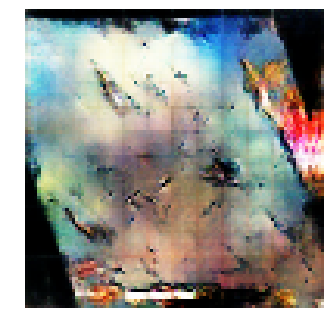


Epoch: 38840, D: -6.33, G: 3.872
Epoch: 38841, D: -7.218, G: 2.831
Epoch: 38842, D: -8.706, G: 1.464
Epoch: 38843, D: -5.19, G: 2.715
Epoch: 38844, D: -5.681, G: 5.691
Epoch: 38845, D: -7.005, G: 2.949
Epoch: 38846, D: -6.997, G: 2.801
Epoch: 38847, D: -6.429, G: 4.014
Epoch: 38848, D: -6.62, G: 3.83
Epoch: 38849, D: -5.941, G: 2.882
Epoch: 38850, D: -5.098, G: 4.621
Epoch: 38851, D: -6.285, G: 2.851
Epoch: 38852, D: -5.211, G: 4.949
Epoch: 38853, D: -6.546, G: 2.065
Epoch: 38854, D: -5.537, G: 4.58
Epoch: 38855, D: -6.037, G: 3.495
Epoch: 38856, D: -6.965, G: 4.752
Epoch: 38857, D: -7.36, G: 2.858
Epoch: 38858, D: -5.605, G: 4.106
Epoch: 38859, D: -5.842, G: 2.905


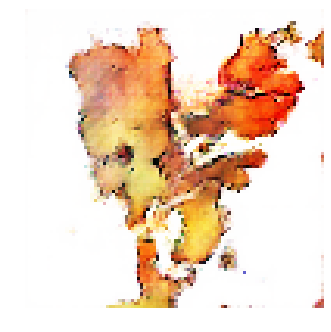


Epoch: 38860, D: -6.238, G: 4.684
Epoch: 38861, D: -5.328, G: 4.153
Epoch: 38862, D: -5.431, G: 2.547
Epoch: 38863, D: -7.756, G: 3.206
Epoch: 38864, D: -5.236, G: 3.178
Epoch: 38865, D: -5.672, G: 4.75
Epoch: 38866, D: -5.356, G: 3.913
Epoch: 38867, D: -6.016, G: 4.125
Epoch: 38868, D: -6.538, G: 2.056
Epoch: 38869, D: -6.352, G: 3.082
Epoch: 38870, D: -7.587, G: 3.48
Epoch: 38871, D: -4.855, G: 4.127
Epoch: 38872, D: -5.764, G: 4.644
Epoch: 38873, D: -6.276, G: 3.634
Epoch: 38874, D: -6.889, G: 4.352
Epoch: 38875, D: -7.221, G: 4.928
Epoch: 38876, D: -5.531, G: 5.091
Epoch: 38877, D: -6.543, G: 3.246
Epoch: 38878, D: -5.281, G: 5.018
Epoch: 38879, D: -6.558, G: 4.601


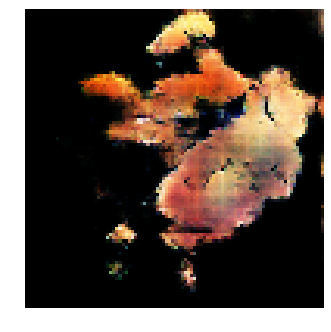


Epoch: 38880, D: -5.803, G: 4.112
Epoch: 38881, D: -4.867, G: 2.431
Epoch: 38882, D: -6.02, G: 3.306
Epoch: 38883, D: -6.162, G: 3.509
Epoch: 38884, D: -5.645, G: 1.695
Epoch: 38885, D: -6.392, G: 2.804
Epoch: 38886, D: -6.092, G: 4.894
Epoch: 38887, D: -7.07, G: 4.79
Epoch: 38888, D: -7.091, G: 4.705
Epoch: 38889, D: -5.541, G: 3.434
Epoch: 38890, D: -6.344, G: 3.511
Epoch: 38891, D: -6.811, G: 2.815
Epoch: 38892, D: -6.195, G: 4.512
Epoch: 38893, D: -6.893, G: 3.128
Epoch: 38894, D: -6.024, G: 4.661
Epoch: 38895, D: -5.45, G: 2.138
Epoch: 38896, D: -6.339, G: 3.004
Epoch: 38897, D: -5.705, G: 4.189
Epoch: 38898, D: -6.322, G: 3.029
Epoch: 38899, D: -7.245, G: 3.802


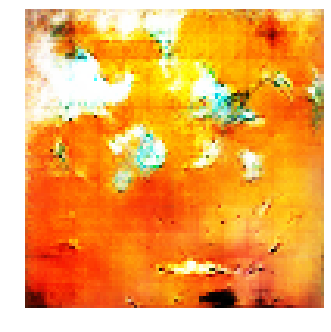


Epoch: 38900, D: -6.343, G: 2.958
Epoch: 38901, D: -6.978, G: 2.677
Epoch: 38902, D: -5.909, G: 4.705
Epoch: 38903, D: -8.042, G: 3.417
Epoch: 38904, D: -5.331, G: 4.76
Epoch: 38905, D: -6.354, G: 3.964
Epoch: 38906, D: -5.098, G: 4.401
Epoch: 38907, D: -5.442, G: 4.572
Epoch: 38908, D: -7.243, G: 3.341
Epoch: 38909, D: -5.593, G: 4.006
Epoch: 38910, D: -5.986, G: 5.654
Epoch: 38911, D: -6.972, G: 3.768
Epoch: 38912, D: -5.929, G: 4.279
Epoch: 38913, D: -5.96, G: 3.873
Epoch: 38914, D: -7.463, G: 1.342
Epoch: 38915, D: -6.856, G: 2.661
Epoch: 38916, D: -6.38, G: 3.208
Epoch: 38917, D: -5.333, G: 4.579
Epoch: 38918, D: -7.744, G: 4.505
Epoch: 38919, D: -4.928, G: 3.671


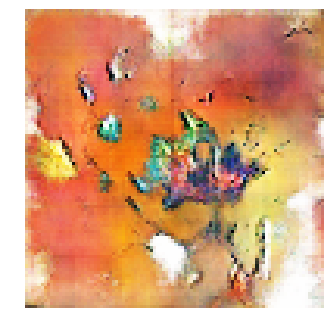


Epoch: 38920, D: -4.786, G: 4.579
Epoch: 38921, D: -5.218, G: 1.254
Epoch: 38922, D: -5.538, G: 3.693
Epoch: 38923, D: -5.245, G: 5.201
Epoch: 38924, D: -6.567, G: 2.309
Epoch: 38925, D: -5.591, G: 4.965
Epoch: 38926, D: -6.183, G: 4.786
Epoch: 38927, D: -6.833, G: 4.292
Epoch: 38928, D: -5.795, G: 5.002
Epoch: 38929, D: -6.539, G: 3.192
Epoch: 38930, D: -6.008, G: 5.093
Epoch: 38931, D: -6.054, G: 4.672
Epoch: 38932, D: -6.323, G: 1.972
Epoch: 38933, D: -4.962, G: 4.451
Epoch: 38934, D: -6.332, G: 3.648
Epoch: 38935, D: -6.152, G: 3.618
Epoch: 38936, D: -6.602, G: 3.013
Epoch: 38937, D: -7.074, G: 3.073
Epoch: 38938, D: -6.799, G: 1.454
Epoch: 38939, D: -6.908, G: 2.652


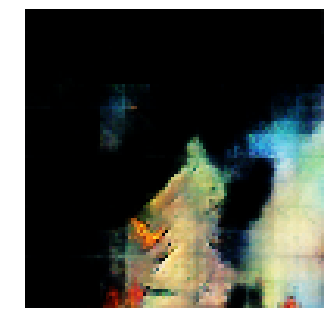


Epoch: 38940, D: -6.837, G: 2.123
Epoch: 38941, D: -7.757, G: 3.152
Epoch: 38942, D: -5.674, G: 2.388
Epoch: 38943, D: -6.008, G: 3.783
Epoch: 38944, D: -7.597, G: 4.259
Epoch: 38945, D: -7.24, G: 3.155
Epoch: 38946, D: -5.192, G: 4.325
Epoch: 38947, D: -6.844, G: 5.398
Epoch: 38948, D: -5.666, G: 4.839
Epoch: 38949, D: -5.598, G: 3.361
Epoch: 38950, D: -6.916, G: 4.344
Epoch: 38951, D: -6.751, G: 4.821
Epoch: 38952, D: -6.923, G: 3.436
Epoch: 38953, D: -5.35, G: 3.415
Epoch: 38954, D: -7.441, G: 4.75
Epoch: 38955, D: -6.217, G: 3.272
Epoch: 38956, D: -7.296, G: 2.318
Epoch: 38957, D: -6.385, G: 2.831
Epoch: 38958, D: -6.72, G: 2.895
Epoch: 38959, D: -6.517, G: 2.354


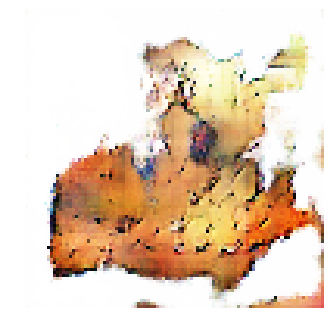


Epoch: 38960, D: -6.354, G: 2.382
Epoch: 38961, D: -5.663, G: 4.026
Epoch: 38962, D: -6.763, G: 2.581
Epoch: 38963, D: -4.775, G: 2.856
Epoch: 38964, D: -5.256, G: 4.607
Epoch: 38965, D: -6.151, G: 2.416
Epoch: 38966, D: -6.16, G: 2.529
Epoch: 38967, D: -6.237, G: 5.115
Epoch: 38968, D: -7.067, G: 3.436
Epoch: 38969, D: -6.052, G: 4.071
Epoch: 38970, D: -6.462, G: 3.127
Epoch: 38971, D: -7.685, G: 4.425
Epoch: 38972, D: -7.065, G: 3.049
Epoch: 38973, D: -6.008, G: 3.634
Epoch: 38974, D: -6.133, G: 3.513
Epoch: 38975, D: -6.118, G: 4.245
Epoch: 38976, D: -6.419, G: 4.133
Epoch: 38977, D: -5.604, G: 2.556
Epoch: 38978, D: -7.566, G: 3.265
Epoch: 38979, D: -6.2, G: 1.652


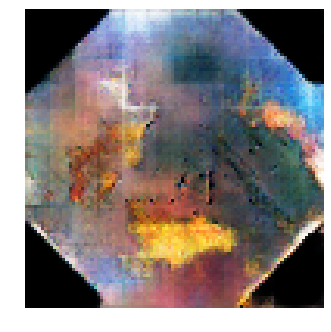


Epoch: 38980, D: -6.717, G: 0.8067
Epoch: 38981, D: -6.516, G: 1.065
Epoch: 38982, D: -5.564, G: 2.794
Epoch: 38983, D: -6.289, G: 4.434
Epoch: 38984, D: -6.631, G: 3.376
Epoch: 38985, D: -4.642, G: 4.388
Epoch: 38986, D: -6.352, G: 6.084
Epoch: 38987, D: -6.194, G: 3.626
Epoch: 38988, D: -6.286, G: 5.481
Epoch: 38989, D: -5.31, G: 4.104
Epoch: 38990, D: -7.138, G: 5.798
Epoch: 38991, D: -5.624, G: 3.583
Epoch: 38992, D: -7.276, G: 4.426
Epoch: 38993, D: -6.338, G: 2.915
Epoch: 38994, D: -5.426, G: 2.195
Epoch: 38995, D: -6.587, G: 3.154
Epoch: 38996, D: -7.057, G: 5.466
Epoch: 38997, D: -5.588, G: 3.547
Epoch: 38998, D: -7.017, G: 3.036
Epoch: 38999, D: -5.618, G: 2.922


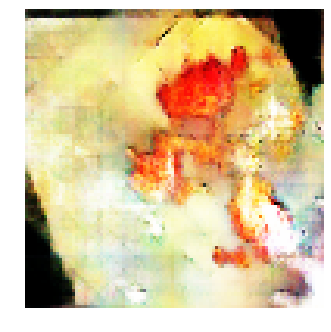


Epoch: 39000, D: -5.906, G: 4.483
Epoch: 39001, D: -5.23, G: 4.193
Epoch: 39002, D: -6.839, G: 3.472
Epoch: 39003, D: -6.405, G: 3.533
Epoch: 39004, D: -5.711, G: 5.829
Epoch: 39005, D: -5.653, G: 4.993
Epoch: 39006, D: -6.395, G: 4.296
Epoch: 39007, D: -7.114, G: 4.771
Epoch: 39008, D: -6.17, G: 2.675
Epoch: 39009, D: -5.889, G: 4.46
Epoch: 39010, D: -4.747, G: 1.968
Epoch: 39011, D: -6.508, G: 3.38
Epoch: 39012, D: -5.127, G: 2.294
Epoch: 39013, D: -5.646, G: 4.265
Epoch: 39014, D: -7.097, G: 2.803
Epoch: 39015, D: -6.784, G: 3.868
Epoch: 39016, D: -5.689, G: 2.74
Epoch: 39017, D: -6.881, G: 3.32
Epoch: 39018, D: -5.736, G: 4.759
Epoch: 39019, D: -7.266, G: 4.37


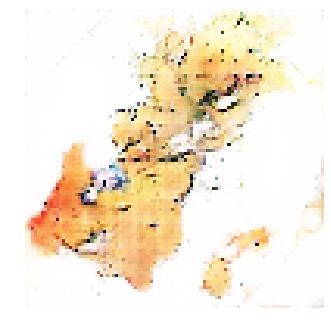


Epoch: 39020, D: -6.186, G: 3.148
Epoch: 39021, D: -5.736, G: 4.318
Epoch: 39022, D: -5.575, G: 4.647
Epoch: 39023, D: -6.552, G: 3.015
Epoch: 39024, D: -6.8, G: 4.698
Epoch: 39025, D: -3.936, G: 3.761
Epoch: 39026, D: -6.427, G: 4.202
Epoch: 39027, D: -5.52, G: 4.086
Epoch: 39028, D: -5.776, G: 3.363
Epoch: 39029, D: -7.115, G: 3.813
Epoch: 39030, D: -7.357, G: 3.558
Epoch: 39031, D: -6.485, G: 3.151
Epoch: 39032, D: -6.27, G: 2.679
Epoch: 39033, D: -7.053, G: 4.229
Epoch: 39034, D: -6.998, G: 2.036
Epoch: 39035, D: -5.502, G: 4.052
Epoch: 39036, D: -5.703, G: 1.812
Epoch: 39037, D: -5.79, G: 1.506
Epoch: 39038, D: -6.263, G: 3.331
Epoch: 39039, D: -4.976, G: 3.397


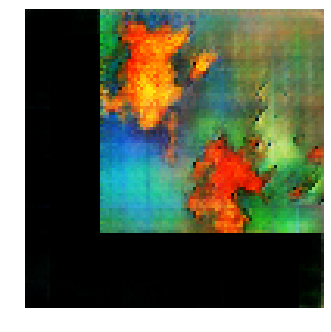


Epoch: 39040, D: -6.794, G: 3.523
Epoch: 39041, D: -6.624, G: 4.599
Epoch: 39042, D: -7.806, G: 4.064
Epoch: 39043, D: -7.514, G: 2.185
Epoch: 39044, D: -5.944, G: 5.147
Epoch: 39045, D: -6.676, G: 4.409
Epoch: 39046, D: -6.129, G: 2.963
Epoch: 39047, D: -7.826, G: 3.073
Epoch: 39048, D: -5.428, G: 4.479
Epoch: 39049, D: -5.333, G: 3.902
Epoch: 39050, D: -7.246, G: 3.103
Epoch: 39051, D: -5.306, G: 4.769
Epoch: 39052, D: -5.588, G: 5.279
Epoch: 39053, D: -5.591, G: 3.612
Epoch: 39054, D: -5.925, G: 4.677
Epoch: 39055, D: -6.17, G: 3.919
Epoch: 39056, D: -5.736, G: 4.917
Epoch: 39057, D: -5.665, G: 3.728
Epoch: 39058, D: -5.702, G: 4.484
Epoch: 39059, D: -5.515, G: 5.53


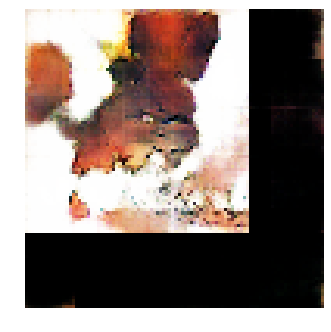


Epoch: 39060, D: -7.352, G: 4.226
Epoch: 39061, D: -6.973, G: 3.519
Epoch: 39062, D: -6.34, G: 3.724
Epoch: 39063, D: -6.056, G: 3.08
Epoch: 39064, D: -7.274, G: 3.989
Epoch: 39065, D: -6.145, G: 3.557
Epoch: 39066, D: -6.253, G: 4.346
Epoch: 39067, D: -5.894, G: 4.671
Epoch: 39068, D: -7.414, G: 4.838
Epoch: 39069, D: -5.484, G: 2.343
Epoch: 39070, D: -4.855, G: 4.431
Epoch: 39071, D: -5.003, G: 4.312
Epoch: 39072, D: -5.593, G: 3.135
Epoch: 39073, D: -5.875, G: 2.696
Epoch: 39074, D: -6.85, G: 3.992
Epoch: 39075, D: -7.04, G: 3.791
Epoch: 39076, D: -5.578, G: 3.774
Epoch: 39077, D: -4.947, G: 4.326
Epoch: 39078, D: -5.822, G: 4.464
Epoch: 39079, D: -6.889, G: 4.751


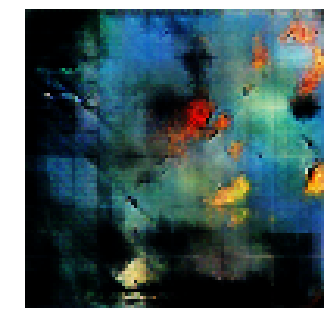


Epoch: 39080, D: -4.49, G: 4.301
Epoch: 39081, D: -6.217, G: 2.037
Epoch: 39082, D: -5.988, G: 5.003
Epoch: 39083, D: -5.701, G: 4.448
Epoch: 39084, D: -6.382, G: 3.192
Epoch: 39085, D: -6.791, G: 1.96
Epoch: 39086, D: -5.753, G: 3.253
Epoch: 39087, D: -5.682, G: 5.564
Epoch: 39088, D: -6.853, G: 3.232
Epoch: 39089, D: -5.631, G: 4.891
Epoch: 39090, D: -4.926, G: 5.906
Epoch: 39091, D: -7.063, G: 5.361
Epoch: 39092, D: -6.271, G: 4.517
Epoch: 39093, D: -5.686, G: 3.135
Epoch: 39094, D: -6.113, G: 4.816
Epoch: 39095, D: -6.921, G: 4.777
Epoch: 39096, D: -7.625, G: 4.654
Epoch: 39097, D: -5.099, G: 2.707
Epoch: 39098, D: -6.388, G: 3.808
Epoch: 39099, D: -6.38, G: 3.548


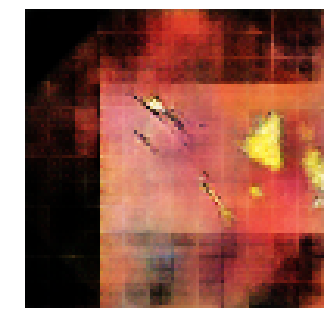


Epoch: 39100, D: -5.269, G: 2.871
Epoch: 39101, D: -5.859, G: 4.396
Epoch: 39102, D: -6.215, G: 6.637
Epoch: 39103, D: -7.737, G: 2.979
Epoch: 39104, D: -5.426, G: 2.068
Epoch: 39105, D: -5.101, G: 2.928
Epoch: 39106, D: -7.338, G: 2.421
Epoch: 39107, D: -6.716, G: 3.539
Epoch: 39108, D: -5.605, G: 4.369
Epoch: 39109, D: -5.281, G: 3.735
Epoch: 39110, D: -6.227, G: 2.433
Epoch: 39111, D: -5.874, G: 3.822
Epoch: 39112, D: -5.283, G: 4.227
Epoch: 39113, D: -6.023, G: 2.757
Epoch: 39114, D: -6.64, G: 4.165
Epoch: 39115, D: -5.165, G: 3.91
Epoch: 39116, D: -5.412, G: 3.188
Epoch: 39117, D: -5.63, G: 4.368
Epoch: 39118, D: -6.854, G: 3.386
Epoch: 39119, D: -6.404, G: 3.601


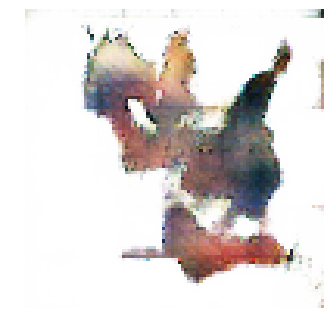


Epoch: 39120, D: -4.697, G: 2.282
Epoch: 39121, D: -6.767, G: 2.954
Epoch: 39122, D: -5.726, G: 3.802
Epoch: 39123, D: -5.128, G: 5.44
Epoch: 39124, D: -7.306, G: 3.727
Epoch: 39125, D: -6.105, G: 1.811
Epoch: 39126, D: -5.514, G: 4.755
Epoch: 39127, D: -6.96, G: 3.724
Epoch: 39128, D: -5.505, G: 4.259
Epoch: 39129, D: -5.767, G: 3.368
Epoch: 39130, D: -6.584, G: 4.848
Epoch: 39131, D: -6.414, G: 4.169
Epoch: 39132, D: -6.855, G: 5.044
Epoch: 39133, D: -6.854, G: 3.117
Epoch: 39134, D: -6.083, G: 5.328
Epoch: 39135, D: -7.823, G: 2.907
Epoch: 39136, D: -7.15, G: 2.716
Epoch: 39137, D: -6.573, G: 3.772
Epoch: 39138, D: -5.217, G: 5.657
Epoch: 39139, D: -6.263, G: 4.996


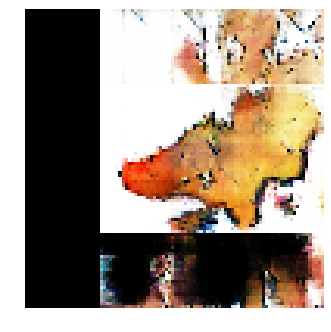


Epoch: 39140, D: -5.752, G: 4.141
Epoch: 39141, D: -5.237, G: 3.855
Epoch: 39142, D: -5.958, G: 5.842
Epoch: 39143, D: -6.541, G: 3.934
Epoch: 39144, D: -5.446, G: 3.964
Epoch: 39145, D: -6.402, G: 3.5
Epoch: 39146, D: -6.326, G: 5.248
Epoch: 39147, D: -6.114, G: 2.535
Epoch: 39148, D: -5.619, G: 3.61
Epoch: 39149, D: -6.285, G: 3.327
Epoch: 39150, D: -7.181, G: 4.137
Epoch: 39151, D: -6.793, G: 3.485
Epoch: 39152, D: -6.173, G: 3.894
Epoch: 39153, D: -6.673, G: 3.805
Epoch: 39154, D: -4.272, G: 3.365
Epoch: 39155, D: -7.423, G: 2.046
Epoch: 39156, D: -6.385, G: 3.871
Epoch: 39157, D: -5.502, G: 3.241
Epoch: 39158, D: -6.561, G: 2.037
Epoch: 39159, D: -4.19, G: 3.736


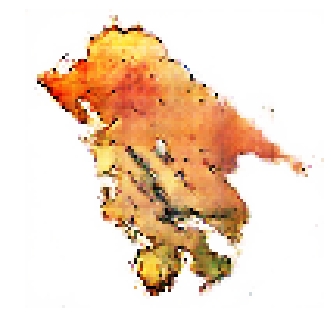


Epoch: 39160, D: -5.361, G: 4.656
Epoch: 39161, D: -7.478, G: 4.321
Epoch: 39162, D: -6.425, G: 2.858
Epoch: 39163, D: -7.111, G: 2.832
Epoch: 39164, D: -6.981, G: 4.159
Epoch: 39165, D: -6.051, G: 4.404
Epoch: 39166, D: -8.327, G: 3.754
Epoch: 39167, D: -5.755, G: 3.698
Epoch: 39168, D: -4.898, G: 4.304
Epoch: 39169, D: -5.733, G: 5.754
Epoch: 39170, D: -5.848, G: 5.504
Epoch: 39171, D: -7.045, G: 3.687
Epoch: 39172, D: -7.388, G: 4.118
Epoch: 39173, D: -6.853, G: 5.615
Epoch: 39174, D: -5.725, G: 3.635
Epoch: 39175, D: -7.218, G: 3.599
Epoch: 39176, D: -7.008, G: 3.674
Epoch: 39177, D: -6.713, G: 3.693
Epoch: 39178, D: -5.984, G: 3.755
Epoch: 39179, D: -7.616, G: 4.932


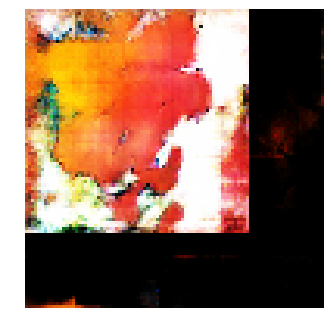


Epoch: 39180, D: -3.786, G: 3.028
Epoch: 39181, D: -4.901, G: 5.122
Epoch: 39182, D: -5.404, G: 5.486
Epoch: 39183, D: -5.745, G: 5.196
Epoch: 39184, D: -7.616, G: 3.163
Epoch: 39185, D: -6.732, G: 2.471
Epoch: 39186, D: -5.924, G: 6.357
Epoch: 39187, D: -5.792, G: 4.122
Epoch: 39188, D: -7.137, G: 4.968
Epoch: 39189, D: -5.759, G: 4.976
Epoch: 39190, D: -5.952, G: 5.084
Epoch: 39191, D: -5.601, G: 4.661
Epoch: 39192, D: -6.417, G: 2.691
Epoch: 39193, D: -5.283, G: 2.849
Epoch: 39194, D: -6.191, G: 2.351
Epoch: 39195, D: -5.491, G: 4.912
Epoch: 39196, D: -5.304, G: 4.654
Epoch: 39197, D: -7.782, G: 3.691
Epoch: 39198, D: -7.596, G: 4.59
Epoch: 39199, D: -6.434, G: 5.029


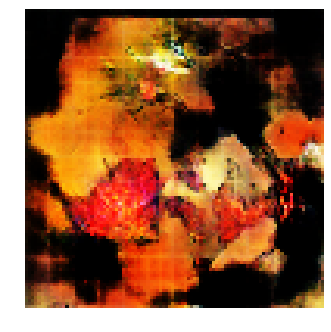


Epoch: 39200, D: -6.779, G: 3.485
Epoch: 39201, D: -6.525, G: 4.355
Epoch: 39202, D: -6.445, G: 3.283
Epoch: 39203, D: -6.165, G: 2.807
Epoch: 39204, D: -7.409, G: 4.483
Epoch: 39205, D: -7.256, G: 4.649
Epoch: 39206, D: -6.579, G: 3.682
Epoch: 39207, D: -6.407, G: 4.726
Epoch: 39208, D: -6.494, G: 3.313
Epoch: 39209, D: -4.501, G: 2.849
Epoch: 39210, D: -7.016, G: 2.743
Epoch: 39211, D: -6.163, G: 3.301
Epoch: 39212, D: -5.971, G: 5.644
Epoch: 39213, D: -6.525, G: 3.401
Epoch: 39214, D: -5.241, G: 4.009
Epoch: 39215, D: -5.705, G: 3.32
Epoch: 39216, D: -4.065, G: 5.281
Epoch: 39217, D: -6.493, G: 3.505
Epoch: 39218, D: -9.472, G: 3.786
Epoch: 39219, D: -6.51, G: 3.565


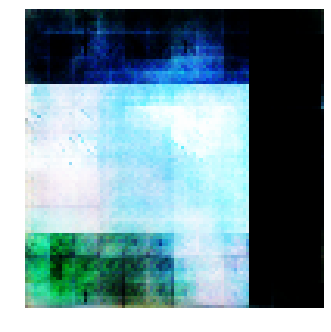


Epoch: 39220, D: -6.388, G: 3.145
Epoch: 39221, D: -5.756, G: 5.116
Epoch: 39222, D: -4.722, G: 3.806
Epoch: 39223, D: -6.541, G: 4.062
Epoch: 39224, D: -5.874, G: 3.182
Epoch: 39225, D: -6.219, G: 3.203
Epoch: 39226, D: -5.991, G: 5.149
Epoch: 39227, D: -6.209, G: 3.153
Epoch: 39228, D: -6.891, G: 2.302
Epoch: 39229, D: -7.071, G: 4.048
Epoch: 39230, D: -5.726, G: 4.382
Epoch: 39231, D: -5.995, G: 4.027
Epoch: 39232, D: -5.727, G: 2.835
Epoch: 39233, D: -6.819, G: 5.601
Epoch: 39234, D: -6.277, G: 5.3
Epoch: 39235, D: -6.506, G: 3.476
Epoch: 39236, D: -4.709, G: 3.095
Epoch: 39237, D: -5.947, G: 3.413
Epoch: 39238, D: -6.564, G: 2.375
Epoch: 39239, D: -6.863, G: 3.128


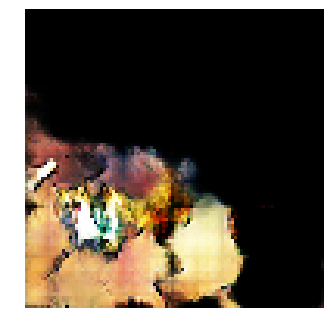


Epoch: 39240, D: -5.847, G: 1.909
Epoch: 39241, D: -6.673, G: 3.551
Epoch: 39242, D: -6.811, G: 4.745
Epoch: 39243, D: -6.097, G: 3.359
Epoch: 39244, D: -6.594, G: 3.886
Epoch: 39245, D: -5.375, G: 4.062
Epoch: 39246, D: -6.968, G: 3.51
Epoch: 39247, D: -5.165, G: 6.555
Epoch: 39248, D: -7.267, G: 4.953
Epoch: 39249, D: -6.518, G: 3.188
Epoch: 39250, D: -6.466, G: 3.418
Epoch: 39251, D: -6.305, G: 3.595
Epoch: 39252, D: -5.126, G: 3.054
Epoch: 39253, D: -6.311, G: 4.157
Epoch: 39254, D: -7.043, G: 2.804
Epoch: 39255, D: -6.45, G: 2.99
Epoch: 39256, D: -6.379, G: 3.501
Epoch: 39257, D: -6.18, G: 1.736
Epoch: 39258, D: -6.707, G: 2.946
Epoch: 39259, D: -6.639, G: 3.687


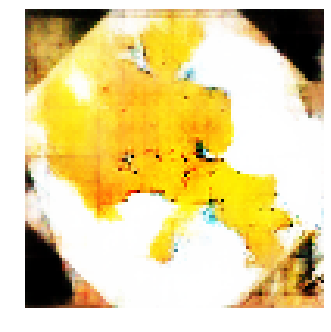


Epoch: 39260, D: -6.505, G: 3.964
Epoch: 39261, D: -6.777, G: 4.229
Epoch: 39262, D: -6.022, G: 2.489
Epoch: 39263, D: -6.163, G: 5.207
Epoch: 39264, D: -6.297, G: 4.571
Epoch: 39265, D: -5.748, G: 3.18
Epoch: 39266, D: -7.448, G: 4.375
Epoch: 39267, D: -6.695, G: 5.725
Epoch: 39268, D: -7.581, G: 1.902
Epoch: 39269, D: -4.926, G: 2.945
Epoch: 39270, D: -6.325, G: 4.544
Epoch: 39271, D: -6.764, G: 4.639
Epoch: 39272, D: -6.273, G: 3.978
Epoch: 39273, D: -5.422, G: 3.621
Epoch: 39274, D: -5.386, G: 2.634
Epoch: 39275, D: -6.77, G: 4.273
Epoch: 39276, D: -5.854, G: 3.841
Epoch: 39277, D: -5.82, G: 2.222
Epoch: 39278, D: -7.295, G: 1.072
Epoch: 39279, D: -4.931, G: 2.354


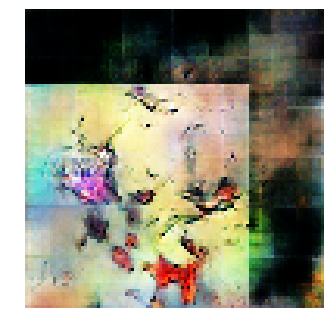


Epoch: 39280, D: -8.064, G: 3.723
Epoch: 39281, D: -5.365, G: 4.072
Epoch: 39282, D: -4.911, G: 4.161
Epoch: 39283, D: -6.292, G: 3.279
Epoch: 39284, D: -6.218, G: 4.685
Epoch: 39285, D: -6.877, G: 6.031
Epoch: 39286, D: -6.408, G: 3.571
Epoch: 39287, D: -7.257, G: 4.964
Epoch: 39288, D: -6.353, G: 4.24
Epoch: 39289, D: -5.386, G: 2.673
Epoch: 39290, D: -6.081, G: 4.328
Epoch: 39291, D: -6.165, G: 1.672
Epoch: 39292, D: -5.97, G: 2.484
Epoch: 39293, D: -6.612, G: 5.798
Epoch: 39294, D: -6.771, G: 4.598
Epoch: 39295, D: -5.954, G: 3.149
Epoch: 39296, D: -5.518, G: 4.33
Epoch: 39297, D: -7.091, G: 4.747
Epoch: 39298, D: -6.397, G: 3.991
Epoch: 39299, D: -6.493, G: 3.084


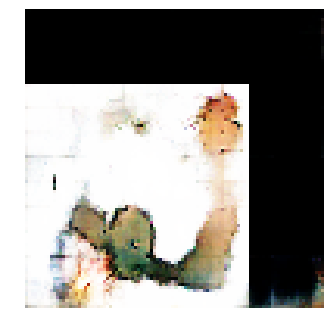


Epoch: 39300, D: -5.206, G: 4.602
Epoch: 39301, D: -7.038, G: 4.401
Epoch: 39302, D: -5.513, G: 2.733
Epoch: 39303, D: -6.14, G: 4.288
Epoch: 39304, D: -5.913, G: 3.911
Epoch: 39305, D: -6.482, G: 4.466
Epoch: 39306, D: -5.416, G: 5.843
Epoch: 39307, D: -8.743, G: 3.977
Epoch: 39308, D: -5.538, G: 3.028
Epoch: 39309, D: -7.159, G: 2.952
Epoch: 39310, D: -6.222, G: 3.139
Epoch: 39311, D: -6.028, G: 3.018
Epoch: 39312, D: -4.723, G: 2.787
Epoch: 39313, D: -6.885, G: 4.963
Epoch: 39314, D: -6.618, G: 4.373
Epoch: 39315, D: -7.869, G: 2.43
Epoch: 39316, D: -6.029, G: 3.839
Epoch: 39317, D: -6.512, G: 3.915
Epoch: 39318, D: -5.15, G: 3.914
Epoch: 39319, D: -6.622, G: 5.182


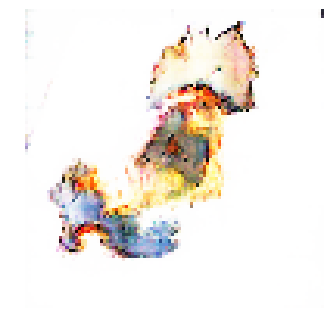


Epoch: 39320, D: -7.702, G: 3.916
Epoch: 39321, D: -5.59, G: 5.085
Epoch: 39322, D: -5.572, G: 4.788
Epoch: 39323, D: -5.79, G: 3.677
Epoch: 39324, D: -6.047, G: 4.257
Epoch: 39325, D: -5.751, G: 3.489
Epoch: 39326, D: -7.046, G: 3.367
Epoch: 39327, D: -5.622, G: 4.216
Epoch: 39328, D: -6.656, G: 4.272
Epoch: 39329, D: -5.689, G: 1.361
Epoch: 39330, D: -5.538, G: 3.583
Epoch: 39331, D: -6.263, G: 3.251
Epoch: 39332, D: -5.942, G: 3.256
Epoch: 39333, D: -6.344, G: 2.54
Epoch: 39334, D: -5.633, G: 2.211
Epoch: 39335, D: -5.969, G: 5.541
Epoch: 39336, D: -5.086, G: 4.409
Epoch: 39337, D: -7.49, G: 3.847
Epoch: 39338, D: -7.975, G: 2.412
Epoch: 39339, D: -6.969, G: 3.016


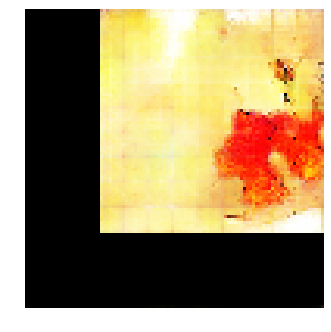


Epoch: 39340, D: -6.398, G: 3.994
Epoch: 39341, D: -7.03, G: 2.296
Epoch: 39342, D: -5.878, G: 2.99
Epoch: 39343, D: -7.194, G: 3.947
Epoch: 39344, D: -5.679, G: 4.424
Epoch: 39345, D: -6.458, G: 5.309
Epoch: 39346, D: -5.552, G: 2.574
Epoch: 39347, D: -5.952, G: 3.072
Epoch: 39348, D: -6.554, G: 2.94
Epoch: 39349, D: -3.952, G: 2.06
Epoch: 39350, D: -5.454, G: 3.072
Epoch: 39351, D: -5.404, G: 2.592
Epoch: 39352, D: -6.313, G: 4.463
Epoch: 39353, D: -6.148, G: 2.782
Epoch: 39354, D: -7.264, G: 2.071
Epoch: 39355, D: -6.214, G: 3.12
Epoch: 39356, D: -7.48, G: 3.085
Epoch: 39357, D: -6.108, G: 4.791
Epoch: 39358, D: -6.237, G: 6.204
Epoch: 39359, D: -6.19, G: 5.085


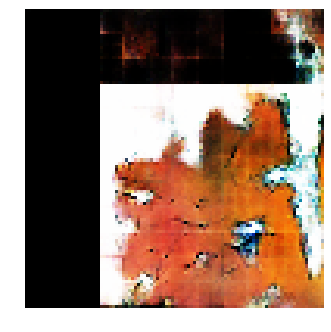


Epoch: 39360, D: -5.731, G: 5.061
Epoch: 39361, D: -6.352, G: 3.864
Epoch: 39362, D: -7.846, G: 4.452
Epoch: 39363, D: -6.772, G: 4.384
Epoch: 39364, D: -6.174, G: 3.713
Epoch: 39365, D: -6.639, G: 4.034
Epoch: 39366, D: -7.153, G: 2.827
Epoch: 39367, D: -7.01, G: 4.895
Epoch: 39368, D: -4.655, G: 4.419
Epoch: 39369, D: -6.176, G: 2.826
Epoch: 39370, D: -6.419, G: 3.422
Epoch: 39371, D: -6.26, G: 3.9
Epoch: 39372, D: -6.192, G: 4.54
Epoch: 39373, D: -6.283, G: 4.222
Epoch: 39374, D: -6.122, G: 3.551
Epoch: 39375, D: -7.055, G: 4.14
Epoch: 39376, D: -6.287, G: 3.622
Epoch: 39377, D: -6.477, G: 2.795
Epoch: 39378, D: -6.124, G: 5.192
Epoch: 39379, D: -5.171, G: 3.586


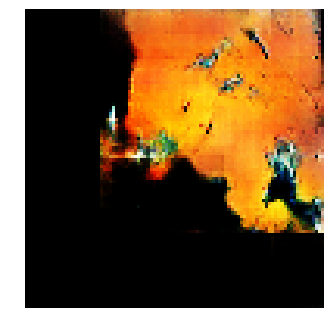


Epoch: 39380, D: -5.159, G: 3.724
Epoch: 39381, D: -4.983, G: 2.823
Epoch: 39382, D: -7.638, G: 3.898
Epoch: 39383, D: -6.305, G: 3.734
Epoch: 39384, D: -5.352, G: 3.511
Epoch: 39385, D: -7.852, G: 4.216
Epoch: 39386, D: -5.632, G: 4.097
Epoch: 39387, D: -4.949, G: 3.808
Epoch: 39388, D: -5.558, G: 3.359
Epoch: 39389, D: -4.923, G: 3.975
Epoch: 39390, D: -6.642, G: 3.559
Epoch: 39391, D: -7.094, G: 3.769
Epoch: 39392, D: -8.173, G: 3.0
Epoch: 39393, D: -5.507, G: 4.015
Epoch: 39394, D: -5.561, G: 3.765
Epoch: 39395, D: -6.443, G: 4.305
Epoch: 39396, D: -5.092, G: 4.255
Epoch: 39397, D: -5.711, G: 4.752
Epoch: 39398, D: -6.245, G: 2.102
Epoch: 39399, D: -6.271, G: 3.532


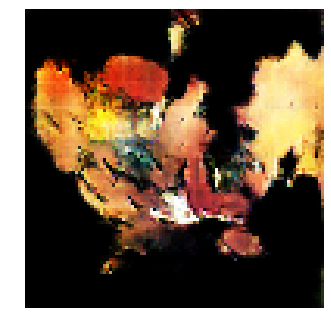


Epoch: 39400, D: -6.702, G: 4.016
Epoch: 39401, D: -5.341, G: 2.551
Epoch: 39402, D: -6.412, G: 1.776
Epoch: 39403, D: -7.219, G: 3.338
Epoch: 39404, D: -6.957, G: 2.535
Epoch: 39405, D: -5.853, G: 3.592
Epoch: 39406, D: -6.592, G: 5.697
Epoch: 39407, D: -6.747, G: 3.702
Epoch: 39408, D: -6.194, G: 4.166
Epoch: 39409, D: -6.485, G: 2.627
Epoch: 39410, D: -7.006, G: 3.527
Epoch: 39411, D: -6.307, G: 2.55
Epoch: 39412, D: -6.017, G: 3.34
Epoch: 39413, D: -6.968, G: 3.532
Epoch: 39414, D: -6.359, G: 5.535
Epoch: 39415, D: -5.872, G: 3.127
Epoch: 39416, D: -5.623, G: 2.337
Epoch: 39417, D: -6.752, G: 6.074
Epoch: 39418, D: -5.722, G: 4.772
Epoch: 39419, D: -5.66, G: 2.748


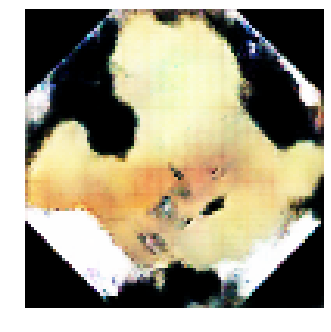


Epoch: 39420, D: -6.558, G: 3.484
Epoch: 39421, D: -5.598, G: 4.954
Epoch: 39422, D: -6.567, G: 5.3
Epoch: 39423, D: -6.021, G: 2.709
Epoch: 39424, D: -5.83, G: 4.79
Epoch: 39425, D: -6.404, G: 4.244
Epoch: 39426, D: -6.968, G: 2.812
Epoch: 39427, D: -6.606, G: 2.746
Epoch: 39428, D: -4.732, G: 5.045
Epoch: 39429, D: -6.178, G: 3.94
Epoch: 39430, D: -6.456, G: 2.7
Epoch: 39431, D: -6.35, G: 4.026
Epoch: 39432, D: -6.567, G: 3.049
Epoch: 39433, D: -5.991, G: 3.152
Epoch: 39434, D: -5.159, G: 4.589
Epoch: 39435, D: -5.981, G: 3.277
Epoch: 39436, D: -5.796, G: 3.912
Epoch: 39437, D: -6.44, G: 3.902
Epoch: 39438, D: -6.382, G: 4.152
Epoch: 39439, D: -5.14, G: 4.699


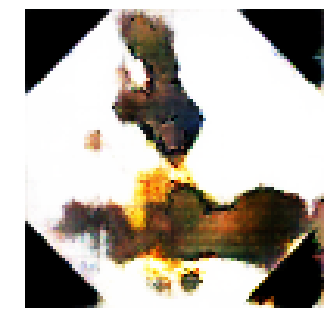


Epoch: 39440, D: -6.341, G: 3.588
Epoch: 39441, D: -5.953, G: 4.265
Epoch: 39442, D: -6.725, G: 4.193
Epoch: 39443, D: -6.556, G: 3.807
Epoch: 39444, D: -7.802, G: 4.26
Epoch: 39445, D: -6.968, G: 4.008
Epoch: 39446, D: -4.422, G: 4.803
Epoch: 39447, D: -6.62, G: 3.606
Epoch: 39448, D: -7.577, G: 3.147
Epoch: 39449, D: -5.443, G: 3.824
Epoch: 39450, D: -5.597, G: 2.301
Epoch: 39451, D: -6.582, G: 3.695
Epoch: 39452, D: -6.72, G: 4.976
Epoch: 39453, D: -5.27, G: 5.316
Epoch: 39454, D: -4.845, G: 6.705
Epoch: 39455, D: -6.43, G: 4.163
Epoch: 39456, D: -7.79, G: 3.062
Epoch: 39457, D: -6.56, G: 3.454
Epoch: 39458, D: -6.758, G: 4.652
Epoch: 39459, D: -7.561, G: 3.025


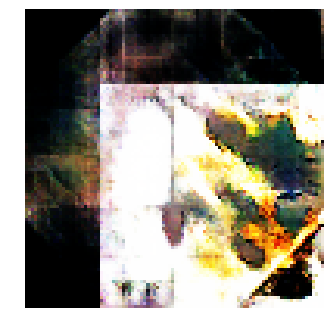


Epoch: 39460, D: -6.226, G: 3.887
Epoch: 39461, D: -5.961, G: 4.659
Epoch: 39462, D: -8.356, G: 1.339
Epoch: 39463, D: -5.99, G: 3.689
Epoch: 39464, D: -6.143, G: 3.225
Epoch: 39465, D: -6.763, G: 4.797
Epoch: 39466, D: -5.601, G: 4.167
Epoch: 39467, D: -7.313, G: 3.514
Epoch: 39468, D: -6.353, G: 3.824
Epoch: 39469, D: -5.135, G: 3.246
Epoch: 39470, D: -5.894, G: 4.856
Epoch: 39471, D: -5.849, G: 3.897
Epoch: 39472, D: -5.96, G: 4.176
Epoch: 39473, D: -7.034, G: 4.642
Epoch: 39474, D: -6.234, G: 3.004
Epoch: 39475, D: -6.909, G: 3.89
Epoch: 39476, D: -7.323, G: 3.056
Epoch: 39477, D: -6.517, G: 3.767
Epoch: 39478, D: -7.474, G: 2.697
Epoch: 39479, D: -6.221, G: 3.348


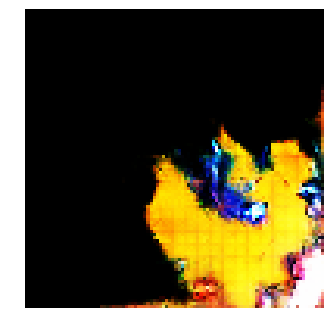


Epoch: 39480, D: -6.041, G: 3.618
Epoch: 39481, D: -6.483, G: 3.91
Epoch: 39482, D: -6.088, G: 4.381
Epoch: 39483, D: -6.757, G: 2.937
Epoch: 39484, D: -4.646, G: 1.912
Epoch: 39485, D: -6.675, G: 2.316
Epoch: 39486, D: -6.017, G: 2.604
Epoch: 39487, D: -5.563, G: 1.059
Epoch: 39488, D: -5.508, G: 3.201
Epoch: 39489, D: -7.021, G: 2.003
Epoch: 39490, D: -6.404, G: 2.819
Epoch: 39491, D: -5.91, G: 3.505
Epoch: 39492, D: -6.382, G: 3.313
Epoch: 39493, D: -4.823, G: 3.688
Epoch: 39494, D: -5.268, G: 3.272
Epoch: 39495, D: -5.875, G: 3.409
Epoch: 39496, D: -7.831, G: 3.199
Epoch: 39497, D: -6.655, G: 3.54
Epoch: 39498, D: -5.724, G: 6.045
Epoch: 39499, D: -7.685, G: 2.732


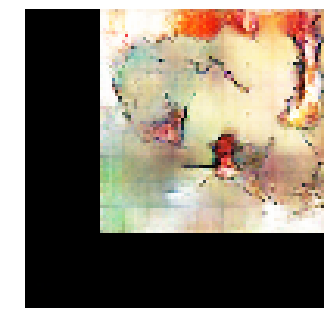


Epoch: 39500, D: -5.406, G: 3.465
Epoch: 39501, D: -6.818, G: 1.684
Epoch: 39502, D: -7.171, G: 0.8689
Epoch: 39503, D: -5.693, G: 2.328
Epoch: 39504, D: -4.744, G: 3.564
Epoch: 39505, D: -6.151, G: 4.601
Epoch: 39506, D: -7.803, G: 3.574
Epoch: 39507, D: -5.608, G: 4.319
Epoch: 39508, D: -6.075, G: 3.118
Epoch: 39509, D: -5.254, G: 4.213
Epoch: 39510, D: -7.13, G: 5.185
Epoch: 39511, D: -5.782, G: 4.241
Epoch: 39512, D: -4.915, G: 4.988
Epoch: 39513, D: -6.206, G: 5.627
Epoch: 39514, D: -6.759, G: 4.675
Epoch: 39515, D: -7.806, G: 5.84
Epoch: 39516, D: -5.782, G: 1.217
Epoch: 39517, D: -5.951, G: 4.279
Epoch: 39518, D: -7.281, G: 3.632
Epoch: 39519, D: -6.867, G: 3.87


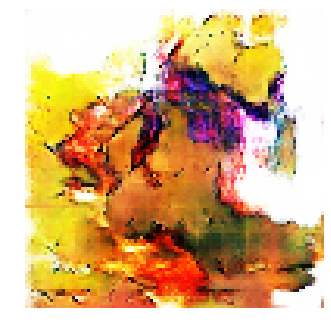


Epoch: 39520, D: -5.671, G: 4.168
Epoch: 39521, D: -6.426, G: 6.481
Epoch: 39522, D: -6.607, G: 3.061
Epoch: 39523, D: -6.681, G: 3.946
Epoch: 39524, D: -5.813, G: 2.293
Epoch: 39525, D: -6.78, G: 3.844
Epoch: 39526, D: -4.772, G: 2.857
Epoch: 39527, D: -6.212, G: 4.878
Epoch: 39528, D: -6.337, G: 5.556
Epoch: 39529, D: -6.429, G: 3.456
Epoch: 39530, D: -6.228, G: 2.175
Epoch: 39531, D: -4.85, G: 4.177
Epoch: 39532, D: -6.6, G: 5.199
Epoch: 39533, D: -8.149, G: 3.789
Epoch: 39534, D: -7.438, G: 2.844
Epoch: 39535, D: -6.483, G: 1.922
Epoch: 39536, D: -6.008, G: 3.901
Epoch: 39537, D: -7.254, G: 5.009
Epoch: 39538, D: -4.983, G: 4.556
Epoch: 39539, D: -5.679, G: 4.023


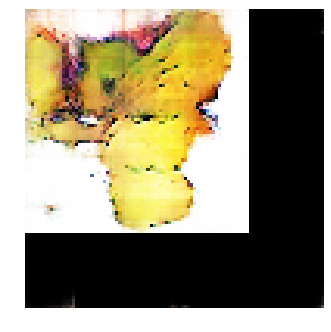


Epoch: 39540, D: -5.618, G: 4.921
Epoch: 39541, D: -5.937, G: 5.12
Epoch: 39542, D: -5.189, G: 4.086
Epoch: 39543, D: -6.487, G: 3.977
Epoch: 39544, D: -6.266, G: 1.58
Epoch: 39545, D: -8.222, G: 3.444
Epoch: 39546, D: -5.801, G: 2.737
Epoch: 39547, D: -7.112, G: 4.204
Epoch: 39548, D: -5.951, G: 2.884
Epoch: 39549, D: -6.489, G: 3.424
Epoch: 39550, D: -5.861, G: 1.679
Epoch: 39551, D: -5.211, G: 3.534
Epoch: 39552, D: -5.787, G: 3.883
Epoch: 39553, D: -6.249, G: 1.377
Epoch: 39554, D: -6.772, G: 4.377
Epoch: 39555, D: -5.126, G: 1.029
Epoch: 39556, D: -5.467, G: 3.292
Epoch: 39557, D: -6.989, G: 4.991
Epoch: 39558, D: -5.65, G: 2.498
Epoch: 39559, D: -5.563, G: 3.288


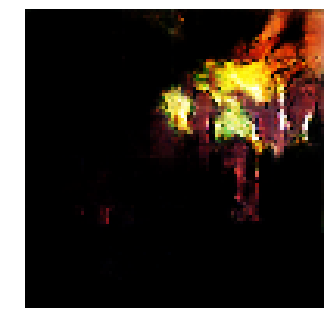


Epoch: 39560, D: -7.998, G: 3.062
Epoch: 39561, D: -6.169, G: 3.334
Epoch: 39562, D: -4.974, G: 3.464
Epoch: 39563, D: -6.972, G: 3.64
Epoch: 39564, D: -6.875, G: 3.188
Epoch: 39565, D: -6.124, G: 2.078
Epoch: 39566, D: -7.406, G: 4.04
Epoch: 39567, D: -6.06, G: 2.055
Epoch: 39568, D: -7.623, G: 2.12
Epoch: 39569, D: -6.766, G: 3.017
Epoch: 39570, D: -6.794, G: 2.756
Epoch: 39571, D: -5.863, G: 2.556
Epoch: 39572, D: -6.807, G: 3.487
Epoch: 39573, D: -5.139, G: 3.229
Epoch: 39574, D: -6.813, G: 4.695
Epoch: 39575, D: -6.504, G: 4.146
Epoch: 39576, D: -7.935, G: 2.149
Epoch: 39577, D: -6.428, G: 4.066
Epoch: 39578, D: -6.528, G: 3.882
Epoch: 39579, D: -5.375, G: 2.719


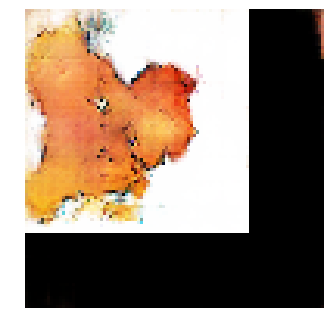


Epoch: 39580, D: -7.253, G: 1.757
Epoch: 39581, D: -4.974, G: 2.401
Epoch: 39582, D: -6.618, G: 2.333
Epoch: 39583, D: -4.95, G: 3.807
Epoch: 39584, D: -7.007, G: 2.636
Epoch: 39585, D: -6.918, G: 2.644
Epoch: 39586, D: -6.471, G: 3.582
Epoch: 39587, D: -5.135, G: 4.861
Epoch: 39588, D: -5.624, G: 3.784
Epoch: 39589, D: -7.883, G: 3.479
Epoch: 39590, D: -6.164, G: 3.38
Epoch: 39591, D: -5.901, G: 4.53
Epoch: 39592, D: -5.223, G: 2.907
Epoch: 39593, D: -7.203, G: 3.011
Epoch: 39594, D: -6.288, G: 5.112
Epoch: 39595, D: -5.925, G: 3.855
Epoch: 39596, D: -7.463, G: 4.062
Epoch: 39597, D: -6.327, G: 3.2
Epoch: 39598, D: -5.452, G: 4.205
Epoch: 39599, D: -6.361, G: 2.859


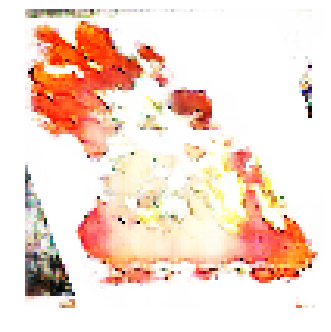


Epoch: 39600, D: -5.905, G: 2.679
Epoch: 39601, D: -5.978, G: 4.001
Epoch: 39602, D: -6.27, G: 3.515
Epoch: 39603, D: -6.561, G: 4.468
Epoch: 39604, D: -7.147, G: 4.15
Epoch: 39605, D: -7.17, G: 3.254
Epoch: 39606, D: -5.82, G: 2.583
Epoch: 39607, D: -6.054, G: 2.388
Epoch: 39608, D: -6.491, G: 3.716
Epoch: 39609, D: -6.733, G: 2.681
Epoch: 39610, D: -6.231, G: 1.543
Epoch: 39611, D: -5.823, G: 1.162
Epoch: 39612, D: -6.133, G: 2.787
Epoch: 39613, D: -6.102, G: 2.319
Epoch: 39614, D: -6.59, G: 2.529
Epoch: 39615, D: -5.892, G: 1.401
Epoch: 39616, D: -6.494, G: 1.764
Epoch: 39617, D: -6.71, G: 2.921
Epoch: 39618, D: -6.712, G: 3.073
Epoch: 39619, D: -5.245, G: 2.643


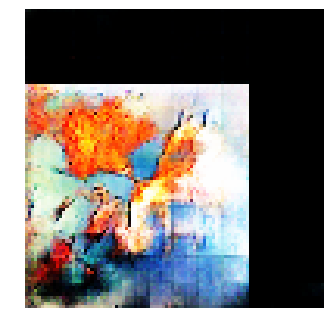


Epoch: 39620, D: -7.1, G: 2.703
Epoch: 39621, D: -6.647, G: 1.85
Epoch: 39622, D: -5.541, G: 3.292
Epoch: 39623, D: -5.354, G: 3.95
Epoch: 39624, D: -4.998, G: 1.682
Epoch: 39625, D: -5.859, G: 2.687
Epoch: 39626, D: -7.798, G: 2.93
Epoch: 39627, D: -6.417, G: 2.973
Epoch: 39628, D: -5.493, G: 4.635
Epoch: 39629, D: -6.531, G: 4.253
Epoch: 39630, D: -5.792, G: 1.934
Epoch: 39631, D: -7.051, G: 2.51
Epoch: 39632, D: -5.695, G: 3.202
Epoch: 39633, D: -5.271, G: 4.685
Epoch: 39634, D: -5.239, G: 3.436
Epoch: 39635, D: -7.489, G: 3.538
Epoch: 39636, D: -5.838, G: 4.197
Epoch: 39637, D: -5.07, G: 6.33
Epoch: 39638, D: -6.322, G: 2.769
Epoch: 39639, D: -6.98, G: 1.981


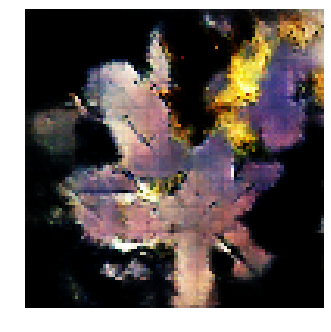


Epoch: 39640, D: -6.304, G: 4.507
Epoch: 39641, D: -6.155, G: 4.238
Epoch: 39642, D: -5.379, G: 2.408
Epoch: 39643, D: -6.515, G: 2.262
Epoch: 39644, D: -6.365, G: 3.305
Epoch: 39645, D: -5.991, G: 3.786
Epoch: 39646, D: -5.45, G: 4.567
Epoch: 39647, D: -4.988, G: 4.998
Epoch: 39648, D: -5.071, G: 5.088
Epoch: 39649, D: -6.831, G: 3.513
Epoch: 39650, D: -6.458, G: 2.89
Epoch: 39651, D: -5.46, G: 3.215
Epoch: 39652, D: -6.642, G: 2.606
Epoch: 39653, D: -5.275, G: 3.211
Epoch: 39654, D: -5.14, G: 4.528
Epoch: 39655, D: -6.305, G: 4.396
Epoch: 39656, D: -5.623, G: 2.268
Epoch: 39657, D: -7.76, G: 3.145
Epoch: 39658, D: -6.271, G: 3.851
Epoch: 39659, D: -5.585, G: 4.364


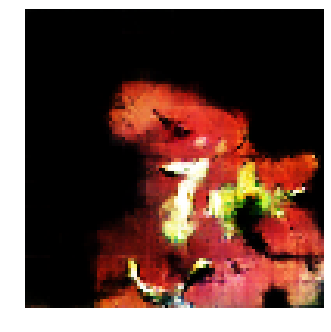


Epoch: 39660, D: -4.721, G: 2.954
Epoch: 39661, D: -5.941, G: 3.778
Epoch: 39662, D: -5.256, G: 4.706
Epoch: 39663, D: -5.193, G: 2.02
Epoch: 39664, D: -5.828, G: 2.673
Epoch: 39665, D: -7.272, G: 4.099
Epoch: 39666, D: -5.54, G: 3.373
Epoch: 39667, D: -6.682, G: 4.62
Epoch: 39668, D: -5.493, G: 2.933
Epoch: 39669, D: -6.842, G: 4.203
Epoch: 39670, D: -6.383, G: 2.514
Epoch: 39671, D: -6.11, G: 1.419
Epoch: 39672, D: -7.012, G: 2.507
Epoch: 39673, D: -5.354, G: 2.399
Epoch: 39674, D: -5.091, G: 2.601
Epoch: 39675, D: -6.464, G: 3.968
Epoch: 39676, D: -6.65, G: 1.873
Epoch: 39677, D: -5.519, G: 3.773
Epoch: 39678, D: -6.664, G: 5.147
Epoch: 39679, D: -7.088, G: 4.322


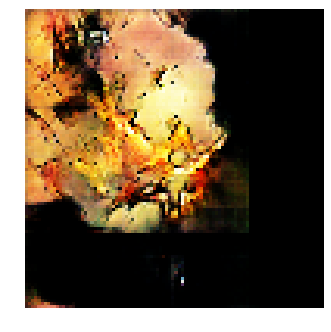


Epoch: 39680, D: -6.31, G: 3.771
Epoch: 39681, D: -6.954, G: 3.149
Epoch: 39682, D: -6.316, G: 3.949
Epoch: 39683, D: -7.592, G: 3.395
Epoch: 39684, D: -6.522, G: 3.884
Epoch: 39685, D: -6.402, G: 3.842
Epoch: 39686, D: -5.839, G: 4.155
Epoch: 39687, D: -7.169, G: 4.049
Epoch: 39688, D: -5.974, G: 2.972
Epoch: 39689, D: -6.776, G: 2.516
Epoch: 39690, D: -7.049, G: 2.37
Epoch: 39691, D: -6.337, G: 2.136
Epoch: 39692, D: -6.112, G: 4.348
Epoch: 39693, D: -7.275, G: 4.053
Epoch: 39694, D: -5.687, G: 1.926
Epoch: 39695, D: -6.193, G: 3.65
Epoch: 39696, D: -6.389, G: 4.603
Epoch: 39697, D: -7.448, G: 4.934
Epoch: 39698, D: -6.394, G: 5.062
Epoch: 39699, D: -7.073, G: 4.642


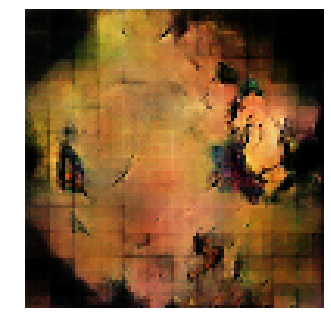


Epoch: 39700, D: -7.369, G: 4.529
Epoch: 39701, D: -5.352, G: 5.325
Epoch: 39702, D: -5.362, G: 3.888
Epoch: 39703, D: -6.632, G: 4.079
Epoch: 39704, D: -5.894, G: 3.982
Epoch: 39705, D: -5.853, G: 5.533
Epoch: 39706, D: -6.112, G: 4.441
Epoch: 39707, D: -5.026, G: 4.182
Epoch: 39708, D: -6.614, G: 3.484
Epoch: 39709, D: -6.165, G: 2.47
Epoch: 39710, D: -5.157, G: 2.693
Epoch: 39711, D: -5.029, G: 3.324
Epoch: 39712, D: -7.286, G: 3.063
Epoch: 39713, D: -6.101, G: 3.659
Epoch: 39714, D: -6.497, G: 4.867
Epoch: 39715, D: -5.956, G: 2.489
Epoch: 39716, D: -7.152, G: 4.034
Epoch: 39717, D: -7.088, G: 4.382
Epoch: 39718, D: -5.982, G: 4.214
Epoch: 39719, D: -7.028, G: 4.112


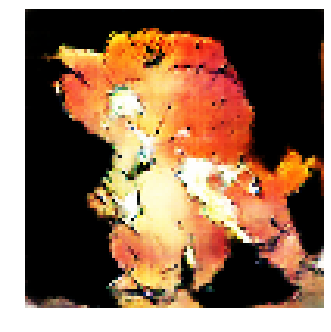


Epoch: 39720, D: -6.321, G: 3.964
Epoch: 39721, D: -6.172, G: 4.656
Epoch: 39722, D: -6.321, G: 3.621
Epoch: 39723, D: -7.986, G: 4.374
Epoch: 39724, D: -6.871, G: 3.547
Epoch: 39725, D: -6.45, G: 5.476
Epoch: 39726, D: -6.405, G: 4.148
Epoch: 39727, D: -6.477, G: 4.604
Epoch: 39728, D: -6.604, G: 2.825
Epoch: 39729, D: -6.02, G: 3.422
Epoch: 39730, D: -6.463, G: 4.472
Epoch: 39731, D: -7.204, G: 3.966
Epoch: 39732, D: -5.338, G: 3.082
Epoch: 39733, D: -5.166, G: 3.794
Epoch: 39734, D: -6.236, G: 3.567
Epoch: 39735, D: -6.582, G: 3.748
Epoch: 39736, D: -6.553, G: 4.169
Epoch: 39737, D: -6.287, G: 5.126
Epoch: 39738, D: -6.802, G: 4.062
Epoch: 39739, D: -7.696, G: 3.612


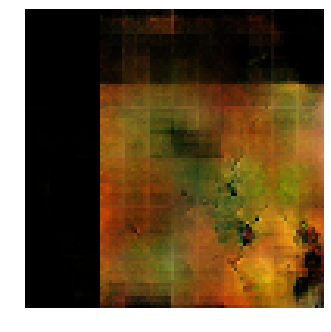


Epoch: 39740, D: -6.249, G: 5.054
Epoch: 39741, D: -6.502, G: 2.503
Epoch: 39742, D: -6.166, G: 3.063
Epoch: 39743, D: -4.976, G: 3.775
Epoch: 39744, D: -6.255, G: 6.22
Epoch: 39745, D: -6.752, G: 2.042
Epoch: 39746, D: -6.174, G: 3.836
Epoch: 39747, D: -6.88, G: 2.866
Epoch: 39748, D: -5.571, G: 3.131
Epoch: 39749, D: -5.656, G: 4.563
Epoch: 39750, D: -6.548, G: 3.129
Epoch: 39751, D: -4.894, G: 2.464
Epoch: 39752, D: -6.765, G: 4.294
Epoch: 39753, D: -6.316, G: 3.045
Epoch: 39754, D: -6.731, G: 3.409
Epoch: 39755, D: -6.907, G: 3.224
Epoch: 39756, D: -6.927, G: 3.25
Epoch: 39757, D: -7.487, G: 3.75
Epoch: 39758, D: -8.696, G: 4.643
Epoch: 39759, D: -6.178, G: 3.972


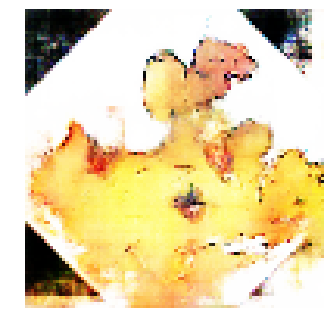


Epoch: 39760, D: -5.74, G: 3.339
Epoch: 39761, D: -7.452, G: 2.726
Epoch: 39762, D: -6.793, G: 3.482
Epoch: 39763, D: -5.222, G: 4.168
Epoch: 39764, D: -5.733, G: 3.425
Epoch: 39765, D: -6.481, G: 4.419
Epoch: 39766, D: -5.258, G: 3.067
Epoch: 39767, D: -4.984, G: 5.642
Epoch: 39768, D: -6.011, G: 4.052
Epoch: 39769, D: -5.594, G: 3.953
Epoch: 39770, D: -5.41, G: 4.144
Epoch: 39771, D: -6.578, G: 1.74
Epoch: 39772, D: -5.69, G: 4.701
Epoch: 39773, D: -5.36, G: 4.232
Epoch: 39774, D: -6.269, G: 3.437
Epoch: 39775, D: -5.442, G: 3.56
Epoch: 39776, D: -5.854, G: 3.403
Epoch: 39777, D: -5.103, G: 5.332
Epoch: 39778, D: -5.94, G: 4.274
Epoch: 39779, D: -8.445, G: 5.361


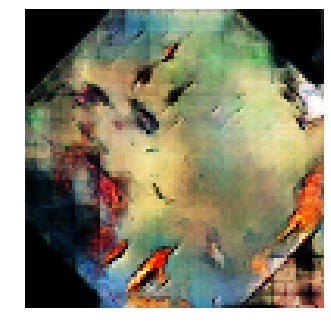


Epoch: 39780, D: -6.655, G: 4.217
Epoch: 39781, D: -6.764, G: 4.052
Epoch: 39782, D: -6.356, G: 3.005
Epoch: 39783, D: -5.396, G: 4.337
Epoch: 39784, D: -6.952, G: 4.922
Epoch: 39785, D: -5.466, G: 3.362
Epoch: 39786, D: -6.12, G: 4.595
Epoch: 39787, D: -6.46, G: 4.716
Epoch: 39788, D: -7.472, G: 4.168
Epoch: 39789, D: -6.917, G: 4.572
Epoch: 39790, D: -5.593, G: 5.232
Epoch: 39791, D: -5.861, G: 3.769
Epoch: 39792, D: -4.779, G: 3.683
Epoch: 39793, D: -6.383, G: 1.757
Epoch: 39794, D: -6.053, G: 3.363
Epoch: 39795, D: -8.092, G: 4.938
Epoch: 39796, D: -4.612, G: 2.4
Epoch: 39797, D: -6.285, G: 4.129
Epoch: 39798, D: -7.657, G: 3.481
Epoch: 39799, D: -7.247, G: 2.205


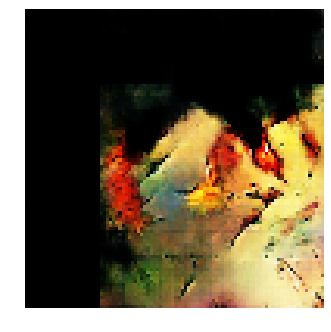


Epoch: 39800, D: -6.546, G: 4.753
Epoch: 39801, D: -7.452, G: 4.154
Epoch: 39802, D: -6.142, G: 2.932
Epoch: 39803, D: -6.473, G: 3.928
Epoch: 39804, D: -5.94, G: 4.454
Epoch: 39805, D: -5.174, G: 2.424
Epoch: 39806, D: -5.931, G: 4.345
Epoch: 39807, D: -6.754, G: 4.105
Epoch: 39808, D: -6.747, G: 5.442
Epoch: 39809, D: -6.418, G: 3.496
Epoch: 39810, D: -6.912, G: 4.826
Epoch: 39811, D: -5.727, G: 3.881
Epoch: 39812, D: -6.662, G: 5.304
Epoch: 39813, D: -5.772, G: 3.852
Epoch: 39814, D: -6.892, G: 3.337
Epoch: 39815, D: -7.264, G: 2.754
Epoch: 39816, D: -5.577, G: 1.982
Epoch: 39817, D: -6.079, G: 3.434
Epoch: 39818, D: -6.325, G: 4.262
Epoch: 39819, D: -5.927, G: 3.329


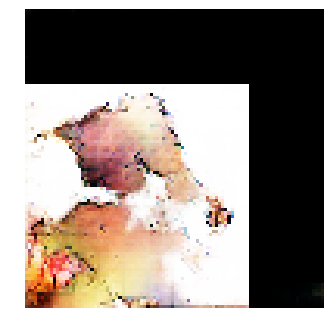


Epoch: 39820, D: -5.77, G: 3.36
Epoch: 39821, D: -7.378, G: 3.305
Epoch: 39822, D: -5.585, G: 4.041
Epoch: 39823, D: -6.969, G: 4.846
Epoch: 39824, D: -5.782, G: 4.921
Epoch: 39825, D: -5.805, G: 2.453
Epoch: 39826, D: -6.341, G: 6.003
Epoch: 39827, D: -7.627, G: 5.031
Epoch: 39828, D: -7.706, G: 4.046
Epoch: 39829, D: -6.398, G: 3.881
Epoch: 39830, D: -6.374, G: 2.74
Epoch: 39831, D: -6.632, G: 4.465
Epoch: 39832, D: -6.616, G: 1.848
Epoch: 39833, D: -6.091, G: 3.956
Epoch: 39834, D: -6.809, G: 4.704
Epoch: 39835, D: -6.237, G: 4.808
Epoch: 39836, D: -4.822, G: 4.853
Epoch: 39837, D: -4.643, G: 3.288
Epoch: 39838, D: -4.33, G: 4.283
Epoch: 39839, D: -4.678, G: 2.867


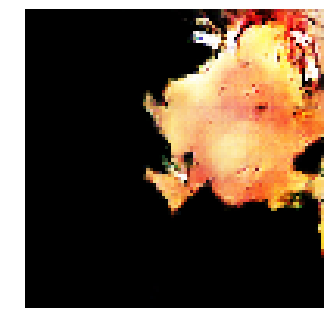


Epoch: 39840, D: -6.644, G: 5.34
Epoch: 39841, D: -6.258, G: 3.335
Epoch: 39842, D: -5.27, G: 4.245
Epoch: 39843, D: -6.295, G: 7.076
Epoch: 39844, D: -6.136, G: 4.005
Epoch: 39845, D: -5.536, G: 2.906
Epoch: 39846, D: -5.239, G: 3.703
Epoch: 39847, D: -5.546, G: 4.203
Epoch: 39848, D: -5.526, G: 4.851
Epoch: 39849, D: -6.302, G: 3.591
Epoch: 39850, D: -6.187, G: 2.533
Epoch: 39851, D: -6.222, G: 3.703
Epoch: 39852, D: -6.22, G: 3.699
Epoch: 39853, D: -7.344, G: 4.223
Epoch: 39854, D: -5.938, G: 3.479
Epoch: 39855, D: -7.292, G: 3.948
Epoch: 39856, D: -6.822, G: 4.774
Epoch: 39857, D: -6.729, G: 4.042
Epoch: 39858, D: -5.624, G: 5.205
Epoch: 39859, D: -6.143, G: 4.063


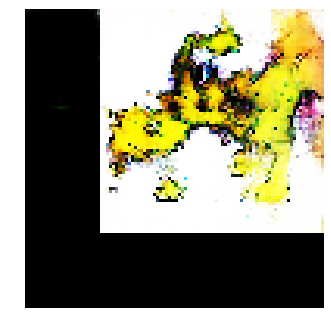


Epoch: 39860, D: -6.4, G: 3.318
Epoch: 39861, D: -5.403, G: 2.942
Epoch: 39862, D: -5.662, G: 3.203
Epoch: 39863, D: -6.051, G: 1.79
Epoch: 39864, D: -4.945, G: 3.29
Epoch: 39865, D: -6.539, G: 3.537
Epoch: 39866, D: -7.559, G: 2.257
Epoch: 39867, D: -5.848, G: 2.828
Epoch: 39868, D: -5.736, G: 3.857
Epoch: 39869, D: -7.293, G: 3.441
Epoch: 39870, D: -6.34, G: 3.191
Epoch: 39871, D: -5.917, G: 3.044
Epoch: 39872, D: -7.092, G: 4.61
Epoch: 39873, D: -6.775, G: 2.725
Epoch: 39874, D: -7.212, G: 4.681
Epoch: 39875, D: -6.128, G: 3.992
Epoch: 39876, D: -7.611, G: 3.335
Epoch: 39877, D: -5.699, G: 2.53
Epoch: 39878, D: -6.616, G: 5.113
Epoch: 39879, D: -5.743, G: 4.779


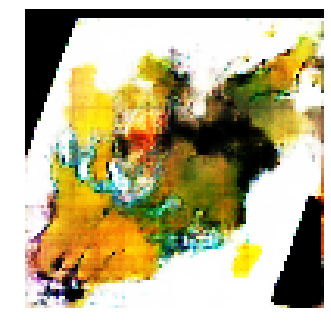


Epoch: 39880, D: -5.549, G: 5.423
Epoch: 39881, D: -5.314, G: 4.903
Epoch: 39882, D: -5.53, G: 3.524
Epoch: 39883, D: -5.194, G: 4.721
Epoch: 39884, D: -5.768, G: 1.543
Epoch: 39885, D: -6.477, G: 4.181
Epoch: 39886, D: -6.637, G: 2.277
Epoch: 39887, D: -6.005, G: 5.714
Epoch: 39888, D: -6.299, G: 4.565
Epoch: 39889, D: -6.951, G: 3.062
Epoch: 39890, D: -5.048, G: 2.127
Epoch: 39891, D: -5.186, G: 5.018
Epoch: 39892, D: -7.626, G: 4.424
Epoch: 39893, D: -6.249, G: 2.857
Epoch: 39894, D: -6.4, G: 3.564
Epoch: 39895, D: -5.812, G: 3.504
Epoch: 39896, D: -7.33, G: 4.25
Epoch: 39897, D: -5.694, G: 2.731
Epoch: 39898, D: -5.689, G: 3.23
Epoch: 39899, D: -7.056, G: 2.446


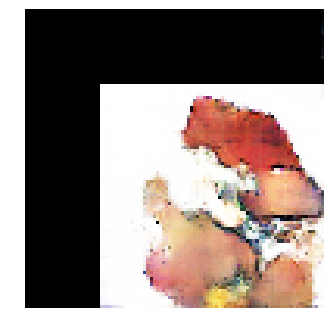


Epoch: 39900, D: -6.818, G: 3.473
Epoch: 39901, D: -5.595, G: 2.989
Epoch: 39902, D: -4.971, G: 2.658
Epoch: 39903, D: -8.24, G: 3.513
Epoch: 39904, D: -5.2, G: 2.815
Epoch: 39905, D: -5.158, G: 4.375
Epoch: 39906, D: -7.868, G: 3.526
Epoch: 39907, D: -5.798, G: 4.095
Epoch: 39908, D: -6.751, G: 3.783
Epoch: 39909, D: -6.355, G: 1.902
Epoch: 39910, D: -7.596, G: 3.692
Epoch: 39911, D: -5.236, G: 4.439
Epoch: 39912, D: -5.985, G: 5.346
Epoch: 39913, D: -8.339, G: 4.235
Epoch: 39914, D: -5.692, G: 4.426
Epoch: 39915, D: -7.026, G: 5.388
Epoch: 39916, D: -6.129, G: 4.313
Epoch: 39917, D: -7.425, G: 2.8
Epoch: 39918, D: -5.116, G: 2.739
Epoch: 39919, D: -6.767, G: 4.713


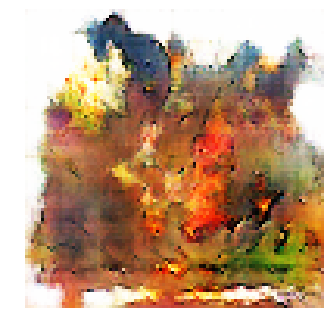


Epoch: 39920, D: -6.574, G: 4.256
Epoch: 39921, D: -6.221, G: 3.171
Epoch: 39922, D: -6.204, G: 3.233
Epoch: 39923, D: -7.115, G: 3.266
Epoch: 39924, D: -6.595, G: 2.28
Epoch: 39925, D: -6.457, G: 3.475
Epoch: 39926, D: -7.213, G: 4.845
Epoch: 39927, D: -6.373, G: 4.548
Epoch: 39928, D: -7.266, G: 3.918
Epoch: 39929, D: -6.297, G: 2.899
Epoch: 39930, D: -6.748, G: 4.789
Epoch: 39931, D: -6.288, G: 3.493
Epoch: 39932, D: -6.044, G: 3.215
Epoch: 39933, D: -6.807, G: 3.904
Epoch: 39934, D: -4.565, G: 3.264
Epoch: 39935, D: -5.893, G: 4.092
Epoch: 39936, D: -6.615, G: 5.185
Epoch: 39937, D: -7.01, G: 4.24
Epoch: 39938, D: -6.435, G: 3.005
Epoch: 39939, D: -5.889, G: 2.815


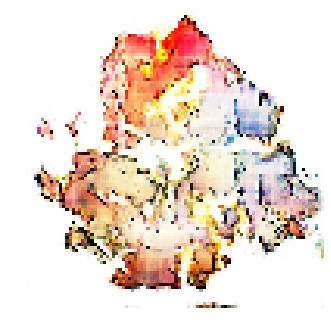


Epoch: 39940, D: -5.333, G: 4.735
Epoch: 39941, D: -6.051, G: 5.429
Epoch: 39942, D: -5.164, G: 3.654
Epoch: 39943, D: -6.393, G: 4.401
Epoch: 39944, D: -6.137, G: 3.939
Epoch: 39945, D: -7.909, G: 3.21
Epoch: 39946, D: -6.347, G: 3.717
Epoch: 39947, D: -6.914, G: 3.139
Epoch: 39948, D: -6.808, G: 3.958
Epoch: 39949, D: -5.793, G: 1.453
Epoch: 39950, D: -6.874, G: 2.531
Epoch: 39951, D: -6.05, G: 2.634
Epoch: 39952, D: -6.667, G: 1.599
Epoch: 39953, D: -5.163, G: 3.112
Epoch: 39954, D: -7.108, G: 3.037
Epoch: 39955, D: -7.198, G: 2.212
Epoch: 39956, D: -5.156, G: 3.286
Epoch: 39957, D: -6.014, G: 1.372
Epoch: 39958, D: -6.546, G: 3.921
Epoch: 39959, D: -5.789, G: 5.197


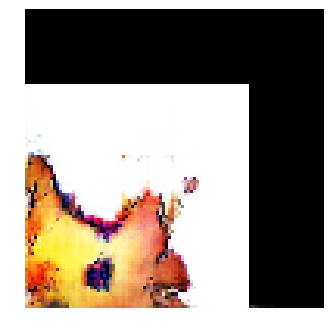


Epoch: 39960, D: -5.852, G: 2.961
Epoch: 39961, D: -4.802, G: 2.843
Epoch: 39962, D: -4.34, G: 4.325
Epoch: 39963, D: -6.638, G: 3.784
Epoch: 39964, D: -5.735, G: 1.869
Epoch: 39965, D: -6.338, G: 4.711
Epoch: 39966, D: -5.513, G: 5.378
Epoch: 39967, D: -6.751, G: 3.664
Epoch: 39968, D: -6.934, G: 4.274
Epoch: 39969, D: -5.744, G: 6.437
Epoch: 39970, D: -6.105, G: 5.978
Epoch: 39971, D: -5.875, G: 3.815
Epoch: 39972, D: -6.102, G: 3.309
Epoch: 39973, D: -6.096, G: 4.653
Epoch: 39974, D: -5.575, G: 3.258
Epoch: 39975, D: -5.701, G: 4.396
Epoch: 39976, D: -5.364, G: 2.735
Epoch: 39977, D: -6.77, G: 1.546
Epoch: 39978, D: -5.244, G: 1.846
Epoch: 39979, D: -6.81, G: 3.03


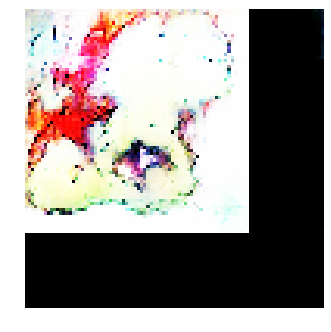


Epoch: 39980, D: -7.236, G: 3.364
Epoch: 39981, D: -6.463, G: 3.765
Epoch: 39982, D: -8.905, G: 2.589
Epoch: 39983, D: -6.99, G: 1.544
Epoch: 39984, D: -5.676, G: 1.615
Epoch: 39985, D: -5.216, G: 3.974
Epoch: 39986, D: -5.813, G: 2.842
Epoch: 39987, D: -7.115, G: 3.088
Epoch: 39988, D: -6.743, G: 3.753
Epoch: 39989, D: -6.391, G: 2.295
Epoch: 39990, D: -3.922, G: 4.966
Epoch: 39991, D: -5.558, G: 3.601
Epoch: 39992, D: -5.868, G: 3.83
Epoch: 39993, D: -6.817, G: 3.38
Epoch: 39994, D: -7.2, G: 5.668
Epoch: 39995, D: -6.38, G: 2.341
Epoch: 39996, D: -6.074, G: 4.669
Epoch: 39997, D: -5.293, G: 3.975
Epoch: 39998, D: -6.051, G: 4.931
Epoch: 39999, D: -7.623, G: 3.453


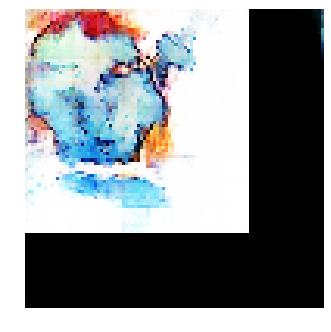


Epoch: 40000, D: -6.768, G: 4.446
Epoch: 40001, D: -5.56, G: 3.35
Epoch: 40002, D: -6.344, G: 4.403
Epoch: 40003, D: -4.16, G: 3.45
Epoch: 40004, D: -7.02, G: 3.223
Epoch: 40005, D: -5.3, G: 3.567
Epoch: 40006, D: -7.376, G: 4.092
Epoch: 40007, D: -6.62, G: 2.181
Epoch: 40008, D: -6.072, G: 2.917
Epoch: 40009, D: -6.665, G: 2.462
Epoch: 40010, D: -6.265, G: 3.687
Epoch: 40011, D: -6.044, G: 3.418
Epoch: 40012, D: -6.072, G: 4.441
Epoch: 40013, D: -6.684, G: 4.576
Epoch: 40014, D: -6.446, G: 5.428
Epoch: 40015, D: -5.965, G: 4.494
Epoch: 40016, D: -5.254, G: 4.019
Epoch: 40017, D: -7.071, G: 4.029
Epoch: 40018, D: -5.45, G: 5.387
Epoch: 40019, D: -6.355, G: 4.926


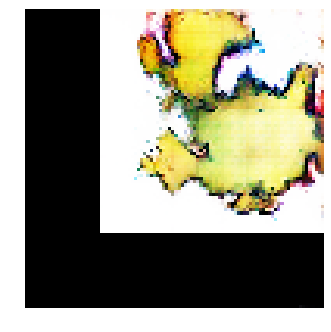


Epoch: 40020, D: -6.208, G: 2.441
Epoch: 40021, D: -7.034, G: 5.028
Epoch: 40022, D: -6.597, G: 5.049
Epoch: 40023, D: -6.414, G: 6.794
Epoch: 40024, D: -7.294, G: 4.024
Epoch: 40025, D: -5.548, G: 2.558
Epoch: 40026, D: -7.085, G: 3.487
Epoch: 40027, D: -6.74, G: 3.874
Epoch: 40028, D: -6.239, G: 5.112
Epoch: 40029, D: -5.496, G: 3.729
Epoch: 40030, D: -6.092, G: 3.078
Epoch: 40031, D: -6.599, G: 4.849
Epoch: 40032, D: -5.61, G: 3.567
Epoch: 40033, D: -4.71, G: 3.854
Epoch: 40034, D: -7.172, G: 3.708
Epoch: 40035, D: -6.127, G: 3.144
Epoch: 40036, D: -7.594, G: 5.0
Epoch: 40037, D: -6.899, G: 3.955
Epoch: 40038, D: -7.644, G: 2.809
Epoch: 40039, D: -6.368, G: 2.495


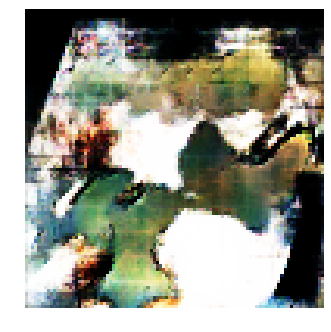


Epoch: 40040, D: -5.378, G: 4.53
Epoch: 40041, D: -4.792, G: 4.137
Epoch: 40042, D: -6.58, G: 3.858
Epoch: 40043, D: -5.763, G: 0.7539
Epoch: 40044, D: -6.443, G: 3.479
Epoch: 40045, D: -5.695, G: 3.15
Epoch: 40046, D: -6.602, G: 1.273
Epoch: 40047, D: -5.675, G: 3.085
Epoch: 40048, D: -6.183, G: 3.278
Epoch: 40049, D: -5.748, G: 4.031
Epoch: 40050, D: -6.95, G: 3.564
Epoch: 40051, D: -6.17, G: 2.577
Epoch: 40052, D: -5.718, G: 3.97
Epoch: 40053, D: -6.456, G: 3.687
Epoch: 40054, D: -6.714, G: 4.673
Epoch: 40055, D: -6.863, G: 4.554
Epoch: 40056, D: -5.604, G: 2.255
Epoch: 40057, D: -5.335, G: 3.118
Epoch: 40058, D: -5.225, G: 4.248
Epoch: 40059, D: -6.167, G: 2.295


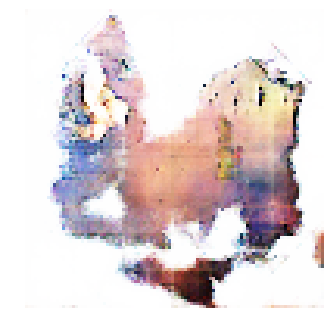


Epoch: 40060, D: -5.958, G: 5.399
Epoch: 40061, D: -6.653, G: 4.223
Epoch: 40062, D: -6.664, G: 3.936
Epoch: 40063, D: -6.911, G: 3.849
Epoch: 40064, D: -3.838, G: 5.631
Epoch: 40065, D: -6.105, G: 4.563
Epoch: 40066, D: -5.229, G: 4.306
Epoch: 40067, D: -6.32, G: 3.726
Epoch: 40068, D: -5.632, G: 1.956
Epoch: 40069, D: -6.32, G: 2.649
Epoch: 40070, D: -5.976, G: 2.828
Epoch: 40071, D: -7.902, G: 3.782
Epoch: 40072, D: -6.991, G: 2.683
Epoch: 40073, D: -6.939, G: 4.41
Epoch: 40074, D: -6.412, G: 3.895
Epoch: 40075, D: -5.903, G: 5.485
Epoch: 40076, D: -7.86, G: 4.588
Epoch: 40077, D: -6.864, G: 5.218
Epoch: 40078, D: -5.631, G: 2.531
Epoch: 40079, D: -6.691, G: 3.169


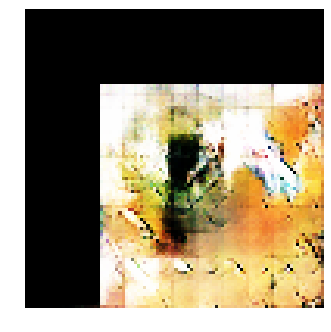


Epoch: 40080, D: -6.566, G: 4.607
Epoch: 40081, D: -6.11, G: 3.071
Epoch: 40082, D: -6.674, G: 4.222
Epoch: 40083, D: -6.956, G: 1.956
Epoch: 40084, D: -6.098, G: 2.496
Epoch: 40085, D: -6.108, G: 4.112
Epoch: 40086, D: -4.914, G: 2.803
Epoch: 40087, D: -5.864, G: 4.325
Epoch: 40088, D: -6.171, G: 3.352
Epoch: 40089, D: -5.414, G: 3.845
Epoch: 40090, D: -7.672, G: 4.17
Epoch: 40091, D: -6.475, G: 3.365
Epoch: 40092, D: -6.467, G: 4.698
Epoch: 40093, D: -5.594, G: 3.538
Epoch: 40094, D: -7.056, G: 2.113
Epoch: 40095, D: -6.025, G: 3.464
Epoch: 40096, D: -7.064, G: 2.809
Epoch: 40097, D: -7.028, G: 3.131
Epoch: 40098, D: -6.188, G: 2.117
Epoch: 40099, D: -6.023, G: 3.152


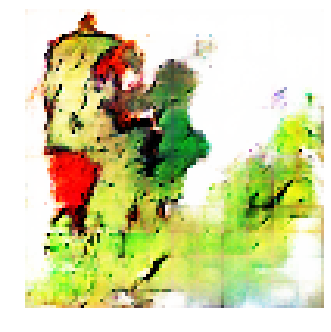


Epoch: 40100, D: -8.339, G: 4.075
Epoch: 40101, D: -7.313, G: 4.045
Epoch: 40102, D: -7.621, G: 4.15
Epoch: 40103, D: -6.128, G: 3.244
Epoch: 40104, D: -5.724, G: 4.044
Epoch: 40105, D: -5.794, G: 3.346
Epoch: 40106, D: -5.735, G: 2.841
Epoch: 40107, D: -6.056, G: 3.16
Epoch: 40108, D: -7.031, G: 2.239
Epoch: 40109, D: -7.893, G: 3.039
Epoch: 40110, D: -6.154, G: 3.706
Epoch: 40111, D: -7.5, G: 3.652
Epoch: 40112, D: -6.724, G: 6.294
Epoch: 40113, D: -6.944, G: 3.77
Epoch: 40114, D: -5.161, G: 4.672
Epoch: 40115, D: -6.703, G: 4.062
Epoch: 40116, D: -6.471, G: 2.048
Epoch: 40117, D: -7.829, G: 2.019
Epoch: 40118, D: -6.18, G: 3.06
Epoch: 40119, D: -6.779, G: 2.687


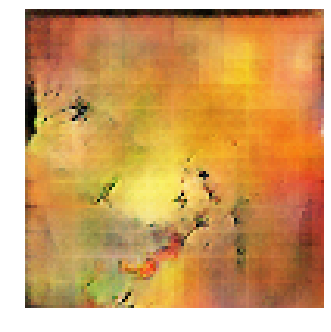


Epoch: 40120, D: -6.007, G: 2.168
Epoch: 40121, D: -5.635, G: 1.79
Epoch: 40122, D: -5.52, G: 3.344
Epoch: 40123, D: -7.646, G: 2.81
Epoch: 40124, D: -7.729, G: 2.422
Epoch: 40125, D: -5.66, G: 2.297
Epoch: 40126, D: -6.019, G: 2.632
Epoch: 40127, D: -5.711, G: 5.139
Epoch: 40128, D: -6.098, G: 3.732
Epoch: 40129, D: -7.577, G: 2.232
Epoch: 40130, D: -6.369, G: 3.741
Epoch: 40131, D: -6.159, G: 2.366
Epoch: 40132, D: -6.795, G: 2.306
Epoch: 40133, D: -6.937, G: 4.883
Epoch: 40134, D: -5.801, G: 4.019
Epoch: 40135, D: -5.943, G: 3.612
Epoch: 40136, D: -6.578, G: 4.983
Epoch: 40137, D: -6.678, G: 6.106
Epoch: 40138, D: -6.362, G: 4.436
Epoch: 40139, D: -5.276, G: 6.107


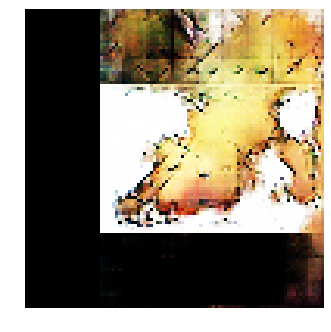


Epoch: 40140, D: -6.501, G: 3.99
Epoch: 40141, D: -7.145, G: 4.657
Epoch: 40142, D: -6.953, G: 2.207
Epoch: 40143, D: -7.309, G: 3.351
Epoch: 40144, D: -6.873, G: 4.24
Epoch: 40145, D: -6.664, G: 3.021
Epoch: 40146, D: -6.175, G: 3.695
Epoch: 40147, D: -8.125, G: 3.657
Epoch: 40148, D: -7.887, G: 3.16
Epoch: 40149, D: -7.701, G: 3.958
Epoch: 40150, D: -8.555, G: 3.3
Epoch: 40151, D: -5.782, G: 5.728
Epoch: 40152, D: -7.05, G: 5.45
Epoch: 40153, D: -6.027, G: 3.133
Epoch: 40154, D: -5.796, G: 5.62
Epoch: 40155, D: -6.447, G: 3.395
Epoch: 40156, D: -5.784, G: 5.746
Epoch: 40157, D: -6.281, G: 3.391
Epoch: 40158, D: -5.332, G: 3.652
Epoch: 40159, D: -6.576, G: 2.704


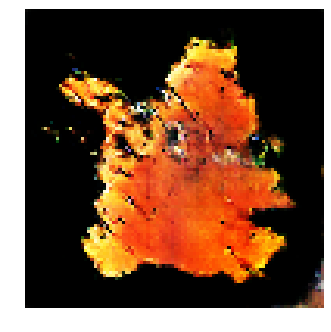


Epoch: 40160, D: -7.347, G: 4.992
Epoch: 40161, D: -5.874, G: 4.445
Epoch: 40162, D: -6.51, G: 2.84
Epoch: 40163, D: -7.589, G: 3.216
Epoch: 40164, D: -6.88, G: 2.266
Epoch: 40165, D: -7.101, G: 3.451
Epoch: 40166, D: -5.539, G: 3.864
Epoch: 40167, D: -5.314, G: 3.97
Epoch: 40168, D: -5.791, G: 5.684
Epoch: 40169, D: -5.58, G: 3.982
Epoch: 40170, D: -5.973, G: 3.298
Epoch: 40171, D: -5.32, G: 4.315
Epoch: 40172, D: -5.837, G: 2.22
Epoch: 40173, D: -7.664, G: 4.407
Epoch: 40174, D: -5.124, G: 2.638
Epoch: 40175, D: -7.259, G: 4.095
Epoch: 40176, D: -6.514, G: 2.353
Epoch: 40177, D: -5.159, G: 2.315
Epoch: 40178, D: -6.506, G: 4.906
Epoch: 40179, D: -5.547, G: 3.299


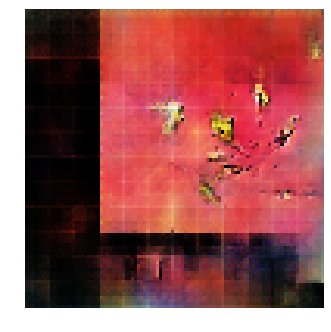


Epoch: 40180, D: -6.034, G: 5.717
Epoch: 40181, D: -6.809, G: 4.965
Epoch: 40182, D: -5.585, G: 2.577
Epoch: 40183, D: -6.044, G: 4.919
Epoch: 40184, D: -5.748, G: 3.785
Epoch: 40185, D: -7.373, G: 5.656
Epoch: 40186, D: -5.967, G: 3.474
Epoch: 40187, D: -6.626, G: 2.428
Epoch: 40188, D: -5.033, G: 3.834
Epoch: 40189, D: -5.194, G: 4.754
Epoch: 40190, D: -7.479, G: 2.876
Epoch: 40191, D: -6.438, G: 3.104
Epoch: 40192, D: -5.517, G: 2.614
Epoch: 40193, D: -5.714, G: 5.052
Epoch: 40194, D: -5.746, G: 3.2
Epoch: 40195, D: -5.416, G: 4.665
Epoch: 40196, D: -7.018, G: 4.115
Epoch: 40197, D: -7.944, G: 3.961
Epoch: 40198, D: -5.922, G: 3.497
Epoch: 40199, D: -7.709, G: 2.928


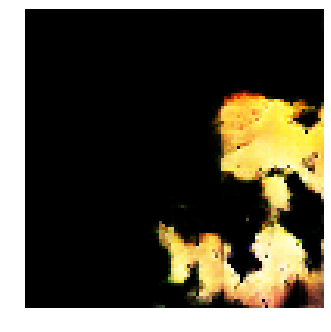


Epoch: 40200, D: -6.233, G: 2.27
Epoch: 40201, D: -6.974, G: 2.986
Epoch: 40202, D: -7.538, G: 3.138
Epoch: 40203, D: -5.59, G: 5.717
Epoch: 40204, D: -5.646, G: 3.264
Epoch: 40205, D: -5.75, G: 2.211
Epoch: 40206, D: -6.069, G: 2.512
Epoch: 40207, D: -6.391, G: 4.734
Epoch: 40208, D: -6.776, G: 5.88
Epoch: 40209, D: -4.99, G: 2.986
Epoch: 40210, D: -5.996, G: 4.283
Epoch: 40211, D: -5.802, G: 4.272
Epoch: 40212, D: -6.722, G: 4.06
Epoch: 40213, D: -6.384, G: 3.014
Epoch: 40214, D: -5.436, G: 2.711
Epoch: 40215, D: -7.363, G: 4.553
Epoch: 40216, D: -5.689, G: 3.347
Epoch: 40217, D: -4.915, G: 4.005
Epoch: 40218, D: -7.501, G: 3.652
Epoch: 40219, D: -5.226, G: 2.102


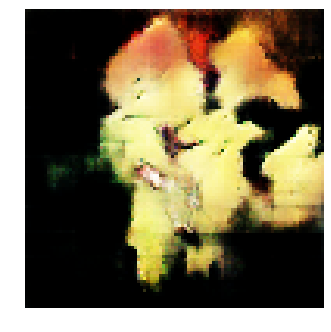


Epoch: 40220, D: -6.434, G: 3.519
Epoch: 40221, D: -5.854, G: 4.348
Epoch: 40222, D: -6.006, G: 3.066
Epoch: 40223, D: -4.411, G: 4.106
Epoch: 40224, D: -6.234, G: 3.99
Epoch: 40225, D: -6.026, G: 3.294
Epoch: 40226, D: -5.866, G: 2.207
Epoch: 40227, D: -6.36, G: 3.079
Epoch: 40228, D: -6.352, G: 4.002
Epoch: 40229, D: -7.3, G: 1.707
Epoch: 40230, D: -5.788, G: 2.378
Epoch: 40231, D: -6.286, G: 2.592
Epoch: 40232, D: -7.899, G: 3.828
Epoch: 40233, D: -7.646, G: 2.336
Epoch: 40234, D: -5.507, G: 3.37
Epoch: 40235, D: -6.984, G: 1.291
Epoch: 40236, D: -7.525, G: 2.806
Epoch: 40237, D: -7.286, G: 5.406
Epoch: 40238, D: -5.623, G: 4.56
Epoch: 40239, D: -5.902, G: 3.916


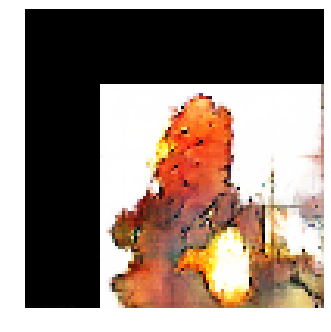


Epoch: 40240, D: -5.517, G: 5.041
Epoch: 40241, D: -7.976, G: 2.905
Epoch: 40242, D: -7.11, G: 2.654
Epoch: 40243, D: -5.783, G: 4.21
Epoch: 40244, D: -4.804, G: 4.763
Epoch: 40245, D: -6.717, G: 5.604
Epoch: 40246, D: -7.67, G: 4.292
Epoch: 40247, D: -7.346, G: 5.357
Epoch: 40248, D: -6.808, G: 4.605
Epoch: 40249, D: -5.307, G: 3.466
Epoch: 40250, D: -6.262, G: 3.77
Epoch: 40251, D: -6.488, G: 4.788
Epoch: 40252, D: -6.724, G: 3.952
Epoch: 40253, D: -7.446, G: 3.51
Epoch: 40254, D: -5.718, G: 4.846
Epoch: 40255, D: -6.412, G: 6.074
Epoch: 40256, D: -6.011, G: 3.36
Epoch: 40257, D: -4.676, G: 4.526
Epoch: 40258, D: -4.945, G: 4.868
Epoch: 40259, D: -4.953, G: 4.319


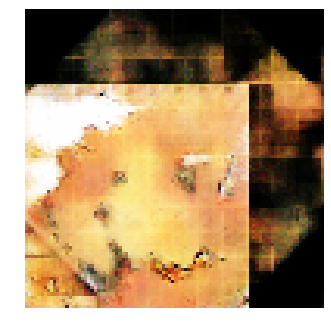


Epoch: 40260, D: -6.557, G: 5.995
Epoch: 40261, D: -5.172, G: 5.816
Epoch: 40262, D: -6.5, G: 2.976
Epoch: 40263, D: -6.016, G: 2.863
Epoch: 40264, D: -7.269, G: 5.862
Epoch: 40265, D: -5.66, G: 5.175
Epoch: 40266, D: -6.603, G: 5.005
Epoch: 40267, D: -5.807, G: 3.638
Epoch: 40268, D: -7.814, G: 4.925
Epoch: 40269, D: -5.758, G: 4.366
Epoch: 40270, D: -6.848, G: 4.045
Epoch: 40271, D: -6.243, G: 2.585
Epoch: 40272, D: -5.537, G: 2.81
Epoch: 40273, D: -6.515, G: 5.057
Epoch: 40274, D: -5.168, G: 3.916
Epoch: 40275, D: -6.266, G: 3.083
Epoch: 40276, D: -6.027, G: 3.664
Epoch: 40277, D: -5.343, G: 4.676
Epoch: 40278, D: -4.932, G: 5.199
Epoch: 40279, D: -5.844, G: 4.339


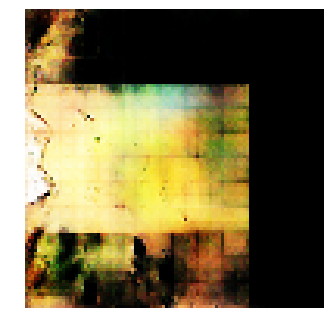


Epoch: 40280, D: -6.779, G: 4.451
Epoch: 40281, D: -7.192, G: 4.325
Epoch: 40282, D: -5.715, G: 3.283
Epoch: 40283, D: -5.493, G: 3.933
Epoch: 40284, D: -6.596, G: 2.551
Epoch: 40285, D: -5.105, G: 3.909
Epoch: 40286, D: -7.5, G: 3.885
Epoch: 40287, D: -4.637, G: 3.929
Epoch: 40288, D: -6.891, G: 4.082
Epoch: 40289, D: -4.111, G: 3.033
Epoch: 40290, D: -6.312, G: 5.269
Epoch: 40291, D: -5.044, G: 3.843
Epoch: 40292, D: -6.027, G: 3.852
Epoch: 40293, D: -6.392, G: 3.848
Epoch: 40294, D: -7.419, G: 3.431
Epoch: 40295, D: -7.419, G: 4.88
Epoch: 40296, D: -7.83, G: 4.232
Epoch: 40297, D: -4.333, G: 3.939
Epoch: 40298, D: -6.897, G: 4.158
Epoch: 40299, D: -4.927, G: 3.856


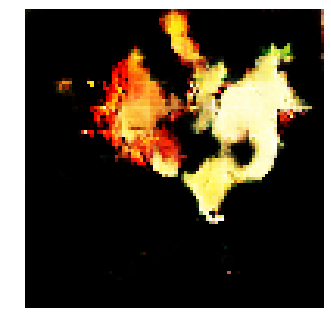


Epoch: 40300, D: -7.531, G: 3.476
Epoch: 40301, D: -7.281, G: 3.248
Epoch: 40302, D: -6.567, G: 3.828
Epoch: 40303, D: -5.094, G: 1.03
Epoch: 40304, D: -6.161, G: 1.735
Epoch: 40305, D: -8.093, G: 3.422
Epoch: 40306, D: -6.105, G: 4.119
Epoch: 40307, D: -4.883, G: 4.257
Epoch: 40308, D: -5.2, G: 3.726
Epoch: 40309, D: -5.718, G: 4.353
Epoch: 40310, D: -6.119, G: 4.743
Epoch: 40311, D: -7.464, G: 1.628
Epoch: 40312, D: -7.336, G: 1.784
Epoch: 40313, D: -5.965, G: 3.945
Epoch: 40314, D: -6.858, G: 4.318
Epoch: 40315, D: -6.503, G: 3.622
Epoch: 40316, D: -6.214, G: 4.084
Epoch: 40317, D: -5.986, G: 3.536
Epoch: 40318, D: -8.148, G: 5.825
Epoch: 40319, D: -5.481, G: 5.103


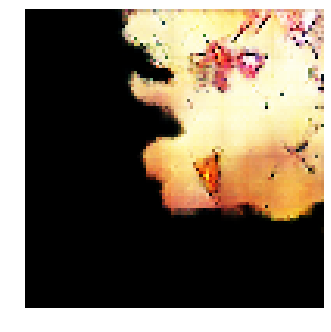


Epoch: 40320, D: -5.828, G: 4.955
Epoch: 40321, D: -7.385, G: 4.068
Epoch: 40322, D: -5.946, G: 4.825
Epoch: 40323, D: -6.116, G: 2.388
Epoch: 40324, D: -7.358, G: 6.378
Epoch: 40325, D: -6.0, G: 4.413
Epoch: 40326, D: -5.026, G: 4.954
Epoch: 40327, D: -6.388, G: 5.359
Epoch: 40328, D: -6.671, G: 4.681
Epoch: 40329, D: -5.801, G: 3.925
Epoch: 40330, D: -5.058, G: 4.306
Epoch: 40331, D: -7.262, G: 2.76
Epoch: 40332, D: -5.536, G: 2.647
Epoch: 40333, D: -5.342, G: 3.934
Epoch: 40334, D: -6.422, G: 3.602
Epoch: 40335, D: -6.246, G: 5.712
Epoch: 40336, D: -5.811, G: 3.206
Epoch: 40337, D: -5.265, G: 4.571
Epoch: 40338, D: -5.287, G: 2.39
Epoch: 40339, D: -6.979, G: 4.526


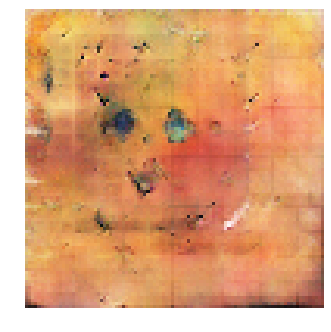


Epoch: 40340, D: -6.734, G: 5.725
Epoch: 40341, D: -6.052, G: 3.118
Epoch: 40342, D: -6.589, G: 5.749
Epoch: 40343, D: -7.338, G: 3.696
Epoch: 40344, D: -6.041, G: 3.894
Epoch: 40345, D: -5.597, G: 3.454
Epoch: 40346, D: -5.984, G: 4.39
Epoch: 40347, D: -5.619, G: 3.785
Epoch: 40348, D: -5.462, G: 2.18
Epoch: 40349, D: -4.793, G: 2.73
Epoch: 40350, D: -5.584, G: 1.956
Epoch: 40351, D: -5.084, G: 3.885
Epoch: 40352, D: -6.139, G: 2.8
Epoch: 40353, D: -5.748, G: 3.4
Epoch: 40354, D: -4.487, G: 4.588
Epoch: 40355, D: -6.205, G: 4.288
Epoch: 40356, D: -5.912, G: 2.03
Epoch: 40357, D: -5.894, G: 4.048
Epoch: 40358, D: -6.599, G: 2.381
Epoch: 40359, D: -6.15, G: 2.86


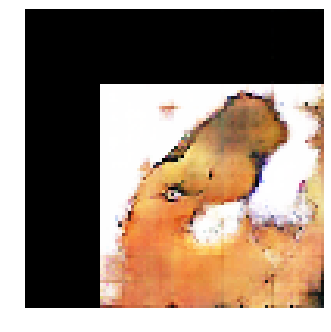


Epoch: 40360, D: -6.549, G: 2.893
Epoch: 40361, D: -7.739, G: 4.286
Epoch: 40362, D: -6.528, G: 3.559
Epoch: 40363, D: -5.842, G: 5.205
Epoch: 40364, D: -6.978, G: 3.526
Epoch: 40365, D: -6.31, G: 4.159
Epoch: 40366, D: -5.483, G: 4.581
Epoch: 40367, D: -6.695, G: 4.183
Epoch: 40368, D: -5.783, G: 2.361
Epoch: 40369, D: -6.665, G: 4.094
Epoch: 40370, D: -7.039, G: 4.106
Epoch: 40371, D: -5.837, G: 4.061
Epoch: 40372, D: -5.733, G: 3.992
Epoch: 40373, D: -7.234, G: 4.663
Epoch: 40374, D: -7.152, G: 6.08
Epoch: 40375, D: -5.992, G: 3.881
Epoch: 40376, D: -6.524, G: 5.956
Epoch: 40377, D: -5.823, G: 2.606
Epoch: 40378, D: -5.492, G: 3.127
Epoch: 40379, D: -7.189, G: 2.829


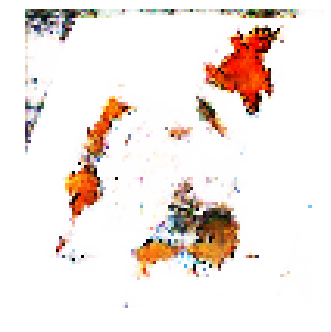


Epoch: 40380, D: -7.272, G: 1.945
Epoch: 40381, D: -7.106, G: 1.929
Epoch: 40382, D: -6.926, G: 3.551
Epoch: 40383, D: -6.363, G: 3.444
Epoch: 40384, D: -6.039, G: 3.695
Epoch: 40385, D: -8.105, G: 2.62
Epoch: 40386, D: -6.457, G: 2.866
Epoch: 40387, D: -5.529, G: 3.266
Epoch: 40388, D: -6.647, G: 3.525
Epoch: 40389, D: -6.514, G: 3.326
Epoch: 40390, D: -6.532, G: 2.015
Epoch: 40391, D: -6.109, G: 1.125
Epoch: 40392, D: -5.66, G: 4.159
Epoch: 40393, D: -6.961, G: 4.295
Epoch: 40394, D: -6.729, G: 4.171
Epoch: 40395, D: -6.565, G: 3.452
Epoch: 40396, D: -7.891, G: 3.853
Epoch: 40397, D: -6.707, G: 2.478
Epoch: 40398, D: -5.172, G: 3.293
Epoch: 40399, D: -6.329, G: 4.117


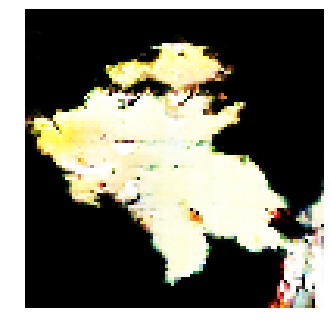


Epoch: 40400, D: -5.581, G: 3.4
Epoch: 40401, D: -4.933, G: 2.808
Epoch: 40402, D: -5.607, G: 4.249
Epoch: 40403, D: -5.814, G: 2.977
Epoch: 40404, D: -6.02, G: 3.495
Epoch: 40405, D: -6.172, G: 6.027
Epoch: 40406, D: -8.277, G: 5.484
Epoch: 40407, D: -7.738, G: 4.806
Epoch: 40408, D: -6.732, G: 3.319
Epoch: 40409, D: -7.239, G: 3.464
Epoch: 40410, D: -6.843, G: 3.717
Epoch: 40411, D: -5.672, G: 5.941
Epoch: 40412, D: -5.192, G: 3.979
Epoch: 40413, D: -7.247, G: 2.489
Epoch: 40414, D: -9.57, G: 3.167
Epoch: 40415, D: -8.052, G: 2.793
Epoch: 40416, D: -6.637, G: 3.507
Epoch: 40417, D: -6.485, G: 3.752
Epoch: 40418, D: -5.65, G: 3.286
Epoch: 40419, D: -5.971, G: 5.304


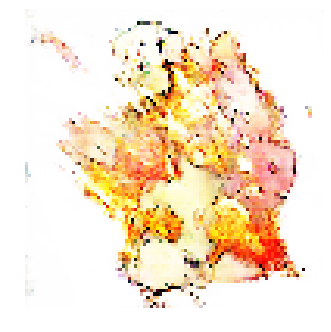


Epoch: 40420, D: -6.113, G: 4.386
Epoch: 40421, D: -6.429, G: 2.975
Epoch: 40422, D: -6.166, G: 4.633
Epoch: 40423, D: -6.559, G: 2.838
Epoch: 40424, D: -7.473, G: 4.176
Epoch: 40425, D: -5.872, G: 3.375
Epoch: 40426, D: -6.659, G: 3.845
Epoch: 40427, D: -5.503, G: 4.647
Epoch: 40428, D: -6.838, G: 3.289
Epoch: 40429, D: -5.979, G: 3.097
Epoch: 40430, D: -5.556, G: 4.869
Epoch: 40431, D: -6.337, G: 4.612
Epoch: 40432, D: -4.612, G: 5.105
Epoch: 40433, D: -6.616, G: 3.215
Epoch: 40434, D: -6.573, G: 1.5
Epoch: 40435, D: -6.578, G: 4.377
Epoch: 40436, D: -5.669, G: 3.362
Epoch: 40437, D: -5.766, G: 5.345
Epoch: 40438, D: -7.424, G: 3.198
Epoch: 40439, D: -5.457, G: 4.612


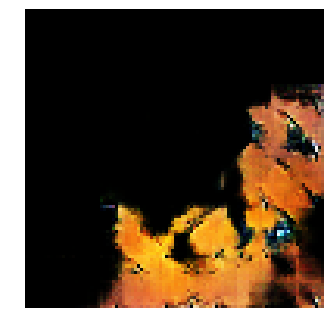


Epoch: 40440, D: -6.277, G: 3.504
Epoch: 40441, D: -5.503, G: 2.451
Epoch: 40442, D: -6.016, G: 3.798
Epoch: 40443, D: -6.493, G: 4.497
Epoch: 40444, D: -5.039, G: 2.822
Epoch: 40445, D: -5.566, G: 4.21
Epoch: 40446, D: -5.87, G: 3.373
Epoch: 40447, D: -5.655, G: 2.137
Epoch: 40448, D: -6.34, G: 4.089
Epoch: 40449, D: -5.892, G: 5.21
Epoch: 40450, D: -6.79, G: 4.363
Epoch: 40451, D: -7.943, G: 5.411
Epoch: 40452, D: -7.094, G: 3.849
Epoch: 40453, D: -5.883, G: 5.139
Epoch: 40454, D: -6.851, G: 2.372
Epoch: 40455, D: -5.693, G: 4.735
Epoch: 40456, D: -7.091, G: 3.529
Epoch: 40457, D: -7.122, G: 2.887
Epoch: 40458, D: -6.535, G: 3.198
Epoch: 40459, D: -7.088, G: 3.003


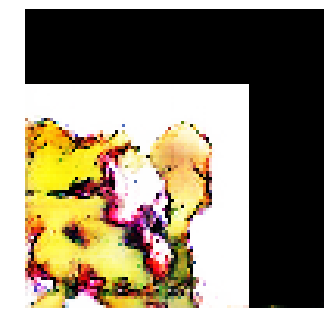


Epoch: 40460, D: -5.184, G: 3.169
Epoch: 40461, D: -5.647, G: 3.491
Epoch: 40462, D: -7.356, G: 3.197
Epoch: 40463, D: -5.567, G: 3.373
Epoch: 40464, D: -6.072, G: 4.406
Epoch: 40465, D: -4.63, G: 2.379
Epoch: 40466, D: -5.183, G: 2.662
Epoch: 40467, D: -7.321, G: 3.982
Epoch: 40468, D: -5.813, G: 3.038
Epoch: 40469, D: -6.376, G: 4.137
Epoch: 40470, D: -5.762, G: 2.876
Epoch: 40471, D: -5.554, G: 3.935
Epoch: 40472, D: -6.285, G: 4.574
Epoch: 40473, D: -5.127, G: 4.741
Epoch: 40474, D: -5.04, G: 2.666
Epoch: 40475, D: -6.242, G: 3.431
Epoch: 40476, D: -5.957, G: 6.026
Epoch: 40477, D: -6.631, G: 4.69
Epoch: 40478, D: -5.71, G: 5.265
Epoch: 40479, D: -5.08, G: 4.48


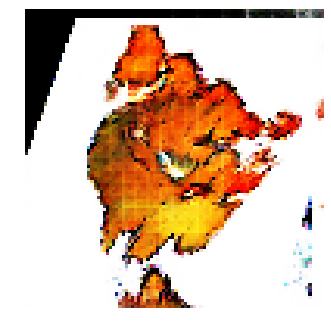


Epoch: 40480, D: -6.687, G: 4.028
Epoch: 40481, D: -4.655, G: 3.855
Epoch: 40482, D: -6.856, G: 3.334
Epoch: 40483, D: -6.832, G: 3.097
Epoch: 40484, D: -6.488, G: 3.806
Epoch: 40485, D: -6.167, G: 5.324
Epoch: 40486, D: -4.793, G: 4.622
Epoch: 40487, D: -6.262, G: 4.96
Epoch: 40488, D: -6.75, G: 5.097
Epoch: 40489, D: -5.789, G: 2.318
Epoch: 40490, D: -6.314, G: 3.381
Epoch: 40491, D: -5.512, G: 4.565
Epoch: 40492, D: -5.804, G: 3.475
Epoch: 40493, D: -5.275, G: 1.955
Epoch: 40494, D: -7.097, G: 4.522
Epoch: 40495, D: -7.877, G: 3.896
Epoch: 40496, D: -5.773, G: 4.272
Epoch: 40497, D: -5.991, G: 3.231
Epoch: 40498, D: -6.039, G: 3.727
Epoch: 40499, D: -4.844, G: 5.091


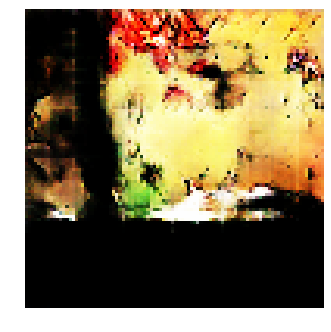


Epoch: 40500, D: -6.065, G: 4.351
Epoch: 40501, D: -6.868, G: 3.873
Epoch: 40502, D: -6.619, G: 4.103
Epoch: 40503, D: -5.514, G: 5.537
Epoch: 40504, D: -6.351, G: 3.179
Epoch: 40505, D: -7.111, G: 4.514
Epoch: 40506, D: -5.946, G: 3.422
Epoch: 40507, D: -5.892, G: 3.852
Epoch: 40508, D: -5.7, G: 3.317
Epoch: 40509, D: -4.969, G: 3.647
Epoch: 40510, D: -6.607, G: 2.051
Epoch: 40511, D: -7.199, G: 4.098
Epoch: 40512, D: -4.769, G: 3.418
Epoch: 40513, D: -6.185, G: 5.276
Epoch: 40514, D: -5.199, G: 5.111
Epoch: 40515, D: -5.313, G: 4.876
Epoch: 40516, D: -6.464, G: 2.986
Epoch: 40517, D: -6.236, G: 3.061
Epoch: 40518, D: -5.106, G: 2.122
Epoch: 40519, D: -5.416, G: 5.09


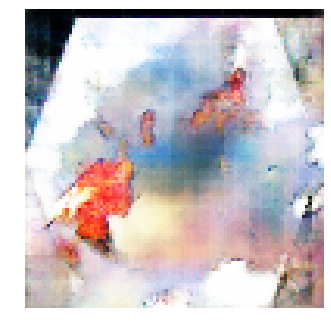


Epoch: 40520, D: -7.612, G: 2.686
Epoch: 40521, D: -5.076, G: 1.788
Epoch: 40522, D: -5.944, G: 3.484
Epoch: 40523, D: -5.059, G: 4.411
Epoch: 40524, D: -4.985, G: 3.613
Epoch: 40525, D: -4.844, G: 2.951
Epoch: 40526, D: -6.863, G: 3.883
Epoch: 40527, D: -5.067, G: 1.782
Epoch: 40528, D: -5.695, G: 4.559
Epoch: 40529, D: -6.179, G: 3.359
Epoch: 40530, D: -7.476, G: 3.072
Epoch: 40531, D: -7.317, G: 2.535
Epoch: 40532, D: -6.396, G: 2.85
Epoch: 40533, D: -6.166, G: 3.277
Epoch: 40534, D: -6.674, G: 4.761
Epoch: 40535, D: -6.065, G: 3.591
Epoch: 40536, D: -7.204, G: 4.189
Epoch: 40537, D: -5.992, G: 2.881
Epoch: 40538, D: -7.756, G: 3.751
Epoch: 40539, D: -5.756, G: 3.601


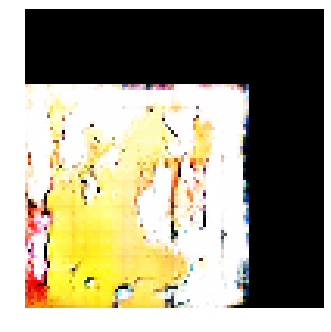


Epoch: 40540, D: -4.004, G: 2.74
Epoch: 40541, D: -6.404, G: 3.826
Epoch: 40542, D: -6.843, G: 3.602
Epoch: 40543, D: -5.007, G: 3.154
Epoch: 40544, D: -7.079, G: 3.682
Epoch: 40545, D: -5.838, G: 3.88
Epoch: 40546, D: -6.002, G: 2.6
Epoch: 40547, D: -4.827, G: 3.44
Epoch: 40548, D: -7.583, G: 2.931
Epoch: 40549, D: -6.338, G: 3.74
Epoch: 40550, D: -7.583, G: 1.955
Epoch: 40551, D: -5.912, G: 2.906
Epoch: 40552, D: -7.032, G: 4.481
Epoch: 40553, D: -5.834, G: 3.635
Epoch: 40554, D: -6.569, G: 3.435
Epoch: 40555, D: -5.493, G: 4.809
Epoch: 40556, D: -6.476, G: 3.931
Epoch: 40557, D: -6.959, G: 2.681
Epoch: 40558, D: -5.565, G: 3.321
Epoch: 40559, D: -7.543, G: 4.245


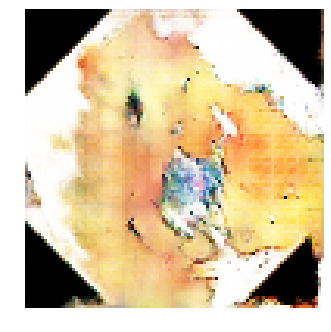


Epoch: 40560, D: -7.304, G: 3.226
Epoch: 40561, D: -6.601, G: 3.95
Epoch: 40562, D: -5.957, G: 3.771
Epoch: 40563, D: -7.447, G: 3.79
Epoch: 40564, D: -6.464, G: 3.773
Epoch: 40565, D: -6.172, G: 2.732
Epoch: 40566, D: -6.586, G: 3.777
Epoch: 40567, D: -6.899, G: 3.99
Epoch: 40568, D: -6.141, G: 4.691
Epoch: 40569, D: -4.656, G: 4.14
Epoch: 40570, D: -7.414, G: 4.352
Epoch: 40571, D: -6.154, G: 4.38
Epoch: 40572, D: -7.039, G: 1.716
Epoch: 40573, D: -4.614, G: 1.932
Epoch: 40574, D: -7.597, G: 4.435
Epoch: 40575, D: -8.327, G: 4.1
Epoch: 40576, D: -6.276, G: 2.836
Epoch: 40577, D: -5.338, G: 4.761
Epoch: 40578, D: -4.751, G: 3.371
Epoch: 40579, D: -5.122, G: 3.424


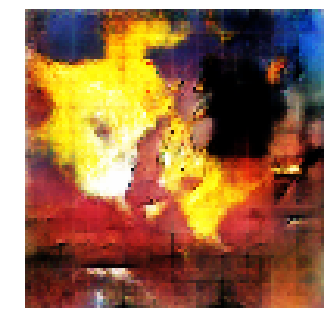


Epoch: 40580, D: -6.404, G: 3.393
Epoch: 40581, D: -5.16, G: 3.255
Epoch: 40582, D: -5.93, G: 4.373
Epoch: 40583, D: -5.685, G: 3.617
Epoch: 40584, D: -5.344, G: 2.623
Epoch: 40585, D: -6.876, G: 4.65
Epoch: 40586, D: -6.197, G: 3.932
Epoch: 40587, D: -5.679, G: 5.257
Epoch: 40588, D: -7.001, G: 6.233
Epoch: 40589, D: -6.549, G: 3.754
Epoch: 40590, D: -6.39, G: 3.348
Epoch: 40591, D: -6.354, G: 3.648
Epoch: 40592, D: -5.66, G: 1.919
Epoch: 40593, D: -6.423, G: 5.265
Epoch: 40594, D: -6.991, G: 3.677
Epoch: 40595, D: -5.661, G: 2.926
Epoch: 40596, D: -4.708, G: 4.297
Epoch: 40597, D: -6.466, G: 3.303
Epoch: 40598, D: -6.163, G: 3.534
Epoch: 40599, D: -6.677, G: 3.046


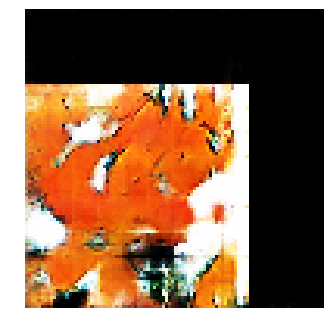


Epoch: 40600, D: -6.063, G: 4.476
Epoch: 40601, D: -5.019, G: 3.452
Epoch: 40602, D: -7.792, G: 2.983
Epoch: 40603, D: -7.325, G: 3.46
Epoch: 40604, D: -5.44, G: 4.079
Epoch: 40605, D: -6.733, G: 2.666
Epoch: 40606, D: -5.885, G: 2.364
Epoch: 40607, D: -6.551, G: 4.408
Epoch: 40608, D: -5.436, G: 5.044
Epoch: 40609, D: -6.032, G: 4.353
Epoch: 40610, D: -7.301, G: 5.251
Epoch: 40611, D: -4.773, G: 3.763
Epoch: 40612, D: -6.27, G: 3.288
Epoch: 40613, D: -5.666, G: 4.974
Epoch: 40614, D: -5.869, G: 4.396
Epoch: 40615, D: -7.585, G: 3.553
Epoch: 40616, D: -5.488, G: 3.951
Epoch: 40617, D: -7.178, G: 2.781
Epoch: 40618, D: -5.391, G: 2.126
Epoch: 40619, D: -6.232, G: 3.833


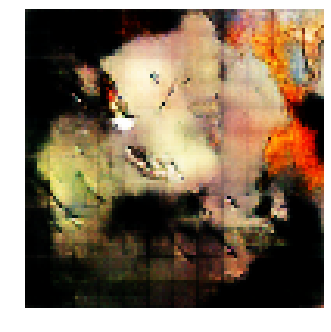


Epoch: 40620, D: -4.562, G: 3.344
Epoch: 40621, D: -6.641, G: 4.083
Epoch: 40622, D: -6.088, G: 3.989
Epoch: 40623, D: -5.706, G: 3.69
Epoch: 40624, D: -7.002, G: 2.555
Epoch: 40625, D: -5.661, G: 5.077
Epoch: 40626, D: -7.583, G: 5.968
Epoch: 40627, D: -6.675, G: 5.928
Epoch: 40628, D: -6.74, G: 5.252
Epoch: 40629, D: -7.635, G: 3.459
Epoch: 40630, D: -6.799, G: 4.718
Epoch: 40631, D: -5.753, G: 5.633
Epoch: 40632, D: -5.601, G: 5.033
Epoch: 40633, D: -5.018, G: 4.734
Epoch: 40634, D: -9.356, G: 3.498
Epoch: 40635, D: -7.242, G: 2.617
Epoch: 40636, D: -5.522, G: 6.683
Epoch: 40637, D: -6.994, G: 4.0
Epoch: 40638, D: -5.677, G: 3.111
Epoch: 40639, D: -7.0, G: 3.454


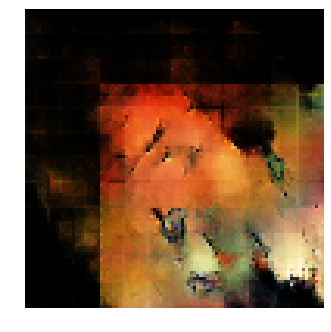


Epoch: 40640, D: -5.852, G: 2.804
Epoch: 40641, D: -5.681, G: 3.102
Epoch: 40642, D: -6.46, G: 2.667
Epoch: 40643, D: -5.767, G: 2.789
Epoch: 40644, D: -5.534, G: 2.842
Epoch: 40645, D: -6.084, G: 1.434
Epoch: 40646, D: -5.212, G: 1.938
Epoch: 40647, D: -7.013, G: 4.254
Epoch: 40648, D: -5.58, G: 2.047
Epoch: 40649, D: -6.53, G: 3.53
Epoch: 40650, D: -7.037, G: 3.737
Epoch: 40651, D: -5.806, G: 4.239
Epoch: 40652, D: -4.896, G: 3.404
Epoch: 40653, D: -6.004, G: 3.287
Epoch: 40654, D: -5.699, G: 1.703
Epoch: 40655, D: -4.001, G: 1.947
Epoch: 40656, D: -5.207, G: 5.215
Epoch: 40657, D: -6.916, G: 3.78
Epoch: 40658, D: -5.845, G: 4.025
Epoch: 40659, D: -6.951, G: 4.488


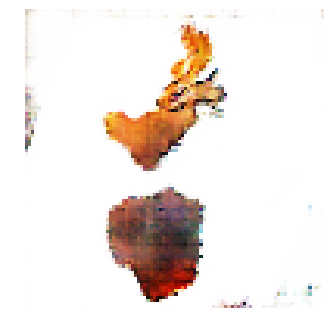


Epoch: 40660, D: -6.631, G: 3.918
Epoch: 40661, D: -5.974, G: 3.473
Epoch: 40662, D: -6.88, G: 3.503
Epoch: 40663, D: -6.898, G: 3.397
Epoch: 40664, D: -8.016, G: 4.705
Epoch: 40665, D: -6.255, G: 4.975
Epoch: 40666, D: -8.041, G: 5.111
Epoch: 40667, D: -6.452, G: 3.706
Epoch: 40668, D: -4.91, G: 4.468
Epoch: 40669, D: -5.953, G: 1.927
Epoch: 40670, D: -7.465, G: 3.5
Epoch: 40671, D: -5.743, G: 2.712
Epoch: 40672, D: -6.48, G: 3.37
Epoch: 40673, D: -6.368, G: 3.782
Epoch: 40674, D: -4.942, G: 4.541
Epoch: 40675, D: -5.565, G: 3.07
Epoch: 40676, D: -7.402, G: 3.858
Epoch: 40677, D: -4.751, G: 3.252
Epoch: 40678, D: -6.037, G: 3.023
Epoch: 40679, D: -6.395, G: 3.118


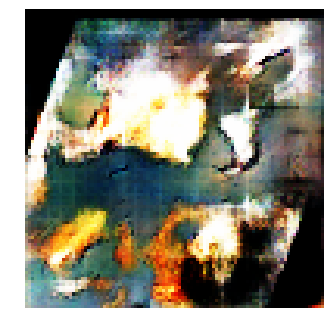


Epoch: 40680, D: -6.098, G: 3.704
Epoch: 40681, D: -5.754, G: 2.703
Epoch: 40682, D: -7.081, G: 4.289
Epoch: 40683, D: -6.302, G: 2.78
Epoch: 40684, D: -5.586, G: 3.591
Epoch: 40685, D: -5.803, G: 4.373
Epoch: 40686, D: -5.599, G: 4.155
Epoch: 40687, D: -6.28, G: 3.719
Epoch: 40688, D: -7.164, G: 3.276
Epoch: 40689, D: -5.042, G: 2.181
Epoch: 40690, D: -7.041, G: 5.114
Epoch: 40691, D: -6.307, G: 4.581
Epoch: 40692, D: -5.839, G: 3.576
Epoch: 40693, D: -6.028, G: 3.439
Epoch: 40694, D: -6.31, G: 2.982
Epoch: 40695, D: -7.727, G: 3.475
Epoch: 40696, D: -6.489, G: 3.117
Epoch: 40697, D: -6.442, G: 2.369
Epoch: 40698, D: -7.049, G: 2.596
Epoch: 40699, D: -6.704, G: 4.189


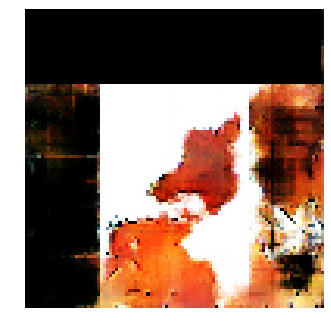


Epoch: 40700, D: -6.939, G: 2.887
Epoch: 40701, D: -6.084, G: 4.158
Epoch: 40702, D: -6.178, G: 3.723
Epoch: 40703, D: -8.152, G: 3.653
Epoch: 40704, D: -6.667, G: 3.549
Epoch: 40705, D: -7.435, G: 5.565
Epoch: 40706, D: -6.512, G: 3.85
Epoch: 40707, D: -6.068, G: 3.885
Epoch: 40708, D: -7.07, G: 2.578
Epoch: 40709, D: -5.317, G: 3.861
Epoch: 40710, D: -6.59, G: 3.727
Epoch: 40711, D: -5.441, G: 3.036
Epoch: 40712, D: -5.366, G: 4.612
Epoch: 40713, D: -4.631, G: 4.672
Epoch: 40714, D: -5.351, G: 6.628
Epoch: 40715, D: -6.86, G: 4.798
Epoch: 40716, D: -6.461, G: 3.231
Epoch: 40717, D: -5.464, G: 4.837
Epoch: 40718, D: -5.466, G: 3.682
Epoch: 40719, D: -6.27, G: 5.109


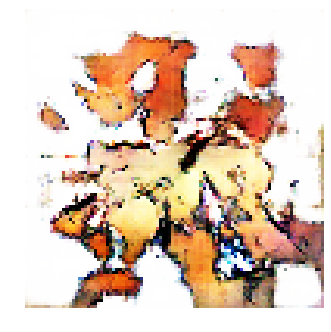


Epoch: 40720, D: -7.138, G: 4.512
Epoch: 40721, D: -6.838, G: 2.392
Epoch: 40722, D: -5.931, G: 4.173
Epoch: 40723, D: -5.775, G: 3.753
Epoch: 40724, D: -6.526, G: 3.62
Epoch: 40725, D: -7.025, G: 3.22
Epoch: 40726, D: -6.377, G: 2.331
Epoch: 40727, D: -6.357, G: 4.156
Epoch: 40728, D: -5.965, G: 3.508
Epoch: 40729, D: -6.055, G: 4.071
Epoch: 40730, D: -4.79, G: 3.067
Epoch: 40731, D: -6.659, G: 3.288
Epoch: 40732, D: -6.169, G: 4.229
Epoch: 40733, D: -4.862, G: 4.026
Epoch: 40734, D: -6.182, G: 5.306
Epoch: 40735, D: -6.891, G: 4.543
Epoch: 40736, D: -5.839, G: 4.542
Epoch: 40737, D: -6.55, G: 4.085
Epoch: 40738, D: -6.759, G: 4.738
Epoch: 40739, D: -6.972, G: 2.623


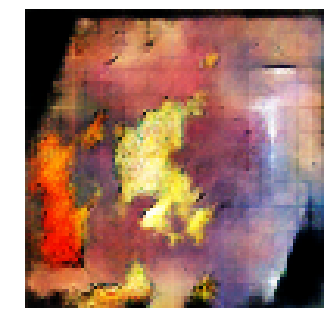


Epoch: 40740, D: -4.87, G: 4.654
Epoch: 40741, D: -6.342, G: 5.079
Epoch: 40742, D: -7.153, G: 4.656
Epoch: 40743, D: -5.496, G: 3.368
Epoch: 40744, D: -5.585, G: 4.295
Epoch: 40745, D: -6.297, G: 4.784
Epoch: 40746, D: -5.906, G: 3.545
Epoch: 40747, D: -7.296, G: 4.101
Epoch: 40748, D: -5.812, G: 5.612
Epoch: 40749, D: -5.401, G: 1.982
Epoch: 40750, D: -6.871, G: 3.208
Epoch: 40751, D: -6.131, G: 2.959
Epoch: 40752, D: -5.935, G: 3.971
Epoch: 40753, D: -7.295, G: 2.924
Epoch: 40754, D: -5.134, G: 3.047
Epoch: 40755, D: -4.423, G: 4.406
Epoch: 40756, D: -7.061, G: 3.329
Epoch: 40757, D: -6.112, G: 1.385
Epoch: 40758, D: -6.58, G: 2.682
Epoch: 40759, D: -5.549, G: 3.813


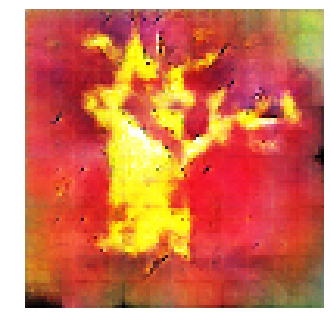


Epoch: 40760, D: -6.413, G: 3.233
Epoch: 40761, D: -6.965, G: 2.724
Epoch: 40762, D: -6.414, G: 3.438
Epoch: 40763, D: -5.348, G: 2.992
Epoch: 40764, D: -5.986, G: 4.75
Epoch: 40765, D: -6.196, G: 3.969
Epoch: 40766, D: -7.337, G: 5.331
Epoch: 40767, D: -6.306, G: 2.983
Epoch: 40768, D: -6.459, G: 3.539
Epoch: 40769, D: -6.962, G: 3.921
Epoch: 40770, D: -5.763, G: 3.579
Epoch: 40771, D: -7.156, G: 2.801
Epoch: 40772, D: -7.395, G: 3.076
Epoch: 40773, D: -4.817, G: 2.747
Epoch: 40774, D: -5.852, G: 3.88
Epoch: 40775, D: -7.764, G: 4.889
Epoch: 40776, D: -5.9, G: 2.908
Epoch: 40777, D: -6.95, G: 2.499
Epoch: 40778, D: -5.575, G: 2.96
Epoch: 40779, D: -6.196, G: 6.446


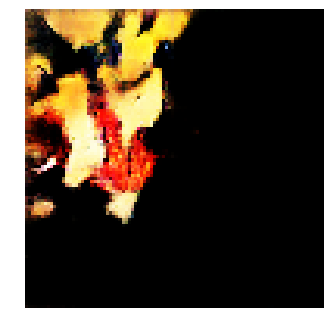


Epoch: 40780, D: -6.555, G: 3.783
Epoch: 40781, D: -5.643, G: 3.538
Epoch: 40782, D: -5.764, G: 2.929
Epoch: 40783, D: -5.246, G: 2.672
Epoch: 40784, D: -7.011, G: 2.858
Epoch: 40785, D: -6.796, G: 4.145
Epoch: 40786, D: -7.256, G: 2.424
Epoch: 40787, D: -6.395, G: 3.255
Epoch: 40788, D: -6.152, G: 3.946
Epoch: 40789, D: -5.219, G: 4.628
Epoch: 40790, D: -7.195, G: 3.472
Epoch: 40791, D: -6.528, G: 3.324
Epoch: 40792, D: -6.364, G: 3.772
Epoch: 40793, D: -6.845, G: 3.82
Epoch: 40794, D: -5.542, G: 3.635
Epoch: 40795, D: -5.766, G: 6.064
Epoch: 40796, D: -6.457, G: 4.301
Epoch: 40797, D: -6.672, G: 5.902
Epoch: 40798, D: -6.081, G: 4.197
Epoch: 40799, D: -6.034, G: 5.464


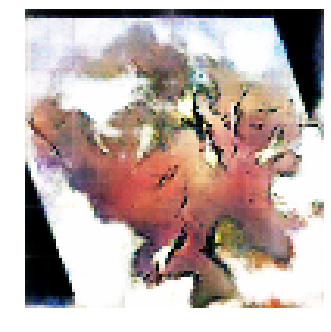


Epoch: 40800, D: -6.017, G: 4.357
Epoch: 40801, D: -7.057, G: 3.943
Epoch: 40802, D: -5.67, G: 3.103
Epoch: 40803, D: -5.62, G: 3.876
Epoch: 40804, D: -6.563, G: 3.696
Epoch: 40805, D: -5.536, G: 3.768
Epoch: 40806, D: -5.774, G: 4.656
Epoch: 40807, D: -7.091, G: 5.563
Epoch: 40808, D: -6.473, G: 2.545
Epoch: 40809, D: -6.385, G: 3.698
Epoch: 40810, D: -5.806, G: 3.566
Epoch: 40811, D: -5.885, G: 2.972
Epoch: 40812, D: -5.413, G: 2.58
Epoch: 40813, D: -5.756, G: 3.534
Epoch: 40814, D: -7.697, G: 3.454
Epoch: 40815, D: -6.329, G: 3.208
Epoch: 40816, D: -5.694, G: 3.432
Epoch: 40817, D: -4.98, G: 4.059
Epoch: 40818, D: -6.872, G: 2.96
Epoch: 40819, D: -5.552, G: 2.492


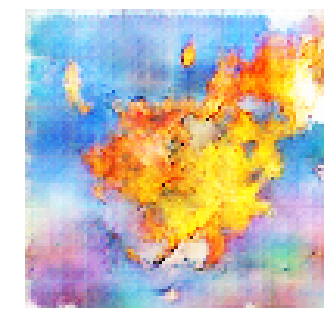


Epoch: 40820, D: -6.742, G: 3.182
Epoch: 40821, D: -6.287, G: 4.734
Epoch: 40822, D: -5.545, G: 4.025
Epoch: 40823, D: -6.056, G: 3.313
Epoch: 40824, D: -6.843, G: 5.317
Epoch: 40825, D: -5.999, G: 3.119
Epoch: 40826, D: -7.33, G: 4.561
Epoch: 40827, D: -5.937, G: 3.517
Epoch: 40828, D: -4.84, G: 2.993
Epoch: 40829, D: -6.578, G: 2.867
Epoch: 40830, D: -6.88, G: 1.873
Epoch: 40831, D: -5.644, G: 3.648
Epoch: 40832, D: -7.492, G: 5.337
Epoch: 40833, D: -6.747, G: 4.969
Epoch: 40834, D: -5.711, G: 1.816
Epoch: 40835, D: -6.923, G: 2.141
Epoch: 40836, D: -5.907, G: 2.898
Epoch: 40837, D: -5.207, G: 3.399
Epoch: 40838, D: -6.439, G: 4.759
Epoch: 40839, D: -7.286, G: 3.623


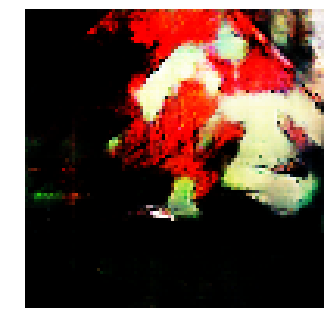


Epoch: 40840, D: -7.661, G: 2.069
Epoch: 40841, D: -6.515, G: 1.824
Epoch: 40842, D: -5.377, G: 3.408
Epoch: 40843, D: -7.609, G: 3.405
Epoch: 40844, D: -6.567, G: 3.239
Epoch: 40845, D: -6.289, G: 3.967
Epoch: 40846, D: -6.197, G: 3.851
Epoch: 40847, D: -6.482, G: 4.111
Epoch: 40848, D: -5.576, G: 2.442
Epoch: 40849, D: -5.635, G: 3.67
Epoch: 40850, D: -6.611, G: 2.874
Epoch: 40851, D: -5.356, G: 4.066
Epoch: 40852, D: -5.837, G: 6.49
Epoch: 40853, D: -4.679, G: 6.089
Epoch: 40854, D: -7.367, G: 4.979
Epoch: 40855, D: -5.912, G: 5.217
Epoch: 40856, D: -6.827, G: 4.769
Epoch: 40857, D: -6.556, G: 4.807
Epoch: 40858, D: -5.029, G: 4.444
Epoch: 40859, D: -6.517, G: 4.868


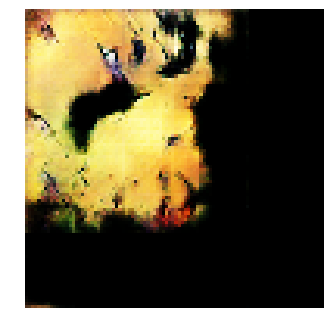


Epoch: 40860, D: -6.251, G: 4.169
Epoch: 40861, D: -4.899, G: 3.37
Epoch: 40862, D: -6.242, G: 2.918
Epoch: 40863, D: -6.334, G: 3.777
Epoch: 40864, D: -7.601, G: 4.335
Epoch: 40865, D: -7.041, G: 4.13
Epoch: 40866, D: -6.889, G: 4.044
Epoch: 40867, D: -6.742, G: 4.722
Epoch: 40868, D: -6.819, G: 4.165
Epoch: 40869, D: -5.205, G: 4.21
Epoch: 40870, D: -6.52, G: 2.69
Epoch: 40871, D: -6.791, G: 4.167
Epoch: 40872, D: -7.019, G: 4.176
Epoch: 40873, D: -5.445, G: 3.336
Epoch: 40874, D: -5.479, G: 3.094
Epoch: 40875, D: -6.367, G: 3.076
Epoch: 40876, D: -6.741, G: 3.908
Epoch: 40877, D: -6.757, G: 3.825
Epoch: 40878, D: -5.953, G: 2.794
Epoch: 40879, D: -8.037, G: 3.192


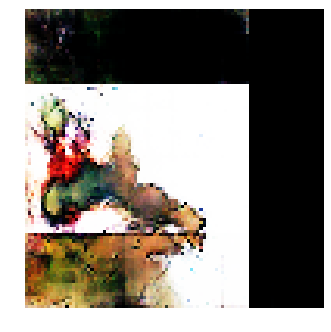


Epoch: 40880, D: -7.03, G: 4.569
Epoch: 40881, D: -5.683, G: 3.171
Epoch: 40882, D: -6.782, G: 4.961
Epoch: 40883, D: -6.278, G: 2.772
Epoch: 40884, D: -7.031, G: 5.437
Epoch: 40885, D: -6.429, G: 4.711
Epoch: 40886, D: -8.513, G: 5.424
Epoch: 40887, D: -6.304, G: 3.483
Epoch: 40888, D: -7.36, G: 4.869
Epoch: 40889, D: -5.675, G: 5.272
Epoch: 40890, D: -8.112, G: 3.757
Epoch: 40891, D: -7.396, G: 2.953
Epoch: 40892, D: -5.799, G: 1.595
Epoch: 40893, D: -5.228, G: 4.528
Epoch: 40894, D: -6.141, G: 4.64
Epoch: 40895, D: -5.905, G: 2.894
Epoch: 40896, D: -6.274, G: 3.556
Epoch: 40897, D: -5.725, G: 3.888
Epoch: 40898, D: -6.92, G: 4.927
Epoch: 40899, D: -7.781, G: 2.532


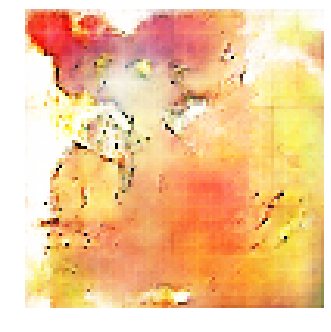


Epoch: 40900, D: -6.084, G: 4.332
Epoch: 40901, D: -6.632, G: 4.591
Epoch: 40902, D: -6.339, G: 4.765
Epoch: 40903, D: -5.814, G: 3.495
Epoch: 40904, D: -6.289, G: 4.607
Epoch: 40905, D: -4.961, G: 5.26
Epoch: 40906, D: -6.417, G: 3.65
Epoch: 40907, D: -7.409, G: 4.536
Epoch: 40908, D: -5.31, G: 4.188
Epoch: 40909, D: -5.517, G: 4.397
Epoch: 40910, D: -6.985, G: 3.895
Epoch: 40911, D: -6.565, G: 2.881
Epoch: 40912, D: -6.339, G: 3.056
Epoch: 40913, D: -4.886, G: 3.033
Epoch: 40914, D: -5.583, G: 3.414
Epoch: 40915, D: -6.666, G: 3.843
Epoch: 40916, D: -4.549, G: 2.904
Epoch: 40917, D: -5.55, G: 4.224
Epoch: 40918, D: -5.419, G: 2.632
Epoch: 40919, D: -7.238, G: 2.666


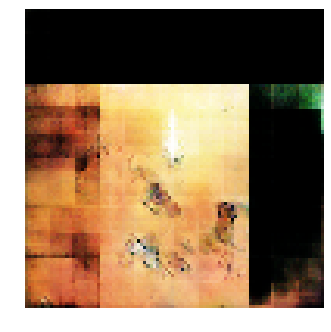


Epoch: 40920, D: -5.398, G: 1.619
Epoch: 40921, D: -8.457, G: 2.508
Epoch: 40922, D: -6.062, G: 1.798
Epoch: 40923, D: -6.255, G: 2.131
Epoch: 40924, D: -6.151, G: 4.593
Epoch: 40925, D: -7.098, G: 4.016
Epoch: 40926, D: -7.279, G: 2.666
Epoch: 40927, D: -5.719, G: 4.719
Epoch: 40928, D: -6.257, G: 4.504
Epoch: 40929, D: -7.368, G: 4.543
Epoch: 40930, D: -6.503, G: 4.772
Epoch: 40931, D: -6.908, G: 4.321
Epoch: 40932, D: -6.323, G: 3.631
Epoch: 40933, D: -7.073, G: 4.719
Epoch: 40934, D: -6.793, G: 5.535
Epoch: 40935, D: -5.7, G: 3.274
Epoch: 40936, D: -5.838, G: 4.136
Epoch: 40937, D: -5.516, G: 5.056
Epoch: 40938, D: -6.154, G: 4.308
Epoch: 40939, D: -7.763, G: 3.711


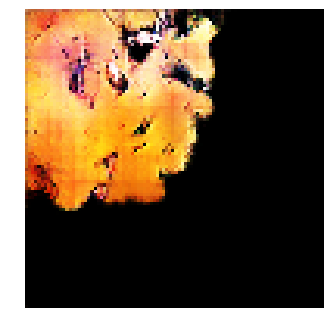


Epoch: 40940, D: -6.741, G: 2.623
Epoch: 40941, D: -6.355, G: 4.902
Epoch: 40942, D: -7.956, G: 2.677
Epoch: 40943, D: -8.604, G: 4.946
Epoch: 40944, D: -6.282, G: 3.472
Epoch: 40945, D: -7.137, G: 3.164
Epoch: 40946, D: -5.965, G: 4.799
Epoch: 40947, D: -5.971, G: 3.493
Epoch: 40948, D: -7.366, G: 4.68
Epoch: 40949, D: -5.485, G: 2.906
Epoch: 40950, D: -5.26, G: 4.646
Epoch: 40951, D: -6.515, G: 3.682
Epoch: 40952, D: -6.695, G: 6.394
Epoch: 40953, D: -7.063, G: 3.248
Epoch: 40954, D: -6.013, G: 3.947
Epoch: 40955, D: -6.414, G: 5.151
Epoch: 40956, D: -6.561, G: 5.351
Epoch: 40957, D: -6.008, G: 4.297
Epoch: 40958, D: -6.019, G: 2.556
Epoch: 40959, D: -5.558, G: 2.854


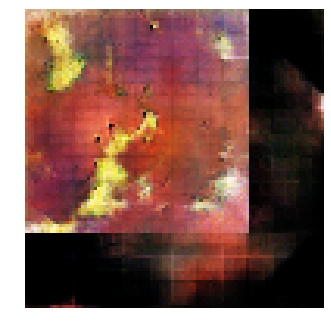


Epoch: 40960, D: -5.009, G: 2.703
Epoch: 40961, D: -4.548, G: 3.815
Epoch: 40962, D: -7.271, G: 2.212
Epoch: 40963, D: -6.215, G: 2.498
Epoch: 40964, D: -6.733, G: 2.272
Epoch: 40965, D: -5.499, G: 5.031
Epoch: 40966, D: -6.396, G: 3.738
Epoch: 40967, D: -6.276, G: 1.461
Epoch: 40968, D: -6.488, G: 4.716
Epoch: 40969, D: -6.251, G: 4.272
Epoch: 40970, D: -5.472, G: 3.66
Epoch: 40971, D: -6.322, G: 2.789
Epoch: 40972, D: -6.755, G: 4.609
Epoch: 40973, D: -6.222, G: 2.602
Epoch: 40974, D: -7.088, G: 2.427
Epoch: 40975, D: -6.352, G: 3.166
Epoch: 40976, D: -4.794, G: 2.857
Epoch: 40977, D: -7.086, G: 4.671
Epoch: 40978, D: -6.283, G: 4.579
Epoch: 40979, D: -6.131, G: 3.58


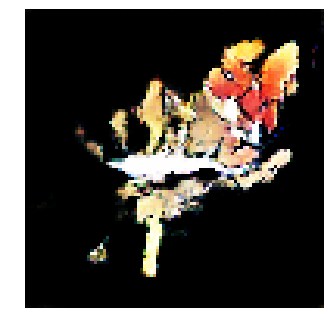


Epoch: 40980, D: -5.368, G: 2.042
Epoch: 40981, D: -6.275, G: 3.802
Epoch: 40982, D: -6.708, G: 2.58
Epoch: 40983, D: -6.529, G: 2.2
Epoch: 40984, D: -6.062, G: 1.1
Epoch: 40985, D: -5.866, G: 2.369
Epoch: 40986, D: -8.018, G: 3.702
Epoch: 40987, D: -6.515, G: 2.134
Epoch: 40988, D: -6.921, G: 2.706
Epoch: 40989, D: -6.071, G: 4.312
Epoch: 40990, D: -6.191, G: 3.027
Epoch: 40991, D: -7.312, G: 3.742
Epoch: 40992, D: -6.038, G: 4.1
Epoch: 40993, D: -6.842, G: 3.253
Epoch: 40994, D: -5.147, G: 4.734
Epoch: 40995, D: -5.301, G: 3.603
Epoch: 40996, D: -5.738, G: 2.851
Epoch: 40997, D: -5.977, G: 3.709
Epoch: 40998, D: -6.656, G: 3.589
Epoch: 40999, D: -6.81, G: 3.815


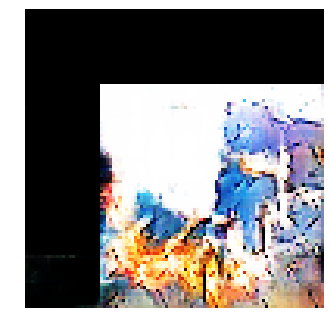


Epoch: 41000, D: -5.006, G: 4.595
Epoch: 41001, D: -5.556, G: 3.167
Epoch: 41002, D: -5.675, G: 4.234
Epoch: 41003, D: -5.241, G: 3.131
Epoch: 41004, D: -5.608, G: 3.518
Epoch: 41005, D: -6.377, G: 4.856
Epoch: 41006, D: -5.315, G: 3.873
Epoch: 41007, D: -6.948, G: 3.301
Epoch: 41008, D: -6.686, G: 3.458
Epoch: 41009, D: -7.792, G: 3.477
Epoch: 41010, D: -5.618, G: 6.461
Epoch: 41011, D: -6.01, G: 3.354
Epoch: 41012, D: -6.545, G: 3.552
Epoch: 41013, D: -4.756, G: 2.783
Epoch: 41014, D: -7.432, G: 3.66
Epoch: 41015, D: -6.264, G: 5.452
Epoch: 41016, D: -5.697, G: 3.82
Epoch: 41017, D: -6.247, G: 4.428
Epoch: 41018, D: -6.635, G: 3.125
Epoch: 41019, D: -6.313, G: 3.394


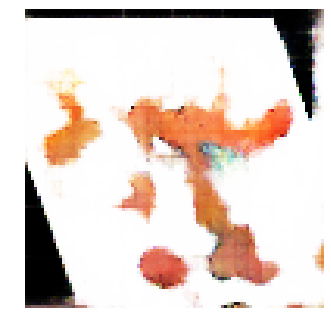


Epoch: 41020, D: -8.294, G: 2.766
Epoch: 41021, D: -6.599, G: 3.61
Epoch: 41022, D: -6.075, G: 1.915
Epoch: 41023, D: -4.738, G: 4.837
Epoch: 41024, D: -7.518, G: 5.176
Epoch: 41025, D: -5.003, G: 4.502
Epoch: 41026, D: -6.863, G: 4.3
Epoch: 41027, D: -5.922, G: 2.311
Epoch: 41028, D: -6.787, G: 3.347
Epoch: 41029, D: -5.866, G: 4.39
Epoch: 41030, D: -6.442, G: 4.25
Epoch: 41031, D: -6.686, G: 4.016
Epoch: 41032, D: -7.329, G: 4.153
Epoch: 41033, D: -7.446, G: 2.92
Epoch: 41034, D: -5.787, G: 3.145
Epoch: 41035, D: -6.264, G: 4.701
Epoch: 41036, D: -6.441, G: 2.266
Epoch: 41037, D: -6.437, G: 1.916
Epoch: 41038, D: -6.923, G: 4.29
Epoch: 41039, D: -5.893, G: 2.356


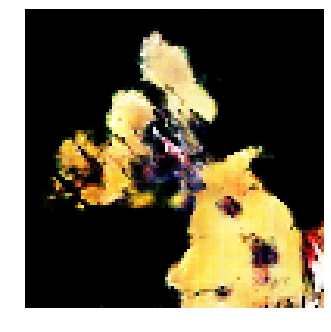


Epoch: 41040, D: -5.193, G: 4.38
Epoch: 41041, D: -6.478, G: 1.917
Epoch: 41042, D: -6.369, G: 1.928
Epoch: 41043, D: -5.817, G: 4.763
Epoch: 41044, D: -8.149, G: 2.671
Epoch: 41045, D: -6.119, G: 2.956
Epoch: 41046, D: -6.94, G: 4.018
Epoch: 41047, D: -6.342, G: 3.689
Epoch: 41048, D: -7.566, G: 4.146
Epoch: 41049, D: -6.536, G: 4.006
Epoch: 41050, D: -4.223, G: 4.384
Epoch: 41051, D: -7.48, G: 3.468
Epoch: 41052, D: -5.475, G: 2.223
Epoch: 41053, D: -6.564, G: 3.596
Epoch: 41054, D: -6.974, G: 4.373
Epoch: 41055, D: -6.734, G: 4.436
Epoch: 41056, D: -6.535, G: 3.114
Epoch: 41057, D: -5.02, G: 3.336
Epoch: 41058, D: -5.433, G: 4.447
Epoch: 41059, D: -6.394, G: 4.806


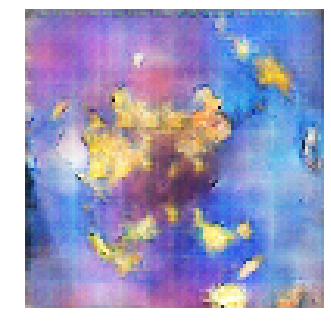


Epoch: 41060, D: -5.998, G: 4.433
Epoch: 41061, D: -4.102, G: 3.39
Epoch: 41062, D: -5.707, G: 4.225
Epoch: 41063, D: -5.14, G: 4.936
Epoch: 41064, D: -5.683, G: 4.053
Epoch: 41065, D: -6.904, G: 3.735
Epoch: 41066, D: -7.136, G: 4.082
Epoch: 41067, D: -6.461, G: 2.773
Epoch: 41068, D: -6.149, G: 5.323
Epoch: 41069, D: -5.546, G: 4.134
Epoch: 41070, D: -6.998, G: 4.54
Epoch: 41071, D: -6.516, G: 4.519
Epoch: 41072, D: -6.331, G: 3.286
Epoch: 41073, D: -6.135, G: 5.394
Epoch: 41074, D: -5.368, G: 4.092
Epoch: 41075, D: -7.134, G: 6.101
Epoch: 41076, D: -7.585, G: 3.332
Epoch: 41077, D: -6.178, G: 4.237
Epoch: 41078, D: -6.487, G: 3.847
Epoch: 41079, D: -6.627, G: 2.842


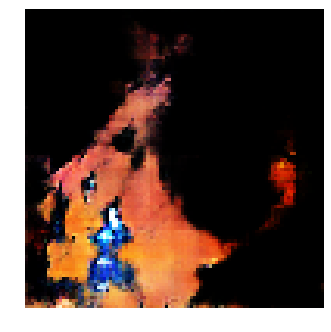


Epoch: 41080, D: -8.112, G: 4.414
Epoch: 41081, D: -5.816, G: 4.943
Epoch: 41082, D: -7.369, G: 3.948
Epoch: 41083, D: -6.102, G: 5.365
Epoch: 41084, D: -6.096, G: 5.315
Epoch: 41085, D: -6.641, G: 2.844
Epoch: 41086, D: -6.798, G: 2.448
Epoch: 41087, D: -6.463, G: 3.197
Epoch: 41088, D: -5.349, G: 2.943
Epoch: 41089, D: -6.286, G: 2.592
Epoch: 41090, D: -7.709, G: 2.583
Epoch: 41091, D: -5.948, G: 3.365
Epoch: 41092, D: -5.782, G: 5.234
Epoch: 41093, D: -5.719, G: 3.964
Epoch: 41094, D: -5.738, G: 4.974
Epoch: 41095, D: -5.645, G: 4.145
Epoch: 41096, D: -5.282, G: 2.253
Epoch: 41097, D: -5.8, G: 2.676
Epoch: 41098, D: -7.421, G: 4.125
Epoch: 41099, D: -6.399, G: 4.11


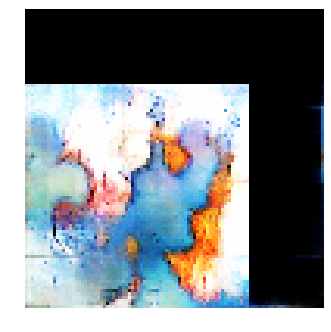


Epoch: 41100, D: -4.659, G: 2.396
Epoch: 41101, D: -6.007, G: 4.187
Epoch: 41102, D: -6.311, G: 2.717
Epoch: 41103, D: -6.223, G: 3.542
Epoch: 41104, D: -6.784, G: 3.258
Epoch: 41105, D: -5.711, G: 2.415
Epoch: 41106, D: -6.264, G: 4.182
Epoch: 41107, D: -7.476, G: 2.005
Epoch: 41108, D: -5.994, G: 2.119
Epoch: 41109, D: -6.249, G: 4.247
Epoch: 41110, D: -5.833, G: 2.357
Epoch: 41111, D: -6.266, G: 5.357
Epoch: 41112, D: -6.542, G: 4.604
Epoch: 41113, D: -6.472, G: 3.575
Epoch: 41114, D: -5.404, G: 4.481
Epoch: 41115, D: -6.328, G: 3.111
Epoch: 41116, D: -6.011, G: 3.895
Epoch: 41117, D: -5.178, G: 3.155
Epoch: 41118, D: -5.62, G: 4.334
Epoch: 41119, D: -5.374, G: 2.873


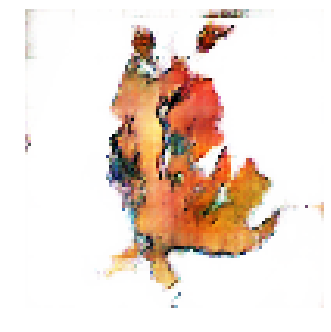


Epoch: 41120, D: -7.248, G: 4.554
Epoch: 41121, D: -6.855, G: 2.545
Epoch: 41122, D: -5.674, G: 3.123
Epoch: 41123, D: -6.78, G: 4.183
Epoch: 41124, D: -4.017, G: 5.016
Epoch: 41125, D: -4.801, G: 4.687
Epoch: 41126, D: -5.957, G: 3.643
Epoch: 41127, D: -6.951, G: 3.216
Epoch: 41128, D: -5.098, G: 2.26
Epoch: 41129, D: -6.791, G: 4.515
Epoch: 41130, D: -6.855, G: 2.507
Epoch: 41131, D: -5.534, G: 2.749
Epoch: 41132, D: -6.779, G: 3.04
Epoch: 41133, D: -6.824, G: 2.705
Epoch: 41134, D: -5.133, G: 3.577
Epoch: 41135, D: -6.405, G: 4.192
Epoch: 41136, D: -7.906, G: 4.167
Epoch: 41137, D: -6.789, G: 2.679
Epoch: 41138, D: -6.13, G: 3.407
Epoch: 41139, D: -6.869, G: 3.958


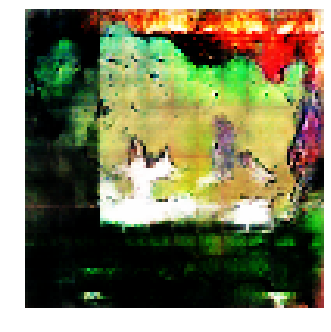


Epoch: 41140, D: -6.045, G: 4.434
Epoch: 41141, D: -6.187, G: 3.756
Epoch: 41142, D: -5.214, G: 2.817
Epoch: 41143, D: -5.888, G: 1.06
Epoch: 41144, D: -7.438, G: 2.493
Epoch: 41145, D: -5.924, G: 4.298
Epoch: 41146, D: -5.369, G: 3.152
Epoch: 41147, D: -4.611, G: 3.587
Epoch: 41148, D: -6.373, G: 3.741
Epoch: 41149, D: -6.776, G: 2.993
Epoch: 41150, D: -6.479, G: 5.305
Epoch: 41151, D: -5.03, G: 6.006
Epoch: 41152, D: -6.241, G: 2.788
Epoch: 41153, D: -5.414, G: 3.161
Epoch: 41154, D: -5.637, G: 4.226
Epoch: 41155, D: -6.788, G: 1.403
Epoch: 41156, D: -5.787, G: 3.244
Epoch: 41157, D: -6.028, G: 3.921
Epoch: 41158, D: -6.211, G: 3.336
Epoch: 41159, D: -5.992, G: 1.285


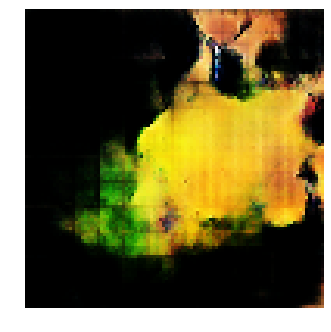


Epoch: 41160, D: -6.65, G: 3.68
Epoch: 41161, D: -6.538, G: 3.7
Epoch: 41162, D: -7.006, G: 5.527
Epoch: 41163, D: -6.05, G: 3.209
Epoch: 41164, D: -7.22, G: 4.405
Epoch: 41165, D: -5.235, G: 4.556
Epoch: 41166, D: -7.392, G: 5.492
Epoch: 41167, D: -4.792, G: 5.482
Epoch: 41168, D: -4.832, G: 3.165
Epoch: 41169, D: -7.632, G: 5.669
Epoch: 41170, D: -5.54, G: 3.775
Epoch: 41171, D: -6.998, G: 3.101
Epoch: 41172, D: -7.056, G: 4.338
Epoch: 41173, D: -5.584, G: 3.934
Epoch: 41174, D: -6.848, G: 5.034
Epoch: 41175, D: -6.47, G: 3.15
Epoch: 41176, D: -6.329, G: 4.279
Epoch: 41177, D: -7.422, G: 5.657
Epoch: 41178, D: -7.871, G: 2.078
Epoch: 41179, D: -5.438, G: 3.338


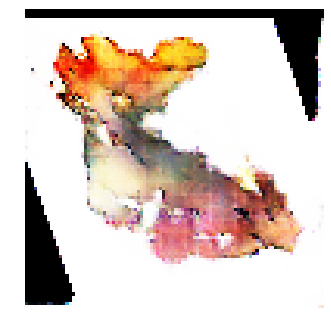


Epoch: 41180, D: -5.33, G: 3.372
Epoch: 41181, D: -6.359, G: 4.628
Epoch: 41182, D: -7.071, G: 4.408
Epoch: 41183, D: -5.599, G: 5.163
Epoch: 41184, D: -5.998, G: 4.424
Epoch: 41185, D: -5.069, G: 4.907
Epoch: 41186, D: -5.842, G: 6.06
Epoch: 41187, D: -6.621, G: 3.705
Epoch: 41188, D: -4.672, G: 1.576
Epoch: 41189, D: -5.866, G: 4.705
Epoch: 41190, D: -7.44, G: 4.807
Epoch: 41191, D: -5.961, G: 3.525
Epoch: 41192, D: -6.148, G: 3.594
Epoch: 41193, D: -5.868, G: 3.147
Epoch: 41194, D: -7.28, G: 5.078
Epoch: 41195, D: -4.115, G: 4.844
Epoch: 41196, D: -5.889, G: 4.485
Epoch: 41197, D: -5.657, G: 4.712
Epoch: 41198, D: -6.75, G: 4.818
Epoch: 41199, D: -7.872, G: 2.978


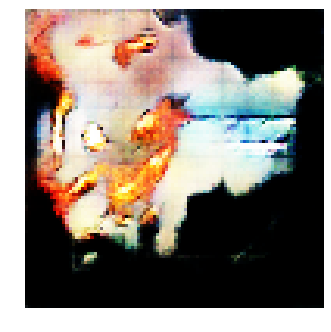


Epoch: 41200, D: -6.672, G: 3.025
Epoch: 41201, D: -6.045, G: 2.022
Epoch: 41202, D: -5.561, G: 4.936
Epoch: 41203, D: -7.014, G: 4.154
Epoch: 41204, D: -7.685, G: 3.145
Epoch: 41205, D: -5.834, G: 3.963
Epoch: 41206, D: -7.185, G: 3.898
Epoch: 41207, D: -7.916, G: 3.77
Epoch: 41208, D: -6.405, G: 4.967
Epoch: 41209, D: -7.447, G: 2.558
Epoch: 41210, D: -7.656, G: 4.252
Epoch: 41211, D: -7.008, G: 3.169
Epoch: 41212, D: -6.341, G: 4.313
Epoch: 41213, D: -6.715, G: 3.682
Epoch: 41214, D: -6.748, G: 3.525
Epoch: 41215, D: -5.585, G: 3.337
Epoch: 41216, D: -5.571, G: 4.123
Epoch: 41217, D: -5.912, G: 2.435
Epoch: 41218, D: -7.842, G: 3.713
Epoch: 41219, D: -5.127, G: 3.619


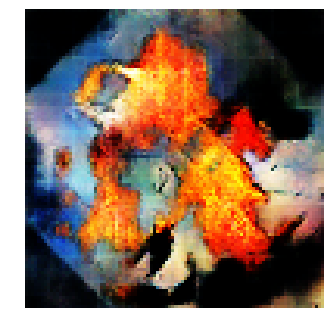


Epoch: 41220, D: -5.884, G: 2.62
Epoch: 41221, D: -6.612, G: 5.94
Epoch: 41222, D: -5.013, G: 3.587
Epoch: 41223, D: -4.502, G: 4.462
Epoch: 41224, D: -5.38, G: 2.988
Epoch: 41225, D: -5.904, G: 3.864
Epoch: 41226, D: -7.422, G: 5.9
Epoch: 41227, D: -7.929, G: 2.71
Epoch: 41228, D: -7.824, G: 4.302
Epoch: 41229, D: -6.602, G: 3.342
Epoch: 41230, D: -6.338, G: 3.529
Epoch: 41231, D: -5.975, G: 3.314
Epoch: 41232, D: -5.115, G: 2.713
Epoch: 41233, D: -5.244, G: 2.668
Epoch: 41234, D: -4.148, G: 3.158
Epoch: 41235, D: -6.046, G: 4.198
Epoch: 41236, D: -7.841, G: 3.584
Epoch: 41237, D: -6.517, G: 2.873
Epoch: 41238, D: -5.698, G: 3.826
Epoch: 41239, D: -6.184, G: 5.527


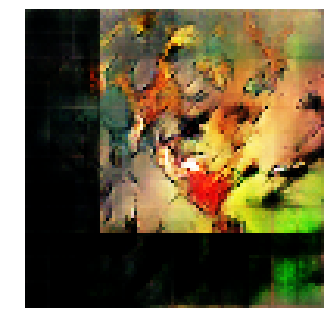


Epoch: 41240, D: -4.475, G: 4.072
Epoch: 41241, D: -6.648, G: 4.654
Epoch: 41242, D: -6.281, G: 5.406
Epoch: 41243, D: -7.703, G: 5.054
Epoch: 41244, D: -4.973, G: 3.516
Epoch: 41245, D: -4.382, G: 5.314
Epoch: 41246, D: -5.605, G: 2.761
Epoch: 41247, D: -6.933, G: 3.873
Epoch: 41248, D: -5.714, G: 5.003
Epoch: 41249, D: -7.111, G: 4.659
Epoch: 41250, D: -5.7, G: 3.865
Epoch: 41251, D: -6.344, G: 4.895
Epoch: 41252, D: -7.496, G: 2.446
Epoch: 41253, D: -6.291, G: 3.711
Epoch: 41254, D: -6.509, G: 5.416
Epoch: 41255, D: -7.196, G: 2.917
Epoch: 41256, D: -7.056, G: 2.661
Epoch: 41257, D: -5.948, G: 2.171
Epoch: 41258, D: -7.238, G: 4.329
Epoch: 41259, D: -5.637, G: 3.728


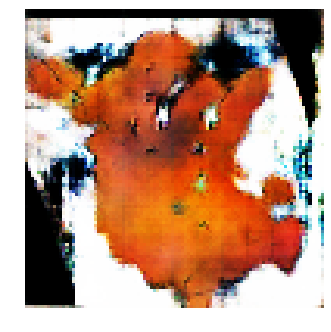


Epoch: 41260, D: -6.039, G: 6.288
Epoch: 41261, D: -7.191, G: 3.599
Epoch: 41262, D: -6.17, G: 5.552
Epoch: 41263, D: -7.107, G: 4.302
Epoch: 41264, D: -4.767, G: 4.624
Epoch: 41265, D: -6.807, G: 5.127
Epoch: 41266, D: -6.685, G: 4.18
Epoch: 41267, D: -5.234, G: 3.111
Epoch: 41268, D: -5.357, G: 2.822
Epoch: 41269, D: -4.916, G: 3.494
Epoch: 41270, D: -7.473, G: 3.067
Epoch: 41271, D: -4.989, G: 3.744
Epoch: 41272, D: -7.149, G: 2.644
Epoch: 41273, D: -4.934, G: 2.439
Epoch: 41274, D: -5.491, G: 4.005
Epoch: 41275, D: -6.606, G: 3.735
Epoch: 41276, D: -6.09, G: 3.697
Epoch: 41277, D: -6.43, G: 3.916
Epoch: 41278, D: -6.043, G: 2.589
Epoch: 41279, D: -5.412, G: 3.586


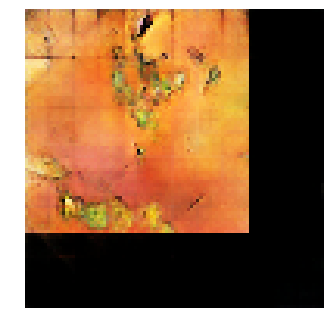


Epoch: 41280, D: -4.718, G: 4.038
Epoch: 41281, D: -5.099, G: 4.251
Epoch: 41282, D: -6.391, G: 3.42
Epoch: 41283, D: -7.447, G: 4.363
Epoch: 41284, D: -6.089, G: 3.763
Epoch: 41285, D: -6.848, G: 5.1
Epoch: 41286, D: -6.499, G: 4.452
Epoch: 41287, D: -6.221, G: 4.012
Epoch: 41288, D: -6.472, G: 4.467
Epoch: 41289, D: -6.427, G: 2.84
Epoch: 41290, D: -7.126, G: 4.08
Epoch: 41291, D: -6.405, G: 8.136
Epoch: 41292, D: -5.715, G: 5.991
Epoch: 41293, D: -5.728, G: 5.597
Epoch: 41294, D: -5.395, G: 5.723
Epoch: 41295, D: -5.477, G: 5.793
Epoch: 41296, D: -5.36, G: 3.276
Epoch: 41297, D: -8.02, G: 2.945
Epoch: 41298, D: -7.891, G: 3.795
Epoch: 41299, D: -6.256, G: 3.794


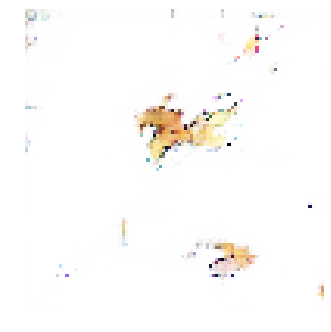


Epoch: 41300, D: -5.231, G: 3.093
Epoch: 41301, D: -5.537, G: 4.918
Epoch: 41302, D: -5.936, G: 4.172
Epoch: 41303, D: -6.821, G: 2.935
Epoch: 41304, D: -5.926, G: 4.053
Epoch: 41305, D: -6.77, G: 4.764
Epoch: 41306, D: -6.089, G: 3.303
Epoch: 41307, D: -6.869, G: 4.113
Epoch: 41308, D: -6.266, G: 3.381
Epoch: 41309, D: -5.958, G: 3.667
Epoch: 41310, D: -6.684, G: 4.106
Epoch: 41311, D: -6.026, G: 3.118
Epoch: 41312, D: -4.961, G: 3.826
Epoch: 41313, D: -6.245, G: 3.745
Epoch: 41314, D: -5.049, G: 5.015
Epoch: 41315, D: -6.857, G: 4.181
Epoch: 41316, D: -6.099, G: 3.197
Epoch: 41317, D: -4.58, G: 3.632
Epoch: 41318, D: -6.544, G: 6.173
Epoch: 41319, D: -5.634, G: 3.898


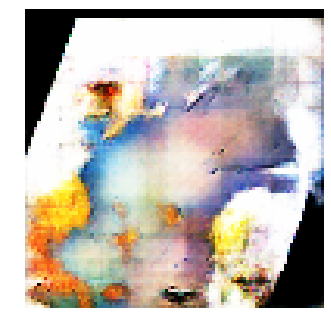


Epoch: 41320, D: -8.254, G: 4.372
Epoch: 41321, D: -7.588, G: 5.354
Epoch: 41322, D: -6.265, G: 5.17
Epoch: 41323, D: -5.337, G: 4.686
Epoch: 41324, D: -5.743, G: 3.409
Epoch: 41325, D: -6.406, G: 3.777
Epoch: 41326, D: -6.695, G: 3.424
Epoch: 41327, D: -6.999, G: 3.268
Epoch: 41328, D: -7.902, G: 4.467
Epoch: 41329, D: -3.858, G: 4.506
Epoch: 41330, D: -5.941, G: 4.129
Epoch: 41331, D: -7.287, G: 5.16
Epoch: 41332, D: -5.988, G: 3.261
Epoch: 41333, D: -6.691, G: 3.171
Epoch: 41334, D: -7.308, G: 2.648
Epoch: 41335, D: -5.348, G: 3.433
Epoch: 41336, D: -6.072, G: 4.537
Epoch: 41337, D: -5.983, G: 5.135
Epoch: 41338, D: -6.806, G: 3.75
Epoch: 41339, D: -5.872, G: 5.254


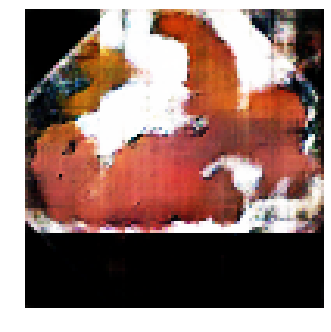


Epoch: 41340, D: -7.518, G: 1.383
Epoch: 41341, D: -5.251, G: 4.619
Epoch: 41342, D: -6.622, G: 2.84
Epoch: 41343, D: -6.491, G: 2.758
Epoch: 41344, D: -5.13, G: 3.765
Epoch: 41345, D: -6.313, G: 5.773
Epoch: 41346, D: -7.037, G: 2.821
Epoch: 41347, D: -5.978, G: 3.141
Epoch: 41348, D: -7.249, G: 2.724
Epoch: 41349, D: -6.44, G: 2.868
Epoch: 41350, D: -6.04, G: 4.339
Epoch: 41351, D: -6.106, G: 3.288
Epoch: 41352, D: -7.018, G: 3.171
Epoch: 41353, D: -5.417, G: 3.733
Epoch: 41354, D: -6.124, G: 3.325
Epoch: 41355, D: -6.348, G: 3.106
Epoch: 41356, D: -6.569, G: 3.45
Epoch: 41357, D: -5.828, G: 3.853
Epoch: 41358, D: -4.819, G: 4.541
Epoch: 41359, D: -6.072, G: 4.19


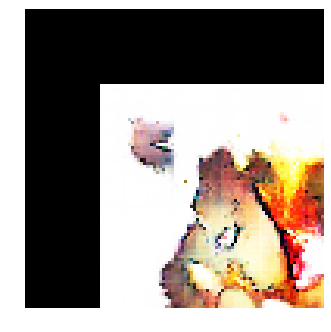


Epoch: 41360, D: -7.18, G: 3.754
Epoch: 41361, D: -4.983, G: 2.436
Epoch: 41362, D: -7.311, G: 3.757
Epoch: 41363, D: -6.123, G: 3.913
Epoch: 41364, D: -5.116, G: 3.068
Epoch: 41365, D: -6.95, G: 4.457
Epoch: 41366, D: -5.095, G: 3.029
Epoch: 41367, D: -7.833, G: 3.726
Epoch: 41368, D: -6.833, G: 3.91
Epoch: 41369, D: -6.288, G: 4.097
Epoch: 41370, D: -7.823, G: 3.436
Epoch: 41371, D: -6.502, G: 3.062
Epoch: 41372, D: -6.029, G: 2.715
Epoch: 41373, D: -6.674, G: 3.985
Epoch: 41374, D: -6.913, G: 2.627
Epoch: 41375, D: -5.703, G: 4.959
Epoch: 41376, D: -6.708, G: 5.281
Epoch: 41377, D: -6.923, G: 4.935
Epoch: 41378, D: -7.506, G: 6.032
Epoch: 41379, D: -5.9, G: 2.898


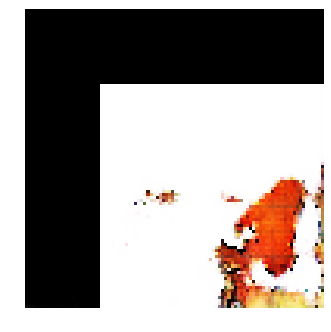


Epoch: 41380, D: -4.605, G: 5.38
Epoch: 41381, D: -5.573, G: 4.145
Epoch: 41382, D: -8.23, G: 4.256
Epoch: 41383, D: -5.265, G: 2.939
Epoch: 41384, D: -6.201, G: 3.627
Epoch: 41385, D: -6.231, G: 3.701
Epoch: 41386, D: -5.965, G: 2.677
Epoch: 41387, D: -5.214, G: 3.906
Epoch: 41388, D: -7.834, G: 3.648
Epoch: 41389, D: -8.463, G: 2.001
Epoch: 41390, D: -8.073, G: 2.893
Epoch: 41391, D: -4.89, G: 3.749
Epoch: 41392, D: -6.13, G: 4.608
Epoch: 41393, D: -5.888, G: 4.378
Epoch: 41394, D: -6.422, G: 5.119
Epoch: 41395, D: -5.581, G: 3.196
Epoch: 41396, D: -5.264, G: 3.941
Epoch: 41397, D: -5.369, G: 5.225
Epoch: 41398, D: -5.753, G: 2.908
Epoch: 41399, D: -6.284, G: 4.056


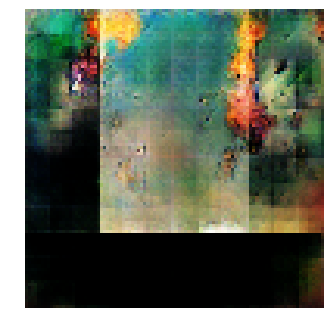


Epoch: 41400, D: -7.575, G: 1.976
Epoch: 41401, D: -6.901, G: 4.663
Epoch: 41402, D: -5.736, G: 1.715
Epoch: 41403, D: -6.87, G: 4.514
Epoch: 41404, D: -6.291, G: 3.232
Epoch: 41405, D: -5.804, G: 3.116
Epoch: 41406, D: -5.976, G: 2.735
Epoch: 41407, D: -6.634, G: 4.004
Epoch: 41408, D: -7.433, G: 3.865
Epoch: 41409, D: -6.016, G: 3.069
Epoch: 41410, D: -5.477, G: 3.668
Epoch: 41411, D: -5.762, G: 4.064
Epoch: 41412, D: -5.641, G: 3.457
Epoch: 41413, D: -6.231, G: 2.74
Epoch: 41414, D: -5.266, G: 3.274
Epoch: 41415, D: -5.624, G: 2.615
Epoch: 41416, D: -6.353, G: 3.912
Epoch: 41417, D: -5.833, G: 3.145
Epoch: 41418, D: -6.623, G: 3.545
Epoch: 41419, D: -7.839, G: 4.582


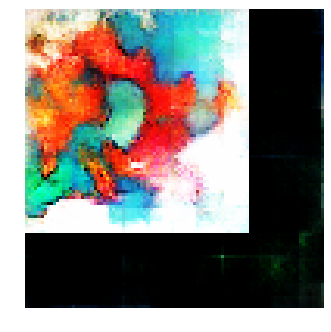


Epoch: 41420, D: -6.83, G: 3.895
Epoch: 41421, D: -5.346, G: 2.629
Epoch: 41422, D: -7.79, G: 3.955
Epoch: 41423, D: -7.01, G: 4.622
Epoch: 41424, D: -5.194, G: 4.532
Epoch: 41425, D: -5.87, G: 4.236
Epoch: 41426, D: -5.974, G: 5.815
Epoch: 41427, D: -6.437, G: 3.406
Epoch: 41428, D: -4.794, G: 3.954
Epoch: 41429, D: -5.98, G: 4.582
Epoch: 41430, D: -6.518, G: 5.087
Epoch: 41431, D: -7.954, G: 4.539
Epoch: 41432, D: -5.303, G: 4.579
Epoch: 41433, D: -7.101, G: 4.851
Epoch: 41434, D: -6.905, G: 4.132
Epoch: 41435, D: -8.172, G: 2.208
Epoch: 41436, D: -7.447, G: 4.136
Epoch: 41437, D: -5.423, G: 4.417
Epoch: 41438, D: -5.492, G: 4.439
Epoch: 41439, D: -5.151, G: 2.104


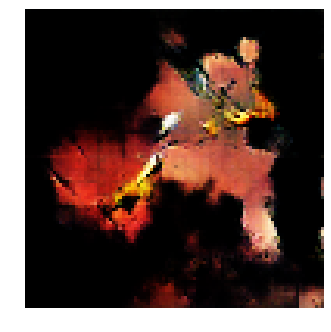


Epoch: 41440, D: -9.412, G: 3.51
Epoch: 41441, D: -5.793, G: 3.643
Epoch: 41442, D: -6.573, G: 4.453
Epoch: 41443, D: -5.827, G: 2.212
Epoch: 41444, D: -4.82, G: 2.854
Epoch: 41445, D: -5.289, G: 1.855
Epoch: 41446, D: -6.39, G: 4.133
Epoch: 41447, D: -5.862, G: 2.602
Epoch: 41448, D: -6.307, G: 3.091
Epoch: 41449, D: -5.909, G: 4.942
Epoch: 41450, D: -6.293, G: 3.563
Epoch: 41451, D: -6.712, G: 3.259
Epoch: 41452, D: -6.065, G: 4.75
Epoch: 41453, D: -5.431, G: 2.618
Epoch: 41454, D: -6.068, G: 2.35
Epoch: 41455, D: -6.186, G: 3.929
Epoch: 41456, D: -5.446, G: 2.19
Epoch: 41457, D: -6.845, G: 4.367
Epoch: 41458, D: -5.051, G: 4.579
Epoch: 41459, D: -6.02, G: 4.578


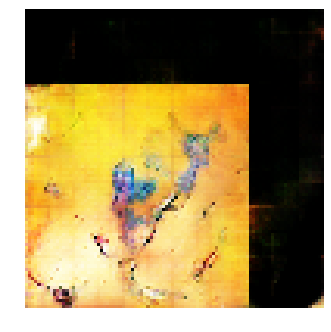


Epoch: 41460, D: -5.939, G: 3.912
Epoch: 41461, D: -6.895, G: 3.466
Epoch: 41462, D: -5.469, G: 3.083
Epoch: 41463, D: -6.122, G: 3.162
Epoch: 41464, D: -5.202, G: 4.002
Epoch: 41465, D: -5.614, G: 5.775
Epoch: 41466, D: -6.66, G: 4.302
Epoch: 41467, D: -5.889, G: 3.554
Epoch: 41468, D: -5.972, G: 2.542
Epoch: 41469, D: -6.572, G: 4.528
Epoch: 41470, D: -6.034, G: 5.124
Epoch: 41471, D: -7.98, G: 5.29
Epoch: 41472, D: -5.819, G: 2.819
Epoch: 41473, D: -5.95, G: 4.387
Epoch: 41474, D: -8.155, G: 3.66
Epoch: 41475, D: -6.382, G: 2.253
Epoch: 41476, D: -7.007, G: 2.94
Epoch: 41477, D: -8.3, G: 2.359
Epoch: 41478, D: -5.557, G: 3.163
Epoch: 41479, D: -6.661, G: 4.565


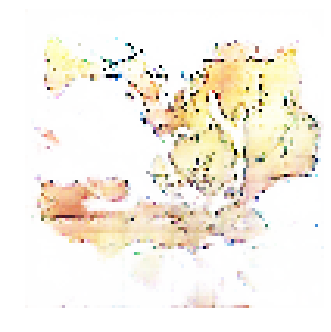


Epoch: 41480, D: -5.286, G: 1.31
Epoch: 41481, D: -6.405, G: 3.869
Epoch: 41482, D: -6.454, G: 3.003
Epoch: 41483, D: -6.829, G: 3.755
Epoch: 41484, D: -5.358, G: 4.594
Epoch: 41485, D: -5.9, G: 3.911
Epoch: 41486, D: -5.097, G: 7.068
Epoch: 41487, D: -4.774, G: 4.425
Epoch: 41488, D: -3.729, G: 4.469
Epoch: 41489, D: -6.205, G: 3.767
Epoch: 41490, D: -6.356, G: 3.206
Epoch: 41491, D: -6.791, G: 5.499
Epoch: 41492, D: -6.932, G: 4.209
Epoch: 41493, D: -7.486, G: 2.854
Epoch: 41494, D: -6.424, G: 2.848
Epoch: 41495, D: -6.798, G: 4.898
Epoch: 41496, D: -6.444, G: 1.722
Epoch: 41497, D: -6.167, G: 4.799
Epoch: 41498, D: -5.007, G: 4.27
Epoch: 41499, D: -6.115, G: 3.369


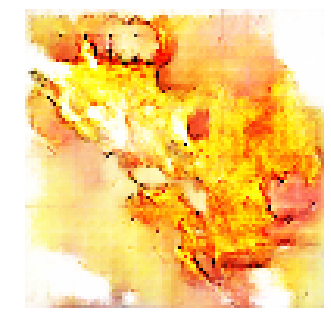


Epoch: 41500, D: -6.853, G: 2.547
Epoch: 41501, D: -6.941, G: 4.522
Epoch: 41502, D: -6.138, G: 5.197
Epoch: 41503, D: -5.942, G: 3.6
Epoch: 41504, D: -5.749, G: 2.507
Epoch: 41505, D: -6.924, G: 3.661
Epoch: 41506, D: -5.261, G: 5.0
Epoch: 41507, D: -6.935, G: 3.109
Epoch: 41508, D: -6.125, G: 3.526
Epoch: 41509, D: -6.497, G: 3.217
Epoch: 41510, D: -5.714, G: 3.903
Epoch: 41511, D: -6.945, G: 4.256
Epoch: 41512, D: -6.026, G: 2.136
Epoch: 41513, D: -6.515, G: 3.68
Epoch: 41514, D: -6.601, G: 3.287
Epoch: 41515, D: -6.7, G: 4.409
Epoch: 41516, D: -5.687, G: 1.546
Epoch: 41517, D: -5.936, G: 3.011
Epoch: 41518, D: -5.642, G: 3.913
Epoch: 41519, D: -6.152, G: 4.114


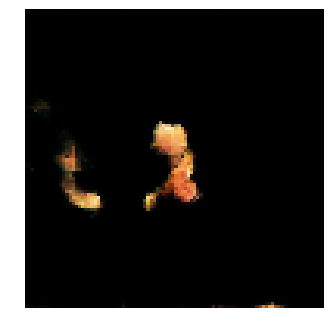


Epoch: 41520, D: -5.674, G: 6.296
Epoch: 41521, D: -7.282, G: 5.199
Epoch: 41522, D: -6.861, G: 1.781
Epoch: 41523, D: -5.978, G: 3.224
Epoch: 41524, D: -6.907, G: 3.521
Epoch: 41525, D: -6.845, G: 5.899
Epoch: 41526, D: -6.102, G: 2.428
Epoch: 41527, D: -6.939, G: 2.917
Epoch: 41528, D: -5.563, G: 3.46
Epoch: 41529, D: -5.298, G: 4.215
Epoch: 41530, D: -6.016, G: 4.189
Epoch: 41531, D: -6.819, G: 2.85
Epoch: 41532, D: -6.041, G: 4.667
Epoch: 41533, D: -5.729, G: 2.705
Epoch: 41534, D: -6.044, G: 3.61
Epoch: 41535, D: -5.531, G: 3.693
Epoch: 41536, D: -5.758, G: 1.247
Epoch: 41537, D: -5.529, G: 3.277
Epoch: 41538, D: -6.601, G: 3.94
Epoch: 41539, D: -7.855, G: 1.819


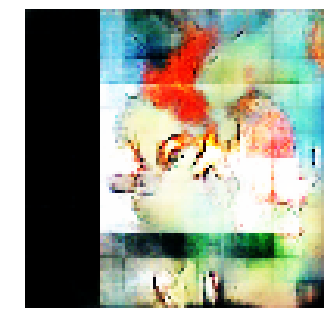


Epoch: 41540, D: -4.536, G: 3.688
Epoch: 41541, D: -5.3, G: 4.294
Epoch: 41542, D: -6.256, G: 3.283
Epoch: 41543, D: -8.822, G: 3.826
Epoch: 41544, D: -5.469, G: 3.715
Epoch: 41545, D: -5.374, G: 5.69
Epoch: 41546, D: -7.752, G: 4.383
Epoch: 41547, D: -5.319, G: 2.55
Epoch: 41548, D: -7.291, G: 4.202
Epoch: 41549, D: -6.596, G: 3.505
Epoch: 41550, D: -5.376, G: 3.401
Epoch: 41551, D: -4.063, G: 4.875
Epoch: 41552, D: -7.067, G: 4.911
Epoch: 41553, D: -6.152, G: 2.983
Epoch: 41554, D: -6.686, G: 3.017
Epoch: 41555, D: -6.249, G: 2.835
Epoch: 41556, D: -6.565, G: 4.418
Epoch: 41557, D: -4.991, G: 2.636
Epoch: 41558, D: -7.427, G: 3.43
Epoch: 41559, D: -8.0, G: 2.425


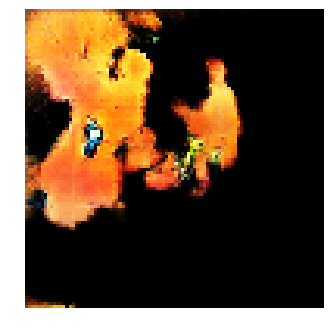


Epoch: 41560, D: -6.751, G: 3.726
Epoch: 41561, D: -6.192, G: 3.632
Epoch: 41562, D: -7.854, G: 5.051
Epoch: 41563, D: -7.092, G: 4.22
Epoch: 41564, D: -6.813, G: 2.823
Epoch: 41565, D: -7.085, G: 2.806
Epoch: 41566, D: -4.837, G: 2.817
Epoch: 41567, D: -6.611, G: 2.083
Epoch: 41568, D: -5.773, G: 3.198
Epoch: 41569, D: -5.911, G: 2.092
Epoch: 41570, D: -7.071, G: 3.488
Epoch: 41571, D: -5.2, G: 2.691
Epoch: 41572, D: -5.961, G: 3.191
Epoch: 41573, D: -5.289, G: 2.396
Epoch: 41574, D: -7.103, G: 3.945
Epoch: 41575, D: -5.696, G: 3.403
Epoch: 41576, D: -6.173, G: 3.014
Epoch: 41577, D: -5.133, G: 3.545
Epoch: 41578, D: -5.343, G: 5.147
Epoch: 41579, D: -5.023, G: 5.913


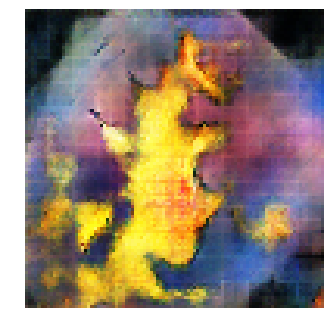


Epoch: 41580, D: -4.426, G: 4.928
Epoch: 41581, D: -7.567, G: 5.021
Epoch: 41582, D: -6.794, G: 4.424
Epoch: 41583, D: -6.162, G: 5.401
Epoch: 41584, D: -6.647, G: 4.251
Epoch: 41585, D: -5.855, G: 4.151
Epoch: 41586, D: -5.488, G: 5.116
Epoch: 41587, D: -7.149, G: 5.846
Epoch: 41588, D: -7.053, G: 3.926
Epoch: 41589, D: -5.507, G: 3.847
Epoch: 41590, D: -6.059, G: 3.367
Epoch: 41591, D: -8.203, G: 5.654
Epoch: 41592, D: -7.527, G: 4.033
Epoch: 41593, D: -6.734, G: 3.873
Epoch: 41594, D: -6.541, G: 3.334
Epoch: 41595, D: -5.762, G: 3.634
Epoch: 41596, D: -6.668, G: 4.229
Epoch: 41597, D: -5.342, G: 3.414
Epoch: 41598, D: -6.304, G: 2.973
Epoch: 41599, D: -5.407, G: 3.25


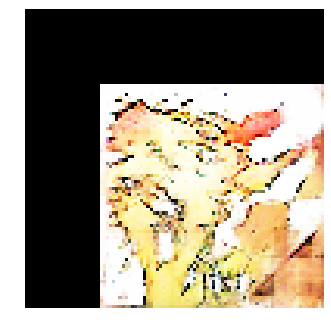


Epoch: 41600, D: -6.516, G: 3.89
Epoch: 41601, D: -5.549, G: 4.229
Epoch: 41602, D: -6.436, G: 5.329
Epoch: 41603, D: -7.915, G: 4.992
Epoch: 41604, D: -5.421, G: 3.427
Epoch: 41605, D: -7.451, G: 3.974
Epoch: 41606, D: -5.971, G: 3.412
Epoch: 41607, D: -5.598, G: 5.09
Epoch: 41608, D: -6.615, G: 4.804
Epoch: 41609, D: -4.972, G: 3.64
Epoch: 41610, D: -5.43, G: 3.241
Epoch: 41611, D: -5.225, G: 3.136
Epoch: 41612, D: -7.218, G: 4.453
Epoch: 41613, D: -6.173, G: 1.701
Epoch: 41614, D: -6.262, G: 2.845
Epoch: 41615, D: -5.675, G: 2.567
Epoch: 41616, D: -5.307, G: 3.32
Epoch: 41617, D: -6.169, G: 4.366
Epoch: 41618, D: -6.643, G: 4.315
Epoch: 41619, D: -5.452, G: 2.728


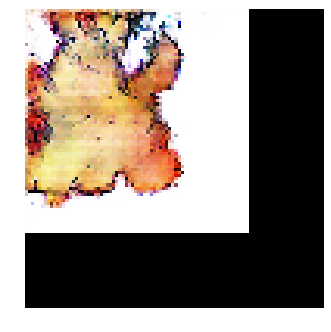


Epoch: 41620, D: -6.468, G: 3.456
Epoch: 41621, D: -5.619, G: 3.148
Epoch: 41622, D: -5.685, G: 3.382
Epoch: 41623, D: -5.501, G: 3.808
Epoch: 41624, D: -6.33, G: 4.745
Epoch: 41625, D: -5.977, G: 4.786
Epoch: 41626, D: -7.124, G: 4.063
Epoch: 41627, D: -5.824, G: 4.867
Epoch: 41628, D: -6.913, G: 3.297
Epoch: 41629, D: -5.933, G: 2.118
Epoch: 41630, D: -7.862, G: 6.027
Epoch: 41631, D: -4.356, G: 5.411
Epoch: 41632, D: -5.826, G: 4.844
Epoch: 41633, D: -7.616, G: 4.173
Epoch: 41634, D: -6.505, G: 3.312
Epoch: 41635, D: -5.446, G: 3.12
Epoch: 41636, D: -5.476, G: 3.648
Epoch: 41637, D: -7.471, G: 2.389
Epoch: 41638, D: -6.209, G: 3.361
Epoch: 41639, D: -8.624, G: 4.075


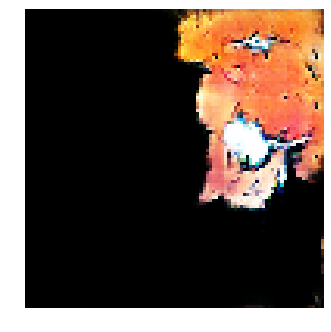


Epoch: 41640, D: -6.294, G: 2.53
Epoch: 41641, D: -4.939, G: 5.036
Epoch: 41642, D: -6.337, G: 4.441
Epoch: 41643, D: -6.82, G: 3.453
Epoch: 41644, D: -6.314, G: 3.802
Epoch: 41645, D: -8.21, G: 4.059
Epoch: 41646, D: -7.424, G: 3.869
Epoch: 41647, D: -7.789, G: 4.206
Epoch: 41648, D: -6.147, G: 4.397
Epoch: 41649, D: -5.696, G: 5.55
Epoch: 41650, D: -5.85, G: 3.905
Epoch: 41651, D: -9.347, G: 4.423
Epoch: 41652, D: -5.58, G: 4.956
Epoch: 41653, D: -5.938, G: 3.663
Epoch: 41654, D: -8.056, G: 3.906
Epoch: 41655, D: -5.626, G: 3.585
Epoch: 41656, D: -6.31, G: 3.636
Epoch: 41657, D: -8.325, G: 3.889
Epoch: 41658, D: -6.625, G: 4.291
Epoch: 41659, D: -5.662, G: 3.979


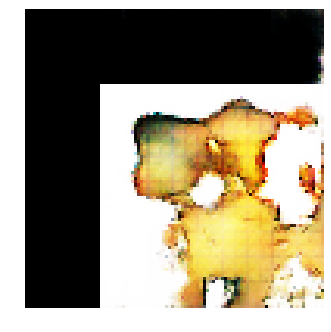


Epoch: 41660, D: -5.267, G: 6.021
Epoch: 41661, D: -7.88, G: 4.407
Epoch: 41662, D: -6.287, G: 4.291
Epoch: 41663, D: -6.785, G: 4.86
Epoch: 41664, D: -6.052, G: 3.753
Epoch: 41665, D: -6.842, G: 3.122
Epoch: 41666, D: -5.84, G: 3.55
Epoch: 41667, D: -4.686, G: 5.077
Epoch: 41668, D: -5.973, G: 4.205
Epoch: 41669, D: -6.424, G: 2.292
Epoch: 41670, D: -5.906, G: 4.066
Epoch: 41671, D: -6.547, G: 2.28
Epoch: 41672, D: -6.466, G: 4.291
Epoch: 41673, D: -7.005, G: 3.932
Epoch: 41674, D: -6.776, G: 3.726
Epoch: 41675, D: -7.233, G: 2.87
Epoch: 41676, D: -6.63, G: 2.636
Epoch: 41677, D: -5.219, G: 3.774
Epoch: 41678, D: -6.484, G: 3.084
Epoch: 41679, D: -8.057, G: 3.739


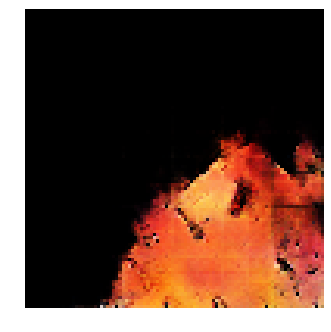


Epoch: 41680, D: -5.162, G: 4.019
Epoch: 41681, D: -6.364, G: 5.61
Epoch: 41682, D: -6.05, G: 3.526
Epoch: 41683, D: -6.963, G: 4.065
Epoch: 41684, D: -6.255, G: 1.339
Epoch: 41685, D: -5.324, G: 4.398
Epoch: 41686, D: -7.433, G: 4.19
Epoch: 41687, D: -5.621, G: 3.024
Epoch: 41688, D: -5.267, G: 3.69
Epoch: 41689, D: -6.141, G: 3.062
Epoch: 41690, D: -5.571, G: 2.94
Epoch: 41691, D: -6.424, G: 3.623
Epoch: 41692, D: -5.955, G: 3.934
Epoch: 41693, D: -6.648, G: 4.103
Epoch: 41694, D: -5.736, G: 3.495
Epoch: 41695, D: -5.575, G: 6.481
Epoch: 41696, D: -7.469, G: 3.295
Epoch: 41697, D: -6.937, G: 5.141
Epoch: 41698, D: -5.965, G: 4.512
Epoch: 41699, D: -5.981, G: 3.454


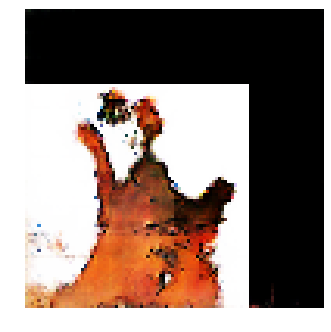


Epoch: 41700, D: -7.709, G: 1.783
Epoch: 41701, D: -4.952, G: 2.567
Epoch: 41702, D: -7.544, G: 4.453
Epoch: 41703, D: -4.885, G: 3.866
Epoch: 41704, D: -6.738, G: 3.404
Epoch: 41705, D: -7.861, G: 4.452
Epoch: 41706, D: -7.029, G: 3.828
Epoch: 41707, D: -7.593, G: 6.708
Epoch: 41708, D: -4.943, G: 5.391
Epoch: 41709, D: -6.706, G: 5.775
Epoch: 41710, D: -7.265, G: 3.337
Epoch: 41711, D: -6.118, G: 2.748
Epoch: 41712, D: -7.099, G: 5.626
Epoch: 41713, D: -5.668, G: 4.083
Epoch: 41714, D: -6.594, G: 5.251
Epoch: 41715, D: -6.434, G: 4.207
Epoch: 41716, D: -5.434, G: 4.047
Epoch: 41717, D: -6.172, G: 2.523
Epoch: 41718, D: -6.487, G: 3.507
Epoch: 41719, D: -5.81, G: 3.675


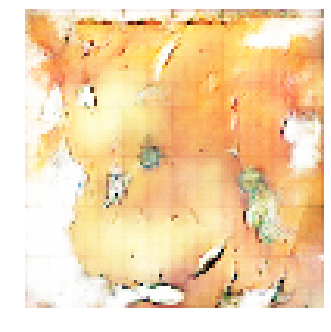


Epoch: 41720, D: -5.933, G: 3.545
Epoch: 41721, D: -6.973, G: 2.782
Epoch: 41722, D: -8.598, G: 2.181
Epoch: 41723, D: -5.957, G: 0.5621
Epoch: 41724, D: -6.714, G: 2.931
Epoch: 41725, D: -5.405, G: 2.885
Epoch: 41726, D: -7.319, G: 3.724
Epoch: 41727, D: -6.418, G: 3.729
Epoch: 41728, D: -6.879, G: 4.108
Epoch: 41729, D: -6.646, G: 3.995
Epoch: 41730, D: -6.875, G: 3.485
Epoch: 41731, D: -6.78, G: 2.932
Epoch: 41732, D: -5.166, G: 4.382
Epoch: 41733, D: -6.274, G: 3.763
Epoch: 41734, D: -6.008, G: 2.451
Epoch: 41735, D: -5.387, G: 2.106
Epoch: 41736, D: -6.875, G: 3.691
Epoch: 41737, D: -6.547, G: 1.551
Epoch: 41738, D: -7.04, G: 1.476
Epoch: 41739, D: -5.279, G: 3.332


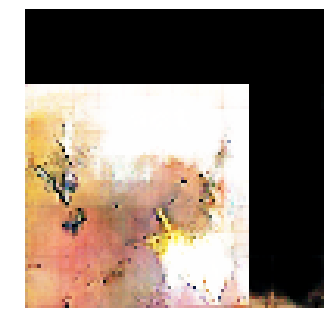


Epoch: 41740, D: -6.629, G: 1.868
Epoch: 41741, D: -6.577, G: 1.688
Epoch: 41742, D: -7.494, G: 2.967
Epoch: 41743, D: -7.808, G: 3.954
Epoch: 41744, D: -6.545, G: 3.364
Epoch: 41745, D: -5.757, G: 2.836
Epoch: 41746, D: -4.458, G: 1.731
Epoch: 41747, D: -6.437, G: 3.955
Epoch: 41748, D: -4.863, G: 3.923
Epoch: 41749, D: -4.457, G: 3.28
Epoch: 41750, D: -7.377, G: 4.128
Epoch: 41751, D: -5.59, G: 6.047
Epoch: 41752, D: -7.378, G: 5.86
Epoch: 41753, D: -5.744, G: 4.443
Epoch: 41754, D: -6.163, G: 4.811
Epoch: 41755, D: -6.182, G: 4.818
Epoch: 41756, D: -7.159, G: 5.147
Epoch: 41757, D: -5.292, G: 5.361
Epoch: 41758, D: -6.088, G: 4.409
Epoch: 41759, D: -6.219, G: 3.459


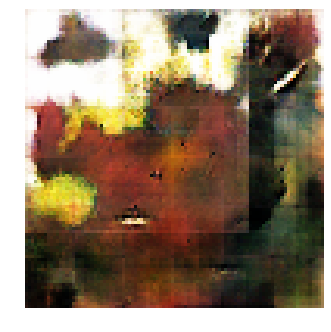


Epoch: 41760, D: -6.939, G: 5.111
Epoch: 41761, D: -6.161, G: 3.395
Epoch: 41762, D: -6.201, G: 5.155
Epoch: 41763, D: -5.907, G: 4.83
Epoch: 41764, D: -5.776, G: 4.301
Epoch: 41765, D: -6.781, G: 4.237
Epoch: 41766, D: -6.661, G: 5.105
Epoch: 41767, D: -7.471, G: 5.805
Epoch: 41768, D: -4.462, G: 6.145
Epoch: 41769, D: -5.037, G: 4.596
Epoch: 41770, D: -5.909, G: 4.87
Epoch: 41771, D: -6.876, G: 2.678
Epoch: 41772, D: -5.681, G: 4.401
Epoch: 41773, D: -6.866, G: 3.678
Epoch: 41774, D: -8.395, G: 3.74
Epoch: 41775, D: -6.234, G: 4.457
Epoch: 41776, D: -5.309, G: 5.556
Epoch: 41777, D: -8.909, G: 3.201
Epoch: 41778, D: -6.663, G: 4.469
Epoch: 41779, D: -6.591, G: 4.215


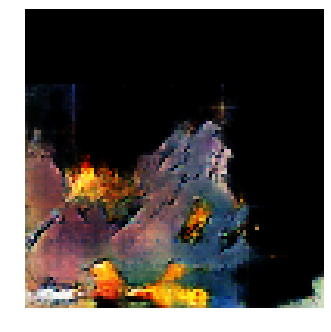


Epoch: 41780, D: -6.194, G: 5.574
Epoch: 41781, D: -6.058, G: 3.687
Epoch: 41782, D: -6.353, G: 2.938
Epoch: 41783, D: -6.515, G: 4.358
Epoch: 41784, D: -5.854, G: 5.3
Epoch: 41785, D: -6.668, G: 2.777
Epoch: 41786, D: -6.735, G: 4.94
Epoch: 41787, D: -4.977, G: 3.147
Epoch: 41788, D: -6.095, G: 3.387
Epoch: 41789, D: -6.09, G: 3.864
Epoch: 41790, D: -6.365, G: 4.434
Epoch: 41791, D: -6.161, G: 2.904
Epoch: 41792, D: -5.881, G: 4.647
Epoch: 41793, D: -5.995, G: 2.78
Epoch: 41794, D: -6.096, G: 2.84
Epoch: 41795, D: -6.733, G: 4.748
Epoch: 41796, D: -6.685, G: 3.467
Epoch: 41797, D: -5.153, G: 4.705
Epoch: 41798, D: -5.214, G: 4.408
Epoch: 41799, D: -7.041, G: 4.957


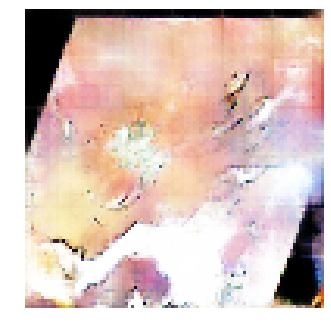


Epoch: 41800, D: -4.771, G: 4.448
Epoch: 41801, D: -6.58, G: 4.774
Epoch: 41802, D: -6.075, G: 2.261
Epoch: 41803, D: -5.911, G: 1.146
Epoch: 41804, D: -6.728, G: 2.566
Epoch: 41805, D: -5.33, G: 2.741
Epoch: 41806, D: -5.665, G: 4.225
Epoch: 41807, D: -6.435, G: 2.611
Epoch: 41808, D: -7.57, G: 3.897
Epoch: 41809, D: -6.93, G: 2.518
Epoch: 41810, D: -5.929, G: 1.738
Epoch: 41811, D: -6.422, G: 2.103
Epoch: 41812, D: -5.875, G: 3.59
Epoch: 41813, D: -5.474, G: 1.478
Epoch: 41814, D: -6.627, G: 3.37
Epoch: 41815, D: -7.217, G: 2.743
Epoch: 41816, D: -5.526, G: 2.481
Epoch: 41817, D: -6.613, G: 3.578
Epoch: 41818, D: -6.161, G: 4.428
Epoch: 41819, D: -5.733, G: 2.28


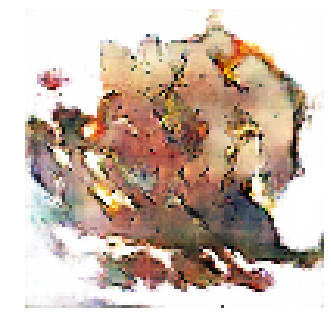


Epoch: 41820, D: -6.416, G: 2.429
Epoch: 41821, D: -7.756, G: 3.378
Epoch: 41822, D: -7.202, G: 1.398
Epoch: 41823, D: -5.603, G: 4.362
Epoch: 41824, D: -5.138, G: 4.011
Epoch: 41825, D: -7.44, G: 2.575
Epoch: 41826, D: -6.204, G: 2.839
Epoch: 41827, D: -6.935, G: 4.529
Epoch: 41828, D: -5.747, G: 4.856
Epoch: 41829, D: -7.248, G: 3.326
Epoch: 41830, D: -6.288, G: 2.41
Epoch: 41831, D: -5.568, G: 3.719
Epoch: 41832, D: -5.68, G: 2.735
Epoch: 41833, D: -6.389, G: 1.607
Epoch: 41834, D: -7.154, G: 3.919
Epoch: 41835, D: -6.163, G: 2.511
Epoch: 41836, D: -5.549, G: 4.784
Epoch: 41837, D: -5.316, G: 4.532
Epoch: 41838, D: -6.997, G: 3.106
Epoch: 41839, D: -7.284, G: 2.982


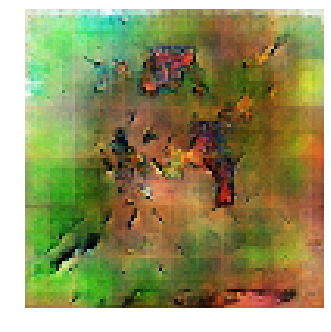


Epoch: 41840, D: -6.539, G: 3.386
Epoch: 41841, D: -6.193, G: 4.65
Epoch: 41842, D: -5.202, G: 4.403
Epoch: 41843, D: -5.117, G: 3.259
Epoch: 41844, D: -5.142, G: 5.156
Epoch: 41845, D: -7.674, G: 2.519
Epoch: 41846, D: -5.992, G: 4.253
Epoch: 41847, D: -6.459, G: 5.337
Epoch: 41848, D: -6.827, G: 5.461
Epoch: 41849, D: -5.95, G: 5.476
Epoch: 41850, D: -5.856, G: 3.15
Epoch: 41851, D: -6.111, G: 3.888
Epoch: 41852, D: -5.398, G: 6.503
Epoch: 41853, D: -6.974, G: 3.06
Epoch: 41854, D: -5.753, G: 2.308
Epoch: 41855, D: -5.915, G: 3.695
Epoch: 41856, D: -6.292, G: 3.711
Epoch: 41857, D: -5.812, G: 2.707
Epoch: 41858, D: -5.578, G: 1.85
Epoch: 41859, D: -6.07, G: 3.127


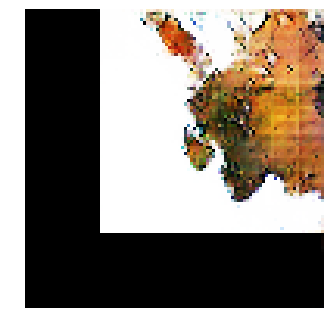


Epoch: 41860, D: -6.722, G: 3.449
Epoch: 41861, D: -6.076, G: 2.079
Epoch: 41862, D: -6.544, G: 4.225
Epoch: 41863, D: -6.199, G: 2.634
Epoch: 41864, D: -5.943, G: 4.174
Epoch: 41865, D: -7.497, G: 4.12
Epoch: 41866, D: -5.828, G: 4.906
Epoch: 41867, D: -6.365, G: 3.245
Epoch: 41868, D: -5.245, G: 5.614
Epoch: 41869, D: -6.925, G: 3.724
Epoch: 41870, D: -5.393, G: 3.564
Epoch: 41871, D: -6.223, G: 3.846
Epoch: 41872, D: -7.142, G: 4.816
Epoch: 41873, D: -4.769, G: 3.186
Epoch: 41874, D: -5.797, G: 4.456
Epoch: 41875, D: -6.269, G: 3.049
Epoch: 41876, D: -7.215, G: 3.401
Epoch: 41877, D: -6.771, G: 3.874
Epoch: 41878, D: -7.889, G: 4.159
Epoch: 41879, D: -7.373, G: 3.162


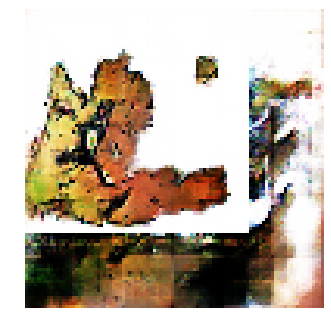


Epoch: 41880, D: -6.304, G: 3.982
Epoch: 41881, D: -5.134, G: 3.898
Epoch: 41882, D: -5.853, G: 5.816
Epoch: 41883, D: -6.451, G: 4.038
Epoch: 41884, D: -6.442, G: 5.464
Epoch: 41885, D: -6.613, G: 3.635
Epoch: 41886, D: -6.638, G: 3.601
Epoch: 41887, D: -6.434, G: 2.968
Epoch: 41888, D: -6.658, G: 1.603
Epoch: 41889, D: -6.644, G: 4.206
Epoch: 41890, D: -8.229, G: 4.705
Epoch: 41891, D: -6.04, G: 3.673
Epoch: 41892, D: -6.828, G: 4.41
Epoch: 41893, D: -5.326, G: 4.899
Epoch: 41894, D: -5.822, G: 5.485
Epoch: 41895, D: -6.61, G: 5.973
Epoch: 41896, D: -5.033, G: 3.742
Epoch: 41897, D: -5.689, G: 3.707
Epoch: 41898, D: -8.451, G: 4.838
Epoch: 41899, D: -5.598, G: 3.444


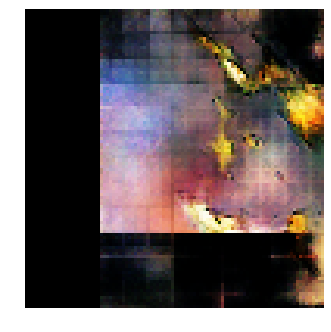


Epoch: 41900, D: -6.197, G: 5.62
Epoch: 41901, D: -6.163, G: 4.964
Epoch: 41902, D: -5.171, G: 3.719
Epoch: 41903, D: -5.332, G: 3.054
Epoch: 41904, D: -6.079, G: 3.468
Epoch: 41905, D: -6.381, G: 5.588
Epoch: 41906, D: -5.39, G: 3.738
Epoch: 41907, D: -5.937, G: 4.553
Epoch: 41908, D: -7.323, G: 4.291
Epoch: 41909, D: -6.189, G: 3.884
Epoch: 41910, D: -6.475, G: 4.117
Epoch: 41911, D: -7.312, G: 4.626
Epoch: 41912, D: -7.36, G: 5.271
Epoch: 41913, D: -4.801, G: 3.435
Epoch: 41914, D: -5.916, G: 4.098
Epoch: 41915, D: -5.27, G: 3.337
Epoch: 41916, D: -5.219, G: 3.672
Epoch: 41917, D: -7.155, G: 1.393
Epoch: 41918, D: -5.55, G: 3.993
Epoch: 41919, D: -5.317, G: 3.582


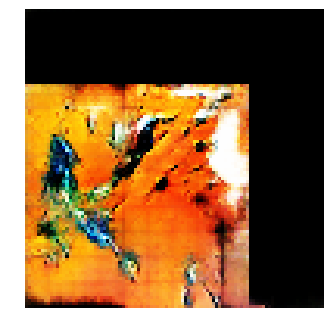


Epoch: 41920, D: -5.268, G: 2.0
Epoch: 41921, D: -6.211, G: 3.26
Epoch: 41922, D: -6.184, G: 3.585
Epoch: 41923, D: -5.843, G: 3.692
Epoch: 41924, D: -8.153, G: 4.376
Epoch: 41925, D: -7.524, G: 2.084
Epoch: 41926, D: -5.185, G: 3.285
Epoch: 41927, D: -5.726, G: 3.617
Epoch: 41928, D: -6.619, G: 2.269
Epoch: 41929, D: -6.816, G: 4.284
Epoch: 41930, D: -6.073, G: 3.769
Epoch: 41931, D: -5.716, G: 3.897
Epoch: 41932, D: -4.889, G: 4.182
Epoch: 41933, D: -5.574, G: 3.643
Epoch: 41934, D: -6.716, G: 4.003
Epoch: 41935, D: -5.458, G: 2.745
Epoch: 41936, D: -6.232, G: 2.809
Epoch: 41937, D: -7.697, G: 4.38
Epoch: 41938, D: -5.536, G: 2.613
Epoch: 41939, D: -5.865, G: 4.186


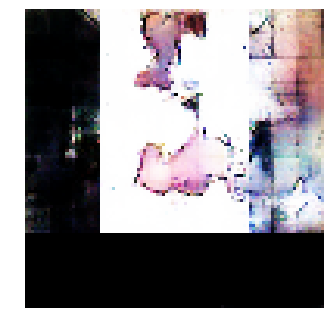


Epoch: 41940, D: -6.288, G: 3.681
Epoch: 41941, D: -6.366, G: 6.461
Epoch: 41942, D: -5.264, G: 3.041
Epoch: 41943, D: -7.118, G: 2.663
Epoch: 41944, D: -6.682, G: 2.879
Epoch: 41945, D: -6.76, G: 3.638
Epoch: 41946, D: -6.838, G: 4.922
Epoch: 41947, D: -6.189, G: 3.037
Epoch: 41948, D: -7.705, G: 4.611
Epoch: 41949, D: -6.529, G: 4.402
Epoch: 41950, D: -7.464, G: 5.372
Epoch: 41951, D: -5.534, G: 3.392
Epoch: 41952, D: -7.475, G: 4.008
Epoch: 41953, D: -6.225, G: 4.906
Epoch: 41954, D: -6.851, G: 5.408
Epoch: 41955, D: -5.512, G: 3.758
Epoch: 41956, D: -7.162, G: 4.675
Epoch: 41957, D: -5.463, G: 2.825
Epoch: 41958, D: -5.617, G: 4.538
Epoch: 41959, D: -6.774, G: 3.2


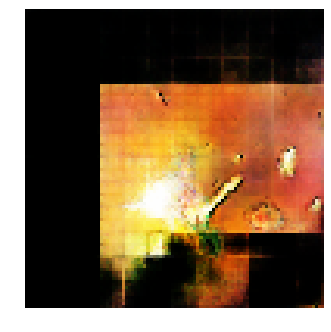


Epoch: 41960, D: -6.488, G: 2.943
Epoch: 41961, D: -7.782, G: 5.187
Epoch: 41962, D: -7.905, G: 4.3
Epoch: 41963, D: -6.32, G: 3.352
Epoch: 41964, D: -6.817, G: 2.004
Epoch: 41965, D: -4.128, G: 3.34
Epoch: 41966, D: -6.855, G: 4.609
Epoch: 41967, D: -6.945, G: 2.272
Epoch: 41968, D: -7.137, G: 3.597
Epoch: 41969, D: -4.7, G: 4.792
Epoch: 41970, D: -6.671, G: 2.726
Epoch: 41971, D: -5.485, G: 4.713
Epoch: 41972, D: -5.642, G: 3.993
Epoch: 41973, D: -6.264, G: 5.189
Epoch: 41974, D: -6.658, G: 4.865
Epoch: 41975, D: -7.395, G: 5.636
Epoch: 41976, D: -5.878, G: 5.026
Epoch: 41977, D: -6.964, G: 4.092
Epoch: 41978, D: -6.153, G: 5.012
Epoch: 41979, D: -5.085, G: 4.077


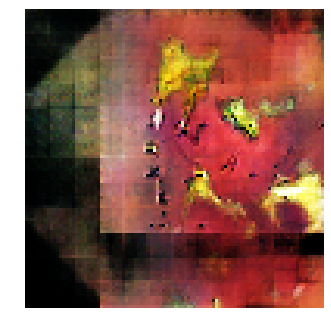


Epoch: 41980, D: -5.613, G: 5.273
Epoch: 41981, D: -8.624, G: 2.625
Epoch: 41982, D: -5.599, G: 0.834
Epoch: 41983, D: -6.328, G: 2.899
Epoch: 41984, D: -6.912, G: 3.649
Epoch: 41985, D: -7.512, G: 2.415
Epoch: 41986, D: -6.323, G: 3.155
Epoch: 41987, D: -6.114, G: 3.521
Epoch: 41988, D: -4.874, G: 2.917
Epoch: 41989, D: -6.433, G: 3.157
Epoch: 41990, D: -7.82, G: 3.612
Epoch: 41991, D: -5.444, G: 3.415
Epoch: 41992, D: -6.373, G: 3.606
Epoch: 41993, D: -5.579, G: 3.64
Epoch: 41994, D: -6.537, G: 5.196
Epoch: 41995, D: -5.358, G: 2.669
Epoch: 41996, D: -5.842, G: 3.71
Epoch: 41997, D: -6.339, G: 4.993
Epoch: 41998, D: -7.26, G: 5.297
Epoch: 41999, D: -4.891, G: 2.85


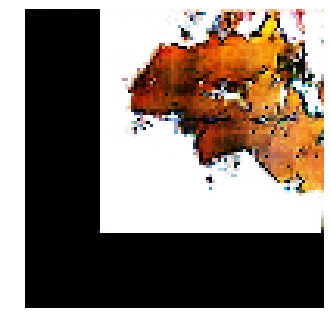


Epoch: 42000, D: -6.257, G: 2.997
Epoch: 42001, D: -5.17, G: 3.897
Epoch: 42002, D: -6.999, G: 4.782
Epoch: 42003, D: -5.992, G: 3.062
Epoch: 42004, D: -5.772, G: 2.524
Epoch: 42005, D: -6.732, G: 4.25
Epoch: 42006, D: -5.013, G: 4.425
Epoch: 42007, D: -6.316, G: 4.058
Epoch: 42008, D: -5.779, G: 5.817
Epoch: 42009, D: -7.591, G: 5.776
Epoch: 42010, D: -7.389, G: 1.599
Epoch: 42011, D: -7.237, G: 4.61
Epoch: 42012, D: -4.768, G: 4.624
Epoch: 42013, D: -5.453, G: 4.13
Epoch: 42014, D: -7.019, G: 3.889
Epoch: 42015, D: -7.052, G: 3.129
Epoch: 42016, D: -7.08, G: 3.66
Epoch: 42017, D: -6.835, G: 3.377
Epoch: 42018, D: -6.75, G: 4.014
Epoch: 42019, D: -7.61, G: 4.633


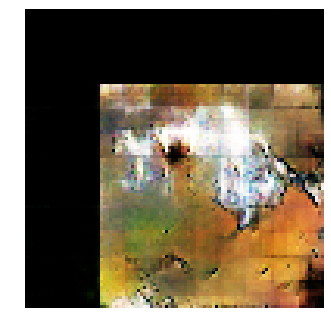


Epoch: 42020, D: -8.064, G: 0.8524
Epoch: 42021, D: -5.792, G: 3.154
Epoch: 42022, D: -6.234, G: 4.38
Epoch: 42023, D: -6.052, G: 3.982
Epoch: 42024, D: -5.441, G: 4.295
Epoch: 42025, D: -5.886, G: 4.224
Epoch: 42026, D: -7.203, G: 3.186
Epoch: 42027, D: -5.516, G: 2.187
Epoch: 42028, D: -7.107, G: 3.464
Epoch: 42029, D: -6.452, G: 4.113
Epoch: 42030, D: -4.409, G: 3.191
Epoch: 42031, D: -5.325, G: 3.89
Epoch: 42032, D: -5.669, G: 4.249
Epoch: 42033, D: -7.618, G: 4.423
Epoch: 42034, D: -6.42, G: 3.078
Epoch: 42035, D: -6.295, G: 4.908
Epoch: 42036, D: -6.463, G: 2.847
Epoch: 42037, D: -6.661, G: 5.971
Epoch: 42038, D: -6.228, G: 2.531
Epoch: 42039, D: -5.762, G: 5.701


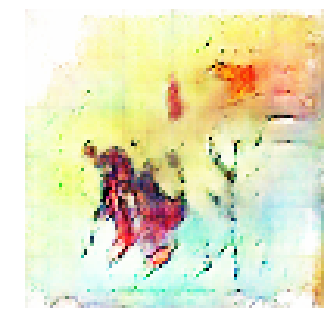


Epoch: 42040, D: -5.657, G: 3.468
Epoch: 42041, D: -6.665, G: 4.534
Epoch: 42042, D: -6.293, G: 3.417
Epoch: 42043, D: -5.723, G: 2.102
Epoch: 42044, D: -6.238, G: 4.532
Epoch: 42045, D: -5.63, G: 4.424
Epoch: 42046, D: -7.226, G: 1.997
Epoch: 42047, D: -6.884, G: 4.672
Epoch: 42048, D: -6.207, G: 4.443
Epoch: 42049, D: -5.513, G: 3.331
Epoch: 42050, D: -6.284, G: 4.089
Epoch: 42051, D: -4.973, G: 3.297
Epoch: 42052, D: -5.895, G: 4.286
Epoch: 42053, D: -8.006, G: 4.147
Epoch: 42054, D: -5.064, G: 4.675
Epoch: 42055, D: -5.775, G: 4.944
Epoch: 42056, D: -7.222, G: 3.464
Epoch: 42057, D: -6.097, G: 4.448
Epoch: 42058, D: -6.162, G: 4.106
Epoch: 42059, D: -6.984, G: 4.448


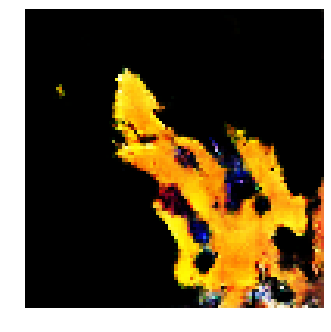


Epoch: 42060, D: -6.272, G: 3.607
Epoch: 42061, D: -6.086, G: 3.109
Epoch: 42062, D: -5.852, G: 4.414
Epoch: 42063, D: -8.271, G: 2.898
Epoch: 42064, D: -5.588, G: 4.747
Epoch: 42065, D: -6.751, G: 3.827
Epoch: 42066, D: -7.631, G: 3.716
Epoch: 42067, D: -6.264, G: 1.645
Epoch: 42068, D: -5.578, G: 4.311
Epoch: 42069, D: -6.004, G: 4.192
Epoch: 42070, D: -6.359, G: 3.245
Epoch: 42071, D: -4.685, G: 3.436
Epoch: 42072, D: -6.278, G: 4.497
Epoch: 42073, D: -7.075, G: 4.63
Epoch: 42074, D: -5.86, G: 3.436
Epoch: 42075, D: -5.662, G: 4.125
Epoch: 42076, D: -6.202, G: 4.67
Epoch: 42077, D: -6.075, G: 5.964
Epoch: 42078, D: -7.405, G: 5.539
Epoch: 42079, D: -7.017, G: 4.987


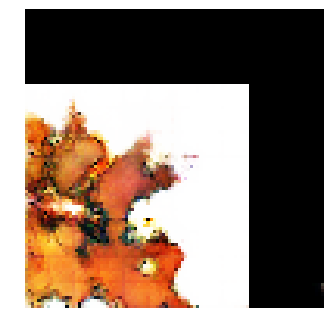


Epoch: 42080, D: -6.134, G: 5.441
Epoch: 42081, D: -7.435, G: 4.311
Epoch: 42082, D: -7.774, G: 3.569
Epoch: 42083, D: -5.912, G: 3.854
Epoch: 42084, D: -4.435, G: 5.281
Epoch: 42085, D: -6.605, G: 3.682
Epoch: 42086, D: -5.201, G: 4.33
Epoch: 42087, D: -6.438, G: 5.522
Epoch: 42088, D: -6.489, G: 2.737
Epoch: 42089, D: -5.557, G: 3.347
Epoch: 42090, D: -6.316, G: 2.69
Epoch: 42091, D: -6.505, G: 4.135
Epoch: 42092, D: -6.344, G: 2.679
Epoch: 42093, D: -5.876, G: 4.401
Epoch: 42094, D: -4.944, G: 5.003
Epoch: 42095, D: -5.99, G: 4.963
Epoch: 42096, D: -6.381, G: 3.498
Epoch: 42097, D: -5.969, G: 5.838
Epoch: 42098, D: -6.112, G: 3.117
Epoch: 42099, D: -6.318, G: 3.319


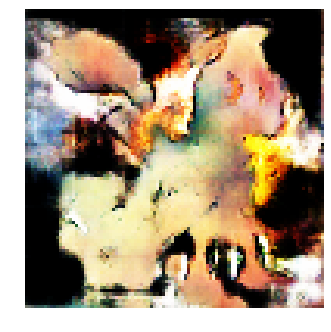


Epoch: 42100, D: -5.496, G: 4.759
Epoch: 42101, D: -5.212, G: 3.33
Epoch: 42102, D: -6.139, G: 3.594
Epoch: 42103, D: -5.233, G: 4.308
Epoch: 42104, D: -6.503, G: 2.974
Epoch: 42105, D: -5.796, G: 1.208
Epoch: 42106, D: -6.036, G: 4.048
Epoch: 42107, D: -5.837, G: 3.955
Epoch: 42108, D: -6.351, G: 2.781
Epoch: 42109, D: -5.984, G: 3.354
Epoch: 42110, D: -5.959, G: 4.037
Epoch: 42111, D: -5.856, G: 2.267
Epoch: 42112, D: -6.295, G: 3.139
Epoch: 42113, D: -5.299, G: 2.896
Epoch: 42114, D: -7.42, G: 0.5945
Epoch: 42115, D: -5.79, G: 4.164
Epoch: 42116, D: -7.504, G: 1.746
Epoch: 42117, D: -7.287, G: 4.257
Epoch: 42118, D: -5.341, G: 3.228
Epoch: 42119, D: -5.95, G: 3.025


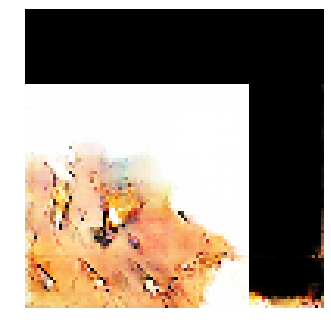


Epoch: 42120, D: -5.371, G: 3.301
Epoch: 42121, D: -5.946, G: 3.335
Epoch: 42122, D: -5.342, G: 3.616
Epoch: 42123, D: -7.082, G: 4.526
Epoch: 42124, D: -6.773, G: 4.707
Epoch: 42125, D: -5.813, G: 4.782
Epoch: 42126, D: -7.171, G: 4.628
Epoch: 42127, D: -7.189, G: 4.172
Epoch: 42128, D: -5.871, G: 2.873
Epoch: 42129, D: -7.6, G: 4.02
Epoch: 42130, D: -6.087, G: 4.436
Epoch: 42131, D: -5.783, G: 5.119
Epoch: 42132, D: -5.146, G: 4.51
Epoch: 42133, D: -5.683, G: 5.171
Epoch: 42134, D: -5.639, G: 4.024
Epoch: 42135, D: -6.611, G: 3.451
Epoch: 42136, D: -7.537, G: 1.633
Epoch: 42137, D: -6.215, G: 4.31
Epoch: 42138, D: -6.054, G: 1.844
Epoch: 42139, D: -5.725, G: 3.972


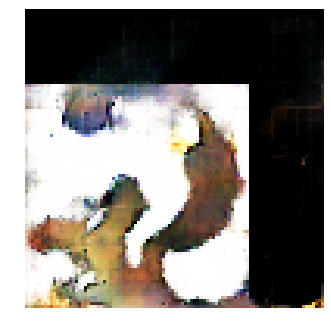


Epoch: 42140, D: -6.2, G: 4.136
Epoch: 42141, D: -6.059, G: 2.59
Epoch: 42142, D: -6.633, G: 1.911
Epoch: 42143, D: -5.974, G: 3.209
Epoch: 42144, D: -6.292, G: 2.923
Epoch: 42145, D: -7.192, G: 3.52
Epoch: 42146, D: -5.073, G: 1.466
Epoch: 42147, D: -6.359, G: 4.771
Epoch: 42148, D: -7.516, G: 2.314
Epoch: 42149, D: -7.428, G: 2.27
Epoch: 42150, D: -6.326, G: 4.15
Epoch: 42151, D: -5.289, G: 2.556
Epoch: 42152, D: -7.459, G: 4.542
Epoch: 42153, D: -5.675, G: 4.299
Epoch: 42154, D: -6.394, G: 3.782
Epoch: 42155, D: -5.593, G: 2.339
Epoch: 42156, D: -6.83, G: 2.461
Epoch: 42157, D: -6.083, G: 2.961
Epoch: 42158, D: -6.011, G: 5.058
Epoch: 42159, D: -7.169, G: 3.496


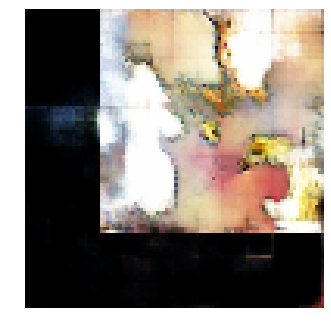


Epoch: 42160, D: -7.574, G: 5.43
Epoch: 42161, D: -7.035, G: 3.143
Epoch: 42162, D: -7.594, G: 3.114
Epoch: 42163, D: -6.327, G: 3.463
Epoch: 42164, D: -5.734, G: 3.229
Epoch: 42165, D: -7.465, G: 5.043
Epoch: 42166, D: -7.103, G: 2.006
Epoch: 42167, D: -6.685, G: 6.225
Epoch: 42168, D: -7.445, G: 5.578
Epoch: 42169, D: -5.659, G: 4.924
Epoch: 42170, D: -6.633, G: 4.802
Epoch: 42171, D: -6.623, G: 3.882
Epoch: 42172, D: -6.266, G: 1.426
Epoch: 42173, D: -6.517, G: 4.843
Epoch: 42174, D: -5.863, G: 3.434
Epoch: 42175, D: -6.2, G: 3.367
Epoch: 42176, D: -5.594, G: 4.315
Epoch: 42177, D: -6.353, G: 2.085
Epoch: 42178, D: -6.103, G: 2.635
Epoch: 42179, D: -7.955, G: 3.034


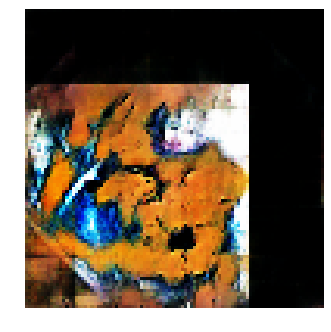


Epoch: 42180, D: -5.817, G: 4.545
Epoch: 42181, D: -6.754, G: 4.012
Epoch: 42182, D: -4.663, G: 3.231
Epoch: 42183, D: -7.741, G: 3.222
Epoch: 42184, D: -6.833, G: 3.279
Epoch: 42185, D: -5.573, G: 6.02
Epoch: 42186, D: -4.904, G: 2.204
Epoch: 42187, D: -6.748, G: 4.021
Epoch: 42188, D: -5.125, G: 2.552
Epoch: 42189, D: -6.896, G: 4.634
Epoch: 42190, D: -6.133, G: 5.386
Epoch: 42191, D: -7.577, G: 4.974
Epoch: 42192, D: -5.385, G: 3.413
Epoch: 42193, D: -6.646, G: 3.247
Epoch: 42194, D: -5.481, G: 4.711
Epoch: 42195, D: -6.296, G: 4.237
Epoch: 42196, D: -5.544, G: 4.489
Epoch: 42197, D: -5.947, G: 3.939
Epoch: 42198, D: -6.801, G: 4.509
Epoch: 42199, D: -6.595, G: 4.061


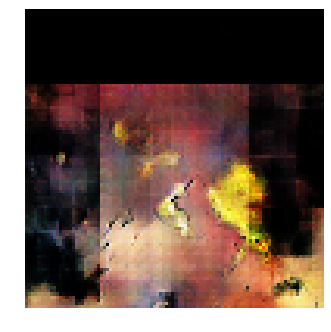


Epoch: 42200, D: -6.319, G: 4.389
Epoch: 42201, D: -7.583, G: 4.129
Epoch: 42202, D: -6.718, G: 4.367
Epoch: 42203, D: -6.225, G: 5.774
Epoch: 42204, D: -5.806, G: 3.444
Epoch: 42205, D: -6.29, G: 3.763
Epoch: 42206, D: -5.395, G: 2.013
Epoch: 42207, D: -6.039, G: 2.709
Epoch: 42208, D: -5.813, G: 2.747
Epoch: 42209, D: -7.211, G: 3.849
Epoch: 42210, D: -6.171, G: 4.563
Epoch: 42211, D: -5.564, G: 3.489
Epoch: 42212, D: -6.196, G: 2.358
Epoch: 42213, D: -5.893, G: 2.698
Epoch: 42214, D: -7.286, G: 4.802
Epoch: 42215, D: -4.585, G: 1.194
Epoch: 42216, D: -6.505, G: 3.429
Epoch: 42217, D: -4.537, G: 4.338
Epoch: 42218, D: -6.871, G: 3.235
Epoch: 42219, D: -6.671, G: 4.462


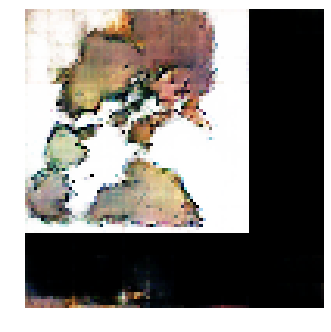


Epoch: 42220, D: -5.184, G: 4.218
Epoch: 42221, D: -5.659, G: 3.107
Epoch: 42222, D: -5.539, G: 2.606
Epoch: 42223, D: -7.708, G: 4.039
Epoch: 42224, D: -6.73, G: 4.032
Epoch: 42225, D: -7.305, G: 3.683
Epoch: 42226, D: -5.112, G: 2.109
Epoch: 42227, D: -4.902, G: 2.622
Epoch: 42228, D: -6.381, G: 5.091
Epoch: 42229, D: -6.088, G: 3.339
Epoch: 42230, D: -5.414, G: 3.786
Epoch: 42231, D: -4.375, G: 2.673
Epoch: 42232, D: -6.903, G: 2.665
Epoch: 42233, D: -7.08, G: 3.576
Epoch: 42234, D: -6.144, G: 4.087
Epoch: 42235, D: -6.351, G: 5.317
Epoch: 42236, D: -5.6, G: 3.725
Epoch: 42237, D: -8.265, G: 3.75
Epoch: 42238, D: -6.058, G: 2.713
Epoch: 42239, D: -6.229, G: 3.77


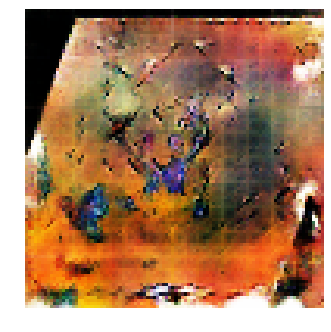


Epoch: 42240, D: -5.708, G: 4.007
Epoch: 42241, D: -6.937, G: 3.458
Epoch: 42242, D: -6.416, G: 3.9
Epoch: 42243, D: -7.168, G: 5.231
Epoch: 42244, D: -6.39, G: 4.507
Epoch: 42245, D: -6.229, G: 3.088
Epoch: 42246, D: -6.355, G: 2.913
Epoch: 42247, D: -5.38, G: 3.279
Epoch: 42248, D: -6.463, G: 3.781
Epoch: 42249, D: -6.218, G: 4.356
Epoch: 42250, D: -6.11, G: 2.367
Epoch: 42251, D: -7.464, G: 2.494
Epoch: 42252, D: -5.635, G: 3.573
Epoch: 42253, D: -6.733, G: 3.652
Epoch: 42254, D: -6.532, G: 3.515
Epoch: 42255, D: -7.555, G: 2.56
Epoch: 42256, D: -6.751, G: 3.334
Epoch: 42257, D: -6.346, G: 3.844
Epoch: 42258, D: -6.413, G: 2.669
Epoch: 42259, D: -5.221, G: 4.611


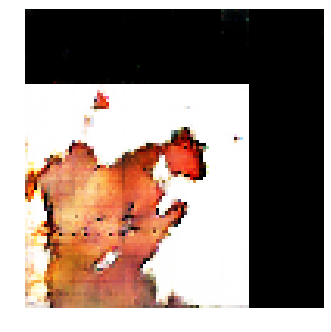


Epoch: 42260, D: -7.006, G: 4.584
Epoch: 42261, D: -7.0, G: 3.212
Epoch: 42262, D: -6.032, G: 3.102
Epoch: 42263, D: -6.232, G: 2.457
Epoch: 42264, D: -5.934, G: 1.59
Epoch: 42265, D: -8.01, G: 2.357
Epoch: 42266, D: -6.096, G: 3.209
Epoch: 42267, D: -6.868, G: 4.204
Epoch: 42268, D: -6.657, G: 2.747
Epoch: 42269, D: -7.126, G: 3.123
Epoch: 42270, D: -5.091, G: 4.031
Epoch: 42271, D: -5.843, G: 3.05
Epoch: 42272, D: -4.115, G: 2.974
Epoch: 42273, D: -6.658, G: 4.39
Epoch: 42274, D: -7.215, G: 4.484
Epoch: 42275, D: -6.422, G: 4.137
Epoch: 42276, D: -6.701, G: 3.584
Epoch: 42277, D: -5.699, G: 4.748
Epoch: 42278, D: -5.751, G: 3.738
Epoch: 42279, D: -7.062, G: 2.146


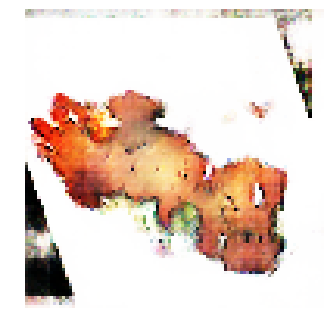


Epoch: 42280, D: -6.06, G: 2.889
Epoch: 42281, D: -6.998, G: 4.42
Epoch: 42282, D: -7.142, G: 3.257
Epoch: 42283, D: -6.171, G: 4.135
Epoch: 42284, D: -5.907, G: 3.382
Epoch: 42285, D: -7.219, G: 2.878
Epoch: 42286, D: -6.115, G: 4.707
Epoch: 42287, D: -5.224, G: 2.714
Epoch: 42288, D: -6.745, G: 4.867
Epoch: 42289, D: -5.967, G: 5.032
Epoch: 42290, D: -6.234, G: 5.532
Epoch: 42291, D: -8.57, G: 4.694
Epoch: 42292, D: -5.585, G: 2.71
Epoch: 42293, D: -7.265, G: 4.41
Epoch: 42294, D: -6.641, G: 2.822
Epoch: 42295, D: -6.125, G: 5.266
Epoch: 42296, D: -6.456, G: 2.726
Epoch: 42297, D: -6.277, G: 4.302
Epoch: 42298, D: -7.05, G: 4.419
Epoch: 42299, D: -6.803, G: 5.101


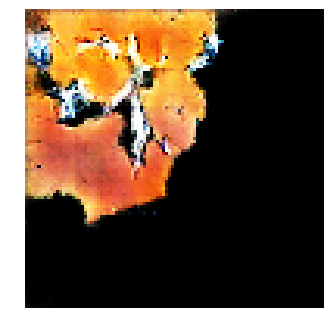


Epoch: 42300, D: -4.543, G: 4.77
Epoch: 42301, D: -6.02, G: 5.14
Epoch: 42302, D: -6.315, G: 4.519
Epoch: 42303, D: -5.866, G: 2.957
Epoch: 42304, D: -7.277, G: 5.159
Epoch: 42305, D: -6.066, G: 5.081
Epoch: 42306, D: -6.274, G: 2.919
Epoch: 42307, D: -6.623, G: 4.509
Epoch: 42308, D: -4.623, G: 3.251
Epoch: 42309, D: -6.587, G: 4.671
Epoch: 42310, D: -6.787, G: 4.706
Epoch: 42311, D: -7.495, G: 5.193
Epoch: 42312, D: -5.172, G: 3.663
Epoch: 42313, D: -5.946, G: 4.093
Epoch: 42314, D: -7.288, G: 2.775
Epoch: 42315, D: -6.442, G: 3.237
Epoch: 42316, D: -6.512, G: 4.21
Epoch: 42317, D: -4.609, G: 6.098
Epoch: 42318, D: -6.29, G: 4.062
Epoch: 42319, D: -5.84, G: 4.622


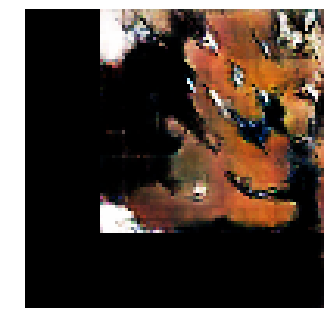


Epoch: 42320, D: -4.401, G: 3.148
Epoch: 42321, D: -4.829, G: 4.593
Epoch: 42322, D: -5.871, G: 4.124
Epoch: 42323, D: -4.97, G: 4.229
Epoch: 42324, D: -6.382, G: 4.842
Epoch: 42325, D: -6.935, G: 3.616
Epoch: 42326, D: -5.642, G: 3.681
Epoch: 42327, D: -6.822, G: 4.088
Epoch: 42328, D: -5.234, G: 3.5
Epoch: 42329, D: -6.064, G: 4.565
Epoch: 42330, D: -5.919, G: 2.94
Epoch: 42331, D: -5.071, G: 3.074
Epoch: 42332, D: -6.503, G: 4.287
Epoch: 42333, D: -7.296, G: 3.556
Epoch: 42334, D: -5.525, G: 5.527
Epoch: 42335, D: -7.077, G: 4.911
Epoch: 42336, D: -6.008, G: 3.065
Epoch: 42337, D: -5.431, G: 3.072
Epoch: 42338, D: -6.76, G: 3.953
Epoch: 42339, D: -6.515, G: 3.044


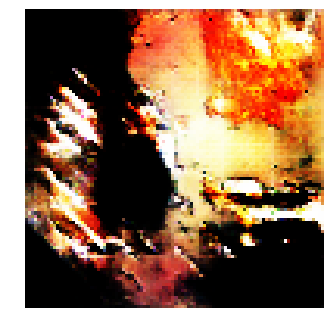


Epoch: 42340, D: -4.73, G: 3.948
Epoch: 42341, D: -5.932, G: 4.21
Epoch: 42342, D: -6.942, G: 3.904
Epoch: 42343, D: -6.254, G: 3.002
Epoch: 42344, D: -6.623, G: 3.592
Epoch: 42345, D: -5.59, G: 3.567
Epoch: 42346, D: -6.248, G: 1.787
Epoch: 42347, D: -6.992, G: 2.079
Epoch: 42348, D: -6.462, G: 4.659
Epoch: 42349, D: -5.286, G: 3.014
Epoch: 42350, D: -5.881, G: 3.901
Epoch: 42351, D: -5.163, G: 2.883
Epoch: 42352, D: -8.487, G: 3.712
Epoch: 42353, D: -3.82, G: 2.879
Epoch: 42354, D: -6.457, G: 4.01
Epoch: 42355, D: -7.49, G: 2.687
Epoch: 42356, D: -6.061, G: 4.473
Epoch: 42357, D: -6.278, G: 2.425
Epoch: 42358, D: -6.04, G: 3.828
Epoch: 42359, D: -6.887, G: 2.545


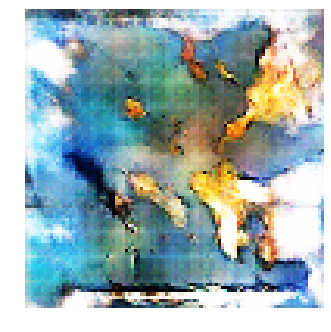


Epoch: 42360, D: -7.284, G: 4.501
Epoch: 42361, D: -9.431, G: 3.805
Epoch: 42362, D: -6.264, G: 2.782
Epoch: 42363, D: -5.933, G: 4.778
Epoch: 42364, D: -6.329, G: 2.893
Epoch: 42365, D: -6.936, G: 4.179
Epoch: 42366, D: -6.647, G: 4.829
Epoch: 42367, D: -6.362, G: 2.162
Epoch: 42368, D: -5.847, G: 2.645
Epoch: 42369, D: -5.775, G: 4.111
Epoch: 42370, D: -6.336, G: 2.484
Epoch: 42371, D: -5.447, G: 3.871
Epoch: 42372, D: -5.803, G: 4.49
Epoch: 42373, D: -5.441, G: 2.399
Epoch: 42374, D: -6.978, G: 2.123
Epoch: 42375, D: -6.931, G: 3.953
Epoch: 42376, D: -5.31, G: 1.995
Epoch: 42377, D: -6.055, G: 3.314
Epoch: 42378, D: -7.689, G: 3.933
Epoch: 42379, D: -6.42, G: 2.897


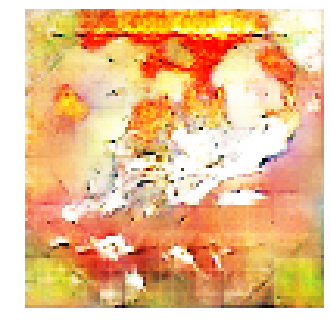


Epoch: 42380, D: -5.808, G: 3.705
Epoch: 42381, D: -5.896, G: 4.806
Epoch: 42382, D: -5.132, G: 4.487
Epoch: 42383, D: -4.535, G: 4.079
Epoch: 42384, D: -6.331, G: 3.925
Epoch: 42385, D: -6.426, G: 3.933
Epoch: 42386, D: -8.218, G: 4.485
Epoch: 42387, D: -5.793, G: 4.158
Epoch: 42388, D: -6.894, G: 6.554
Epoch: 42389, D: -4.723, G: 4.087
Epoch: 42390, D: -6.011, G: 5.424
Epoch: 42391, D: -5.854, G: 2.919
Epoch: 42392, D: -6.62, G: 5.924
Epoch: 42393, D: -6.777, G: 4.577
Epoch: 42394, D: -5.789, G: 3.14
Epoch: 42395, D: -7.046, G: 3.377
Epoch: 42396, D: -6.943, G: 5.068
Epoch: 42397, D: -8.573, G: 5.242
Epoch: 42398, D: -8.072, G: 4.514
Epoch: 42399, D: -4.515, G: 5.26


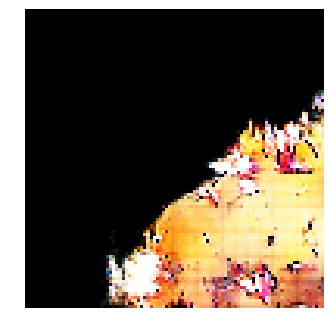


Epoch: 42400, D: -6.259, G: 4.851
Epoch: 42401, D: -6.266, G: 4.689
Epoch: 42402, D: -6.841, G: 2.772
Epoch: 42403, D: -5.245, G: 4.543
Epoch: 42404, D: -6.392, G: 3.118
Epoch: 42405, D: -6.425, G: 3.681
Epoch: 42406, D: -6.539, G: 3.929
Epoch: 42407, D: -5.446, G: 2.863
Epoch: 42408, D: -6.895, G: 3.878
Epoch: 42409, D: -5.531, G: 4.657
Epoch: 42410, D: -5.864, G: 4.324
Epoch: 42411, D: -5.253, G: 5.053
Epoch: 42412, D: -6.915, G: 3.838
Epoch: 42413, D: -7.668, G: 3.28
Epoch: 42414, D: -4.822, G: 1.796
Epoch: 42415, D: -6.825, G: 4.73
Epoch: 42416, D: -5.001, G: 3.889
Epoch: 42417, D: -8.234, G: 3.974
Epoch: 42418, D: -8.102, G: 5.996
Epoch: 42419, D: -6.807, G: 3.352


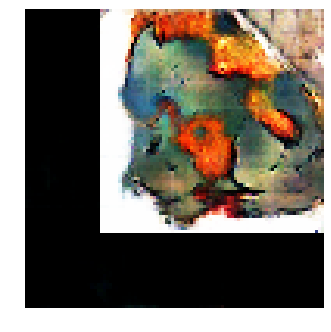


Epoch: 42420, D: -4.744, G: 3.184
Epoch: 42421, D: -5.244, G: 3.753
Epoch: 42422, D: -6.981, G: 3.144
Epoch: 42423, D: -6.22, G: 3.705
Epoch: 42424, D: -5.823, G: 5.086
Epoch: 42425, D: -6.701, G: 2.647
Epoch: 42426, D: -7.449, G: 3.697
Epoch: 42427, D: -7.499, G: 5.752
Epoch: 42428, D: -6.241, G: 3.789
Epoch: 42429, D: -6.228, G: 4.87
Epoch: 42430, D: -5.638, G: 4.442
Epoch: 42431, D: -5.541, G: 2.382
Epoch: 42432, D: -6.982, G: 5.398
Epoch: 42433, D: -6.204, G: 2.813
Epoch: 42434, D: -6.638, G: 2.522
Epoch: 42435, D: -5.073, G: 4.949
Epoch: 42436, D: -6.624, G: 4.515
Epoch: 42437, D: -6.156, G: 4.218
Epoch: 42438, D: -4.576, G: 4.304
Epoch: 42439, D: -5.856, G: 5.103


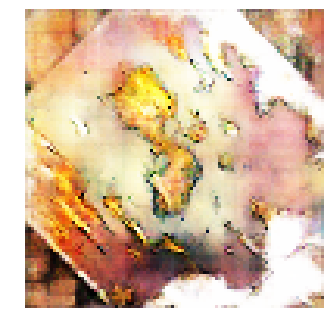


Epoch: 42440, D: -6.509, G: 3.989
Epoch: 42441, D: -6.084, G: 4.464
Epoch: 42442, D: -7.549, G: 2.772
Epoch: 42443, D: -5.614, G: 2.732
Epoch: 42444, D: -5.409, G: 4.816
Epoch: 42445, D: -4.617, G: 3.642
Epoch: 42446, D: -4.623, G: 3.946
Epoch: 42447, D: -7.302, G: 5.794
Epoch: 42448, D: -6.592, G: 2.396
Epoch: 42449, D: -5.821, G: 4.69
Epoch: 42450, D: -6.896, G: 5.406
Epoch: 42451, D: -7.727, G: 2.883
Epoch: 42452, D: -6.683, G: 5.871
Epoch: 42453, D: -5.85, G: 4.993
Epoch: 42454, D: -6.107, G: 4.066
Epoch: 42455, D: -5.264, G: 2.627
Epoch: 42456, D: -7.005, G: 3.206
Epoch: 42457, D: -8.788, G: 1.976
Epoch: 42458, D: -5.863, G: 2.994
Epoch: 42459, D: -5.113, G: 3.296


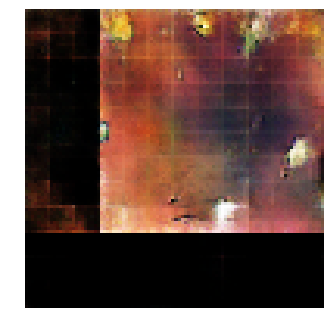


Epoch: 42460, D: -6.536, G: 4.798
Epoch: 42461, D: -6.875, G: 3.27
Epoch: 42462, D: -4.57, G: 3.238
Epoch: 42463, D: -5.628, G: 4.204
Epoch: 42464, D: -5.278, G: 2.957
Epoch: 42465, D: -5.934, G: 1.623
Epoch: 42466, D: -6.048, G: 4.385
Epoch: 42467, D: -5.62, G: 2.723
Epoch: 42468, D: -6.042, G: 2.371
Epoch: 42469, D: -6.9, G: 3.884
Epoch: 42470, D: -6.863, G: 2.512
Epoch: 42471, D: -7.827, G: 4.815
Epoch: 42472, D: -6.501, G: 3.41
Epoch: 42473, D: -5.878, G: 3.602
Epoch: 42474, D: -4.827, G: 4.268
Epoch: 42475, D: -6.854, G: 4.274
Epoch: 42476, D: -5.262, G: 4.581
Epoch: 42477, D: -7.019, G: 4.897
Epoch: 42478, D: -6.712, G: 3.434
Epoch: 42479, D: -5.201, G: 2.852


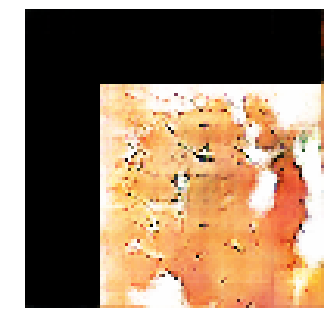


Epoch: 42480, D: -6.028, G: 4.945
Epoch: 42481, D: -6.148, G: 3.687
Epoch: 42482, D: -6.752, G: 3.98
Epoch: 42483, D: -7.194, G: 4.408
Epoch: 42484, D: -6.536, G: 3.426
Epoch: 42485, D: -6.006, G: 2.663
Epoch: 42486, D: -6.651, G: 3.725
Epoch: 42487, D: -5.076, G: 5.406
Epoch: 42488, D: -5.279, G: 3.236
Epoch: 42489, D: -6.467, G: 4.158
Epoch: 42490, D: -5.767, G: 3.791
Epoch: 42491, D: -6.019, G: 4.027
Epoch: 42492, D: -5.793, G: 4.559
Epoch: 42493, D: -6.704, G: 4.092
Epoch: 42494, D: -5.951, G: 4.698
Epoch: 42495, D: -5.401, G: 4.845
Epoch: 42496, D: -5.696, G: 2.44
Epoch: 42497, D: -5.132, G: 4.023
Epoch: 42498, D: -6.552, G: 3.184
Epoch: 42499, D: -5.068, G: 4.171


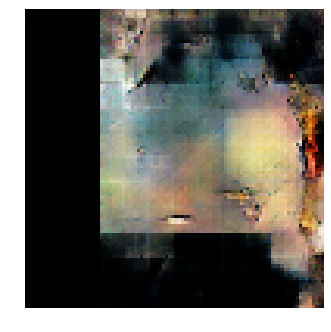


Epoch: 42500, D: -6.649, G: 3.63
Epoch: 42501, D: -6.1, G: 2.415
Epoch: 42502, D: -8.186, G: 4.101
Epoch: 42503, D: -6.558, G: 3.209
Epoch: 42504, D: -4.298, G: 4.515
Epoch: 42505, D: -4.946, G: 2.639
Epoch: 42506, D: -4.811, G: 5.786
Epoch: 42507, D: -5.652, G: 5.674
Epoch: 42508, D: -6.177, G: 3.369
Epoch: 42509, D: -8.103, G: 4.392
Epoch: 42510, D: -5.293, G: 4.319
Epoch: 42511, D: -6.77, G: 4.564
Epoch: 42512, D: -5.788, G: 2.96
Epoch: 42513, D: -6.374, G: 3.65
Epoch: 42514, D: -6.333, G: 2.895
Epoch: 42515, D: -7.225, G: 3.35
Epoch: 42516, D: -7.067, G: 4.435
Epoch: 42517, D: -6.125, G: 4.371
Epoch: 42518, D: -5.984, G: 4.242
Epoch: 42519, D: -8.276, G: 4.644


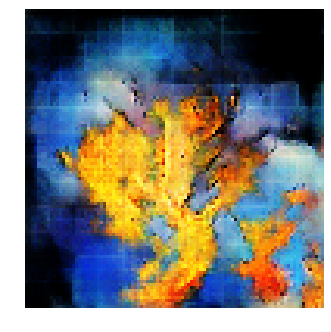


Epoch: 42520, D: -5.548, G: 3.586
Epoch: 42521, D: -5.035, G: 3.272
Epoch: 42522, D: -5.96, G: 3.243
Epoch: 42523, D: -5.986, G: 5.814
Epoch: 42524, D: -6.678, G: 5.236
Epoch: 42525, D: -5.937, G: 4.353
Epoch: 42526, D: -6.157, G: 4.765
Epoch: 42527, D: -5.903, G: 5.108
Epoch: 42528, D: -5.573, G: 3.812
Epoch: 42529, D: -6.002, G: 4.201
Epoch: 42530, D: -7.851, G: 4.494
Epoch: 42531, D: -6.615, G: 4.624
Epoch: 42532, D: -7.468, G: 4.52
Epoch: 42533, D: -5.666, G: 5.238
Epoch: 42534, D: -5.696, G: 5.019
Epoch: 42535, D: -6.831, G: 3.079
Epoch: 42536, D: -5.336, G: 4.362
Epoch: 42537, D: -6.457, G: 2.869
Epoch: 42538, D: -6.713, G: 5.006
Epoch: 42539, D: -6.328, G: 4.029


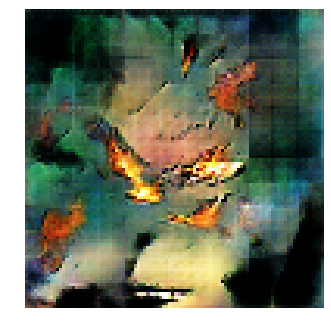


Epoch: 42540, D: -5.763, G: 4.135
Epoch: 42541, D: -5.424, G: 4.544
Epoch: 42542, D: -6.414, G: 3.286
Epoch: 42543, D: -5.524, G: 4.709
Epoch: 42544, D: -6.31, G: 3.024
Epoch: 42545, D: -6.862, G: 3.156
Epoch: 42546, D: -6.338, G: 3.866
Epoch: 42547, D: -6.971, G: 3.47
Epoch: 42548, D: -6.425, G: 5.143
Epoch: 42549, D: -7.134, G: 3.506
Epoch: 42550, D: -5.257, G: 3.887
Epoch: 42551, D: -5.583, G: 3.369
Epoch: 42552, D: -5.976, G: 4.458
Epoch: 42553, D: -6.053, G: 3.502
Epoch: 42554, D: -6.382, G: 6.153
Epoch: 42555, D: -7.478, G: 3.585
Epoch: 42556, D: -7.163, G: 2.906
Epoch: 42557, D: -6.169, G: 4.623
Epoch: 42558, D: -5.302, G: 3.947
Epoch: 42559, D: -6.433, G: 4.132


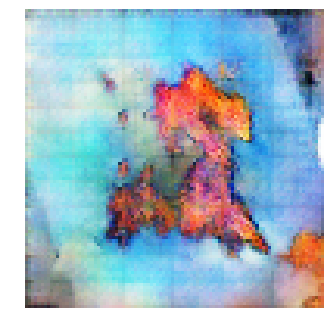


Epoch: 42560, D: -7.323, G: 3.455
Epoch: 42561, D: -5.298, G: 3.829
Epoch: 42562, D: -7.554, G: 3.525
Epoch: 42563, D: -6.147, G: 3.073
Epoch: 42564, D: -5.822, G: 6.589
Epoch: 42565, D: -7.607, G: 4.172
Epoch: 42566, D: -5.83, G: 5.999
Epoch: 42567, D: -5.427, G: 3.994
Epoch: 42568, D: -6.588, G: 4.717
Epoch: 42569, D: -6.35, G: 3.431
Epoch: 42570, D: -6.524, G: 4.455
Epoch: 42571, D: -4.667, G: 2.948
Epoch: 42572, D: -6.271, G: 2.354
Epoch: 42573, D: -5.956, G: 1.729
Epoch: 42574, D: -6.133, G: 2.62
Epoch: 42575, D: -6.416, G: 3.342
Epoch: 42576, D: -6.54, G: 2.294
Epoch: 42577, D: -7.169, G: 3.451
Epoch: 42578, D: -6.538, G: 2.112
Epoch: 42579, D: -6.333, G: 2.517


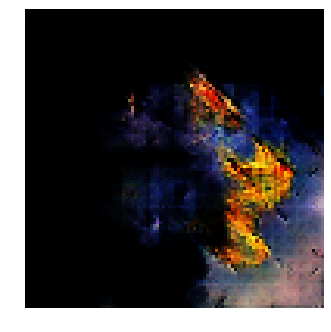


Epoch: 42580, D: -6.327, G: 3.721
Epoch: 42581, D: -5.659, G: 3.106
Epoch: 42582, D: -5.5, G: 3.917
Epoch: 42583, D: -6.487, G: 5.441
Epoch: 42584, D: -7.52, G: 2.144
Epoch: 42585, D: -7.501, G: 3.423
Epoch: 42586, D: -6.215, G: 5.481
Epoch: 42587, D: -5.698, G: 2.523
Epoch: 42588, D: -6.27, G: 4.293
Epoch: 42589, D: -7.325, G: 2.552
Epoch: 42590, D: -6.397, G: 3.028
Epoch: 42591, D: -6.069, G: 3.712
Epoch: 42592, D: -5.146, G: 2.08
Epoch: 42593, D: -4.24, G: 3.825
Epoch: 42594, D: -5.048, G: 2.912
Epoch: 42595, D: -5.473, G: 4.36
Epoch: 42596, D: -6.092, G: 3.028
Epoch: 42597, D: -4.687, G: 6.167
Epoch: 42598, D: -7.298, G: 3.521
Epoch: 42599, D: -5.599, G: 2.912


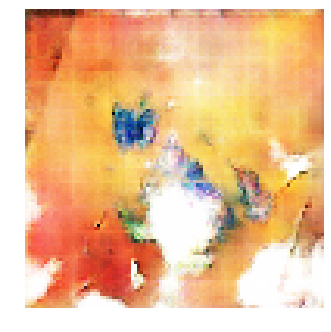


Epoch: 42600, D: -4.269, G: 6.107
Epoch: 42601, D: -5.633, G: 5.44
Epoch: 42602, D: -5.974, G: 3.492
Epoch: 42603, D: -5.573, G: 5.356
Epoch: 42604, D: -5.494, G: 3.723
Epoch: 42605, D: -6.364, G: 4.679
Epoch: 42606, D: -7.061, G: 2.613
Epoch: 42607, D: -6.696, G: 3.486
Epoch: 42608, D: -4.043, G: 3.134
Epoch: 42609, D: -6.112, G: 4.744
Epoch: 42610, D: -7.337, G: 3.534
Epoch: 42611, D: -6.028, G: 6.012
Epoch: 42612, D: -6.489, G: 3.728
Epoch: 42613, D: -6.772, G: 4.972
Epoch: 42614, D: -6.182, G: 2.775
Epoch: 42615, D: -4.953, G: 2.901
Epoch: 42616, D: -5.969, G: 2.337
Epoch: 42617, D: -6.914, G: 4.876
Epoch: 42618, D: -4.951, G: 3.46
Epoch: 42619, D: -6.769, G: 5.208


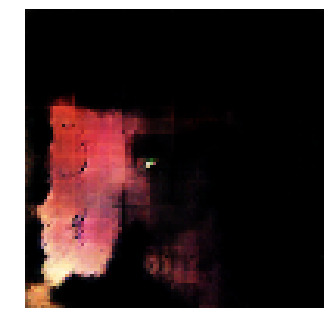


Epoch: 42620, D: -5.208, G: 4.956
Epoch: 42621, D: -7.224, G: 4.682
Epoch: 42622, D: -7.931, G: 3.986
Epoch: 42623, D: -5.072, G: 4.281
Epoch: 42624, D: -5.964, G: 6.801
Epoch: 42625, D: -5.499, G: 4.658
Epoch: 42626, D: -5.758, G: 3.531
Epoch: 42627, D: -5.852, G: 2.899
Epoch: 42628, D: -5.87, G: 4.413
Epoch: 42629, D: -6.902, G: 4.261
Epoch: 42630, D: -6.61, G: 2.829
Epoch: 42631, D: -6.411, G: 5.347
Epoch: 42632, D: -6.769, G: 6.301
Epoch: 42633, D: -7.143, G: 1.863
Epoch: 42634, D: -6.538, G: 3.12
Epoch: 42635, D: -5.51, G: 2.804
Epoch: 42636, D: -5.742, G: 3.814
Epoch: 42637, D: -6.644, G: 2.956
Epoch: 42638, D: -7.303, G: 5.499
Epoch: 42639, D: -6.179, G: 3.904


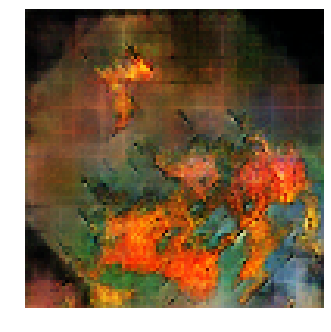


Epoch: 42640, D: -6.3, G: 3.36
Epoch: 42641, D: -6.54, G: 5.395
Epoch: 42642, D: -7.0, G: 3.67
Epoch: 42643, D: -5.591, G: 3.806
Epoch: 42644, D: -6.995, G: 3.55
Epoch: 42645, D: -8.623, G: 2.416
Epoch: 42646, D: -6.917, G: 3.248
Epoch: 42647, D: -6.466, G: 4.469
Epoch: 42648, D: -7.257, G: 5.181
Epoch: 42649, D: -6.975, G: 5.026
Epoch: 42650, D: -5.334, G: 3.504
Epoch: 42651, D: -6.156, G: 4.574
Epoch: 42652, D: -6.975, G: 3.545
Epoch: 42653, D: -5.75, G: 3.111
Epoch: 42654, D: -5.553, G: 3.745
Epoch: 42655, D: -7.099, G: 1.791
Epoch: 42656, D: -5.469, G: 3.214
Epoch: 42657, D: -6.381, G: 3.816
Epoch: 42658, D: -6.895, G: 3.589
Epoch: 42659, D: -5.641, G: 4.112


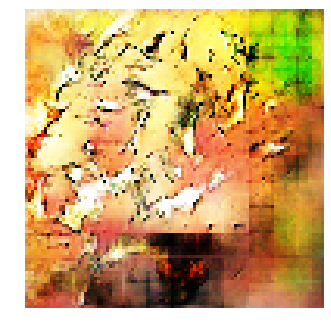


Epoch: 42660, D: -7.775, G: 4.251
Epoch: 42661, D: -7.097, G: 1.748
Epoch: 42662, D: -6.642, G: 3.03
Epoch: 42663, D: -7.064, G: 2.834
Epoch: 42664, D: -6.725, G: 1.859
Epoch: 42665, D: -6.336, G: 2.421
Epoch: 42666, D: -7.065, G: 2.509
Epoch: 42667, D: -6.597, G: 3.265
Epoch: 42668, D: -5.876, G: 3.924
Epoch: 42669, D: -7.273, G: 5.085
Epoch: 42670, D: -5.162, G: 4.722
Epoch: 42671, D: -4.517, G: 1.712
Epoch: 42672, D: -6.522, G: 3.203
Epoch: 42673, D: -6.135, G: 4.097
Epoch: 42674, D: -5.687, G: 3.731
Epoch: 42675, D: -5.984, G: 3.112
Epoch: 42676, D: -7.131, G: 4.538
Epoch: 42677, D: -5.993, G: 5.146
Epoch: 42678, D: -5.776, G: 3.752
Epoch: 42679, D: -8.142, G: 3.926


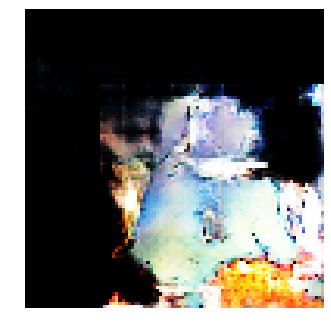


Epoch: 42680, D: -5.405, G: 4.086
Epoch: 42681, D: -5.933, G: 2.934
Epoch: 42682, D: -5.666, G: 4.528
Epoch: 42683, D: -5.244, G: 3.223
Epoch: 42684, D: -6.503, G: 3.966
Epoch: 42685, D: -5.892, G: 4.79
Epoch: 42686, D: -6.154, G: 2.625
Epoch: 42687, D: -4.598, G: 4.842
Epoch: 42688, D: -5.57, G: 5.071
Epoch: 42689, D: -6.525, G: 6.092
Epoch: 42690, D: -7.283, G: 4.284
Epoch: 42691, D: -5.339, G: 4.023
Epoch: 42692, D: -5.767, G: 4.242
Epoch: 42693, D: -4.953, G: 5.155
Epoch: 42694, D: -6.755, G: 4.142
Epoch: 42695, D: -6.951, G: 4.161
Epoch: 42696, D: -5.127, G: 6.271
Epoch: 42697, D: -6.871, G: 5.579
Epoch: 42698, D: -6.354, G: 5.72
Epoch: 42699, D: -6.514, G: 3.51


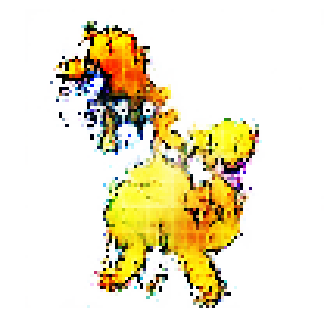


Epoch: 42700, D: -6.044, G: 6.829
Epoch: 42701, D: -5.69, G: 6.274
Epoch: 42702, D: -4.748, G: 4.35
Epoch: 42703, D: -5.666, G: 4.557
Epoch: 42704, D: -5.521, G: 2.893
Epoch: 42705, D: -5.486, G: 3.929
Epoch: 42706, D: -8.343, G: 2.643
Epoch: 42707, D: -5.886, G: 3.109
Epoch: 42708, D: -6.501, G: 3.958
Epoch: 42709, D: -5.149, G: 5.109
Epoch: 42710, D: -4.353, G: 3.583
Epoch: 42711, D: -6.538, G: 3.543
Epoch: 42712, D: -4.669, G: 5.211
Epoch: 42713, D: -5.651, G: 2.099
Epoch: 42714, D: -7.331, G: 2.217
Epoch: 42715, D: -6.751, G: 3.013
Epoch: 42716, D: -5.973, G: 3.391
Epoch: 42717, D: -7.095, G: 3.298
Epoch: 42718, D: -5.886, G: 3.464
Epoch: 42719, D: -5.741, G: 4.54


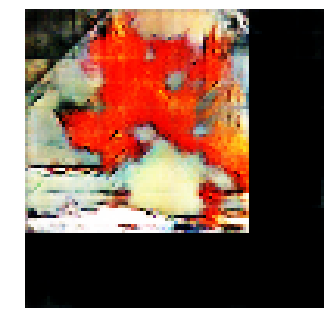


Epoch: 42720, D: -7.282, G: 5.415
Epoch: 42721, D: -6.035, G: 3.943
Epoch: 42722, D: -7.057, G: 4.474
Epoch: 42723, D: -5.86, G: 3.223
Epoch: 42724, D: -7.544, G: 4.646
Epoch: 42725, D: -7.022, G: 4.7
Epoch: 42726, D: -5.648, G: 4.01
Epoch: 42727, D: -6.23, G: 5.371
Epoch: 42728, D: -6.471, G: 3.06
Epoch: 42729, D: -6.752, G: 4.474
Epoch: 42730, D: -6.191, G: 4.28
Epoch: 42731, D: -7.125, G: 6.558
Epoch: 42732, D: -6.398, G: 4.236
Epoch: 42733, D: -6.171, G: 3.207
Epoch: 42734, D: -5.126, G: 3.51
Epoch: 42735, D: -7.042, G: 4.646
Epoch: 42736, D: -7.261, G: 1.923
Epoch: 42737, D: -7.058, G: 2.589
Epoch: 42738, D: -7.789, G: 4.757
Epoch: 42739, D: -6.898, G: 3.2


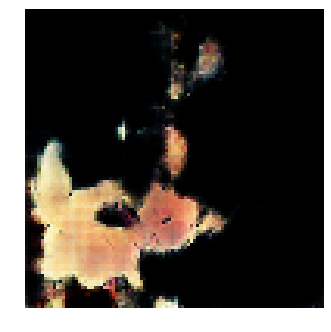


Epoch: 42740, D: -7.505, G: 3.463
Epoch: 42741, D: -5.161, G: 3.336
Epoch: 42742, D: -7.898, G: 3.113
Epoch: 42743, D: -6.055, G: 3.404
Epoch: 42744, D: -7.468, G: 3.53
Epoch: 42745, D: -6.614, G: 3.816
Epoch: 42746, D: -6.373, G: 4.951
Epoch: 42747, D: -6.227, G: 2.151
Epoch: 42748, D: -5.49, G: 2.751
Epoch: 42749, D: -6.236, G: 3.845
Epoch: 42750, D: -6.831, G: 4.716
Epoch: 42751, D: -5.566, G: 3.757
Epoch: 42752, D: -5.244, G: 3.817
Epoch: 42753, D: -6.535, G: 2.32
Epoch: 42754, D: -5.683, G: 3.09
Epoch: 42755, D: -7.456, G: 3.964
Epoch: 42756, D: -8.664, G: 3.384
Epoch: 42757, D: -6.966, G: 3.222
Epoch: 42758, D: -5.741, G: 3.232
Epoch: 42759, D: -6.027, G: 2.892


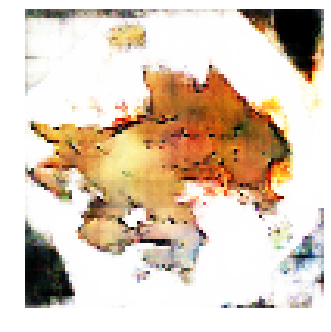


Epoch: 42760, D: -8.47, G: 5.37
Epoch: 42761, D: -6.177, G: 3.331
Epoch: 42762, D: -7.643, G: 4.006
Epoch: 42763, D: -6.344, G: 3.631
Epoch: 42764, D: -5.826, G: 3.72
Epoch: 42765, D: -6.629, G: 4.51
Epoch: 42766, D: -7.106, G: 5.897
Epoch: 42767, D: -7.4, G: 4.626
Epoch: 42768, D: -6.249, G: 5.168
Epoch: 42769, D: -6.534, G: 3.928
Epoch: 42770, D: -6.108, G: 2.185
Epoch: 42771, D: -6.421, G: 2.47
Epoch: 42772, D: -6.307, G: 2.705
Epoch: 42773, D: -6.284, G: 3.855
Epoch: 42774, D: -6.578, G: 1.704
Epoch: 42775, D: -6.482, G: 2.631
Epoch: 42776, D: -6.405, G: 3.573
Epoch: 42777, D: -7.196, G: 2.691
Epoch: 42778, D: -5.633, G: 2.953
Epoch: 42779, D: -6.16, G: 4.886


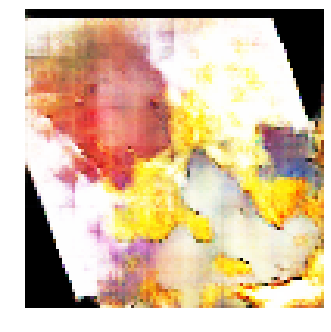


Epoch: 42780, D: -7.164, G: 3.876
Epoch: 42781, D: -7.116, G: 3.736
Epoch: 42782, D: -4.476, G: 2.516
Epoch: 42783, D: -7.124, G: 4.315
Epoch: 42784, D: -4.455, G: 4.056
Epoch: 42785, D: -6.822, G: 4.851
Epoch: 42786, D: -6.516, G: 3.693
Epoch: 42787, D: -7.884, G: 2.915
Epoch: 42788, D: -6.375, G: 5.37
Epoch: 42789, D: -7.546, G: 2.588
Epoch: 42790, D: -7.961, G: 3.09
Epoch: 42791, D: -5.053, G: 3.44
Epoch: 42792, D: -4.079, G: 4.644
Epoch: 42793, D: -6.108, G: 2.839
Epoch: 42794, D: -6.349, G: 5.459
Epoch: 42795, D: -7.663, G: 4.671
Epoch: 42796, D: -6.944, G: 3.467
Epoch: 42797, D: -4.64, G: 3.752
Epoch: 42798, D: -6.276, G: 3.101
Epoch: 42799, D: -5.299, G: 3.099


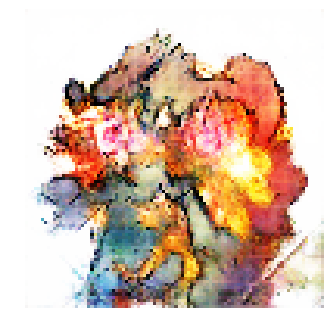


Epoch: 42800, D: -6.93, G: 5.415
Epoch: 42801, D: -6.782, G: 4.445
Epoch: 42802, D: -7.296, G: 3.481
Epoch: 42803, D: -5.649, G: 1.722
Epoch: 42804, D: -5.947, G: 3.75
Epoch: 42805, D: -5.703, G: 4.246
Epoch: 42806, D: -5.941, G: 3.679
Epoch: 42807, D: -6.265, G: 4.003
Epoch: 42808, D: -7.199, G: 5.533
Epoch: 42809, D: -6.168, G: 4.153
Epoch: 42810, D: -6.133, G: 3.254
Epoch: 42811, D: -6.915, G: 2.789
Epoch: 42812, D: -7.55, G: 4.043
Epoch: 42813, D: -5.49, G: 4.772
Epoch: 42814, D: -6.584, G: 5.133
Epoch: 42815, D: -7.499, G: 2.054
Epoch: 42816, D: -6.654, G: 4.327
Epoch: 42817, D: -6.366, G: 3.909
Epoch: 42818, D: -6.896, G: 5.326
Epoch: 42819, D: -5.77, G: 4.204


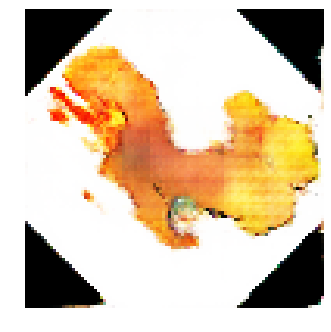


Epoch: 42820, D: -7.798, G: 3.429
Epoch: 42821, D: -7.11, G: 2.326
Epoch: 42822, D: -7.168, G: 4.06
Epoch: 42823, D: -5.845, G: 3.126
Epoch: 42824, D: -5.861, G: 4.023
Epoch: 42825, D: -5.99, G: 3.11
Epoch: 42826, D: -7.797, G: 2.891
Epoch: 42827, D: -7.027, G: 3.268
Epoch: 42828, D: -6.805, G: 5.033
Epoch: 42829, D: -5.022, G: 4.08
Epoch: 42830, D: -5.786, G: 4.313
Epoch: 42831, D: -5.996, G: 5.024
Epoch: 42832, D: -6.292, G: 5.232
Epoch: 42833, D: -6.401, G: 3.755
Epoch: 42834, D: -5.96, G: 4.357
Epoch: 42835, D: -7.213, G: 3.076
Epoch: 42836, D: -6.916, G: 4.106
Epoch: 42837, D: -6.536, G: 4.8
Epoch: 42838, D: -6.328, G: 3.612
Epoch: 42839, D: -6.287, G: 2.857


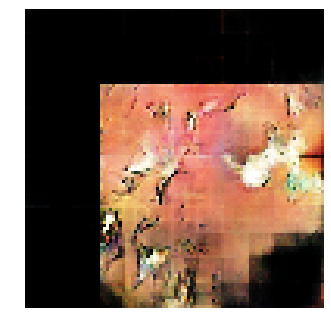


Epoch: 42840, D: -6.323, G: 3.655
Epoch: 42841, D: -7.091, G: 3.201
Epoch: 42842, D: -5.375, G: 5.134
Epoch: 42843, D: -6.462, G: 2.673
Epoch: 42844, D: -7.159, G: 3.194
Epoch: 42845, D: -6.903, G: 3.488
Epoch: 42846, D: -7.114, G: 5.018
Epoch: 42847, D: -6.116, G: 3.075
Epoch: 42848, D: -7.454, G: 3.641
Epoch: 42849, D: -5.647, G: 4.652
Epoch: 42850, D: -4.99, G: 4.982
Epoch: 42851, D: -6.372, G: 4.313
Epoch: 42852, D: -7.937, G: 3.158
Epoch: 42853, D: -7.392, G: 3.268
Epoch: 42854, D: -6.102, G: 3.578
Epoch: 42855, D: -7.885, G: 3.595
Epoch: 42856, D: -5.677, G: 4.713
Epoch: 42857, D: -5.984, G: 5.8
Epoch: 42858, D: -4.749, G: 5.014
Epoch: 42859, D: -8.162, G: 5.658


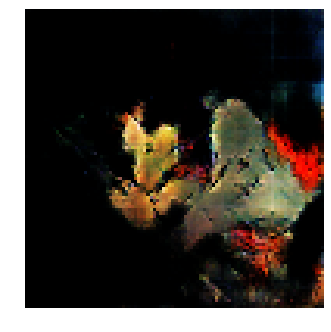


Epoch: 42860, D: -6.513, G: 4.148
Epoch: 42861, D: -5.942, G: 5.209
Epoch: 42862, D: -5.327, G: 5.192
Epoch: 42863, D: -7.436, G: 3.44
Epoch: 42864, D: -6.342, G: 1.732
Epoch: 42865, D: -5.248, G: 3.45
Epoch: 42866, D: -5.75, G: 2.085
Epoch: 42867, D: -6.424, G: 1.298
Epoch: 42868, D: -6.855, G: 3.097
Epoch: 42869, D: -7.124, G: 3.828
Epoch: 42870, D: -5.453, G: 2.567
Epoch: 42871, D: -5.783, G: 3.754
Epoch: 42872, D: -6.047, G: 3.254
Epoch: 42873, D: -8.084, G: 5.166
Epoch: 42874, D: -5.661, G: 2.815
Epoch: 42875, D: -6.398, G: 3.098
Epoch: 42876, D: -7.295, G: 1.246
Epoch: 42877, D: -4.756, G: 3.871
Epoch: 42878, D: -5.679, G: 3.761
Epoch: 42879, D: -6.874, G: 3.94


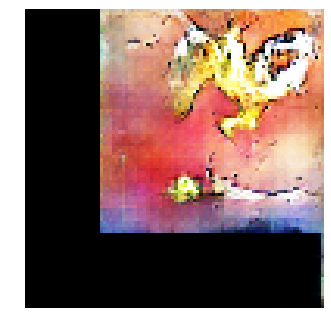


Epoch: 42880, D: -6.384, G: 2.882
Epoch: 42881, D: -5.71, G: 2.852
Epoch: 42882, D: -5.982, G: 5.008
Epoch: 42883, D: -5.299, G: 4.46
Epoch: 42884, D: -7.288, G: 4.44
Epoch: 42885, D: -6.694, G: 3.16
Epoch: 42886, D: -6.262, G: 3.863
Epoch: 42887, D: -6.554, G: 3.186
Epoch: 42888, D: -7.611, G: 5.876
Epoch: 42889, D: -6.444, G: 4.135
Epoch: 42890, D: -6.258, G: 4.598
Epoch: 42891, D: -5.171, G: 3.356
Epoch: 42892, D: -6.104, G: 2.663
Epoch: 42893, D: -6.074, G: 4.185
Epoch: 42894, D: -6.794, G: 5.051
Epoch: 42895, D: -5.986, G: 4.383
Epoch: 42896, D: -7.156, G: 3.589
Epoch: 42897, D: -7.455, G: 2.159
Epoch: 42898, D: -6.98, G: 4.251
Epoch: 42899, D: -6.923, G: 5.811


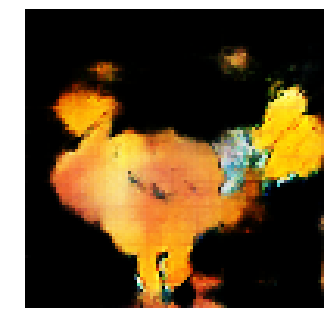


Epoch: 42900, D: -4.892, G: 4.611
Epoch: 42901, D: -6.158, G: 4.572
Epoch: 42902, D: -6.804, G: 4.883
Epoch: 42903, D: -5.326, G: 3.226
Epoch: 42904, D: -5.353, G: 3.577
Epoch: 42905, D: -6.131, G: 2.936
Epoch: 42906, D: -5.524, G: 4.285
Epoch: 42907, D: -7.15, G: 2.067
Epoch: 42908, D: -5.043, G: 2.379
Epoch: 42909, D: -5.343, G: 4.028
Epoch: 42910, D: -7.505, G: 4.881
Epoch: 42911, D: -5.425, G: 5.134
Epoch: 42912, D: -5.256, G: 4.574
Epoch: 42913, D: -7.439, G: 5.617
Epoch: 42914, D: -5.87, G: 5.728
Epoch: 42915, D: -5.732, G: 5.198
Epoch: 42916, D: -6.695, G: 4.309
Epoch: 42917, D: -7.008, G: 3.021
Epoch: 42918, D: -6.09, G: -0.424
Epoch: 42919, D: -6.989, G: 3.354


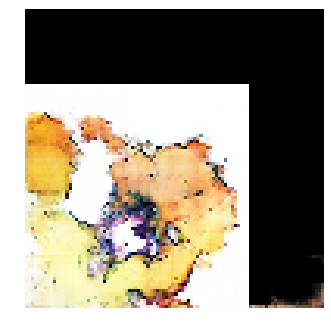


Epoch: 42920, D: -6.342, G: 5.057
Epoch: 42921, D: -7.104, G: 4.146
Epoch: 42922, D: -6.682, G: 3.632
Epoch: 42923, D: -5.251, G: 5.806
Epoch: 42924, D: -7.353, G: 4.552
Epoch: 42925, D: -6.054, G: 5.237
Epoch: 42926, D: -6.987, G: 4.642
Epoch: 42927, D: -6.86, G: 2.756
Epoch: 42928, D: -6.006, G: 5.681
Epoch: 42929, D: -5.116, G: 3.393
Epoch: 42930, D: -5.673, G: 3.413
Epoch: 42931, D: -6.764, G: 2.012
Epoch: 42932, D: -5.243, G: 5.096
Epoch: 42933, D: -5.68, G: 3.632
Epoch: 42934, D: -6.527, G: 2.461
Epoch: 42935, D: -7.013, G: 3.256
Epoch: 42936, D: -6.426, G: 3.147
Epoch: 42937, D: -5.778, G: 4.101
Epoch: 42938, D: -7.544, G: 5.759
Epoch: 42939, D: -7.779, G: 2.934


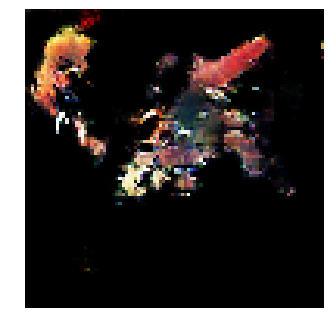


Epoch: 42940, D: -6.068, G: 3.298
Epoch: 42941, D: -6.258, G: 4.374
Epoch: 42942, D: -6.403, G: 2.656
Epoch: 42943, D: -4.909, G: 3.534
Epoch: 42944, D: -6.213, G: 2.856
Epoch: 42945, D: -6.857, G: 2.637
Epoch: 42946, D: -6.973, G: 1.252
Epoch: 42947, D: -6.516, G: 4.2
Epoch: 42948, D: -5.696, G: 3.575
Epoch: 42949, D: -6.138, G: 4.754
Epoch: 42950, D: -6.145, G: 3.285
Epoch: 42951, D: -6.757, G: 3.046
Epoch: 42952, D: -6.177, G: 3.485
Epoch: 42953, D: -7.431, G: 2.346
Epoch: 42954, D: -5.718, G: 2.51
Epoch: 42955, D: -7.232, G: 3.119
Epoch: 42956, D: -5.692, G: 3.779
Epoch: 42957, D: -6.2, G: 3.63
Epoch: 42958, D: -7.177, G: 4.843
Epoch: 42959, D: -5.19, G: 4.806


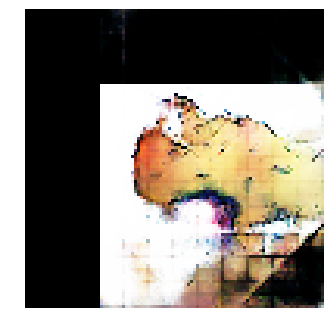


Epoch: 42960, D: -6.178, G: 4.947
Epoch: 42961, D: -7.765, G: 2.942
Epoch: 42962, D: -7.004, G: 5.017
Epoch: 42963, D: -5.689, G: 4.334
Epoch: 42964, D: -5.108, G: 2.869
Epoch: 42965, D: -6.915, G: 3.516
Epoch: 42966, D: -5.452, G: 5.479
Epoch: 42967, D: -4.221, G: 4.106
Epoch: 42968, D: -7.28, G: 3.385
Epoch: 42969, D: -6.597, G: 4.408
Epoch: 42970, D: -6.882, G: 3.412
Epoch: 42971, D: -6.048, G: 3.837
Epoch: 42972, D: -6.663, G: 4.103
Epoch: 42973, D: -7.969, G: 3.516
Epoch: 42974, D: -7.403, G: 3.22
Epoch: 42975, D: -5.173, G: 4.277
Epoch: 42976, D: -5.0, G: 3.035
Epoch: 42977, D: -6.283, G: 3.258
Epoch: 42978, D: -5.302, G: 3.124
Epoch: 42979, D: -5.745, G: 3.53


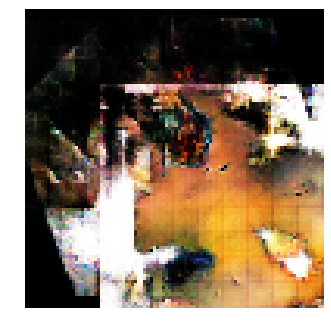


Epoch: 42980, D: -5.596, G: 2.15
Epoch: 42981, D: -7.982, G: 2.934
Epoch: 42982, D: -6.747, G: 4.4
Epoch: 42983, D: -6.858, G: 3.485
Epoch: 42984, D: -4.754, G: 2.891
Epoch: 42985, D: -6.707, G: 4.233
Epoch: 42986, D: -4.863, G: 5.725
Epoch: 42987, D: -6.776, G: 3.945
Epoch: 42988, D: -6.371, G: 4.193
Epoch: 42989, D: -8.18, G: 4.059
Epoch: 42990, D: -8.225, G: 3.254
Epoch: 42991, D: -7.827, G: 5.675
Epoch: 42992, D: -6.522, G: 5.601
Epoch: 42993, D: -7.163, G: 3.478
Epoch: 42994, D: -6.676, G: 2.317
Epoch: 42995, D: -6.685, G: 5.365
Epoch: 42996, D: -4.722, G: 4.303
Epoch: 42997, D: -6.521, G: 4.089
Epoch: 42998, D: -7.026, G: 5.781
Epoch: 42999, D: -5.412, G: 4.965


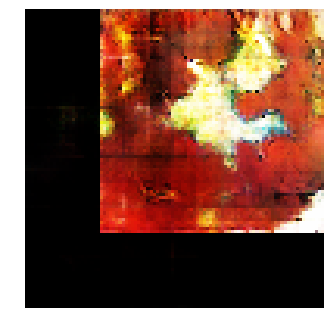


Epoch: 43000, D: -5.299, G: 3.598
Epoch: 43001, D: -5.677, G: 3.319
Epoch: 43002, D: -5.75, G: 4.425
Epoch: 43003, D: -4.524, G: 3.804
Epoch: 43004, D: -8.213, G: 2.578
Epoch: 43005, D: -6.457, G: 3.929
Epoch: 43006, D: -8.19, G: 4.424
Epoch: 43007, D: -4.97, G: 5.085
Epoch: 43008, D: -8.679, G: 5.482
Epoch: 43009, D: -7.741, G: 3.451
Epoch: 43010, D: -5.31, G: 3.644
Epoch: 43011, D: -6.668, G: 3.09
Epoch: 43012, D: -5.472, G: 3.735
Epoch: 43013, D: -6.01, G: 3.771
Epoch: 43014, D: -6.831, G: 4.411
Epoch: 43015, D: -6.233, G: 4.128
Epoch: 43016, D: -5.495, G: 3.454
Epoch: 43017, D: -5.186, G: 5.484
Epoch: 43018, D: -4.904, G: 2.971
Epoch: 43019, D: -6.674, G: 2.628


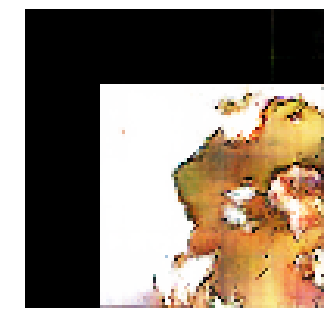


Epoch: 43020, D: -6.837, G: 2.841
Epoch: 43021, D: -6.757, G: 3.804
Epoch: 43022, D: -7.074, G: 3.023
Epoch: 43023, D: -7.509, G: 3.952
Epoch: 43024, D: -6.888, G: 2.579
Epoch: 43025, D: -5.172, G: 3.264
Epoch: 43026, D: -5.965, G: 3.316
Epoch: 43027, D: -6.783, G: 4.865
Epoch: 43028, D: -7.071, G: 4.889
Epoch: 43029, D: -6.231, G: 2.644
Epoch: 43030, D: -7.542, G: 3.822
Epoch: 43031, D: -6.225, G: 4.09
Epoch: 43032, D: -5.805, G: 4.012
Epoch: 43033, D: -5.232, G: 3.73
Epoch: 43034, D: -6.451, G: 3.062
Epoch: 43035, D: -7.876, G: 3.444
Epoch: 43036, D: -6.727, G: 3.651
Epoch: 43037, D: -6.129, G: 5.74
Epoch: 43038, D: -5.359, G: 5.977
Epoch: 43039, D: -6.658, G: 3.726


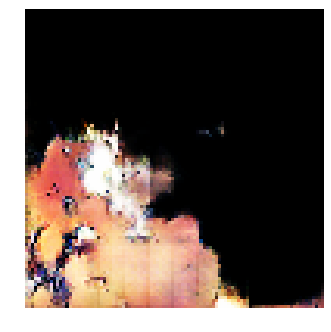


Epoch: 43040, D: -5.873, G: 3.722
Epoch: 43041, D: -6.181, G: 3.653
Epoch: 43042, D: -6.906, G: 4.734
Epoch: 43043, D: -7.358, G: 2.798
Epoch: 43044, D: -6.837, G: 3.272
Epoch: 43045, D: -6.968, G: 3.118
Epoch: 43046, D: -6.68, G: 4.817
Epoch: 43047, D: -5.278, G: 4.188
Epoch: 43048, D: -7.084, G: 3.09
Epoch: 43049, D: -5.459, G: 2.842
Epoch: 43050, D: -7.603, G: 3.713
Epoch: 43051, D: -5.894, G: 4.295
Epoch: 43052, D: -6.026, G: 4.728
Epoch: 43053, D: -7.602, G: 3.36
Epoch: 43054, D: -5.027, G: 3.802
Epoch: 43055, D: -7.065, G: 4.471
Epoch: 43056, D: -5.665, G: 3.596
Epoch: 43057, D: -7.278, G: 3.25
Epoch: 43058, D: -6.368, G: 5.222
Epoch: 43059, D: -6.308, G: 6.692


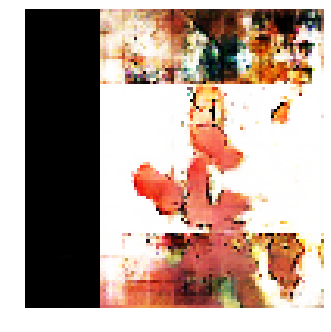


Epoch: 43060, D: -6.526, G: 5.241
Epoch: 43061, D: -5.462, G: 4.186
Epoch: 43062, D: -6.163, G: 5.302
Epoch: 43063, D: -5.873, G: 5.954
Epoch: 43064, D: -5.331, G: 5.48
Epoch: 43065, D: -6.075, G: 5.048
Epoch: 43066, D: -6.462, G: 4.861
Epoch: 43067, D: -6.001, G: 1.541
Epoch: 43068, D: -6.365, G: 3.462
Epoch: 43069, D: -5.244, G: 2.784
Epoch: 43070, D: -6.361, G: 5.959
Epoch: 43071, D: -6.72, G: 6.682
Epoch: 43072, D: -5.745, G: 4.008
Epoch: 43073, D: -5.577, G: 2.378
Epoch: 43074, D: -6.76, G: 5.425
Epoch: 43075, D: -7.27, G: 1.9
Epoch: 43076, D: -7.142, G: 2.588
Epoch: 43077, D: -6.503, G: 4.449
Epoch: 43078, D: -6.717, G: 2.174
Epoch: 43079, D: -5.799, G: 3.977


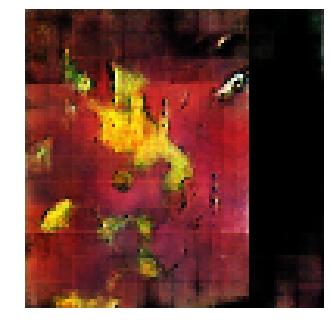


Epoch: 43080, D: -4.386, G: 3.664
Epoch: 43081, D: -6.857, G: 4.614
Epoch: 43082, D: -5.681, G: 3.445
Epoch: 43083, D: -4.072, G: 4.169
Epoch: 43084, D: -6.089, G: 3.082
Epoch: 43085, D: -6.596, G: 1.88
Epoch: 43086, D: -5.71, G: 4.426
Epoch: 43087, D: -5.057, G: 3.358
Epoch: 43088, D: -5.35, G: 2.821
Epoch: 43089, D: -5.946, G: 3.138
Epoch: 43090, D: -5.451, G: 4.118
Epoch: 43091, D: -4.9, G: 3.677
Epoch: 43092, D: -5.68, G: 1.522
Epoch: 43093, D: -7.155, G: 2.773
Epoch: 43094, D: -5.654, G: 2.462
Epoch: 43095, D: -7.32, G: 4.398
Epoch: 43096, D: -6.804, G: 1.276
Epoch: 43097, D: -6.48, G: 1.192
Epoch: 43098, D: -6.983, G: 0.958
Epoch: 43099, D: -5.905, G: 3.116


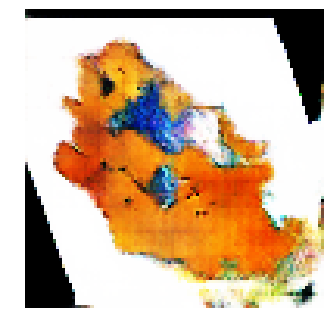


Epoch: 43100, D: -6.454, G: 2.499
Epoch: 43101, D: -5.673, G: 2.301
Epoch: 43102, D: -6.373, G: 2.05
Epoch: 43103, D: -8.567, G: 4.132
Epoch: 43104, D: -5.765, G: 2.735
Epoch: 43105, D: -5.36, G: 3.566
Epoch: 43106, D: -5.72, G: 4.292
Epoch: 43107, D: -6.594, G: 4.635
Epoch: 43108, D: -5.344, G: 3.135
Epoch: 43109, D: -7.2, G: 5.628
Epoch: 43110, D: -7.6, G: 2.675
Epoch: 43111, D: -4.16, G: 4.908
Epoch: 43112, D: -6.685, G: 4.557
Epoch: 43113, D: -7.186, G: 3.032
Epoch: 43114, D: -6.779, G: 2.614
Epoch: 43115, D: -6.563, G: 3.463
Epoch: 43116, D: -6.419, G: 3.074
Epoch: 43117, D: -6.74, G: 3.993
Epoch: 43118, D: -5.769, G: 3.259
Epoch: 43119, D: -5.864, G: 3.927


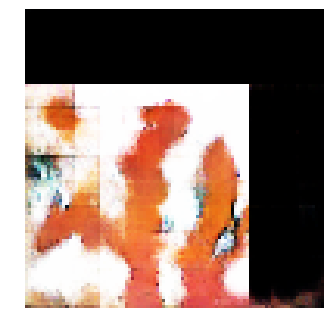


Epoch: 43120, D: -6.405, G: 4.37
Epoch: 43121, D: -7.244, G: 3.184
Epoch: 43122, D: -6.962, G: 5.041
Epoch: 43123, D: -7.654, G: 3.874
Epoch: 43124, D: -5.908, G: 5.104
Epoch: 43125, D: -5.576, G: 4.817
Epoch: 43126, D: -6.886, G: 5.448
Epoch: 43127, D: -6.271, G: 4.558
Epoch: 43128, D: -7.56, G: 4.603
Epoch: 43129, D: -6.317, G: 2.524
Epoch: 43130, D: -5.397, G: 4.219
Epoch: 43131, D: -6.053, G: 2.467
Epoch: 43132, D: -7.632, G: 3.278
Epoch: 43133, D: -6.893, G: 3.239
Epoch: 43134, D: -6.212, G: 4.297
Epoch: 43135, D: -5.718, G: 5.339
Epoch: 43136, D: -7.452, G: 4.829
Epoch: 43137, D: -7.087, G: 4.03
Epoch: 43138, D: -8.503, G: 3.517
Epoch: 43139, D: -7.017, G: 5.371


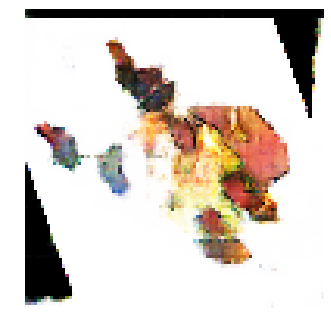


Epoch: 43140, D: -7.184, G: 4.804
Epoch: 43141, D: -6.768, G: 4.014
Epoch: 43142, D: -9.06, G: 3.576
Epoch: 43143, D: -7.656, G: 3.85
Epoch: 43144, D: -6.479, G: 3.351
Epoch: 43145, D: -6.449, G: 3.35
Epoch: 43146, D: -7.024, G: 4.266
Epoch: 43147, D: -5.965, G: 5.845
Epoch: 43148, D: -8.144, G: 5.126
Epoch: 43149, D: -7.008, G: 4.436
Epoch: 43150, D: -7.024, G: 2.991
Epoch: 43151, D: -4.821, G: 5.118
Epoch: 43152, D: -6.521, G: 4.9
Epoch: 43153, D: -7.082, G: 5.259
Epoch: 43154, D: -5.268, G: 4.451
Epoch: 43155, D: -6.441, G: 4.974
Epoch: 43156, D: -6.82, G: 5.015
Epoch: 43157, D: -5.816, G: 4.015
Epoch: 43158, D: -8.097, G: 2.429
Epoch: 43159, D: -6.92, G: 3.218


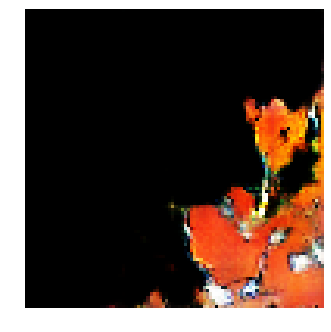


Epoch: 43160, D: -6.116, G: 4.246
Epoch: 43161, D: -8.125, G: 3.518
Epoch: 43162, D: -6.555, G: 4.478
Epoch: 43163, D: -5.533, G: 4.235
Epoch: 43164, D: -6.716, G: 3.94
Epoch: 43165, D: -6.586, G: 3.573
Epoch: 43166, D: -5.149, G: 3.949
Epoch: 43167, D: -4.868, G: 4.261
Epoch: 43168, D: -5.705, G: 3.186
Epoch: 43169, D: -7.836, G: 3.655
Epoch: 43170, D: -6.683, G: 1.034
Epoch: 43171, D: -5.691, G: 5.842
Epoch: 43172, D: -5.273, G: 3.511
Epoch: 43173, D: -6.032, G: 4.364
Epoch: 43174, D: -7.068, G: 3.02
Epoch: 43175, D: -6.127, G: 2.836
Epoch: 43176, D: -7.845, G: 4.463
Epoch: 43177, D: -5.086, G: 2.962
Epoch: 43178, D: -5.953, G: 4.122
Epoch: 43179, D: -6.992, G: 4.244


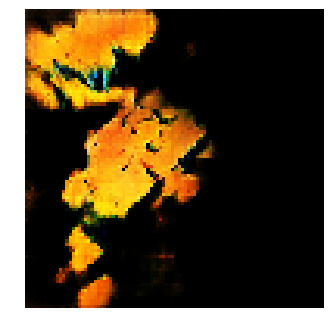


Epoch: 43180, D: -6.199, G: 3.602
Epoch: 43181, D: -6.896, G: 5.392
Epoch: 43182, D: -4.748, G: 1.886
Epoch: 43183, D: -6.976, G: 3.876
Epoch: 43184, D: -6.336, G: 4.484
Epoch: 43185, D: -5.369, G: 6.177
Epoch: 43186, D: -7.192, G: 3.472
Epoch: 43187, D: -5.63, G: 4.637
Epoch: 43188, D: -6.248, G: 4.594
Epoch: 43189, D: -6.515, G: 2.322
Epoch: 43190, D: -6.205, G: 3.718
Epoch: 43191, D: -5.872, G: 2.797
Epoch: 43192, D: -8.454, G: 3.47
Epoch: 43193, D: -5.689, G: 2.674
Epoch: 43194, D: -6.54, G: 2.098
Epoch: 43195, D: -5.621, G: 1.771
Epoch: 43196, D: -6.436, G: 4.886
Epoch: 43197, D: -6.862, G: 4.289
Epoch: 43198, D: -5.424, G: 3.81
Epoch: 43199, D: -5.884, G: 3.348


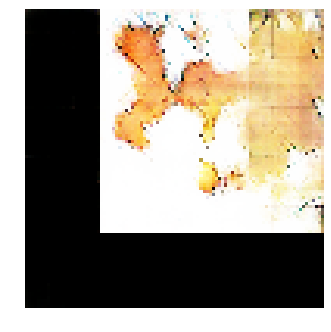


Epoch: 43200, D: -6.797, G: 5.984
Epoch: 43201, D: -5.998, G: 3.555
Epoch: 43202, D: -6.791, G: 6.285
Epoch: 43203, D: -5.775, G: 3.453
Epoch: 43204, D: -5.223, G: 3.7
Epoch: 43205, D: -5.974, G: 3.792
Epoch: 43206, D: -5.969, G: 4.887
Epoch: 43207, D: -7.314, G: 2.635
Epoch: 43208, D: -6.679, G: 4.268
Epoch: 43209, D: -6.568, G: 5.214
Epoch: 43210, D: -6.949, G: 4.054
Epoch: 43211, D: -5.066, G: 3.097
Epoch: 43212, D: -6.428, G: 2.962
Epoch: 43213, D: -6.498, G: 3.589
Epoch: 43214, D: -7.04, G: 3.609
Epoch: 43215, D: -6.453, G: 3.169
Epoch: 43216, D: -7.408, G: 4.561
Epoch: 43217, D: -6.558, G: 4.813
Epoch: 43218, D: -7.076, G: 3.001
Epoch: 43219, D: -6.459, G: 2.867


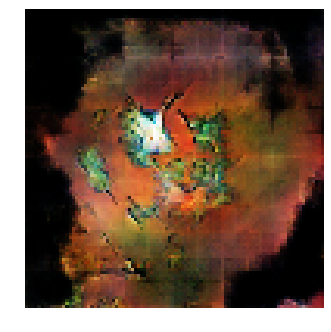


Epoch: 43220, D: -5.608, G: 3.668
Epoch: 43221, D: -4.8, G: 4.216
Epoch: 43222, D: -6.775, G: 4.093
Epoch: 43223, D: -6.616, G: 1.857
Epoch: 43224, D: -5.736, G: 4.672
Epoch: 43225, D: -6.853, G: 5.052
Epoch: 43226, D: -6.93, G: 4.611
Epoch: 43227, D: -6.265, G: 4.948
Epoch: 43228, D: -5.771, G: 2.624
Epoch: 43229, D: -7.738, G: 4.115
Epoch: 43230, D: -5.72, G: 2.023
Epoch: 43231, D: -5.267, G: 4.112
Epoch: 43232, D: -4.654, G: 5.125
Epoch: 43233, D: -6.946, G: 3.372
Epoch: 43234, D: -5.438, G: 3.39
Epoch: 43235, D: -6.615, G: 5.29
Epoch: 43236, D: -5.87, G: 3.347
Epoch: 43237, D: -6.228, G: 2.243
Epoch: 43238, D: -5.029, G: 4.0
Epoch: 43239, D: -6.658, G: 3.916


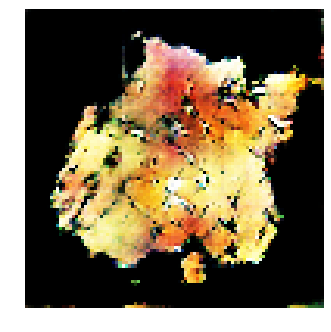


Epoch: 43240, D: -6.3, G: 3.634
Epoch: 43241, D: -8.071, G: 2.591
Epoch: 43242, D: -6.418, G: 2.088
Epoch: 43243, D: -6.589, G: 4.0
Epoch: 43244, D: -6.572, G: 4.288
Epoch: 43245, D: -6.239, G: 3.732
Epoch: 43246, D: -5.505, G: 3.861
Epoch: 43247, D: -5.031, G: 2.751
Epoch: 43248, D: -5.642, G: 3.403
Epoch: 43249, D: -5.421, G: 3.014
Epoch: 43250, D: -7.823, G: 4.514
Epoch: 43251, D: -6.252, G: 3.188
Epoch: 43252, D: -5.891, G: 4.927
Epoch: 43253, D: -6.988, G: 4.763
Epoch: 43254, D: -6.452, G: 3.277
Epoch: 43255, D: -6.723, G: 5.905
Epoch: 43256, D: -5.544, G: 5.013
Epoch: 43257, D: -5.829, G: 4.175
Epoch: 43258, D: -5.544, G: 4.039
Epoch: 43259, D: -5.951, G: 4.979


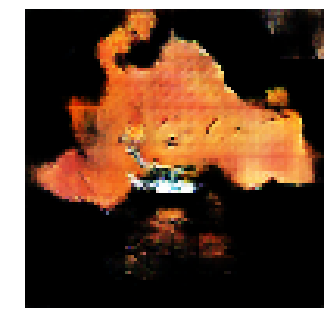


Epoch: 43260, D: -5.393, G: 4.901
Epoch: 43261, D: -7.14, G: 3.34
Epoch: 43262, D: -6.34, G: 5.094
Epoch: 43263, D: -5.698, G: 3.856
Epoch: 43264, D: -8.04, G: 4.422
Epoch: 43265, D: -6.345, G: 2.333
Epoch: 43266, D: -6.122, G: 5.243
Epoch: 43267, D: -6.787, G: 3.63
Epoch: 43268, D: -8.313, G: 3.325
Epoch: 43269, D: -4.968, G: 3.284
Epoch: 43270, D: -6.428, G: 5.063
Epoch: 43271, D: -6.567, G: 3.874
Epoch: 43272, D: -5.601, G: 3.528
Epoch: 43273, D: -6.821, G: 2.665
Epoch: 43274, D: -6.312, G: 2.846
Epoch: 43275, D: -5.557, G: 3.105
Epoch: 43276, D: -6.301, G: 3.701
Epoch: 43277, D: -6.234, G: 4.25
Epoch: 43278, D: -7.688, G: 4.773
Epoch: 43279, D: -6.206, G: 3.11


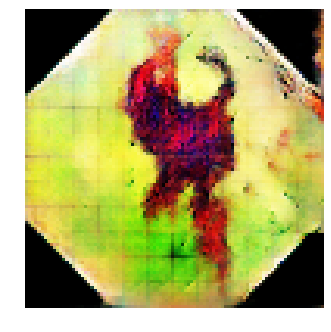


Epoch: 43280, D: -6.102, G: 4.704
Epoch: 43281, D: -6.389, G: 4.348
Epoch: 43282, D: -7.847, G: 4.66
Epoch: 43283, D: -5.551, G: 1.78
Epoch: 43284, D: -5.44, G: 3.463
Epoch: 43285, D: -6.688, G: 1.708
Epoch: 43286, D: -6.491, G: 3.723
Epoch: 43287, D: -7.141, G: 4.372
Epoch: 43288, D: -4.522, G: 1.954
Epoch: 43289, D: -7.014, G: 3.536
Epoch: 43290, D: -7.911, G: 4.16
Epoch: 43291, D: -4.858, G: 3.132
Epoch: 43292, D: -7.055, G: 2.396
Epoch: 43293, D: -6.85, G: 1.956
Epoch: 43294, D: -7.046, G: 4.198
Epoch: 43295, D: -7.067, G: 4.497
Epoch: 43296, D: -6.607, G: 5.985
Epoch: 43297, D: -6.76, G: 2.981
Epoch: 43298, D: -8.146, G: 3.357
Epoch: 43299, D: -5.294, G: 5.037


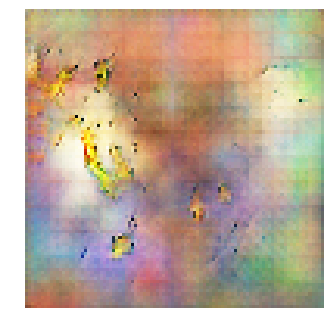


Epoch: 43300, D: -5.973, G: 5.087
Epoch: 43301, D: -6.824, G: 3.837
Epoch: 43302, D: -5.001, G: 2.965
Epoch: 43303, D: -5.322, G: 3.382
Epoch: 43304, D: -5.629, G: 2.715
Epoch: 43305, D: -7.101, G: 2.404
Epoch: 43306, D: -6.809, G: 3.511
Epoch: 43307, D: -6.125, G: 3.682
Epoch: 43308, D: -4.601, G: 3.322
Epoch: 43309, D: -7.349, G: 2.665
Epoch: 43310, D: -6.695, G: 2.41
Epoch: 43311, D: -5.525, G: 4.651
Epoch: 43312, D: -5.706, G: 4.937
Epoch: 43313, D: -4.751, G: 4.81
Epoch: 43314, D: -5.665, G: 4.332
Epoch: 43315, D: -5.695, G: 2.335
Epoch: 43316, D: -5.161, G: 2.022
Epoch: 43317, D: -6.623, G: 4.127
Epoch: 43318, D: -5.085, G: 3.204
Epoch: 43319, D: -5.757, G: 1.895


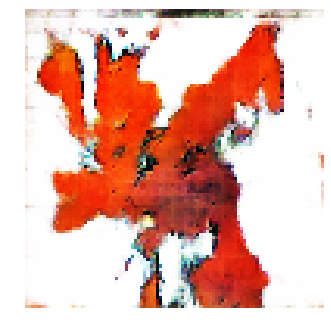


Epoch: 43320, D: -5.253, G: 3.968
Epoch: 43321, D: -6.673, G: 4.313
Epoch: 43322, D: -5.448, G: 4.737
Epoch: 43323, D: -6.729, G: 4.163
Epoch: 43324, D: -6.641, G: 2.196
Epoch: 43325, D: -6.763, G: 5.55
Epoch: 43326, D: -6.043, G: 4.496
Epoch: 43327, D: -5.162, G: 4.05
Epoch: 43328, D: -6.602, G: 6.866
Epoch: 43329, D: -5.927, G: 5.002
Epoch: 43330, D: -6.131, G: 3.367
Epoch: 43331, D: -7.365, G: 3.275
Epoch: 43332, D: -5.616, G: 3.206
Epoch: 43333, D: -6.82, G: 4.313
Epoch: 43334, D: -4.93, G: 4.055
Epoch: 43335, D: -5.491, G: 5.034
Epoch: 43336, D: -6.094, G: 3.88
Epoch: 43337, D: -5.907, G: 5.364
Epoch: 43338, D: -6.398, G: 3.708
Epoch: 43339, D: -5.927, G: 4.358


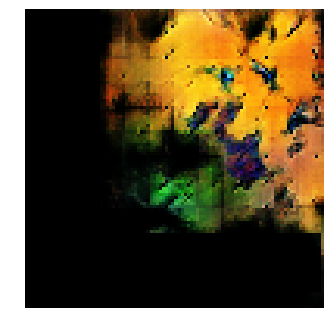


Epoch: 43340, D: -7.156, G: 4.297
Epoch: 43341, D: -6.053, G: 5.657
Epoch: 43342, D: -6.284, G: 4.559
Epoch: 43343, D: -5.779, G: 3.979
Epoch: 43344, D: -7.214, G: 1.993
Epoch: 43345, D: -6.841, G: 3.879
Epoch: 43346, D: -6.129, G: 3.056
Epoch: 43347, D: -6.248, G: 3.167
Epoch: 43348, D: -4.695, G: 6.287
Epoch: 43349, D: -5.862, G: 3.955
Epoch: 43350, D: -6.075, G: 4.225
Epoch: 43351, D: -4.403, G: 4.124
Epoch: 43352, D: -6.41, G: 3.912
Epoch: 43353, D: -5.17, G: 5.523
Epoch: 43354, D: -6.326, G: 5.081
Epoch: 43355, D: -6.172, G: 4.571
Epoch: 43356, D: -8.18, G: 4.457
Epoch: 43357, D: -6.031, G: 2.906
Epoch: 43358, D: -7.146, G: 4.313
Epoch: 43359, D: -6.196, G: 1.16


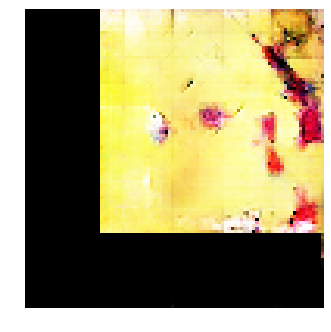


Epoch: 43360, D: -6.469, G: 1.017
Epoch: 43361, D: -5.554, G: 1.892
Epoch: 43362, D: -5.691, G: 4.654
Epoch: 43363, D: -7.777, G: 4.044
Epoch: 43364, D: -6.241, G: 3.424
Epoch: 43365, D: -5.891, G: 2.926
Epoch: 43366, D: -6.215, G: 1.648
Epoch: 43367, D: -7.296, G: 4.125
Epoch: 43368, D: -5.289, G: 5.351
Epoch: 43369, D: -5.617, G: 2.217
Epoch: 43370, D: -5.052, G: 4.467
Epoch: 43371, D: -7.247, G: 4.73
Epoch: 43372, D: -6.109, G: 3.574
Epoch: 43373, D: -7.036, G: 4.09
Epoch: 43374, D: -7.646, G: 3.633
Epoch: 43375, D: -7.122, G: 5.221
Epoch: 43376, D: -6.731, G: 3.144
Epoch: 43377, D: -5.667, G: 2.913
Epoch: 43378, D: -7.62, G: 3.362
Epoch: 43379, D: -6.054, G: 3.879


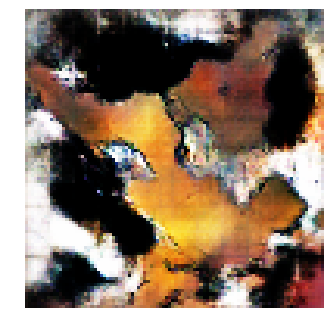


Epoch: 43380, D: -5.566, G: 3.762
Epoch: 43381, D: -5.896, G: 4.91
Epoch: 43382, D: -5.889, G: 3.089
Epoch: 43383, D: -7.163, G: 2.657
Epoch: 43384, D: -6.772, G: 5.122
Epoch: 43385, D: -6.287, G: 4.01
Epoch: 43386, D: -6.73, G: 3.439
Epoch: 43387, D: -7.275, G: 3.206
Epoch: 43388, D: -6.344, G: 1.095
Epoch: 43389, D: -6.309, G: 2.976
Epoch: 43390, D: -8.262, G: 2.38
Epoch: 43391, D: -4.647, G: 3.823
Epoch: 43392, D: -6.334, G: 3.465
Epoch: 43393, D: -5.266, G: 3.44
Epoch: 43394, D: -6.366, G: 3.087
Epoch: 43395, D: -7.03, G: 4.295
Epoch: 43396, D: -6.818, G: 2.945
Epoch: 43397, D: -6.386, G: 3.076
Epoch: 43398, D: -4.258, G: 4.658
Epoch: 43399, D: -6.643, G: 3.883


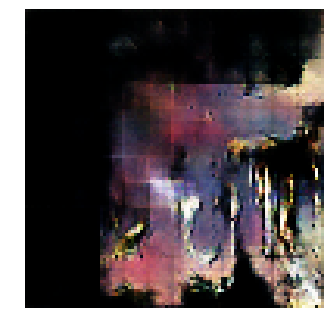


Epoch: 43400, D: -6.559, G: 3.536
Epoch: 43401, D: -6.236, G: 5.414
Epoch: 43402, D: -5.803, G: 4.324
Epoch: 43403, D: -6.351, G: 2.642
Epoch: 43404, D: -5.212, G: 1.903
Epoch: 43405, D: -6.218, G: 4.36
Epoch: 43406, D: -4.736, G: 4.211
Epoch: 43407, D: -7.553, G: 4.393
Epoch: 43408, D: -7.463, G: 3.7
Epoch: 43409, D: -6.042, G: 2.98
Epoch: 43410, D: -6.17, G: 4.303
Epoch: 43411, D: -7.683, G: 4.316
Epoch: 43412, D: -7.727, G: 3.746
Epoch: 43413, D: -6.999, G: 5.319
Epoch: 43414, D: -7.157, G: 4.979
Epoch: 43415, D: -6.463, G: 4.652
Epoch: 43416, D: -5.525, G: 4.796
Epoch: 43417, D: -6.407, G: 5.556
Epoch: 43418, D: -5.045, G: 5.041
Epoch: 43419, D: -6.606, G: 5.72


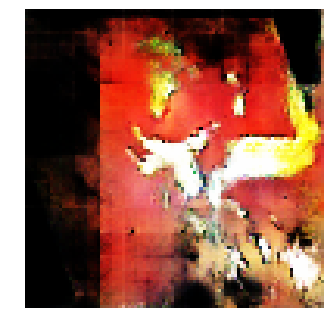


Epoch: 43420, D: -7.741, G: 3.766
Epoch: 43421, D: -7.729, G: 4.07
Epoch: 43422, D: -5.517, G: 5.519
Epoch: 43423, D: -7.184, G: 4.855
Epoch: 43424, D: -5.459, G: 4.478
Epoch: 43425, D: -7.404, G: 3.945
Epoch: 43426, D: -6.218, G: 4.747
Epoch: 43427, D: -5.581, G: 3.051
Epoch: 43428, D: -7.563, G: 4.085
Epoch: 43429, D: -5.688, G: 3.016
Epoch: 43430, D: -6.28, G: 1.142
Epoch: 43431, D: -6.841, G: 3.947
Epoch: 43432, D: -5.752, G: 4.009
Epoch: 43433, D: -5.437, G: 2.557
Epoch: 43434, D: -6.461, G: 3.556
Epoch: 43435, D: -7.226, G: 3.174
Epoch: 43436, D: -6.843, G: 2.176
Epoch: 43437, D: -6.374, G: 3.631
Epoch: 43438, D: -7.235, G: 4.411
Epoch: 43439, D: -8.079, G: 4.113


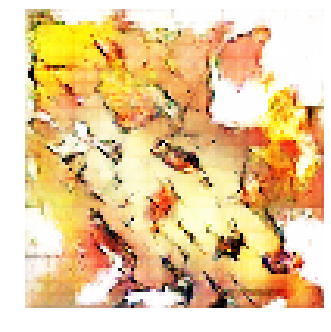


Epoch: 43440, D: -6.569, G: 4.247
Epoch: 43441, D: -6.451, G: 3.044
Epoch: 43442, D: -6.363, G: 4.25
Epoch: 43443, D: -6.492, G: 5.052
Epoch: 43444, D: -4.395, G: 4.234
Epoch: 43445, D: -5.924, G: 4.199
Epoch: 43446, D: -5.927, G: 5.024
Epoch: 43447, D: -8.634, G: 3.76
Epoch: 43448, D: -5.62, G: 3.153
Epoch: 43449, D: -6.576, G: 4.826
Epoch: 43450, D: -6.041, G: 4.519
Epoch: 43451, D: -6.288, G: 4.345
Epoch: 43452, D: -7.123, G: 4.338
Epoch: 43453, D: -5.732, G: 4.313
Epoch: 43454, D: -5.563, G: 5.533
Epoch: 43455, D: -5.971, G: 5.762
Epoch: 43456, D: -6.09, G: 3.321
Epoch: 43457, D: -5.433, G: 3.674
Epoch: 43458, D: -7.941, G: 2.687
Epoch: 43459, D: -9.784, G: 2.748


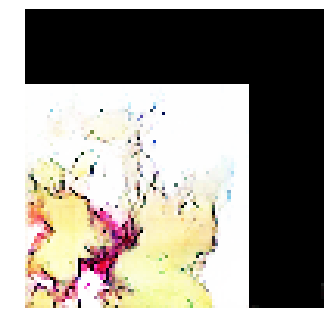


Epoch: 43460, D: -5.255, G: 5.142
Epoch: 43461, D: -5.772, G: 4.072
Epoch: 43462, D: -6.674, G: 4.544
Epoch: 43463, D: -4.803, G: 4.127
Epoch: 43464, D: -6.093, G: 3.157
Epoch: 43465, D: -6.974, G: 4.241
Epoch: 43466, D: -5.56, G: 3.363
Epoch: 43467, D: -6.417, G: 3.952
Epoch: 43468, D: -7.08, G: 3.437
Epoch: 43469, D: -5.44, G: 2.712
Epoch: 43470, D: -4.727, G: 4.197
Epoch: 43471, D: -6.283, G: 2.708
Epoch: 43472, D: -7.313, G: 4.071
Epoch: 43473, D: -6.991, G: 4.02
Epoch: 43474, D: -6.463, G: 3.931
Epoch: 43475, D: -5.744, G: 5.794
Epoch: 43476, D: -7.186, G: 3.972
Epoch: 43477, D: -7.894, G: 3.642
Epoch: 43478, D: -7.324, G: 4.058
Epoch: 43479, D: -6.073, G: 4.835


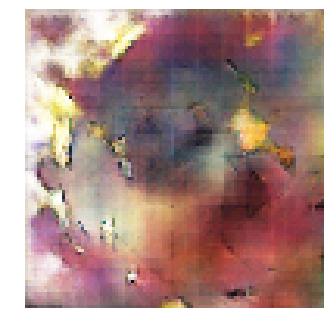


Epoch: 43480, D: -5.457, G: 2.913
Epoch: 43481, D: -4.216, G: 4.336
Epoch: 43482, D: -5.53, G: 2.669
Epoch: 43483, D: -4.883, G: 6.392
Epoch: 43484, D: -8.285, G: 3.642
Epoch: 43485, D: -6.206, G: 4.109
Epoch: 43486, D: -6.059, G: 3.295
Epoch: 43487, D: -5.667, G: 4.739
Epoch: 43488, D: -6.201, G: 4.225
Epoch: 43489, D: -5.372, G: 4.93
Epoch: 43490, D: -5.442, G: 3.929
Epoch: 43491, D: -7.243, G: 3.047
Epoch: 43492, D: -6.5, G: 5.401
Epoch: 43493, D: -5.685, G: 3.932
Epoch: 43494, D: -5.469, G: 4.479
Epoch: 43495, D: -6.485, G: 4.714
Epoch: 43496, D: -6.893, G: 3.677
Epoch: 43497, D: -6.671, G: 3.829
Epoch: 43498, D: -5.605, G: 3.974
Epoch: 43499, D: -6.74, G: 4.755


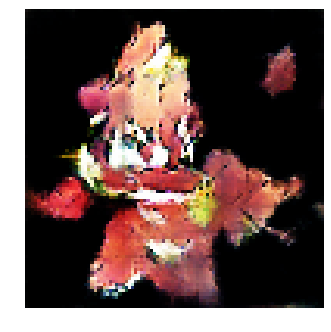


Epoch: 43500, D: -8.252, G: 2.844
Epoch: 43501, D: -6.444, G: 2.116
Epoch: 43502, D: -5.779, G: 3.482
Epoch: 43503, D: -5.15, G: 2.608
Epoch: 43504, D: -6.272, G: 2.516
Epoch: 43505, D: -4.154, G: 4.779
Epoch: 43506, D: -6.942, G: 6.189
Epoch: 43507, D: -7.991, G: 4.007
Epoch: 43508, D: -6.366, G: 3.966
Epoch: 43509, D: -7.621, G: 5.689
Epoch: 43510, D: -5.671, G: 5.093
Epoch: 43511, D: -8.604, G: 5.029
Epoch: 43512, D: -6.469, G: 2.855
Epoch: 43513, D: -7.843, G: 4.4
Epoch: 43514, D: -9.356, G: 3.517
Epoch: 43515, D: -6.133, G: 3.663
Epoch: 43516, D: -5.831, G: 3.852
Epoch: 43517, D: -6.068, G: 5.116
Epoch: 43518, D: -5.815, G: 3.167
Epoch: 43519, D: -7.039, G: 3.731


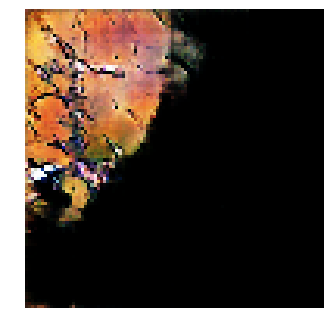


Epoch: 43520, D: -4.876, G: 3.909
Epoch: 43521, D: -5.66, G: 4.245
Epoch: 43522, D: -6.028, G: 6.154
Epoch: 43523, D: -6.698, G: 4.357
Epoch: 43524, D: -6.257, G: 3.412
Epoch: 43525, D: -6.424, G: 3.747
Epoch: 43526, D: -6.711, G: 2.714
Epoch: 43527, D: -4.916, G: 3.859
Epoch: 43528, D: -7.052, G: 2.729
Epoch: 43529, D: -5.756, G: 0.8556
Epoch: 43530, D: -4.447, G: 3.903
Epoch: 43531, D: -6.222, G: 4.138
Epoch: 43532, D: -6.417, G: 4.332
Epoch: 43533, D: -6.426, G: 4.511
Epoch: 43534, D: -5.975, G: 3.262
Epoch: 43535, D: -8.395, G: 4.288
Epoch: 43536, D: -5.392, G: 3.058
Epoch: 43537, D: -5.623, G: 3.937
Epoch: 43538, D: -7.854, G: 4.61
Epoch: 43539, D: -6.468, G: 4.009


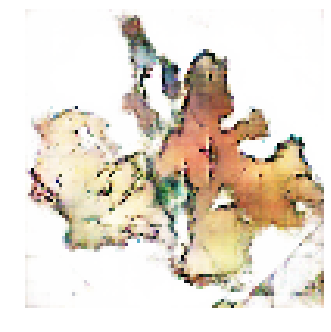


Epoch: 43540, D: -6.457, G: 3.363
Epoch: 43541, D: -5.38, G: 2.499
Epoch: 43542, D: -6.999, G: 4.901
Epoch: 43543, D: -6.517, G: 3.248
Epoch: 43544, D: -6.484, G: 4.403
Epoch: 43545, D: -5.734, G: 3.642
Epoch: 43546, D: -4.644, G: 4.575
Epoch: 43547, D: -5.402, G: 4.063
Epoch: 43548, D: -5.778, G: 3.833
Epoch: 43549, D: -5.607, G: 2.705
Epoch: 43550, D: -6.763, G: 3.193
Epoch: 43551, D: -6.707, G: 4.386
Epoch: 43552, D: -7.829, G: 4.401
Epoch: 43553, D: -7.319, G: 3.522
Epoch: 43554, D: -7.433, G: 3.054
Epoch: 43555, D: -5.692, G: 5.011
Epoch: 43556, D: -6.248, G: 1.835
Epoch: 43557, D: -6.572, G: 3.587
Epoch: 43558, D: -5.089, G: 4.398
Epoch: 43559, D: -6.905, G: 4.242


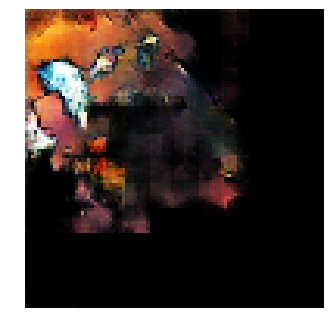


Epoch: 43560, D: -5.044, G: 2.438
Epoch: 43561, D: -5.356, G: 0.9642
Epoch: 43562, D: -5.339, G: 3.089
Epoch: 43563, D: -6.754, G: 2.499
Epoch: 43564, D: -6.247, G: 2.325
Epoch: 43565, D: -6.723, G: 3.351
Epoch: 43566, D: -6.787, G: 2.515
Epoch: 43567, D: -4.826, G: 1.528
Epoch: 43568, D: -6.386, G: 2.235
Epoch: 43569, D: -6.575, G: 3.003
Epoch: 43570, D: -6.293, G: 3.741
Epoch: 43571, D: -5.867, G: 3.049
Epoch: 43572, D: -3.992, G: 3.328
Epoch: 43573, D: -5.456, G: 4.465
Epoch: 43574, D: -7.322, G: 5.122
Epoch: 43575, D: -8.581, G: 3.949
Epoch: 43576, D: -6.001, G: 3.687
Epoch: 43577, D: -6.055, G: 5.053
Epoch: 43578, D: -6.174, G: 5.744
Epoch: 43579, D: -5.883, G: 4.444


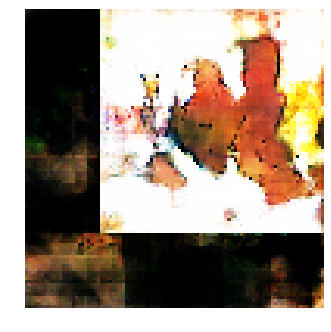


Epoch: 43580, D: -6.853, G: 3.224
Epoch: 43581, D: -5.635, G: 4.592
Epoch: 43582, D: -5.069, G: 2.063
Epoch: 43583, D: -6.863, G: 4.072
Epoch: 43584, D: -6.35, G: 4.636
Epoch: 43585, D: -6.901, G: 5.467
Epoch: 43586, D: -6.079, G: 3.287
Epoch: 43587, D: -5.484, G: 3.995
Epoch: 43588, D: -6.212, G: 5.33
Epoch: 43589, D: -6.101, G: 2.551
Epoch: 43590, D: -8.028, G: 4.795
Epoch: 43591, D: -8.22, G: 4.192
Epoch: 43592, D: -8.841, G: 2.714
Epoch: 43593, D: -5.303, G: 3.537
Epoch: 43594, D: -6.4, G: 3.693
Epoch: 43595, D: -6.073, G: 3.075
Epoch: 43596, D: -7.959, G: 2.692
Epoch: 43597, D: -4.798, G: 4.013
Epoch: 43598, D: -5.481, G: 3.825
Epoch: 43599, D: -6.341, G: 5.533


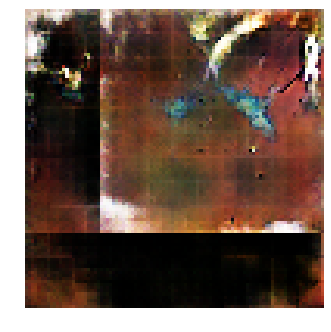


Epoch: 43600, D: -6.332, G: 2.614
Epoch: 43601, D: -5.768, G: 4.436
Epoch: 43602, D: -5.151, G: 2.627
Epoch: 43603, D: -6.851, G: 5.944
Epoch: 43604, D: -6.111, G: 3.233
Epoch: 43605, D: -6.748, G: 4.187
Epoch: 43606, D: -5.699, G: 4.653
Epoch: 43607, D: -6.212, G: 4.595
Epoch: 43608, D: -6.964, G: 4.209
Epoch: 43609, D: -7.011, G: 1.985
Epoch: 43610, D: -6.668, G: 4.592
Epoch: 43611, D: -6.146, G: 3.474
Epoch: 43612, D: -6.664, G: 4.66
Epoch: 43613, D: -7.6, G: 2.861
Epoch: 43614, D: -5.956, G: 4.264
Epoch: 43615, D: -5.469, G: 5.356
Epoch: 43616, D: -5.865, G: 5.326
Epoch: 43617, D: -5.23, G: 5.21
Epoch: 43618, D: -7.125, G: 4.864
Epoch: 43619, D: -5.313, G: 4.43


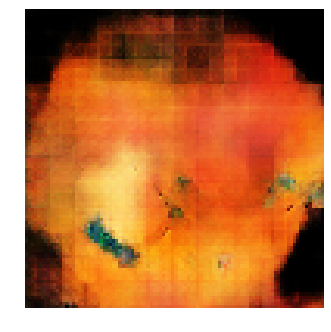


Epoch: 43620, D: -5.347, G: 3.904
Epoch: 43621, D: -6.332, G: 4.353
Epoch: 43622, D: -5.574, G: 3.763
Epoch: 43623, D: -7.158, G: 4.362
Epoch: 43624, D: -7.661, G: 2.214
Epoch: 43625, D: -6.348, G: 4.292
Epoch: 43626, D: -5.203, G: 4.42
Epoch: 43627, D: -6.17, G: 3.865
Epoch: 43628, D: -6.592, G: 3.801
Epoch: 43629, D: -6.881, G: 4.315
Epoch: 43630, D: -5.424, G: 3.992
Epoch: 43631, D: -4.611, G: 2.306
Epoch: 43632, D: -7.536, G: 4.706
Epoch: 43633, D: -5.283, G: 4.732
Epoch: 43634, D: -7.026, G: 3.465
Epoch: 43635, D: -6.917, G: 5.652
Epoch: 43636, D: -6.921, G: 3.775
Epoch: 43637, D: -6.923, G: 2.976
Epoch: 43638, D: -8.441, G: 3.295
Epoch: 43639, D: -7.153, G: 1.038


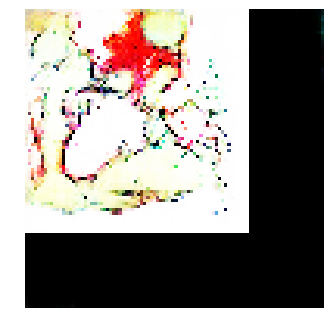


Epoch: 43640, D: -7.414, G: 3.246
Epoch: 43641, D: -6.19, G: 3.723
Epoch: 43642, D: -6.487, G: 4.518
Epoch: 43643, D: -7.031, G: 4.283
Epoch: 43644, D: -6.985, G: 3.745
Epoch: 43645, D: -6.838, G: 3.231
Epoch: 43646, D: -5.478, G: 4.189
Epoch: 43647, D: -5.127, G: 3.386
Epoch: 43648, D: -7.496, G: 2.745
Epoch: 43649, D: -6.298, G: 3.673
Epoch: 43650, D: -6.53, G: 2.256
Epoch: 43651, D: -6.92, G: 4.07
Epoch: 43652, D: -7.992, G: 3.17
Epoch: 43653, D: -7.413, G: 3.708
Epoch: 43654, D: -5.773, G: 2.722
Epoch: 43655, D: -4.676, G: 4.508
Epoch: 43656, D: -6.079, G: 6.184
Epoch: 43657, D: -6.46, G: 5.097
Epoch: 43658, D: -7.455, G: 3.147
Epoch: 43659, D: -6.471, G: 4.95


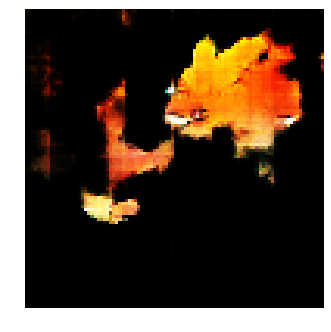


Epoch: 43660, D: -4.793, G: 5.228
Epoch: 43661, D: -5.787, G: 4.709
Epoch: 43662, D: -4.795, G: 4.195
Epoch: 43663, D: -6.864, G: 4.173
Epoch: 43664, D: -5.59, G: 4.843
Epoch: 43665, D: -6.901, G: 3.849
Epoch: 43666, D: -5.929, G: 3.273
Epoch: 43667, D: -7.458, G: 5.327
Epoch: 43668, D: -4.908, G: 3.278
Epoch: 43669, D: -5.475, G: 3.199
Epoch: 43670, D: -6.625, G: 4.428
Epoch: 43671, D: -4.839, G: 5.156
Epoch: 43672, D: -5.464, G: 3.469
Epoch: 43673, D: -7.101, G: 4.172
Epoch: 43674, D: -5.244, G: 4.358
Epoch: 43675, D: -4.355, G: 4.844
Epoch: 43676, D: -5.83, G: 4.693
Epoch: 43677, D: -8.131, G: 4.692
Epoch: 43678, D: -6.9, G: 3.303
Epoch: 43679, D: -7.17, G: 5.3


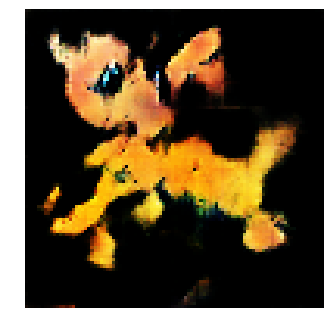


Epoch: 43680, D: -6.619, G: 3.1
Epoch: 43681, D: -5.013, G: 3.807
Epoch: 43682, D: -6.932, G: 2.885
Epoch: 43683, D: -4.591, G: 3.292
Epoch: 43684, D: -6.146, G: 3.861
Epoch: 43685, D: -5.52, G: 2.504
Epoch: 43686, D: -6.035, G: 4.671
Epoch: 43687, D: -6.67, G: 5.568
Epoch: 43688, D: -6.1, G: 3.918
Epoch: 43689, D: -6.38, G: 3.127
Epoch: 43690, D: -5.982, G: 3.314
Epoch: 43691, D: -7.705, G: 2.521
Epoch: 43692, D: -6.785, G: 3.132
Epoch: 43693, D: -5.308, G: 5.071
Epoch: 43694, D: -6.241, G: 4.833
Epoch: 43695, D: -6.61, G: 3.871
Epoch: 43696, D: -6.412, G: 5.067
Epoch: 43697, D: -5.812, G: 5.508
Epoch: 43698, D: -6.521, G: 3.979
Epoch: 43699, D: -6.592, G: 4.665


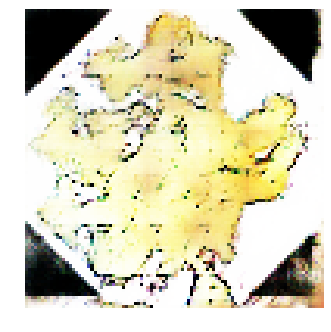


Epoch: 43700, D: -6.154, G: 3.084
Epoch: 43701, D: -6.675, G: 4.495
Epoch: 43702, D: -6.313, G: 3.993
Epoch: 43703, D: -5.006, G: 4.92
Epoch: 43704, D: -6.161, G: 5.308
Epoch: 43705, D: -5.465, G: 3.562
Epoch: 43706, D: -5.377, G: 1.87
Epoch: 43707, D: -6.108, G: 2.595
Epoch: 43708, D: -6.701, G: 4.939
Epoch: 43709, D: -7.842, G: 4.65
Epoch: 43710, D: -7.011, G: 2.743
Epoch: 43711, D: -6.647, G: 4.244
Epoch: 43712, D: -5.872, G: 4.623
Epoch: 43713, D: -6.614, G: 5.097
Epoch: 43714, D: -7.015, G: 2.476
Epoch: 43715, D: -5.459, G: 3.803
Epoch: 43716, D: -5.873, G: 5.594
Epoch: 43717, D: -5.052, G: 3.258
Epoch: 43718, D: -5.243, G: 3.586
Epoch: 43719, D: -6.881, G: 2.447


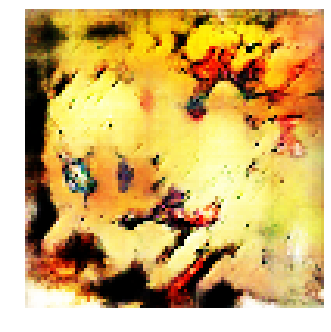


Epoch: 43720, D: -6.359, G: 3.856
Epoch: 43721, D: -6.192, G: 2.949
Epoch: 43722, D: -7.291, G: 3.395
Epoch: 43723, D: -5.817, G: 2.483
Epoch: 43724, D: -5.343, G: 2.606
Epoch: 43725, D: -6.499, G: 4.319
Epoch: 43726, D: -7.094, G: 5.571
Epoch: 43727, D: -6.294, G: 3.874
Epoch: 43728, D: -7.727, G: 3.586
Epoch: 43729, D: -6.052, G: 3.375
Epoch: 43730, D: -6.854, G: 4.545
Epoch: 43731, D: -6.867, G: 3.896
Epoch: 43732, D: -6.685, G: 2.653
Epoch: 43733, D: -6.666, G: 3.253
Epoch: 43734, D: -6.912, G: 3.426
Epoch: 43735, D: -5.848, G: 4.953
Epoch: 43736, D: -7.518, G: 4.348
Epoch: 43737, D: -5.336, G: 3.635
Epoch: 43738, D: -5.854, G: 4.97
Epoch: 43739, D: -6.418, G: 4.126


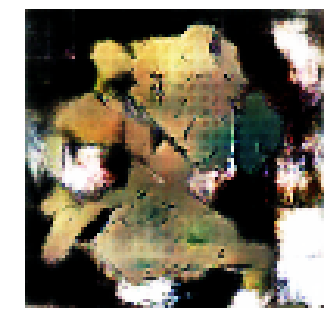


Epoch: 43740, D: -7.333, G: 3.78
Epoch: 43741, D: -6.589, G: 4.86
Epoch: 43742, D: -6.179, G: 3.814
Epoch: 43743, D: -5.847, G: 5.342
Epoch: 43744, D: -6.858, G: 4.449
Epoch: 43745, D: -7.519, G: 2.495
Epoch: 43746, D: -6.807, G: 0.697
Epoch: 43747, D: -5.357, G: 3.602
Epoch: 43748, D: -6.678, G: 3.933
Epoch: 43749, D: -5.821, G: 4.08
Epoch: 43750, D: -6.036, G: 4.531
Epoch: 43751, D: -5.753, G: 4.821
Epoch: 43752, D: -5.215, G: 4.232
Epoch: 43753, D: -7.515, G: 4.125
Epoch: 43754, D: -7.407, G: 2.091
Epoch: 43755, D: -4.896, G: 4.347
Epoch: 43756, D: -6.227, G: 3.865
Epoch: 43757, D: -4.217, G: 3.711
Epoch: 43758, D: -5.22, G: 4.326
Epoch: 43759, D: -6.237, G: 3.796


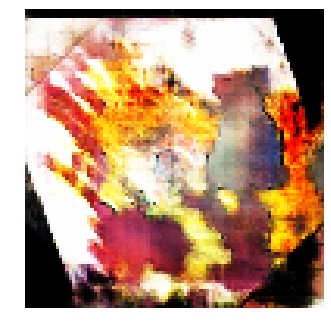


Epoch: 43760, D: -7.753, G: 3.988
Epoch: 43761, D: -5.874, G: 2.738
Epoch: 43762, D: -5.87, G: 4.638
Epoch: 43763, D: -4.811, G: 2.211
Epoch: 43764, D: -6.759, G: 2.96
Epoch: 43765, D: -6.149, G: 4.466
Epoch: 43766, D: -6.913, G: 5.153
Epoch: 43767, D: -7.082, G: 3.36
Epoch: 43768, D: -5.253, G: 3.517
Epoch: 43769, D: -5.802, G: 4.121
Epoch: 43770, D: -6.179, G: 4.158
Epoch: 43771, D: -5.687, G: 3.095
Epoch: 43772, D: -7.967, G: 5.086
Epoch: 43773, D: -6.639, G: 4.327
Epoch: 43774, D: -5.714, G: 5.348
Epoch: 43775, D: -5.633, G: 2.925
Epoch: 43776, D: -7.094, G: 3.723
Epoch: 43777, D: -4.548, G: 2.273
Epoch: 43778, D: -6.336, G: 3.963
Epoch: 43779, D: -7.851, G: 3.984


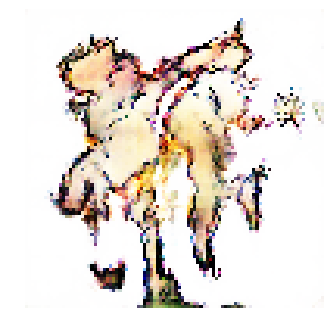


Epoch: 43780, D: -7.379, G: 3.593
Epoch: 43781, D: -5.019, G: 3.583
Epoch: 43782, D: -7.084, G: 2.663
Epoch: 43783, D: -5.915, G: 3.473
Epoch: 43784, D: -6.515, G: 3.767
Epoch: 43785, D: -5.725, G: 4.045
Epoch: 43786, D: -5.941, G: 5.322
Epoch: 43787, D: -6.795, G: 4.269
Epoch: 43788, D: -7.203, G: 2.131
Epoch: 43789, D: -7.819, G: 2.8
Epoch: 43790, D: -6.101, G: 3.346
Epoch: 43791, D: -5.483, G: 3.986
Epoch: 43792, D: -8.434, G: 5.591
Epoch: 43793, D: -6.966, G: 4.788
Epoch: 43794, D: -6.82, G: 3.515
Epoch: 43795, D: -6.056, G: 4.285
Epoch: 43796, D: -6.332, G: 6.776
Epoch: 43797, D: -6.484, G: 4.595
Epoch: 43798, D: -7.002, G: 3.61
Epoch: 43799, D: -6.193, G: 3.532


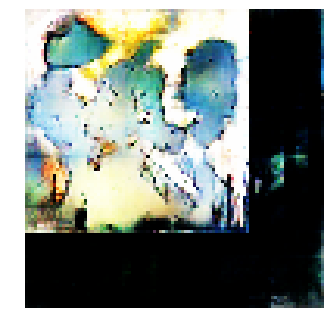


Epoch: 43800, D: -4.568, G: 3.815
Epoch: 43801, D: -6.002, G: 2.301
Epoch: 43802, D: -6.466, G: 3.662
Epoch: 43803, D: -6.263, G: 3.087
Epoch: 43804, D: -6.779, G: 3.395
Epoch: 43805, D: -5.353, G: 2.821
Epoch: 43806, D: -4.967, G: 3.74
Epoch: 43807, D: -5.446, G: 2.938
Epoch: 43808, D: -5.768, G: 4.59
Epoch: 43809, D: -6.792, G: 2.817
Epoch: 43810, D: -6.8, G: 2.63
Epoch: 43811, D: -5.875, G: 1.432
Epoch: 43812, D: -7.391, G: 2.844
Epoch: 43813, D: -5.957, G: 4.797
Epoch: 43814, D: -5.562, G: 3.924
Epoch: 43815, D: -5.451, G: 3.831
Epoch: 43816, D: -6.853, G: 3.949
Epoch: 43817, D: -6.155, G: 5.033
Epoch: 43818, D: -6.059, G: 4.841
Epoch: 43819, D: -5.249, G: 4.4


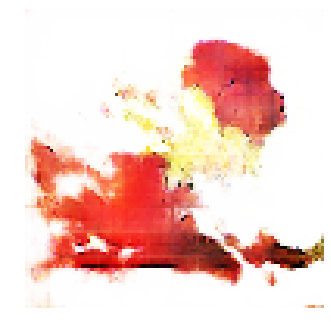


Epoch: 43820, D: -5.445, G: 3.79
Epoch: 43821, D: -6.733, G: 2.599
Epoch: 43822, D: -6.828, G: 3.235
Epoch: 43823, D: -5.72, G: 2.99
Epoch: 43824, D: -6.989, G: 4.901
Epoch: 43825, D: -6.185, G: 2.556
Epoch: 43826, D: -7.5, G: 4.017
Epoch: 43827, D: -6.909, G: 4.403
Epoch: 43828, D: -6.136, G: 6.022
Epoch: 43829, D: -5.599, G: 4.627
Epoch: 43830, D: -5.582, G: 3.289
Epoch: 43831, D: -6.077, G: 3.487
Epoch: 43832, D: -6.339, G: 3.405
Epoch: 43833, D: -6.38, G: 5.356
Epoch: 43834, D: -6.148, G: 4.663
Epoch: 43835, D: -6.53, G: 4.822
Epoch: 43836, D: -6.612, G: 3.423
Epoch: 43837, D: -5.018, G: 4.676
Epoch: 43838, D: -5.843, G: 3.983
Epoch: 43839, D: -4.972, G: 4.541


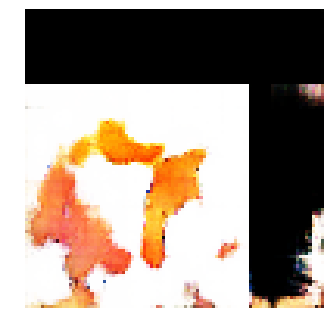


Epoch: 43840, D: -4.353, G: 5.396
Epoch: 43841, D: -5.483, G: 4.733
Epoch: 43842, D: -6.523, G: 3.825
Epoch: 43843, D: -5.993, G: 5.066
Epoch: 43844, D: -5.967, G: 5.496
Epoch: 43845, D: -5.656, G: 5.047
Epoch: 43846, D: -5.285, G: 4.499
Epoch: 43847, D: -6.283, G: 4.752
Epoch: 43848, D: -6.178, G: 4.111
Epoch: 43849, D: -6.603, G: 3.099
Epoch: 43850, D: -5.19, G: 5.251
Epoch: 43851, D: -7.114, G: 4.526
Epoch: 43852, D: -6.447, G: 5.233
Epoch: 43853, D: -7.025, G: 4.6
Epoch: 43854, D: -5.45, G: 4.674
Epoch: 43855, D: -7.024, G: 3.413
Epoch: 43856, D: -4.714, G: 3.553
Epoch: 43857, D: -6.255, G: 3.278
Epoch: 43858, D: -5.924, G: 1.447
Epoch: 43859, D: -7.662, G: 3.948


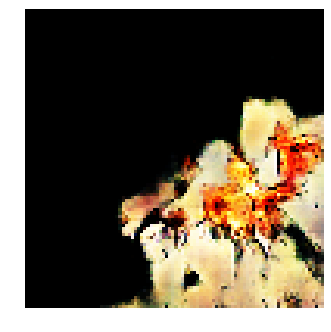


Epoch: 43860, D: -7.723, G: 3.915
Epoch: 43861, D: -6.653, G: 5.108
Epoch: 43862, D: -6.926, G: 4.506
Epoch: 43863, D: -6.087, G: 4.694
Epoch: 43864, D: -5.99, G: 5.206
Epoch: 43865, D: -6.404, G: 4.217
Epoch: 43866, D: -6.099, G: 4.896
Epoch: 43867, D: -7.931, G: 3.226
Epoch: 43868, D: -6.989, G: 4.588
Epoch: 43869, D: -7.787, G: 3.962
Epoch: 43870, D: -7.574, G: 4.118
Epoch: 43871, D: -7.785, G: 3.585
Epoch: 43872, D: -4.595, G: 5.032
Epoch: 43873, D: -7.094, G: 4.008
Epoch: 43874, D: -7.231, G: 4.943
Epoch: 43875, D: -5.996, G: 4.311
Epoch: 43876, D: -6.415, G: 4.818
Epoch: 43877, D: -7.101, G: 1.943
Epoch: 43878, D: -6.121, G: 4.828
Epoch: 43879, D: -6.742, G: 3.938


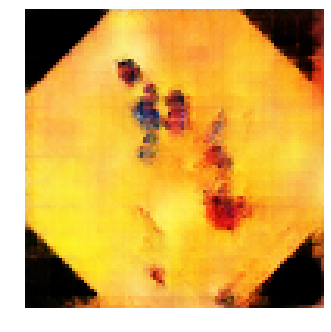


Epoch: 43880, D: -6.386, G: 4.84
Epoch: 43881, D: -4.55, G: 4.596
Epoch: 43882, D: -5.133, G: 3.16
Epoch: 43883, D: -6.536, G: 3.489
Epoch: 43884, D: -6.122, G: 3.27
Epoch: 43885, D: -4.953, G: 2.006
Epoch: 43886, D: -7.77, G: 4.927
Epoch: 43887, D: -6.08, G: 4.198
Epoch: 43888, D: -4.97, G: 4.066
Epoch: 43889, D: -7.114, G: 3.833
Epoch: 43890, D: -6.354, G: 4.535
Epoch: 43891, D: -6.106, G: 3.085
Epoch: 43892, D: -5.573, G: 3.701
Epoch: 43893, D: -5.414, G: 3.745
Epoch: 43894, D: -7.444, G: 4.829
Epoch: 43895, D: -5.355, G: 4.026
Epoch: 43896, D: -5.623, G: 3.27
Epoch: 43897, D: -6.143, G: 3.928
Epoch: 43898, D: -6.732, G: 3.662
Epoch: 43899, D: -4.681, G: 2.253


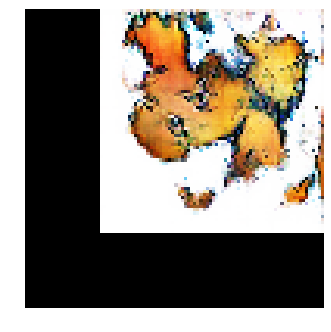


Epoch: 43900, D: -6.4, G: 2.946
Epoch: 43901, D: -7.389, G: 5.174
Epoch: 43902, D: -6.759, G: 2.199
Epoch: 43903, D: -6.523, G: 2.799
Epoch: 43904, D: -6.804, G: 3.949
Epoch: 43905, D: -5.829, G: 4.853
Epoch: 43906, D: -6.548, G: 4.107
Epoch: 43907, D: -6.323, G: 4.827
Epoch: 43908, D: -5.707, G: 5.541
Epoch: 43909, D: -5.535, G: 6.057
Epoch: 43910, D: -5.736, G: 5.316
Epoch: 43911, D: -5.84, G: 4.873
Epoch: 43912, D: -6.784, G: 3.329
Epoch: 43913, D: -5.718, G: 5.207
Epoch: 43914, D: -5.282, G: 3.814
Epoch: 43915, D: -5.028, G: 4.729
Epoch: 43916, D: -6.466, G: 3.092
Epoch: 43917, D: -6.059, G: 3.669
Epoch: 43918, D: -7.075, G: 3.327
Epoch: 43919, D: -5.037, G: 3.108


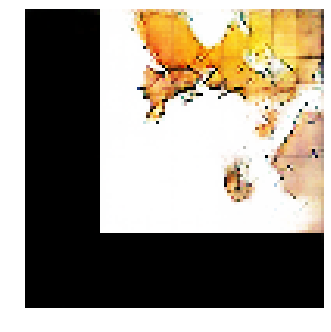


Epoch: 43920, D: -5.575, G: 4.833
Epoch: 43921, D: -6.65, G: 4.837
Epoch: 43922, D: -6.398, G: 4.85
Epoch: 43923, D: -7.107, G: 3.826
Epoch: 43924, D: -6.026, G: 4.582
Epoch: 43925, D: -5.232, G: 4.285
Epoch: 43926, D: -5.702, G: 3.901
Epoch: 43927, D: -6.181, G: 2.418
Epoch: 43928, D: -4.888, G: 2.903
Epoch: 43929, D: -6.495, G: 4.384
Epoch: 43930, D: -6.882, G: 3.875
Epoch: 43931, D: -7.348, G: 3.836
Epoch: 43932, D: -6.397, G: 3.596
Epoch: 43933, D: -5.573, G: 2.858
Epoch: 43934, D: -6.21, G: 3.822
Epoch: 43935, D: -5.71, G: 4.168
Epoch: 43936, D: -7.083, G: 3.88
Epoch: 43937, D: -5.513, G: 3.499
Epoch: 43938, D: -5.699, G: 4.263
Epoch: 43939, D: -6.452, G: 4.107


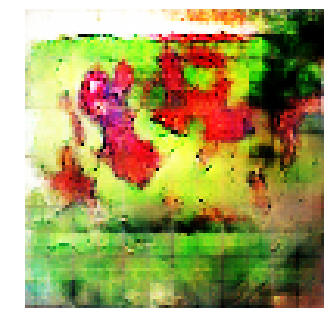


Epoch: 43940, D: -5.885, G: 3.923
Epoch: 43941, D: -5.658, G: 4.154
Epoch: 43942, D: -4.241, G: 4.237
Epoch: 43943, D: -6.044, G: 4.074
Epoch: 43944, D: -6.985, G: 3.767
Epoch: 43945, D: -4.064, G: 3.763
Epoch: 43946, D: -6.166, G: 4.722
Epoch: 43947, D: -7.157, G: 3.867
Epoch: 43948, D: -5.568, G: 4.385
Epoch: 43949, D: -5.636, G: 5.541
Epoch: 43950, D: -6.459, G: 4.056
Epoch: 43951, D: -5.977, G: 5.284
Epoch: 43952, D: -5.661, G: 5.08
Epoch: 43953, D: -6.503, G: 3.694
Epoch: 43954, D: -5.994, G: 4.347
Epoch: 43955, D: -7.317, G: 5.138
Epoch: 43956, D: -6.203, G: 5.081
Epoch: 43957, D: -6.739, G: 4.591
Epoch: 43958, D: -6.495, G: 5.039
Epoch: 43959, D: -5.573, G: 4.726


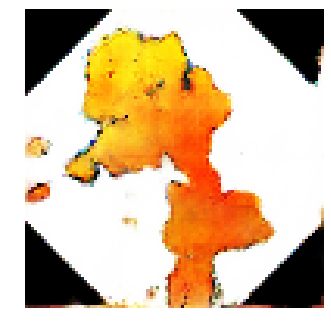


Epoch: 43960, D: -7.592, G: 3.34
Epoch: 43961, D: -6.309, G: 2.149
Epoch: 43962, D: -4.313, G: 2.976
Epoch: 43963, D: -6.648, G: 4.049
Epoch: 43964, D: -6.007, G: 5.333
Epoch: 43965, D: -6.485, G: 2.177
Epoch: 43966, D: -7.435, G: 3.405
Epoch: 43967, D: -5.05, G: 3.26
Epoch: 43968, D: -6.413, G: 4.095
Epoch: 43969, D: -6.221, G: 3.957
Epoch: 43970, D: -6.37, G: 3.727
Epoch: 43971, D: -5.701, G: 3.601
Epoch: 43972, D: -4.498, G: 2.723
Epoch: 43973, D: -5.606, G: 4.561
Epoch: 43974, D: -5.917, G: 4.4
Epoch: 43975, D: -5.043, G: 4.044
Epoch: 43976, D: -6.942, G: 4.067
Epoch: 43977, D: -6.904, G: 4.303
Epoch: 43978, D: -5.478, G: 2.992
Epoch: 43979, D: -6.719, G: 4.213


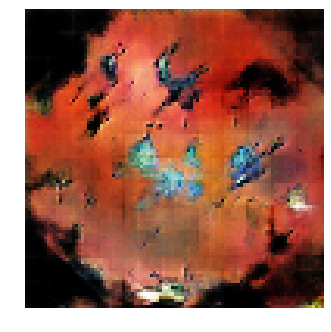


Epoch: 43980, D: -6.95, G: 3.504
Epoch: 43981, D: -4.083, G: 5.281
Epoch: 43982, D: -6.921, G: 3.61
Epoch: 43983, D: -6.558, G: 3.259
Epoch: 43984, D: -6.945, G: 2.312
Epoch: 43985, D: -4.724, G: 3.53
Epoch: 43986, D: -5.433, G: 3.043
Epoch: 43987, D: -6.602, G: 3.591
Epoch: 43988, D: -5.311, G: 4.809
Epoch: 43989, D: -7.247, G: 3.463
Epoch: 43990, D: -7.584, G: 4.62
Epoch: 43991, D: -6.103, G: 3.352
Epoch: 43992, D: -6.379, G: 3.802
Epoch: 43993, D: -6.681, G: 2.775
Epoch: 43994, D: -6.692, G: 3.986
Epoch: 43995, D: -7.706, G: 3.615
Epoch: 43996, D: -5.048, G: 4.118
Epoch: 43997, D: -6.84, G: 8.345
Epoch: 43998, D: -6.22, G: 4.437
Epoch: 43999, D: -5.91, G: 3.993


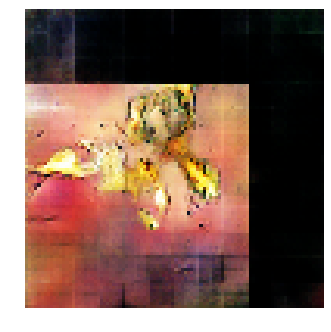


Epoch: 44000, D: -5.866, G: 3.909
Epoch: 44001, D: -5.651, G: 4.471
Epoch: 44002, D: -6.4, G: 2.724
Epoch: 44003, D: -7.206, G: 1.824
Epoch: 44004, D: -5.81, G: 2.956
Epoch: 44005, D: -6.786, G: 3.283
Epoch: 44006, D: -5.261, G: 3.805
Epoch: 44007, D: -5.683, G: 5.448
Epoch: 44008, D: -6.411, G: 4.331
Epoch: 44009, D: -5.542, G: 3.316
Epoch: 44010, D: -5.908, G: 3.302
Epoch: 44011, D: -6.691, G: 3.04
Epoch: 44012, D: -6.969, G: 5.867
Epoch: 44013, D: -7.509, G: 4.595
Epoch: 44014, D: -6.54, G: 2.943
Epoch: 44015, D: -6.245, G: 3.016
Epoch: 44016, D: -6.074, G: 3.429
Epoch: 44017, D: -6.522, G: 4.741
Epoch: 44018, D: -5.668, G: 4.276
Epoch: 44019, D: -5.441, G: 3.515


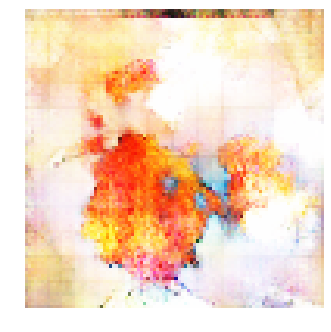


Epoch: 44020, D: -7.447, G: 4.181
Epoch: 44021, D: -6.509, G: 2.876
Epoch: 44022, D: -6.6, G: 3.069
Epoch: 44023, D: -4.655, G: 2.812
Epoch: 44024, D: -6.369, G: 2.894
Epoch: 44025, D: -6.446, G: 1.965
Epoch: 44026, D: -5.99, G: 2.933
Epoch: 44027, D: -8.035, G: 3.676
Epoch: 44028, D: -6.393, G: 5.867
Epoch: 44029, D: -6.732, G: 4.448
Epoch: 44030, D: -7.702, G: 3.465
Epoch: 44031, D: -6.574, G: 4.252
Epoch: 44032, D: -5.54, G: 3.897
Epoch: 44033, D: -4.775, G: 3.533
Epoch: 44034, D: -6.193, G: 4.023
Epoch: 44035, D: -6.285, G: 3.939
Epoch: 44036, D: -7.206, G: 4.411
Epoch: 44037, D: -7.207, G: 3.537
Epoch: 44038, D: -7.029, G: 3.796
Epoch: 44039, D: -6.233, G: 4.146


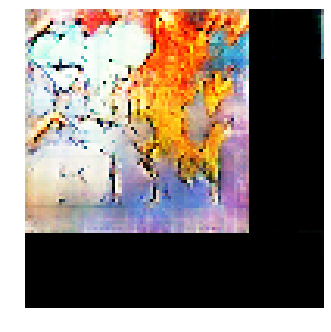


Epoch: 44040, D: -6.807, G: 2.379
Epoch: 44041, D: -7.497, G: 3.069
Epoch: 44042, D: -5.048, G: 4.234
Epoch: 44043, D: -7.533, G: 5.659
Epoch: 44044, D: -8.185, G: 5.44
Epoch: 44045, D: -7.026, G: 2.708
Epoch: 44046, D: -5.336, G: 2.951
Epoch: 44047, D: -6.645, G: 7.243
Epoch: 44048, D: -6.658, G: 2.613
Epoch: 44049, D: -5.2, G: 3.556
Epoch: 44050, D: -8.167, G: 3.403
Epoch: 44051, D: -6.032, G: 4.415
Epoch: 44052, D: -6.752, G: 3.602
Epoch: 44053, D: -6.184, G: 3.062
Epoch: 44054, D: -5.712, G: 4.618
Epoch: 44055, D: -5.213, G: 4.503
Epoch: 44056, D: -6.953, G: 2.8
Epoch: 44057, D: -4.608, G: 2.003
Epoch: 44058, D: -6.037, G: 1.784
Epoch: 44059, D: -5.719, G: 3.837


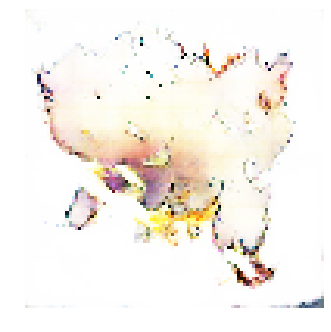


Epoch: 44060, D: -6.097, G: 3.769
Epoch: 44061, D: -5.537, G: 3.868
Epoch: 44062, D: -6.482, G: 1.972
Epoch: 44063, D: -6.582, G: 2.377
Epoch: 44064, D: -8.185, G: 3.916
Epoch: 44065, D: -6.37, G: 5.285
Epoch: 44066, D: -7.772, G: 4.153
Epoch: 44067, D: -7.029, G: 3.768
Epoch: 44068, D: -6.104, G: 4.66
Epoch: 44069, D: -6.112, G: 4.848
Epoch: 44070, D: -7.392, G: 3.992
Epoch: 44071, D: -6.276, G: 3.611
Epoch: 44072, D: -5.292, G: 4.26
Epoch: 44073, D: -4.82, G: 0.8385
Epoch: 44074, D: -5.88, G: 3.585
Epoch: 44075, D: -7.345, G: 3.864
Epoch: 44076, D: -6.25, G: 3.644
Epoch: 44077, D: -7.278, G: 4.998
Epoch: 44078, D: -5.739, G: 2.852
Epoch: 44079, D: -6.662, G: 3.273


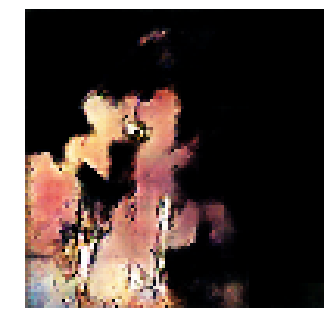


Epoch: 44080, D: -5.275, G: 4.17
Epoch: 44081, D: -4.532, G: 6.081
Epoch: 44082, D: -5.69, G: 3.061
Epoch: 44083, D: -4.423, G: 3.074
Epoch: 44084, D: -6.65, G: 3.795
Epoch: 44085, D: -5.172, G: 3.332
Epoch: 44086, D: -6.511, G: 4.732
Epoch: 44087, D: -6.22, G: 3.918
Epoch: 44088, D: -5.344, G: 3.145
Epoch: 44089, D: -6.171, G: 3.108
Epoch: 44090, D: -8.007, G: 2.306
Epoch: 44091, D: -5.069, G: 2.827
Epoch: 44092, D: -5.77, G: 4.43
Epoch: 44093, D: -6.87, G: 3.098
Epoch: 44094, D: -6.768, G: 3.442
Epoch: 44095, D: -6.368, G: 3.529
Epoch: 44096, D: -6.504, G: 2.728
Epoch: 44097, D: -5.454, G: 1.45
Epoch: 44098, D: -6.94, G: 2.865
Epoch: 44099, D: -6.24, G: 2.51


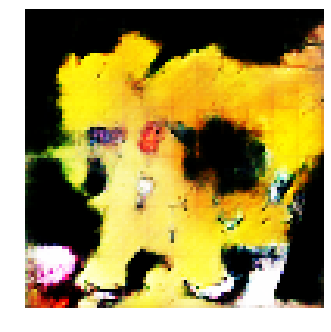


Epoch: 44100, D: -4.27, G: 0.784
Epoch: 44101, D: -5.713, G: 4.489
Epoch: 44102, D: -4.771, G: 2.64
Epoch: 44103, D: -5.909, G: 4.408
Epoch: 44104, D: -7.56, G: 3.766
Epoch: 44105, D: -6.187, G: 3.869
Epoch: 44106, D: -5.799, G: 5.002
Epoch: 44107, D: -7.958, G: 5.706
Epoch: 44108, D: -5.766, G: 5.386
Epoch: 44109, D: -6.086, G: 4.165
Epoch: 44110, D: -6.015, G: 4.627
Epoch: 44111, D: -6.001, G: 3.783
Epoch: 44112, D: -5.769, G: 5.379
Epoch: 44113, D: -6.222, G: 4.632
Epoch: 44114, D: -5.757, G: 3.438
Epoch: 44115, D: -6.096, G: 3.875
Epoch: 44116, D: -6.246, G: 6.718
Epoch: 44117, D: -6.574, G: 3.369
Epoch: 44118, D: -5.889, G: 4.306
Epoch: 44119, D: -5.998, G: 3.667


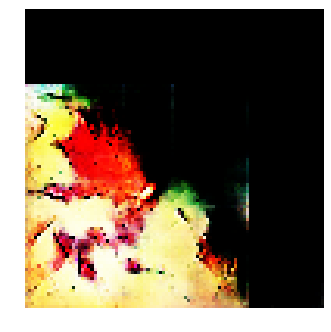


Epoch: 44120, D: -5.772, G: 4.803
Epoch: 44121, D: -6.294, G: 3.177
Epoch: 44122, D: -5.701, G: 3.364
Epoch: 44123, D: -7.37, G: 3.605
Epoch: 44124, D: -4.947, G: 5.239
Epoch: 44125, D: -6.761, G: 3.597
Epoch: 44126, D: -5.38, G: 4.295
Epoch: 44127, D: -5.348, G: 4.32
Epoch: 44128, D: -6.384, G: 4.479
Epoch: 44129, D: -4.857, G: 3.402
Epoch: 44130, D: -7.11, G: 4.212
Epoch: 44131, D: -6.378, G: 1.87
Epoch: 44132, D: -6.534, G: 3.095
Epoch: 44133, D: -6.199, G: 6.083
Epoch: 44134, D: -6.226, G: 4.142
Epoch: 44135, D: -5.45, G: 5.197
Epoch: 44136, D: -7.267, G: 3.618
Epoch: 44137, D: -5.386, G: 2.536
Epoch: 44138, D: -6.728, G: 3.485
Epoch: 44139, D: -5.708, G: 4.425


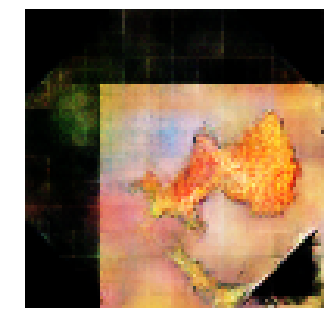


Epoch: 44140, D: -7.383, G: 2.611
Epoch: 44141, D: -6.558, G: 2.759
Epoch: 44142, D: -5.754, G: 3.616
Epoch: 44143, D: -4.93, G: 4.262
Epoch: 44144, D: -5.212, G: 5.476
Epoch: 44145, D: -6.072, G: 2.716
Epoch: 44146, D: -6.607, G: 4.177
Epoch: 44147, D: -6.97, G: 3.399
Epoch: 44148, D: -5.63, G: 3.099
Epoch: 44149, D: -6.277, G: 3.114
Epoch: 44150, D: -5.471, G: 5.116
Epoch: 44151, D: -6.193, G: 5.609
Epoch: 44152, D: -6.189, G: 5.783
Epoch: 44153, D: -6.797, G: 5.146
Epoch: 44154, D: -6.127, G: 4.713
Epoch: 44155, D: -6.764, G: 4.45
Epoch: 44156, D: -7.815, G: 1.591
Epoch: 44157, D: -5.702, G: 3.345
Epoch: 44158, D: -6.377, G: 3.267
Epoch: 44159, D: -5.521, G: 4.597


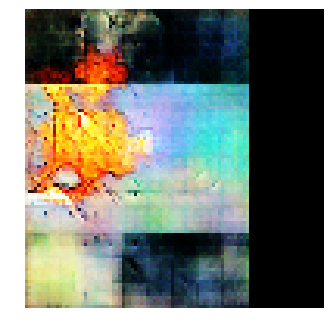


Epoch: 44160, D: -5.533, G: 3.522
Epoch: 44161, D: -6.066, G: 4.315
Epoch: 44162, D: -5.282, G: 4.55
Epoch: 44163, D: -6.369, G: 5.995
Epoch: 44164, D: -6.832, G: 3.672
Epoch: 44165, D: -7.28, G: 2.725
Epoch: 44166, D: -6.246, G: 3.039
Epoch: 44167, D: -5.863, G: 3.403
Epoch: 44168, D: -10.17, G: 4.465
Epoch: 44169, D: -6.051, G: 3.597
Epoch: 44170, D: -5.414, G: 4.035
Epoch: 44171, D: -5.781, G: 4.842
Epoch: 44172, D: -5.897, G: 4.371
Epoch: 44173, D: -5.35, G: 4.561
Epoch: 44174, D: -6.503, G: 3.784
Epoch: 44175, D: -6.127, G: 3.167
Epoch: 44176, D: -6.502, G: 2.412
Epoch: 44177, D: -5.761, G: 3.553
Epoch: 44178, D: -6.246, G: 3.91
Epoch: 44179, D: -6.022, G: 2.905


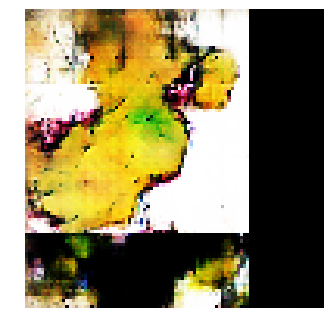


Epoch: 44180, D: -6.136, G: 3.404
Epoch: 44181, D: -5.843, G: 4.477
Epoch: 44182, D: -6.357, G: 4.949
Epoch: 44183, D: -6.549, G: 1.348
Epoch: 44184, D: -5.422, G: 3.385
Epoch: 44185, D: -6.709, G: 5.098
Epoch: 44186, D: -4.781, G: 4.088
Epoch: 44187, D: -5.591, G: 3.79
Epoch: 44188, D: -6.669, G: 3.285
Epoch: 44189, D: -6.226, G: 5.424
Epoch: 44190, D: -6.401, G: 4.19
Epoch: 44191, D: -6.689, G: 3.479
Epoch: 44192, D: -6.315, G: 3.4
Epoch: 44193, D: -5.806, G: 5.166
Epoch: 44194, D: -7.258, G: 3.148
Epoch: 44195, D: -6.649, G: 2.634
Epoch: 44196, D: -5.678, G: 5.944
Epoch: 44197, D: -7.301, G: 4.833
Epoch: 44198, D: -6.135, G: 4.477
Epoch: 44199, D: -6.437, G: 3.271


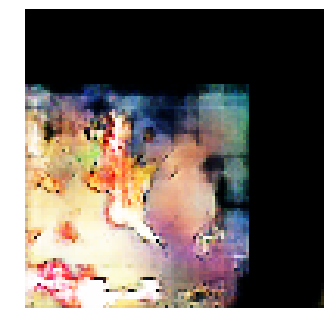


Epoch: 44200, D: -6.477, G: 2.862
Epoch: 44201, D: -5.063, G: 3.863
Epoch: 44202, D: -6.792, G: 5.821
Epoch: 44203, D: -6.215, G: 4.11
Epoch: 44204, D: -6.885, G: 3.348
Epoch: 44205, D: -7.386, G: 5.615
Epoch: 44206, D: -5.07, G: 5.027
Epoch: 44207, D: -5.943, G: 3.802
Epoch: 44208, D: -5.482, G: 3.748
Epoch: 44209, D: -6.371, G: 4.667
Epoch: 44210, D: -6.954, G: 4.012
Epoch: 44211, D: -6.593, G: 3.579
Epoch: 44212, D: -4.68, G: 3.023
Epoch: 44213, D: -6.697, G: 4.39
Epoch: 44214, D: -5.936, G: 2.924
Epoch: 44215, D: -6.515, G: 3.763
Epoch: 44216, D: -5.785, G: 4.589
Epoch: 44217, D: -5.923, G: 4.358
Epoch: 44218, D: -6.485, G: 3.703
Epoch: 44219, D: -5.928, G: 2.154


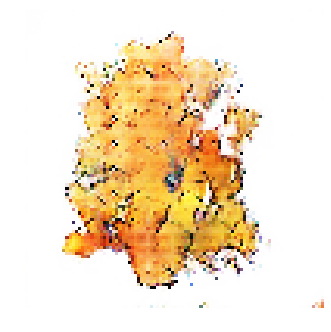


Epoch: 44220, D: -4.715, G: 3.216
Epoch: 44221, D: -6.567, G: 3.151
Epoch: 44222, D: -6.814, G: 3.492
Epoch: 44223, D: -6.71, G: 4.713
Epoch: 44224, D: -6.201, G: 4.634
Epoch: 44225, D: -6.724, G: 3.576
Epoch: 44226, D: -5.437, G: 3.671
Epoch: 44227, D: -6.102, G: 2.518
Epoch: 44228, D: -4.68, G: 3.356
Epoch: 44229, D: -6.485, G: 3.733
Epoch: 44230, D: -7.246, G: 4.329
Epoch: 44231, D: -4.958, G: 4.712
Epoch: 44232, D: -6.427, G: 1.906
Epoch: 44233, D: -7.473, G: 3.29
Epoch: 44234, D: -6.039, G: 2.667
Epoch: 44235, D: -6.379, G: 4.141
Epoch: 44236, D: -6.421, G: 2.348
Epoch: 44237, D: -8.043, G: 4.716
Epoch: 44238, D: -5.34, G: 3.016
Epoch: 44239, D: -5.221, G: 2.298


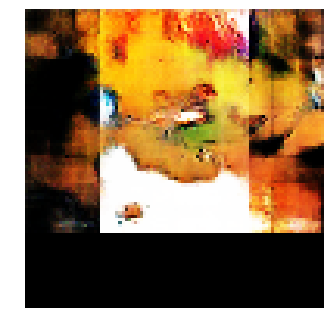


Epoch: 44240, D: -7.285, G: 3.725
Epoch: 44241, D: -7.761, G: 2.265
Epoch: 44242, D: -7.421, G: 3.297
Epoch: 44243, D: -7.575, G: 4.032
Epoch: 44244, D: -6.123, G: 6.419
Epoch: 44245, D: -6.513, G: 7.8
Epoch: 44246, D: -5.562, G: 4.63
Epoch: 44247, D: -6.125, G: 5.349
Epoch: 44248, D: -5.031, G: 3.149
Epoch: 44249, D: -8.279, G: 3.866
Epoch: 44250, D: -6.823, G: 3.516
Epoch: 44251, D: -5.897, G: 4.319
Epoch: 44252, D: -8.993, G: 4.005
Epoch: 44253, D: -6.531, G: 2.764
Epoch: 44254, D: -6.268, G: 4.513
Epoch: 44255, D: -6.551, G: 3.343
Epoch: 44256, D: -5.232, G: 3.356
Epoch: 44257, D: -5.861, G: 4.701
Epoch: 44258, D: -8.779, G: 3.207
Epoch: 44259, D: -5.52, G: 3.572


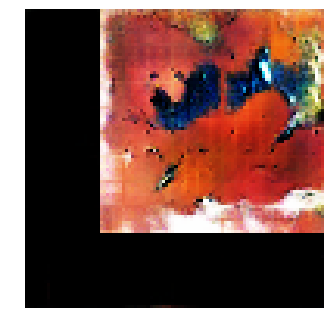


Epoch: 44260, D: -6.297, G: 2.685
Epoch: 44261, D: -5.603, G: 2.567
Epoch: 44262, D: -5.908, G: 2.509
Epoch: 44263, D: -5.564, G: 2.679
Epoch: 44264, D: -6.112, G: 3.44
Epoch: 44265, D: -5.408, G: 3.853
Epoch: 44266, D: -6.851, G: 3.074
Epoch: 44267, D: -6.728, G: 3.809
Epoch: 44268, D: -8.018, G: 3.175
Epoch: 44269, D: -5.97, G: 3.144
Epoch: 44270, D: -5.949, G: 3.835
Epoch: 44271, D: -8.326, G: 3.245
Epoch: 44272, D: -5.727, G: 3.898
Epoch: 44273, D: -6.577, G: 4.088
Epoch: 44274, D: -6.508, G: 2.997
Epoch: 44275, D: -6.057, G: 5.177
Epoch: 44276, D: -5.285, G: 3.763
Epoch: 44277, D: -6.161, G: 2.919
Epoch: 44278, D: -6.116, G: 4.439
Epoch: 44279, D: -6.954, G: 3.66


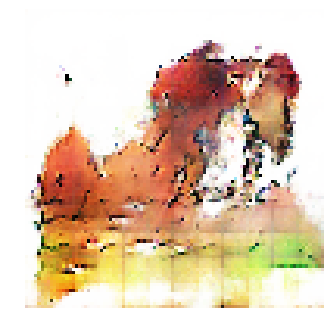


Epoch: 44280, D: -6.873, G: 4.358
Epoch: 44281, D: -6.988, G: 3.329
Epoch: 44282, D: -6.54, G: 5.101
Epoch: 44283, D: -5.141, G: 3.731
Epoch: 44284, D: -5.468, G: 3.309
Epoch: 44285, D: -6.46, G: 3.58
Epoch: 44286, D: -6.085, G: 3.672
Epoch: 44287, D: -5.18, G: 3.462
Epoch: 44288, D: -6.335, G: 5.058
Epoch: 44289, D: -6.987, G: 3.407
Epoch: 44290, D: -6.735, G: 4.759
Epoch: 44291, D: -5.328, G: 3.094
Epoch: 44292, D: -7.453, G: 4.751
Epoch: 44293, D: -6.368, G: 4.863
Epoch: 44294, D: -4.447, G: 3.385
Epoch: 44295, D: -5.11, G: 3.882
Epoch: 44296, D: -5.924, G: 3.865
Epoch: 44297, D: -6.833, G: 4.25
Epoch: 44298, D: -5.096, G: 4.012
Epoch: 44299, D: -7.392, G: 5.808


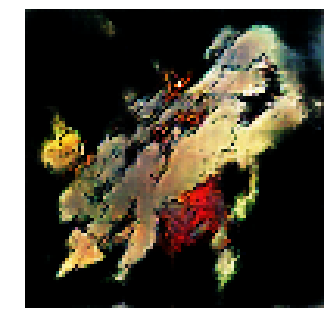


Epoch: 44300, D: -5.137, G: 4.572
Epoch: 44301, D: -6.927, G: 4.63
Epoch: 44302, D: -7.197, G: 4.096
Epoch: 44303, D: -6.938, G: 3.984
Epoch: 44304, D: -5.384, G: 5.433
Epoch: 44305, D: -5.342, G: 5.729
Epoch: 44306, D: -7.204, G: 4.326
Epoch: 44307, D: -6.876, G: 3.818
Epoch: 44308, D: -7.217, G: 4.715
Epoch: 44309, D: -5.898, G: 3.105
Epoch: 44310, D: -5.954, G: 5.297
Epoch: 44311, D: -7.251, G: 4.117
Epoch: 44312, D: -4.388, G: 4.246
Epoch: 44313, D: -6.715, G: 5.369
Epoch: 44314, D: -6.496, G: 3.43
Epoch: 44315, D: -8.577, G: 3.762
Epoch: 44316, D: -5.798, G: 3.391
Epoch: 44317, D: -6.983, G: 3.181
Epoch: 44318, D: -5.865, G: 4.672
Epoch: 44319, D: -6.291, G: 2.735


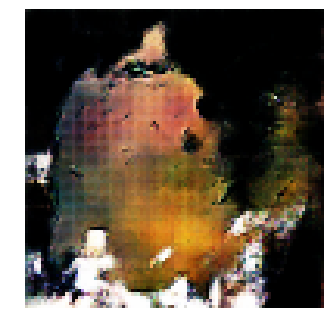


Epoch: 44320, D: -6.537, G: 3.882
Epoch: 44321, D: -6.485, G: 3.678
Epoch: 44322, D: -6.805, G: 4.907
Epoch: 44323, D: -5.453, G: 2.713
Epoch: 44324, D: -5.238, G: 3.825
Epoch: 44325, D: -6.297, G: 3.538
Epoch: 44326, D: -6.754, G: 3.091
Epoch: 44327, D: -5.925, G: 2.073
Epoch: 44328, D: -6.491, G: 3.188
Epoch: 44329, D: -6.75, G: 4.837
Epoch: 44330, D: -6.097, G: 3.478
Epoch: 44331, D: -6.814, G: 5.43
Epoch: 44332, D: -6.658, G: 4.031
Epoch: 44333, D: -6.89, G: 3.6
Epoch: 44334, D: -5.946, G: 3.888
Epoch: 44335, D: -5.876, G: 3.477
Epoch: 44336, D: -5.573, G: 2.923
Epoch: 44337, D: -5.171, G: 2.176
Epoch: 44338, D: -7.37, G: 3.252
Epoch: 44339, D: -6.337, G: 2.393


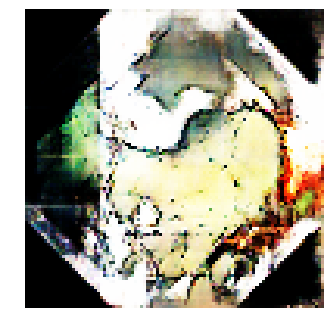


Epoch: 44340, D: -6.6, G: 4.779
Epoch: 44341, D: -6.091, G: 4.071
Epoch: 44342, D: -5.993, G: 4.374
Epoch: 44343, D: -6.672, G: 1.59
Epoch: 44344, D: -5.977, G: 3.105
Epoch: 44345, D: -6.413, G: 2.092
Epoch: 44346, D: -4.573, G: 2.585
Epoch: 44347, D: -5.755, G: 4.673
Epoch: 44348, D: -5.036, G: 3.039
Epoch: 44349, D: -6.155, G: 4.607
Epoch: 44350, D: -5.11, G: 3.006
Epoch: 44351, D: -4.745, G: 3.857
Epoch: 44352, D: -6.252, G: 2.359
Epoch: 44353, D: -6.287, G: 4.225
Epoch: 44354, D: -7.316, G: 5.877
Epoch: 44355, D: -6.354, G: 3.867
Epoch: 44356, D: -6.768, G: 3.493
Epoch: 44357, D: -6.131, G: 4.497
Epoch: 44358, D: -4.834, G: 2.941
Epoch: 44359, D: -5.56, G: 4.87


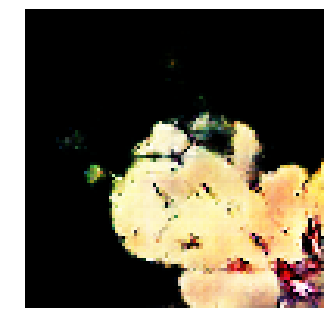


Epoch: 44360, D: -5.76, G: 3.089
Epoch: 44361, D: -5.045, G: 2.877
Epoch: 44362, D: -5.883, G: 2.403
Epoch: 44363, D: -5.465, G: 4.085
Epoch: 44364, D: -6.052, G: 2.849
Epoch: 44365, D: -6.382, G: 3.27
Epoch: 44366, D: -5.066, G: 3.734
Epoch: 44367, D: -6.764, G: 3.252
Epoch: 44368, D: -6.625, G: 2.926
Epoch: 44369, D: -6.899, G: 3.466
Epoch: 44370, D: -6.555, G: 3.034
Epoch: 44371, D: -6.331, G: 4.094
Epoch: 44372, D: -6.155, G: 4.121
Epoch: 44373, D: -4.35, G: 3.335
Epoch: 44374, D: -7.04, G: 3.769
Epoch: 44375, D: -7.088, G: 3.196
Epoch: 44376, D: -7.178, G: 3.849
Epoch: 44377, D: -6.802, G: 3.04
Epoch: 44378, D: -5.088, G: 2.273
Epoch: 44379, D: -7.725, G: 3.692


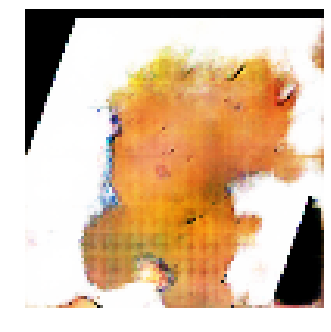


Epoch: 44380, D: -5.524, G: 5.285
Epoch: 44381, D: -5.506, G: 3.921
Epoch: 44382, D: -5.262, G: 3.983
Epoch: 44383, D: -7.463, G: 4.236
Epoch: 44384, D: -7.101, G: 3.188
Epoch: 44385, D: -3.925, G: 4.013
Epoch: 44386, D: -5.636, G: 4.796
Epoch: 44387, D: -7.415, G: 2.958
Epoch: 44388, D: -7.125, G: 3.441
Epoch: 44389, D: -7.336, G: 3.494
Epoch: 44390, D: -4.587, G: 4.32
Epoch: 44391, D: -3.961, G: 5.553
Epoch: 44392, D: -6.794, G: 4.954
Epoch: 44393, D: -4.673, G: 4.785
Epoch: 44394, D: -7.437, G: 3.096
Epoch: 44395, D: -5.659, G: 2.877
Epoch: 44396, D: -7.023, G: 4.738
Epoch: 44397, D: -6.004, G: 3.595
Epoch: 44398, D: -6.207, G: 4.248
Epoch: 44399, D: -5.951, G: 5.154


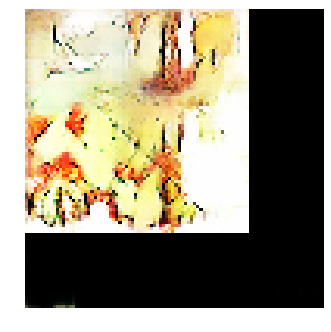


Epoch: 44400, D: -7.061, G: 3.775
Epoch: 44401, D: -6.304, G: 2.592
Epoch: 44402, D: -8.572, G: 5.537
Epoch: 44403, D: -7.039, G: 4.25
Epoch: 44404, D: -7.146, G: 5.372
Epoch: 44405, D: -5.055, G: 3.253
Epoch: 44406, D: -6.773, G: 4.53
Epoch: 44407, D: -6.06, G: 4.676
Epoch: 44408, D: -6.289, G: 2.605
Epoch: 44409, D: -5.76, G: 2.507
Epoch: 44410, D: -7.038, G: 2.089
Epoch: 44411, D: -6.332, G: 4.353
Epoch: 44412, D: -7.337, G: 4.909
Epoch: 44413, D: -7.042, G: 3.122
Epoch: 44414, D: -7.34, G: 2.275
Epoch: 44415, D: -6.537, G: 2.675
Epoch: 44416, D: -5.265, G: 3.17
Epoch: 44417, D: -6.204, G: 4.098
Epoch: 44418, D: -5.751, G: 3.376
Epoch: 44419, D: -6.015, G: 3.375


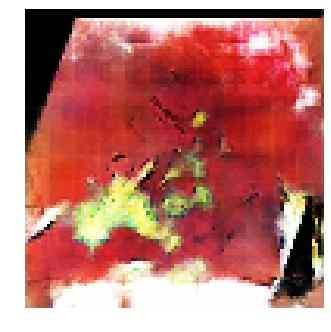


Epoch: 44420, D: -5.913, G: 3.135
Epoch: 44421, D: -6.621, G: 3.439
Epoch: 44422, D: -4.892, G: 2.033
Epoch: 44423, D: -7.281, G: 3.429
Epoch: 44424, D: -5.922, G: 1.27
Epoch: 44425, D: -5.826, G: 3.667
Epoch: 44426, D: -6.112, G: 3.382
Epoch: 44427, D: -8.21, G: 3.324
Epoch: 44428, D: -7.504, G: 3.411
Epoch: 44429, D: -6.709, G: 3.755
Epoch: 44430, D: -6.813, G: 2.226
Epoch: 44431, D: -7.77, G: 2.32
Epoch: 44432, D: -6.25, G: 4.01
Epoch: 44433, D: -5.216, G: 4.005
Epoch: 44434, D: -6.282, G: 5.581
Epoch: 44435, D: -7.058, G: 3.91
Epoch: 44436, D: -5.5, G: 3.608
Epoch: 44437, D: -8.254, G: 2.376
Epoch: 44438, D: -4.897, G: 5.109
Epoch: 44439, D: -5.896, G: 4.995


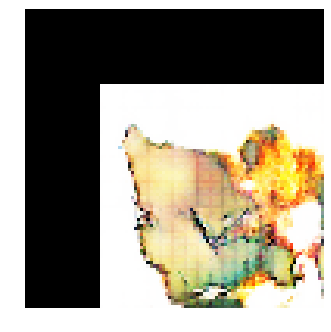


Epoch: 44440, D: -5.496, G: 4.92
Epoch: 44441, D: -6.236, G: 2.984
Epoch: 44442, D: -6.896, G: 3.146
Epoch: 44443, D: -6.498, G: 4.343
Epoch: 44444, D: -5.813, G: 3.822
Epoch: 44445, D: -6.361, G: 4.279
Epoch: 44446, D: -6.647, G: 4.932
Epoch: 44447, D: -6.73, G: 5.023
Epoch: 44448, D: -7.208, G: 5.131
Epoch: 44449, D: -8.706, G: 4.366
Epoch: 44450, D: -5.004, G: 3.359
Epoch: 44451, D: -5.283, G: 4.436
Epoch: 44452, D: -5.265, G: 4.386
Epoch: 44453, D: -6.169, G: 3.383
Epoch: 44454, D: -6.086, G: 4.096
Epoch: 44455, D: -5.224, G: 4.397
Epoch: 44456, D: -5.196, G: 5.364
Epoch: 44457, D: -4.04, G: 6.196
Epoch: 44458, D: -5.868, G: 3.945
Epoch: 44459, D: -8.042, G: 5.224


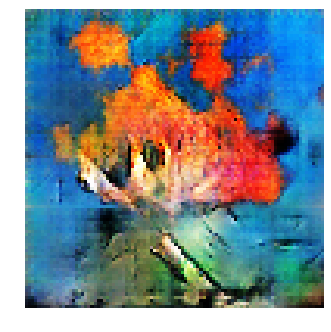


Epoch: 44460, D: -6.278, G: 4.096
Epoch: 44461, D: -7.279, G: 5.339
Epoch: 44462, D: -7.22, G: 3.839
Epoch: 44463, D: -6.478, G: 4.718
Epoch: 44464, D: -6.484, G: 3.255
Epoch: 44465, D: -7.779, G: 4.324
Epoch: 44466, D: -5.503, G: 6.09
Epoch: 44467, D: -6.842, G: 2.954
Epoch: 44468, D: -6.042, G: 4.574
Epoch: 44469, D: -6.687, G: 3.933
Epoch: 44470, D: -5.656, G: 3.636
Epoch: 44471, D: -6.96, G: 5.232
Epoch: 44472, D: -7.037, G: 3.652
Epoch: 44473, D: -7.557, G: 3.962
Epoch: 44474, D: -5.779, G: 2.787
Epoch: 44475, D: -4.895, G: 5.102
Epoch: 44476, D: -5.9, G: 3.945
Epoch: 44477, D: -5.72, G: 3.626
Epoch: 44478, D: -6.786, G: 5.173
Epoch: 44479, D: -5.81, G: 2.699


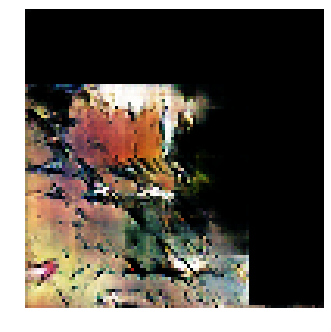


Epoch: 44480, D: -4.404, G: 4.283
Epoch: 44481, D: -6.251, G: 3.763
Epoch: 44482, D: -4.876, G: 1.857
Epoch: 44483, D: -5.841, G: 5.439
Epoch: 44484, D: -6.625, G: 4.692
Epoch: 44485, D: -6.921, G: 4.226
Epoch: 44486, D: -6.229, G: 3.423
Epoch: 44487, D: -7.374, G: 3.111
Epoch: 44488, D: -5.431, G: 5.13
Epoch: 44489, D: -5.39, G: 3.071
Epoch: 44490, D: -6.419, G: 2.479
Epoch: 44491, D: -6.523, G: 3.338
Epoch: 44492, D: -6.296, G: 5.747
Epoch: 44493, D: -7.542, G: 3.172
Epoch: 44494, D: -6.613, G: 2.281
Epoch: 44495, D: -6.567, G: 4.463
Epoch: 44496, D: -4.832, G: 2.894
Epoch: 44497, D: -6.589, G: 5.069
Epoch: 44498, D: -5.948, G: 4.996
Epoch: 44499, D: -8.071, G: 4.681


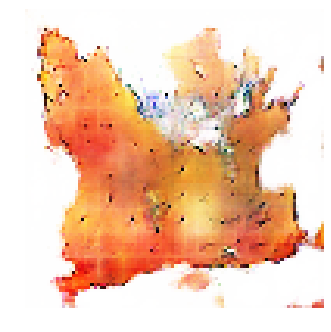


Epoch: 44500, D: -5.674, G: 3.893
Epoch: 44501, D: -7.098, G: 5.28
Epoch: 44502, D: -6.086, G: 3.402
Epoch: 44503, D: -6.725, G: 4.181
Epoch: 44504, D: -7.185, G: 4.524
Epoch: 44505, D: -5.932, G: 3.21
Epoch: 44506, D: -7.293, G: 3.833
Epoch: 44507, D: -5.351, G: 4.668
Epoch: 44508, D: -6.781, G: 4.03
Epoch: 44509, D: -6.277, G: 4.858
Epoch: 44510, D: -5.526, G: 3.067
Epoch: 44511, D: -6.577, G: 2.86
Epoch: 44512, D: -6.722, G: 2.93
Epoch: 44513, D: -5.101, G: 3.762
Epoch: 44514, D: -5.879, G: 2.346
Epoch: 44515, D: -4.535, G: 3.842
Epoch: 44516, D: -5.828, G: 3.926
Epoch: 44517, D: -7.01, G: 4.313
Epoch: 44518, D: -6.66, G: 3.648
Epoch: 44519, D: -4.892, G: 2.9


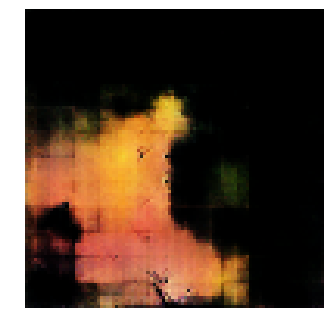


Epoch: 44520, D: -7.889, G: 1.412
Epoch: 44521, D: -6.015, G: 3.668
Epoch: 44522, D: -6.425, G: 3.585
Epoch: 44523, D: -8.1, G: 3.512
Epoch: 44524, D: -6.554, G: 3.374
Epoch: 44525, D: -7.03, G: 4.345
Epoch: 44526, D: -6.68, G: 2.779
Epoch: 44527, D: -6.788, G: 2.292
Epoch: 44528, D: -6.413, G: 2.741
Epoch: 44529, D: -6.282, G: 2.236
Epoch: 44530, D: -4.869, G: 3.246
Epoch: 44531, D: -6.851, G: 4.546
Epoch: 44532, D: -6.015, G: 4.219
Epoch: 44533, D: -6.312, G: 1.919
Epoch: 44534, D: -5.476, G: 5.248
Epoch: 44535, D: -6.112, G: 2.465
Epoch: 44536, D: -4.943, G: 3.816
Epoch: 44537, D: -6.19, G: 2.486
Epoch: 44538, D: -5.238, G: 5.354
Epoch: 44539, D: -6.27, G: 4.767


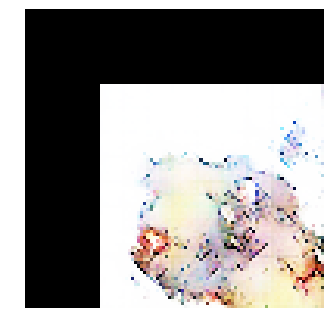


Epoch: 44540, D: -7.943, G: 4.196
Epoch: 44541, D: -5.947, G: 0.8806
Epoch: 44542, D: -6.667, G: 3.691
Epoch: 44543, D: -6.732, G: 3.029
Epoch: 44544, D: -5.323, G: 4.351
Epoch: 44545, D: -6.1, G: 3.465
Epoch: 44546, D: -6.082, G: 4.783
Epoch: 44547, D: -6.628, G: 4.919
Epoch: 44548, D: -6.49, G: 4.161
Epoch: 44549, D: -6.037, G: 2.602
Epoch: 44550, D: -7.324, G: 4.873
Epoch: 44551, D: -6.538, G: 4.729
Epoch: 44552, D: -7.685, G: 4.79
Epoch: 44553, D: -7.337, G: 2.601
Epoch: 44554, D: -5.184, G: 3.635
Epoch: 44555, D: -6.66, G: 3.394
Epoch: 44556, D: -5.413, G: 3.061
Epoch: 44557, D: -5.786, G: 2.081
Epoch: 44558, D: -7.175, G: 3.723
Epoch: 44559, D: -5.915, G: 3.437


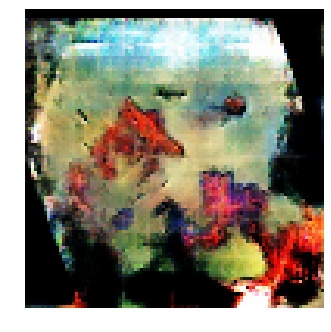


Epoch: 44560, D: -5.239, G: 3.401
Epoch: 44561, D: -5.103, G: 3.804
Epoch: 44562, D: -5.608, G: 3.114
Epoch: 44563, D: -6.121, G: 3.795
Epoch: 44564, D: -5.558, G: 3.71
Epoch: 44565, D: -6.739, G: 4.165
Epoch: 44566, D: -6.248, G: 3.86
Epoch: 44567, D: -7.763, G: 4.117
Epoch: 44568, D: -6.287, G: 2.982
Epoch: 44569, D: -5.868, G: 3.346
Epoch: 44570, D: -7.171, G: 5.617
Epoch: 44571, D: -6.703, G: 4.462
Epoch: 44572, D: -4.798, G: 2.823
Epoch: 44573, D: -5.009, G: 4.52
Epoch: 44574, D: -7.44, G: 3.06
Epoch: 44575, D: -5.216, G: 6.165
Epoch: 44576, D: -5.44, G: 3.266
Epoch: 44577, D: -5.244, G: 4.347
Epoch: 44578, D: -6.103, G: 5.448
Epoch: 44579, D: -6.636, G: 3.001


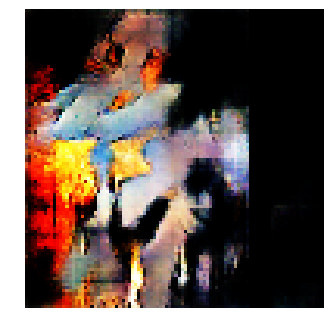


Epoch: 44580, D: -6.02, G: 3.965
Epoch: 44581, D: -6.721, G: 5.12
Epoch: 44582, D: -5.199, G: 4.882
Epoch: 44583, D: -6.631, G: 5.174
Epoch: 44584, D: -6.133, G: 4.852
Epoch: 44585, D: -6.548, G: 2.767
Epoch: 44586, D: -7.208, G: 3.135
Epoch: 44587, D: -4.913, G: 2.875
Epoch: 44588, D: -5.983, G: 3.115
Epoch: 44589, D: -6.091, G: 3.852
Epoch: 44590, D: -5.056, G: 5.091
Epoch: 44591, D: -6.73, G: 3.163
Epoch: 44592, D: -6.658, G: 3.394
Epoch: 44593, D: -5.543, G: 4.628
Epoch: 44594, D: -8.434, G: 2.43
Epoch: 44595, D: -6.906, G: 1.179
Epoch: 44596, D: -5.525, G: 4.517
Epoch: 44597, D: -6.431, G: 2.789
Epoch: 44598, D: -6.627, G: 2.976
Epoch: 44599, D: -5.877, G: 3.943


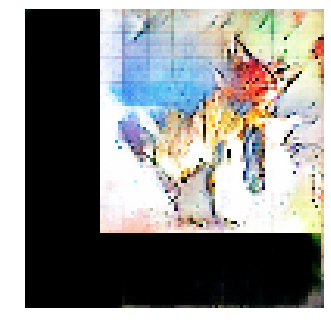


Epoch: 44600, D: -6.989, G: 4.152
Epoch: 44601, D: -5.622, G: 3.485
Epoch: 44602, D: -5.493, G: 3.433
Epoch: 44603, D: -6.329, G: 3.747
Epoch: 44604, D: -7.062, G: 3.59
Epoch: 44605, D: -5.7, G: 3.896
Epoch: 44606, D: -6.695, G: 3.431
Epoch: 44607, D: -6.066, G: 2.185
Epoch: 44608, D: -6.192, G: 4.033
Epoch: 44609, D: -6.359, G: 4.353
Epoch: 44610, D: -6.195, G: 3.598
Epoch: 44611, D: -6.391, G: 4.164
Epoch: 44612, D: -5.935, G: 1.575
Epoch: 44613, D: -7.76, G: 5.719
Epoch: 44614, D: -6.259, G: 3.095
Epoch: 44615, D: -5.014, G: 4.727
Epoch: 44616, D: -4.537, G: 4.113
Epoch: 44617, D: -5.731, G: 3.961
Epoch: 44618, D: -5.629, G: 3.184
Epoch: 44619, D: -6.089, G: 3.81


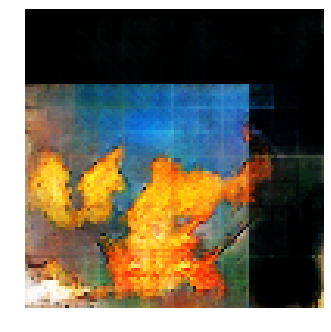


Epoch: 44620, D: -6.337, G: 5.03
Epoch: 44621, D: -6.669, G: 3.65
Epoch: 44622, D: -6.1, G: 3.669
Epoch: 44623, D: -5.44, G: 4.2
Epoch: 44624, D: -6.985, G: 3.721
Epoch: 44625, D: -6.824, G: 3.239
Epoch: 44626, D: -5.816, G: 3.853
Epoch: 44627, D: -6.939, G: 4.38
Epoch: 44628, D: -7.934, G: 3.183
Epoch: 44629, D: -5.866, G: 2.439
Epoch: 44630, D: -5.835, G: 3.668
Epoch: 44631, D: -6.729, G: 3.234
Epoch: 44632, D: -6.143, G: 3.814
Epoch: 44633, D: -6.427, G: 4.525
Epoch: 44634, D: -5.615, G: 5.03
Epoch: 44635, D: -5.969, G: 6.307
Epoch: 44636, D: -5.6, G: 4.409
Epoch: 44637, D: -6.11, G: 3.054
Epoch: 44638, D: -5.668, G: 3.893
Epoch: 44639, D: -5.108, G: 3.186


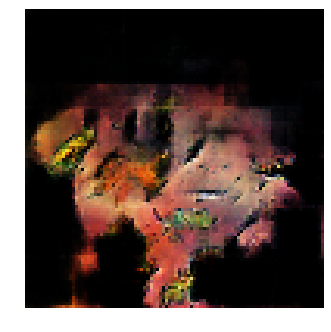


Epoch: 44640, D: -5.237, G: 2.494
Epoch: 44641, D: -6.052, G: 4.172
Epoch: 44642, D: -4.536, G: 4.623
Epoch: 44643, D: -7.502, G: 5.186
Epoch: 44644, D: -6.992, G: 3.472
Epoch: 44645, D: -7.006, G: 4.095
Epoch: 44646, D: -7.242, G: 4.304
Epoch: 44647, D: -7.512, G: 3.267
Epoch: 44648, D: -6.454, G: 5.288
Epoch: 44649, D: -5.226, G: 6.15
Epoch: 44650, D: -5.87, G: 4.807
Epoch: 44651, D: -6.802, G: 4.126
Epoch: 44652, D: -6.718, G: 3.356
Epoch: 44653, D: -5.502, G: 4.282
Epoch: 44654, D: -5.747, G: 3.278
Epoch: 44655, D: -6.059, G: 3.329
Epoch: 44656, D: -5.34, G: 2.913
Epoch: 44657, D: -7.059, G: 3.505
Epoch: 44658, D: -5.713, G: 4.73
Epoch: 44659, D: -5.363, G: 3.964


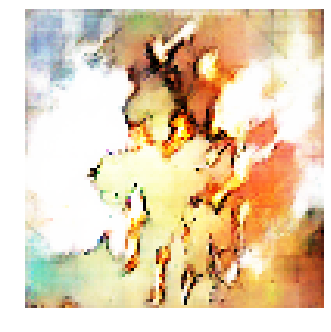


Epoch: 44660, D: -5.555, G: 3.037
Epoch: 44661, D: -7.572, G: 2.735
Epoch: 44662, D: -7.576, G: 4.342
Epoch: 44663, D: -6.488, G: 3.66
Epoch: 44664, D: -5.621, G: 5.383
Epoch: 44665, D: -6.381, G: 5.294
Epoch: 44666, D: -5.776, G: 4.011
Epoch: 44667, D: -5.418, G: 2.937
Epoch: 44668, D: -5.628, G: 3.313
Epoch: 44669, D: -7.268, G: 3.742
Epoch: 44670, D: -6.245, G: 3.316
Epoch: 44671, D: -7.3, G: 5.004
Epoch: 44672, D: -5.535, G: 4.989
Epoch: 44673, D: -6.494, G: 4.598
Epoch: 44674, D: -7.142, G: 4.39
Epoch: 44675, D: -6.203, G: 3.648
Epoch: 44676, D: -6.478, G: 4.68
Epoch: 44677, D: -5.046, G: 2.598
Epoch: 44678, D: -5.958, G: 2.962
Epoch: 44679, D: -6.956, G: 2.155


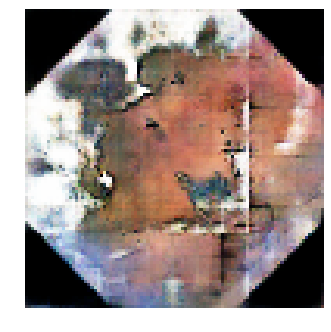


Epoch: 44680, D: -5.44, G: 3.226
Epoch: 44681, D: -5.799, G: 4.935
Epoch: 44682, D: -6.345, G: 3.517
Epoch: 44683, D: -7.261, G: 4.794
Epoch: 44684, D: -6.224, G: 3.846
Epoch: 44685, D: -7.035, G: 3.42
Epoch: 44686, D: -6.381, G: 4.313
Epoch: 44687, D: -6.458, G: 4.674
Epoch: 44688, D: -6.041, G: 3.788
Epoch: 44689, D: -5.419, G: 3.732
Epoch: 44690, D: -5.049, G: 3.98
Epoch: 44691, D: -6.343, G: 5.652
Epoch: 44692, D: -5.756, G: 6.038
Epoch: 44693, D: -6.518, G: 6.909
Epoch: 44694, D: -5.987, G: 4.951
Epoch: 44695, D: -6.78, G: 3.028
Epoch: 44696, D: -6.086, G: 4.454
Epoch: 44697, D: -6.001, G: 4.39
Epoch: 44698, D: -6.445, G: 6.478
Epoch: 44699, D: -5.468, G: 3.957


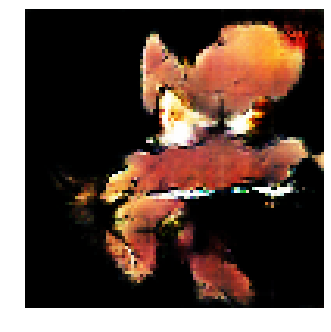


Epoch: 44700, D: -6.997, G: 4.413
Epoch: 44701, D: -5.801, G: 3.399
Epoch: 44702, D: -6.217, G: 5.133
Epoch: 44703, D: -5.87, G: 4.489
Epoch: 44704, D: -7.636, G: 4.368
Epoch: 44705, D: -5.908, G: 4.8
Epoch: 44706, D: -5.522, G: 4.553
Epoch: 44707, D: -5.922, G: 5.388
Epoch: 44708, D: -7.719, G: 4.488
Epoch: 44709, D: -6.072, G: 3.195
Epoch: 44710, D: -4.785, G: 5.426
Epoch: 44711, D: -6.932, G: 4.915
Epoch: 44712, D: -6.794, G: 3.922
Epoch: 44713, D: -6.519, G: 4.314
Epoch: 44714, D: -6.79, G: 3.613
Epoch: 44715, D: -7.097, G: 4.113
Epoch: 44716, D: -5.694, G: 1.37
Epoch: 44717, D: -6.943, G: 2.609
Epoch: 44718, D: -7.532, G: 2.838
Epoch: 44719, D: -5.23, G: 2.61


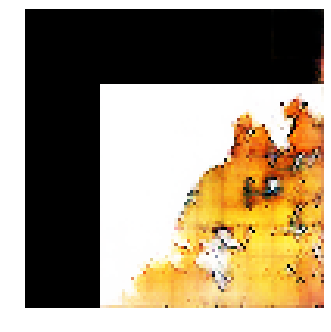


Epoch: 44720, D: -6.889, G: 4.219
Epoch: 44721, D: -6.758, G: 3.452
Epoch: 44722, D: -6.46, G: 4.248
Epoch: 44723, D: -5.581, G: 4.003
Epoch: 44724, D: -5.499, G: 4.062
Epoch: 44725, D: -6.698, G: 3.728
Epoch: 44726, D: -6.351, G: 1.292
Epoch: 44727, D: -7.414, G: 3.411
Epoch: 44728, D: -6.333, G: 2.818
Epoch: 44729, D: -5.729, G: 3.845
Epoch: 44730, D: -6.376, G: 4.146
Epoch: 44731, D: -7.246, G: 3.46
Epoch: 44732, D: -6.118, G: 3.07
Epoch: 44733, D: -6.058, G: 4.824
Epoch: 44734, D: -6.152, G: 4.808
Epoch: 44735, D: -6.618, G: 5.374
Epoch: 44736, D: -6.54, G: 4.13
Epoch: 44737, D: -6.668, G: 4.751
Epoch: 44738, D: -6.782, G: 5.339
Epoch: 44739, D: -4.741, G: 5.049


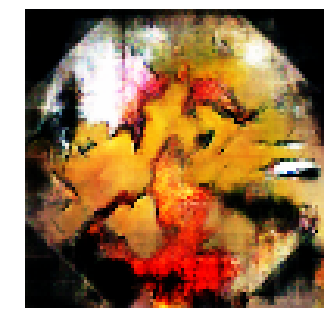


Epoch: 44740, D: -5.403, G: 5.247
Epoch: 44741, D: -5.863, G: 3.715
Epoch: 44742, D: -7.368, G: 5.029
Epoch: 44743, D: -6.356, G: 3.326
Epoch: 44744, D: -5.387, G: 4.388
Epoch: 44745, D: -7.093, G: 2.96
Epoch: 44746, D: -6.393, G: 4.23
Epoch: 44747, D: -6.387, G: 1.511
Epoch: 44748, D: -6.067, G: 4.856
Epoch: 44749, D: -5.497, G: 2.478
Epoch: 44750, D: -5.45, G: 4.4
Epoch: 44751, D: -5.303, G: 3.127
Epoch: 44752, D: -8.215, G: 3.23
Epoch: 44753, D: -6.149, G: 3.803
Epoch: 44754, D: -6.017, G: 4.668
Epoch: 44755, D: -7.188, G: 5.031
Epoch: 44756, D: -6.606, G: 3.163
Epoch: 44757, D: -6.993, G: 3.557
Epoch: 44758, D: -7.598, G: 4.417
Epoch: 44759, D: -6.943, G: 1.657


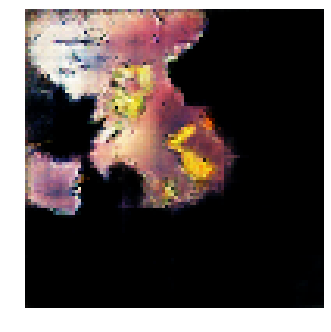


Epoch: 44760, D: -6.976, G: 4.031
Epoch: 44761, D: -4.839, G: 3.115
Epoch: 44762, D: -7.47, G: 2.348
Epoch: 44763, D: -4.184, G: 4.764
Epoch: 44764, D: -6.346, G: 4.089
Epoch: 44765, D: -7.374, G: 4.506
Epoch: 44766, D: -5.454, G: 3.414
Epoch: 44767, D: -6.859, G: 4.581
Epoch: 44768, D: -6.644, G: 3.461
Epoch: 44769, D: -5.721, G: 0.9898
Epoch: 44770, D: -7.788, G: 4.547
Epoch: 44771, D: -6.274, G: 3.802
Epoch: 44772, D: -5.76, G: 3.547
Epoch: 44773, D: -7.697, G: 2.591
Epoch: 44774, D: -6.581, G: 4.817
Epoch: 44775, D: -8.528, G: 4.634
Epoch: 44776, D: -5.562, G: 3.311
Epoch: 44777, D: -4.967, G: 5.102
Epoch: 44778, D: -7.182, G: 5.278
Epoch: 44779, D: -6.057, G: 3.848


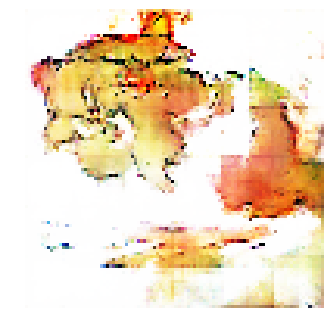


Epoch: 44780, D: -7.064, G: 4.82
Epoch: 44781, D: -6.628, G: 4.537
Epoch: 44782, D: -8.018, G: 2.682
Epoch: 44783, D: -7.142, G: 4.433
Epoch: 44784, D: -5.861, G: 5.022
Epoch: 44785, D: -6.98, G: 3.372
Epoch: 44786, D: -5.416, G: 3.888
Epoch: 44787, D: -6.697, G: 4.742
Epoch: 44788, D: -6.108, G: 4.359
Epoch: 44789, D: -5.987, G: 2.977
Epoch: 44790, D: -6.176, G: 3.177
Epoch: 44791, D: -7.289, G: 3.475
Epoch: 44792, D: -7.741, G: 3.029
Epoch: 44793, D: -7.017, G: 3.259
Epoch: 44794, D: -7.904, G: 3.449
Epoch: 44795, D: -7.719, G: 4.48
Epoch: 44796, D: -6.69, G: 2.158
Epoch: 44797, D: -6.177, G: 2.803
Epoch: 44798, D: -6.643, G: 3.26
Epoch: 44799, D: -5.331, G: 3.966


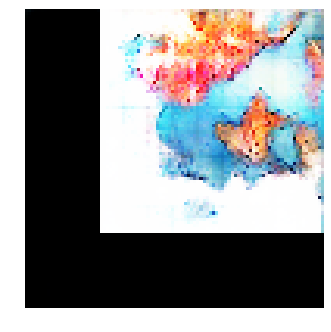


Epoch: 44800, D: -6.337, G: 3.808
Epoch: 44801, D: -5.924, G: 3.666
Epoch: 44802, D: -6.354, G: 3.695
Epoch: 44803, D: -7.546, G: 4.611
Epoch: 44804, D: -5.124, G: 1.605
Epoch: 44805, D: -6.291, G: 1.865
Epoch: 44806, D: -6.449, G: 3.896
Epoch: 44807, D: -7.475, G: 5.696
Epoch: 44808, D: -5.878, G: 3.297
Epoch: 44809, D: -5.871, G: 3.979
Epoch: 44810, D: -5.922, G: 3.384
Epoch: 44811, D: -7.069, G: 3.65
Epoch: 44812, D: -6.982, G: 3.642
Epoch: 44813, D: -7.033, G: 5.853
Epoch: 44814, D: -7.093, G: 5.834
Epoch: 44815, D: -6.553, G: 3.998
Epoch: 44816, D: -5.688, G: 3.903
Epoch: 44817, D: -6.973, G: 2.957
Epoch: 44818, D: -5.482, G: 4.717
Epoch: 44819, D: -5.729, G: 2.91


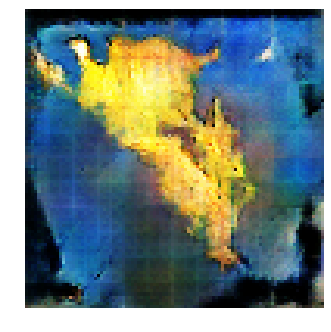


Epoch: 44820, D: -6.011, G: 4.009
Epoch: 44821, D: -6.901, G: 4.389
Epoch: 44822, D: -6.78, G: 4.543
Epoch: 44823, D: -4.438, G: 4.793
Epoch: 44824, D: -6.342, G: 3.388
Epoch: 44825, D: -8.758, G: 3.825
Epoch: 44826, D: -5.596, G: 5.375
Epoch: 44827, D: -4.744, G: 3.996
Epoch: 44828, D: -6.2, G: 4.113
Epoch: 44829, D: -5.805, G: 2.512
Epoch: 44830, D: -5.669, G: 3.247
Epoch: 44831, D: -7.188, G: 3.992
Epoch: 44832, D: -7.617, G: 3.422
Epoch: 44833, D: -5.145, G: 2.555
Epoch: 44834, D: -5.313, G: 3.099
Epoch: 44835, D: -6.542, G: 3.552
Epoch: 44836, D: -5.662, G: 2.976
Epoch: 44837, D: -6.852, G: 4.209
Epoch: 44838, D: -6.182, G: 3.809
Epoch: 44839, D: -5.337, G: 2.594


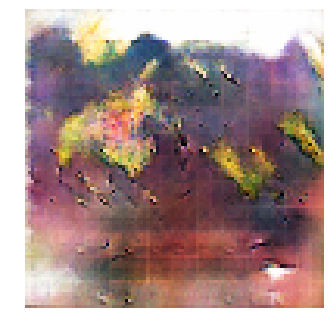


Epoch: 44840, D: -7.459, G: 4.278
Epoch: 44841, D: -5.342, G: 4.57
Epoch: 44842, D: -5.51, G: 2.919
Epoch: 44843, D: -6.253, G: 3.745
Epoch: 44844, D: -6.044, G: 1.793
Epoch: 44845, D: -6.088, G: 3.782
Epoch: 44846, D: -5.891, G: 2.547
Epoch: 44847, D: -6.604, G: 2.75
Epoch: 44848, D: -5.853, G: 3.102
Epoch: 44849, D: -7.771, G: 4.97
Epoch: 44850, D: -6.592, G: 4.563
Epoch: 44851, D: -7.347, G: 5.295
Epoch: 44852, D: -7.882, G: 4.852
Epoch: 44853, D: -7.059, G: 4.007
Epoch: 44854, D: -4.869, G: 4.285
Epoch: 44855, D: -5.493, G: 4.649
Epoch: 44856, D: -6.316, G: 3.315
Epoch: 44857, D: -5.205, G: 4.234
Epoch: 44858, D: -7.143, G: 4.784
Epoch: 44859, D: -5.046, G: 3.889


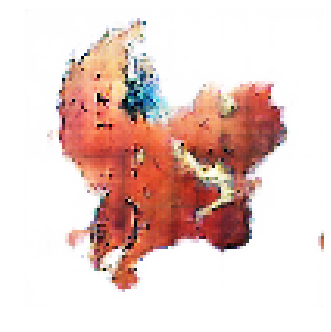


Epoch: 44860, D: -5.938, G: 4.892
Epoch: 44861, D: -6.419, G: 2.567
Epoch: 44862, D: -5.1, G: 5.664
Epoch: 44863, D: -4.827, G: 2.972
Epoch: 44864, D: -5.848, G: 4.075
Epoch: 44865, D: -6.698, G: 2.407
Epoch: 44866, D: -6.109, G: 3.89
Epoch: 44867, D: -7.488, G: 6.615
Epoch: 44868, D: -6.71, G: 3.772
Epoch: 44869, D: -4.991, G: 3.442
Epoch: 44870, D: -6.991, G: 4.783
Epoch: 44871, D: -6.584, G: 3.573
Epoch: 44872, D: -6.672, G: 6.327
Epoch: 44873, D: -6.698, G: 3.448
Epoch: 44874, D: -6.025, G: 5.193
Epoch: 44875, D: -7.36, G: 2.3
Epoch: 44876, D: -5.938, G: 4.352
Epoch: 44877, D: -4.723, G: 3.318
Epoch: 44878, D: -5.819, G: 3.305
Epoch: 44879, D: -5.468, G: 3.576


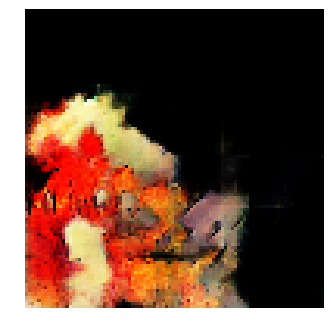


Epoch: 44880, D: -6.887, G: 4.601
Epoch: 44881, D: -5.563, G: 2.532
Epoch: 44882, D: -8.56, G: 4.394
Epoch: 44883, D: -6.58, G: 4.071
Epoch: 44884, D: -6.777, G: 4.66
Epoch: 44885, D: -4.926, G: 3.846
Epoch: 44886, D: -6.138, G: 4.045
Epoch: 44887, D: -8.104, G: 3.901
Epoch: 44888, D: -7.781, G: 4.291
Epoch: 44889, D: -5.54, G: 3.687
Epoch: 44890, D: -5.666, G: 4.456
Epoch: 44891, D: -5.593, G: 3.131
Epoch: 44892, D: -6.2, G: 5.017
Epoch: 44893, D: -7.435, G: 4.143
Epoch: 44894, D: -6.566, G: 4.285
Epoch: 44895, D: -6.212, G: 5.27
Epoch: 44896, D: -5.636, G: 3.927
Epoch: 44897, D: -5.439, G: 4.647
Epoch: 44898, D: -6.498, G: 4.284
Epoch: 44899, D: -5.872, G: 4.593


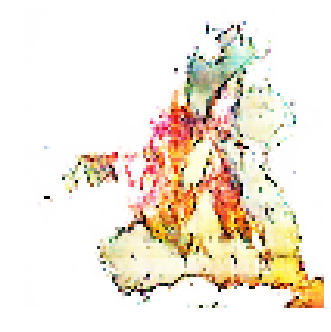


Epoch: 44900, D: -7.365, G: 3.762
Epoch: 44901, D: -6.552, G: 3.387
Epoch: 44902, D: -6.036, G: 1.302
Epoch: 44903, D: -6.667, G: 2.846
Epoch: 44904, D: -6.228, G: 5.33
Epoch: 44905, D: -7.307, G: 3.362
Epoch: 44906, D: -6.201, G: 4.316
Epoch: 44907, D: -7.451, G: 3.247
Epoch: 44908, D: -5.987, G: 4.194
Epoch: 44909, D: -4.747, G: 5.906
Epoch: 44910, D: -6.965, G: 4.036
Epoch: 44911, D: -5.953, G: 3.276
Epoch: 44912, D: -6.864, G: 5.24
Epoch: 44913, D: -7.146, G: 2.862
Epoch: 44914, D: -6.887, G: 2.792
Epoch: 44915, D: -6.09, G: 3.959
Epoch: 44916, D: -6.076, G: 6.303
Epoch: 44917, D: -5.575, G: 4.04
Epoch: 44918, D: -8.85, G: 3.935
Epoch: 44919, D: -5.11, G: 2.676


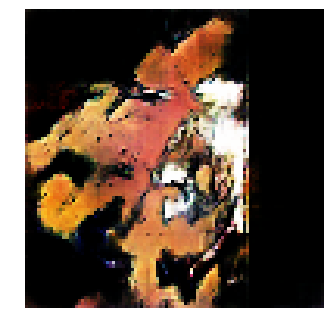


Epoch: 44920, D: -6.889, G: 2.449
Epoch: 44921, D: -6.17, G: 2.956
Epoch: 44922, D: -5.808, G: 3.257
Epoch: 44923, D: -5.758, G: 5.332
Epoch: 44924, D: -6.326, G: 4.88
Epoch: 44925, D: -4.56, G: 4.738
Epoch: 44926, D: -6.506, G: 3.515
Epoch: 44927, D: -5.819, G: 5.18
Epoch: 44928, D: -6.394, G: 4.378
Epoch: 44929, D: -5.633, G: 5.077
Epoch: 44930, D: -6.259, G: 1.284
Epoch: 44931, D: -6.792, G: 5.963
Epoch: 44932, D: -8.395, G: 3.73
Epoch: 44933, D: -6.089, G: 3.414
Epoch: 44934, D: -5.529, G: 1.758
Epoch: 44935, D: -7.963, G: 4.476
Epoch: 44936, D: -6.999, G: 2.491
Epoch: 44937, D: -5.69, G: 3.173
Epoch: 44938, D: -6.827, G: 4.691
Epoch: 44939, D: -6.819, G: 4.007


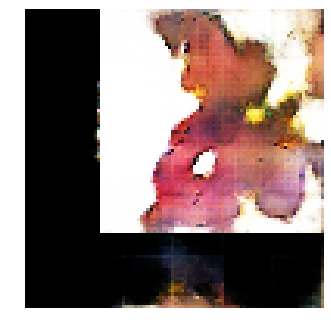


Epoch: 44940, D: -5.918, G: 1.588
Epoch: 44941, D: -5.267, G: 2.119
Epoch: 44942, D: -6.052, G: 7.319
Epoch: 44943, D: -4.66, G: 4.915
Epoch: 44944, D: -5.66, G: 4.226
Epoch: 44945, D: -5.274, G: 4.808
Epoch: 44946, D: -6.941, G: 3.215
Epoch: 44947, D: -7.09, G: 2.933
Epoch: 44948, D: -6.28, G: 4.178
Epoch: 44949, D: -5.897, G: 3.831
Epoch: 44950, D: -6.415, G: 3.652
Epoch: 44951, D: -6.497, G: 3.858
Epoch: 44952, D: -7.952, G: 2.556
Epoch: 44953, D: -6.045, G: 1.731
Epoch: 44954, D: -5.647, G: 2.957
Epoch: 44955, D: -5.849, G: 4.508
Epoch: 44956, D: -6.13, G: 3.764
Epoch: 44957, D: -7.898, G: 3.271
Epoch: 44958, D: -6.519, G: 4.075
Epoch: 44959, D: -7.06, G: 3.557


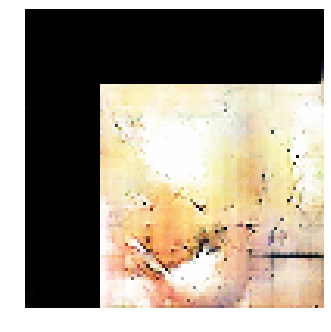


Epoch: 44960, D: -6.81, G: 3.785
Epoch: 44961, D: -5.671, G: 3.524
Epoch: 44962, D: -6.549, G: 3.337
Epoch: 44963, D: -6.249, G: 3.684
Epoch: 44964, D: -5.433, G: 4.477
Epoch: 44965, D: -5.431, G: 4.388
Epoch: 44966, D: -5.45, G: 4.495
Epoch: 44967, D: -6.506, G: 4.088
Epoch: 44968, D: -6.262, G: 4.165
Epoch: 44969, D: -6.857, G: 3.734
Epoch: 44970, D: -6.515, G: 5.213
Epoch: 44971, D: -5.37, G: 5.677
Epoch: 44972, D: -6.695, G: 3.874
Epoch: 44973, D: -5.89, G: 1.45
Epoch: 44974, D: -5.754, G: 5.355
Epoch: 44975, D: -6.432, G: 4.596
Epoch: 44976, D: -5.61, G: 3.313
Epoch: 44977, D: -6.114, G: 3.063
Epoch: 44978, D: -6.579, G: 4.735
Epoch: 44979, D: -4.505, G: 4.701


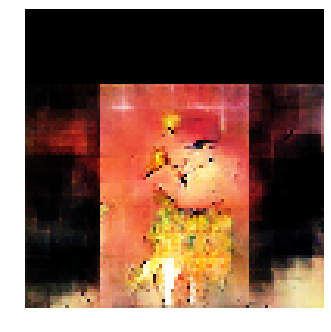


Epoch: 44980, D: -6.481, G: 4.093
Epoch: 44981, D: -5.566, G: 3.226
Epoch: 44982, D: -6.742, G: 4.118
Epoch: 44983, D: -6.352, G: 3.961
Epoch: 44984, D: -6.487, G: 4.757
Epoch: 44985, D: -6.413, G: 2.88
Epoch: 44986, D: -4.291, G: 4.208
Epoch: 44987, D: -5.924, G: 4.74
Epoch: 44988, D: -5.422, G: 4.968
Epoch: 44989, D: -8.044, G: 4.591
Epoch: 44990, D: -5.549, G: 3.315
Epoch: 44991, D: -6.531, G: 3.15
Epoch: 44992, D: -6.22, G: 2.668
Epoch: 44993, D: -6.447, G: 3.795
Epoch: 44994, D: -5.51, G: 2.289
Epoch: 44995, D: -6.568, G: 3.488
Epoch: 44996, D: -6.072, G: 3.23
Epoch: 44997, D: -8.049, G: 2.971
Epoch: 44998, D: -6.513, G: 3.07
Epoch: 44999, D: -7.155, G: 4.899


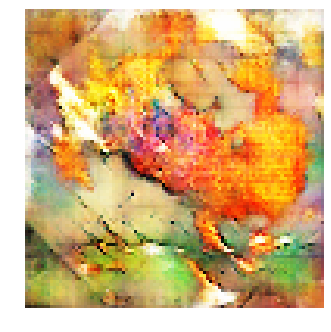


Epoch: 45000, D: -6.167, G: 3.897
Epoch: 45001, D: -5.815, G: 3.893
Epoch: 45002, D: -4.805, G: 4.069
Epoch: 45003, D: -6.1, G: 6.45
Epoch: 45004, D: -5.696, G: 3.491
Epoch: 45005, D: -7.266, G: 3.135
Epoch: 45006, D: -6.155, G: 3.158
Epoch: 45007, D: -6.472, G: 4.089
Epoch: 45008, D: -6.869, G: 3.493
Epoch: 45009, D: -6.003, G: 3.269
Epoch: 45010, D: -6.547, G: 4.683
Epoch: 45011, D: -6.203, G: 4.307
Epoch: 45012, D: -5.155, G: 2.38
Epoch: 45013, D: -5.457, G: 5.906
Epoch: 45014, D: -5.352, G: 2.899
Epoch: 45015, D: -7.891, G: 4.316
Epoch: 45016, D: -6.631, G: 3.666
Epoch: 45017, D: -6.503, G: 5.577
Epoch: 45018, D: -6.028, G: 4.682
Epoch: 45019, D: -6.438, G: 3.667


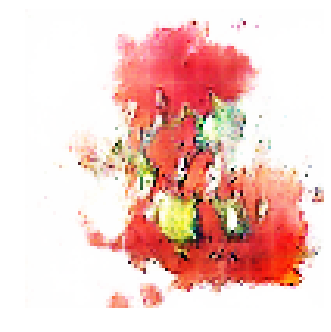


Epoch: 45020, D: -5.961, G: 4.355
Epoch: 45021, D: -5.362, G: 4.323
Epoch: 45022, D: -4.637, G: 4.131
Epoch: 45023, D: -4.486, G: 4.636
Epoch: 45024, D: -5.641, G: 2.134
Epoch: 45025, D: -5.916, G: 2.832
Epoch: 45026, D: -7.152, G: 3.457
Epoch: 45027, D: -4.943, G: 1.445
Epoch: 45028, D: -5.37, G: 2.553
Epoch: 45029, D: -6.91, G: 3.167
Epoch: 45030, D: -6.437, G: 4.886
Epoch: 45031, D: -5.793, G: 2.906
Epoch: 45032, D: -5.553, G: 4.045
Epoch: 45033, D: -5.695, G: 5.176
Epoch: 45034, D: -6.422, G: 4.4
Epoch: 45035, D: -4.647, G: 3.253
Epoch: 45036, D: -6.389, G: 4.453
Epoch: 45037, D: -4.603, G: 3.601
Epoch: 45038, D: -6.362, G: 4.175
Epoch: 45039, D: -6.72, G: 3.949


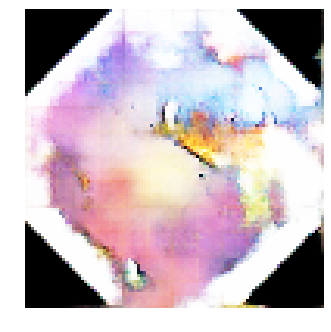


Epoch: 45040, D: -4.861, G: 1.518
Epoch: 45041, D: -6.568, G: 5.642
Epoch: 45042, D: -5.622, G: 3.456
Epoch: 45043, D: -5.608, G: 3.571
Epoch: 45044, D: -7.641, G: 4.034
Epoch: 45045, D: -5.79, G: 3.044
Epoch: 45046, D: -4.554, G: 3.516
Epoch: 45047, D: -5.852, G: 3.524
Epoch: 45048, D: -7.195, G: 3.813
Epoch: 45049, D: -7.352, G: 3.457
Epoch: 45050, D: -6.448, G: 3.433
Epoch: 45051, D: -6.647, G: 3.596
Epoch: 45052, D: -5.733, G: 4.362
Epoch: 45053, D: -8.238, G: 3.975
Epoch: 45054, D: -5.665, G: 3.182
Epoch: 45055, D: -7.441, G: 5.565
Epoch: 45056, D: -7.801, G: 3.357
Epoch: 45057, D: -4.525, G: 3.76
Epoch: 45058, D: -6.783, G: 6.071
Epoch: 45059, D: -5.214, G: 3.421


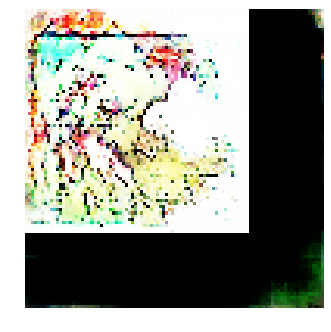


Epoch: 45060, D: -7.177, G: 3.702
Epoch: 45061, D: -7.766, G: 3.893
Epoch: 45062, D: -4.752, G: 4.672
Epoch: 45063, D: -4.656, G: 4.471
Epoch: 45064, D: -5.576, G: 4.553
Epoch: 45065, D: -5.098, G: 3.716
Epoch: 45066, D: -5.182, G: 3.543
Epoch: 45067, D: -6.97, G: 2.026
Epoch: 45068, D: -7.102, G: 3.031
Epoch: 45069, D: -5.222, G: 2.669
Epoch: 45070, D: -8.124, G: 3.971
Epoch: 45071, D: -5.214, G: 4.446
Epoch: 45072, D: -5.769, G: 3.555
Epoch: 45073, D: -7.318, G: 4.954
Epoch: 45074, D: -7.423, G: 2.846
Epoch: 45075, D: -6.614, G: 4.163
Epoch: 45076, D: -9.537, G: 4.946
Epoch: 45077, D: -6.476, G: 4.221
Epoch: 45078, D: -6.442, G: 3.171
Epoch: 45079, D: -5.757, G: 3.204


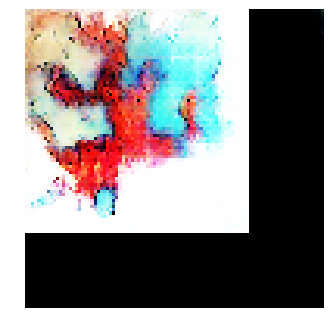


Epoch: 45080, D: -6.433, G: 5.161
Epoch: 45081, D: -6.936, G: 4.122
Epoch: 45082, D: -7.052, G: 4.968
Epoch: 45083, D: -6.901, G: 4.658
Epoch: 45084, D: -6.14, G: 5.053
Epoch: 45085, D: -5.017, G: 3.764
Epoch: 45086, D: -6.37, G: 3.182
Epoch: 45087, D: -4.229, G: 3.134
Epoch: 45088, D: -7.729, G: 3.329
Epoch: 45089, D: -4.826, G: 3.88
Epoch: 45090, D: -6.126, G: 5.329
Epoch: 45091, D: -6.743, G: 2.989
Epoch: 45092, D: -7.697, G: 2.82
Epoch: 45093, D: -4.115, G: 2.535
Epoch: 45094, D: -5.083, G: 4.771
Epoch: 45095, D: -6.135, G: 6.189
Epoch: 45096, D: -5.73, G: 4.275
Epoch: 45097, D: -5.836, G: 5.161
Epoch: 45098, D: -5.717, G: 4.754
Epoch: 45099, D: -7.972, G: 5.206


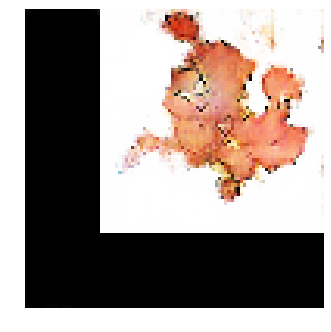


Epoch: 45100, D: -5.426, G: 2.455
Epoch: 45101, D: -7.815, G: 4.814
Epoch: 45102, D: -6.174, G: 3.515
Epoch: 45103, D: -5.133, G: 2.582
Epoch: 45104, D: -6.449, G: 4.561
Epoch: 45105, D: -6.818, G: 4.406
Epoch: 45106, D: -5.553, G: 3.421
Epoch: 45107, D: -6.07, G: 3.442
Epoch: 45108, D: -6.466, G: 3.068
Epoch: 45109, D: -5.57, G: 3.322
Epoch: 45110, D: -6.274, G: 4.328
Epoch: 45111, D: -5.783, G: 3.783
Epoch: 45112, D: -5.777, G: 3.075
Epoch: 45113, D: -6.753, G: 3.376
Epoch: 45114, D: -6.241, G: 3.44
Epoch: 45115, D: -6.436, G: 2.561
Epoch: 45116, D: -6.52, G: 4.895
Epoch: 45117, D: -6.792, G: 3.934
Epoch: 45118, D: -7.064, G: 4.566
Epoch: 45119, D: -5.294, G: 2.984


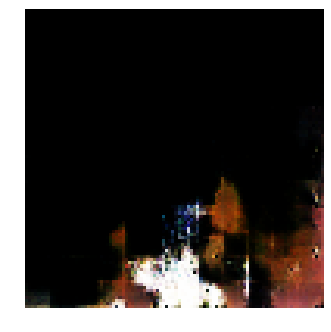


Epoch: 45120, D: -6.299, G: 3.866
Epoch: 45121, D: -5.197, G: 3.109
Epoch: 45122, D: -7.18, G: 3.849
Epoch: 45123, D: -5.414, G: 3.107
Epoch: 45124, D: -4.698, G: 3.866
Epoch: 45125, D: -8.439, G: 4.856
Epoch: 45126, D: -6.421, G: 5.704
Epoch: 45127, D: -7.558, G: 4.14
Epoch: 45128, D: -6.255, G: 2.891
Epoch: 45129, D: -4.864, G: 3.516
Epoch: 45130, D: -5.575, G: 2.761
Epoch: 45131, D: -8.347, G: 4.295
Epoch: 45132, D: -5.456, G: 1.475
Epoch: 45133, D: -5.934, G: 4.051
Epoch: 45134, D: -6.102, G: 4.076
Epoch: 45135, D: -7.164, G: 1.682
Epoch: 45136, D: -6.949, G: 2.872
Epoch: 45137, D: -5.847, G: 4.904
Epoch: 45138, D: -6.297, G: 4.881
Epoch: 45139, D: -5.631, G: 4.414


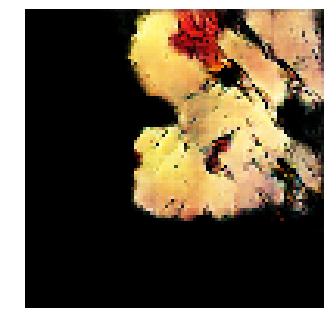


Epoch: 45140, D: -5.096, G: 1.473
Epoch: 45141, D: -6.271, G: 0.816
Epoch: 45142, D: -7.288, G: 3.111
Epoch: 45143, D: -7.945, G: 3.102
Epoch: 45144, D: -7.29, G: 4.414
Epoch: 45145, D: -5.19, G: 3.555
Epoch: 45146, D: -6.879, G: 3.89
Epoch: 45147, D: -5.609, G: 2.211
Epoch: 45148, D: -4.866, G: 5.556
Epoch: 45149, D: -7.863, G: 3.291
Epoch: 45150, D: -6.307, G: 3.662
Epoch: 45151, D: -6.579, G: 1.021
Epoch: 45152, D: -6.575, G: 4.016
Epoch: 45153, D: -6.066, G: 2.662
Epoch: 45154, D: -6.8, G: 4.454
Epoch: 45155, D: -6.427, G: 3.337
Epoch: 45156, D: -6.541, G: 2.565
Epoch: 45157, D: -5.31, G: 5.085
Epoch: 45158, D: -6.434, G: 2.909
Epoch: 45159, D: -5.679, G: 4.66


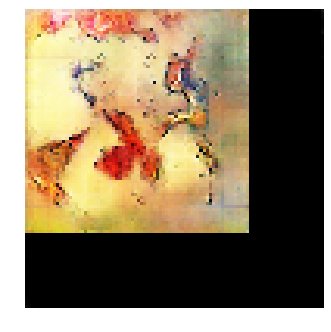


Epoch: 45160, D: -5.09, G: 3.688
Epoch: 45161, D: -7.397, G: 3.628
Epoch: 45162, D: -6.565, G: 5.657
Epoch: 45163, D: -6.406, G: 2.99
Epoch: 45164, D: -6.175, G: 4.812
Epoch: 45165, D: -6.222, G: 2.446
Epoch: 45166, D: -7.241, G: 2.79
Epoch: 45167, D: -5.007, G: 3.134
Epoch: 45168, D: -6.08, G: 5.497
Epoch: 45169, D: -6.503, G: 3.124
Epoch: 45170, D: -7.394, G: 5.264
Epoch: 45171, D: -6.847, G: 2.753
Epoch: 45172, D: -6.211, G: 2.618
Epoch: 45173, D: -5.268, G: 3.689
Epoch: 45174, D: -8.697, G: 5.05
Epoch: 45175, D: -7.287, G: 3.449
Epoch: 45176, D: -5.141, G: 2.512
Epoch: 45177, D: -7.852, G: 3.104
Epoch: 45178, D: -7.318, G: 3.723
Epoch: 45179, D: -6.681, G: 2.625


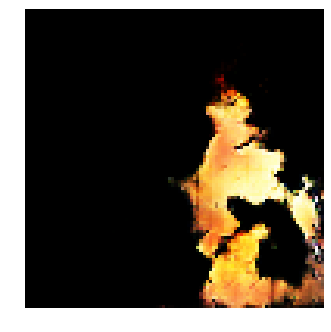


Epoch: 45180, D: -5.912, G: 4.742
Epoch: 45181, D: -7.165, G: 5.206
Epoch: 45182, D: -4.913, G: 3.263
Epoch: 45183, D: -6.565, G: 2.509
Epoch: 45184, D: -6.111, G: 2.425
Epoch: 45185, D: -6.825, G: 6.105
Epoch: 45186, D: -5.093, G: 4.595
Epoch: 45187, D: -8.37, G: 4.497
Epoch: 45188, D: -6.414, G: 3.781
Epoch: 45189, D: -6.24, G: 4.078
Epoch: 45190, D: -6.586, G: 3.715
Epoch: 45191, D: -5.32, G: 2.886
Epoch: 45192, D: -8.695, G: 3.787
Epoch: 45193, D: -5.373, G: 3.169
Epoch: 45194, D: -6.789, G: 4.854
Epoch: 45195, D: -7.292, G: 3.033
Epoch: 45196, D: -6.821, G: 2.32
Epoch: 45197, D: -5.648, G: 4.696
Epoch: 45198, D: -3.226, G: 2.656
Epoch: 45199, D: -5.343, G: 5.31


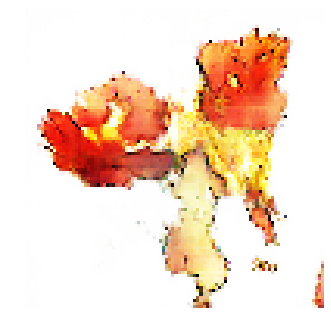


Epoch: 45200, D: -5.74, G: 5.154
Epoch: 45201, D: -4.737, G: 3.409
Epoch: 45202, D: -5.711, G: 5.272
Epoch: 45203, D: -6.05, G: 5.162
Epoch: 45204, D: -6.757, G: 3.981
Epoch: 45205, D: -5.092, G: 4.109
Epoch: 45206, D: -5.852, G: 2.239
Epoch: 45207, D: -6.926, G: 2.816
Epoch: 45208, D: -6.564, G: 3.938
Epoch: 45209, D: -5.338, G: 1.89
Epoch: 45210, D: -6.525, G: 1.815
Epoch: 45211, D: -5.632, G: 0.4744
Epoch: 45212, D: -5.143, G: 3.798
Epoch: 45213, D: -6.374, G: 3.245
Epoch: 45214, D: -6.451, G: 3.989
Epoch: 45215, D: -6.914, G: 4.096
Epoch: 45216, D: -6.811, G: 3.236
Epoch: 45217, D: -6.294, G: 5.183
Epoch: 45218, D: -5.861, G: 5.946
Epoch: 45219, D: -6.627, G: 4.154


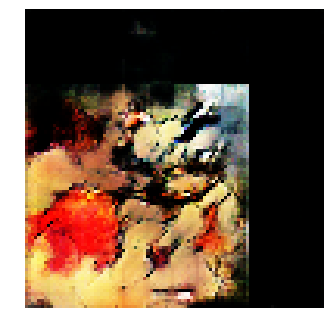


Epoch: 45220, D: -5.63, G: 5.424
Epoch: 45221, D: -6.455, G: 2.677
Epoch: 45222, D: -7.128, G: 3.297
Epoch: 45223, D: -7.759, G: 4.731
Epoch: 45224, D: -6.434, G: 3.719
Epoch: 45225, D: -6.452, G: 5.074
Epoch: 45226, D: -7.509, G: 5.439
Epoch: 45227, D: -6.307, G: 3.386
Epoch: 45228, D: -5.513, G: 4.313
Epoch: 45229, D: -6.673, G: 5.926
Epoch: 45230, D: -6.135, G: 3.793
Epoch: 45231, D: -6.641, G: 4.16
Epoch: 45232, D: -6.334, G: 3.811
Epoch: 45233, D: -6.391, G: 3.775
Epoch: 45234, D: -7.587, G: 3.576
Epoch: 45235, D: -6.392, G: 3.998
Epoch: 45236, D: -5.833, G: 5.046
Epoch: 45237, D: -5.66, G: 4.41
Epoch: 45238, D: -6.312, G: 3.983
Epoch: 45239, D: -5.8, G: 5.008


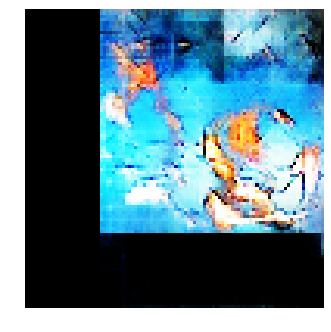


Epoch: 45240, D: -6.36, G: 3.219
Epoch: 45241, D: -6.987, G: 3.884
Epoch: 45242, D: -4.583, G: 1.324
Epoch: 45243, D: -7.467, G: 4.086
Epoch: 45244, D: -4.694, G: 2.666
Epoch: 45245, D: -5.383, G: 4.042
Epoch: 45246, D: -5.217, G: 4.64
Epoch: 45247, D: -6.679, G: 3.009
Epoch: 45248, D: -5.928, G: 2.408
Epoch: 45249, D: -4.819, G: 3.204
Epoch: 45250, D: -7.234, G: 4.158
Epoch: 45251, D: -7.166, G: 5.008
Epoch: 45252, D: -5.952, G: 4.826
Epoch: 45253, D: -6.859, G: 3.945
Epoch: 45254, D: -5.919, G: 4.066
Epoch: 45255, D: -7.213, G: 2.426
Epoch: 45256, D: -7.549, G: 4.158
Epoch: 45257, D: -5.727, G: 4.808
Epoch: 45258, D: -5.42, G: 4.562
Epoch: 45259, D: -7.562, G: 3.833


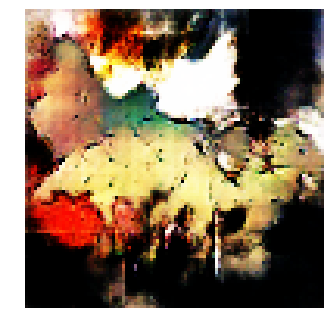


Epoch: 45260, D: -6.971, G: 2.316
Epoch: 45261, D: -6.587, G: 3.526
Epoch: 45262, D: -6.561, G: 3.114
Epoch: 45263, D: -6.796, G: 1.783
Epoch: 45264, D: -6.437, G: 2.936
Epoch: 45265, D: -6.153, G: 3.61
Epoch: 45266, D: -6.171, G: 1.439
Epoch: 45267, D: -4.824, G: 4.784
Epoch: 45268, D: -7.416, G: 5.523
Epoch: 45269, D: -6.072, G: 4.455
Epoch: 45270, D: -6.571, G: 4.527
Epoch: 45271, D: -5.404, G: 4.224
Epoch: 45272, D: -6.263, G: 3.841
Epoch: 45273, D: -6.155, G: 3.571
Epoch: 45274, D: -7.422, G: 4.646
Epoch: 45275, D: -5.347, G: 3.689
Epoch: 45276, D: -6.097, G: 3.72
Epoch: 45277, D: -5.833, G: 4.686
Epoch: 45278, D: -6.323, G: 2.008
Epoch: 45279, D: -6.245, G: 4.928


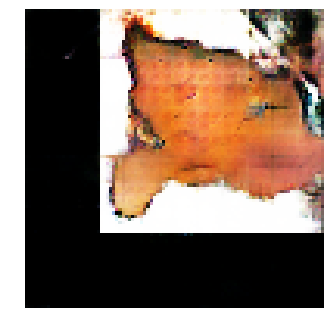


Epoch: 45280, D: -6.089, G: 4.421
Epoch: 45281, D: -6.748, G: 2.409
Epoch: 45282, D: -5.917, G: 4.032
Epoch: 45283, D: -6.715, G: 5.003
Epoch: 45284, D: -6.408, G: 4.581
Epoch: 45285, D: -5.482, G: 4.862
Epoch: 45286, D: -6.04, G: 4.613
Epoch: 45287, D: -4.535, G: 4.627
Epoch: 45288, D: -5.712, G: 6.318
Epoch: 45289, D: -7.202, G: 3.629
Epoch: 45290, D: -6.509, G: 2.455
Epoch: 45291, D: -5.706, G: 2.464
Epoch: 45292, D: -7.131, G: 0.4433
Epoch: 45293, D: -6.15, G: 3.366
Epoch: 45294, D: -7.519, G: 2.701
Epoch: 45295, D: -5.687, G: 2.425
Epoch: 45296, D: -5.548, G: 4.176
Epoch: 45297, D: -8.092, G: 4.606
Epoch: 45298, D: -5.968, G: 2.375
Epoch: 45299, D: -6.36, G: 4.574


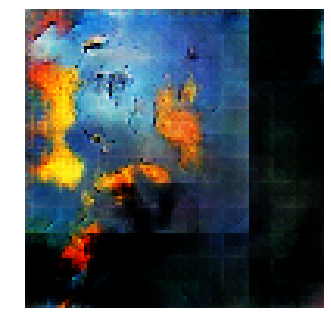


Epoch: 45300, D: -6.535, G: 7.029
Epoch: 45301, D: -6.647, G: 3.935
Epoch: 45302, D: -7.992, G: 4.298
Epoch: 45303, D: -6.778, G: 4.206
Epoch: 45304, D: -6.287, G: 2.383
Epoch: 45305, D: -4.617, G: 3.335
Epoch: 45306, D: -5.785, G: 6.126
Epoch: 45307, D: -6.258, G: 3.208
Epoch: 45308, D: -6.822, G: 4.895
Epoch: 45309, D: -6.496, G: 3.942
Epoch: 45310, D: -6.942, G: 4.781
Epoch: 45311, D: -6.69, G: 4.936
Epoch: 45312, D: -5.293, G: 3.673
Epoch: 45313, D: -6.714, G: 3.306
Epoch: 45314, D: -4.749, G: 2.837
Epoch: 45315, D: -5.948, G: 3.885
Epoch: 45316, D: -5.158, G: 5.154
Epoch: 45317, D: -6.266, G: 3.808
Epoch: 45318, D: -6.071, G: 2.767
Epoch: 45319, D: -6.072, G: 3.654


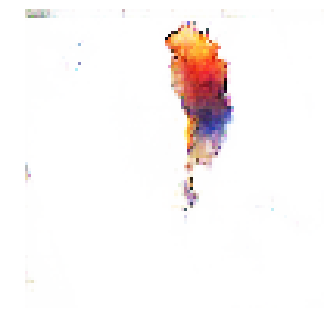


Epoch: 45320, D: -5.656, G: 3.834
Epoch: 45321, D: -5.237, G: 2.6
Epoch: 45322, D: -6.392, G: 4.255
Epoch: 45323, D: -7.003, G: 2.539
Epoch: 45324, D: -7.077, G: 3.603
Epoch: 45325, D: -6.315, G: 3.528
Epoch: 45326, D: -6.318, G: 1.613
Epoch: 45327, D: -6.301, G: 4.307
Epoch: 45328, D: -6.479, G: 4.194
Epoch: 45329, D: -6.337, G: 3.85
Epoch: 45330, D: -8.252, G: 3.088
Epoch: 45331, D: -5.921, G: 2.823
Epoch: 45332, D: -5.131, G: 1.106
Epoch: 45333, D: -6.355, G: 2.937
Epoch: 45334, D: -6.955, G: 4.389
Epoch: 45335, D: -4.101, G: 2.135
Epoch: 45336, D: -6.251, G: 4.092
Epoch: 45337, D: -4.922, G: 2.924
Epoch: 45338, D: -6.891, G: 5.114
Epoch: 45339, D: -7.946, G: 2.928


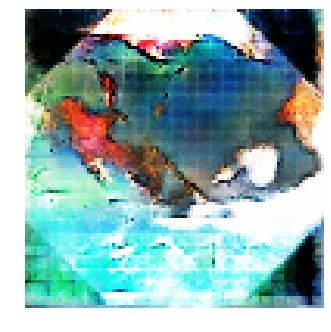


Epoch: 45340, D: -8.605, G: 3.299
Epoch: 45341, D: -6.348, G: 3.468
Epoch: 45342, D: -4.286, G: 4.75
Epoch: 45343, D: -6.141, G: 5.84
Epoch: 45344, D: -4.381, G: 3.927
Epoch: 45345, D: -7.08, G: 5.373
Epoch: 45346, D: -5.639, G: 3.758
Epoch: 45347, D: -6.796, G: 3.145
Epoch: 45348, D: -7.431, G: 6.178
Epoch: 45349, D: -7.775, G: 3.566
Epoch: 45350, D: -5.871, G: 5.352
Epoch: 45351, D: -5.786, G: 5.431
Epoch: 45352, D: -6.809, G: 4.139
Epoch: 45353, D: -6.195, G: 3.917
Epoch: 45354, D: -6.407, G: 5.063
Epoch: 45355, D: -4.086, G: 4.918
Epoch: 45356, D: -4.989, G: 4.038
Epoch: 45357, D: -6.061, G: 3.371
Epoch: 45358, D: -7.395, G: 3.26
Epoch: 45359, D: -6.531, G: 1.731


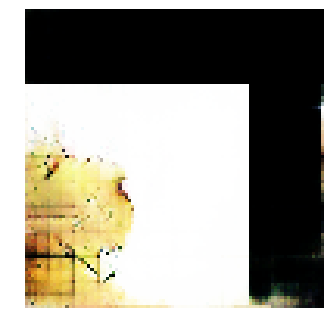


Epoch: 45360, D: -7.386, G: 4.911
Epoch: 45361, D: -7.97, G: 1.808
Epoch: 45362, D: -5.587, G: 1.293
Epoch: 45363, D: -7.025, G: 2.753
Epoch: 45364, D: -5.566, G: 3.524
Epoch: 45365, D: -5.141, G: 3.437
Epoch: 45366, D: -5.805, G: 2.566
Epoch: 45367, D: -5.577, G: 3.135
Epoch: 45368, D: -5.197, G: 5.444
Epoch: 45369, D: -7.33, G: 2.906
Epoch: 45370, D: -6.569, G: 2.021
Epoch: 45371, D: -6.389, G: 2.216
Epoch: 45372, D: -7.38, G: 2.188
Epoch: 45373, D: -6.085, G: 3.763
Epoch: 45374, D: -6.05, G: 2.574
Epoch: 45375, D: -6.896, G: 4.583
Epoch: 45376, D: -6.625, G: 3.66
Epoch: 45377, D: -5.687, G: 2.906
Epoch: 45378, D: -6.882, G: 3.304
Epoch: 45379, D: -5.839, G: 2.67


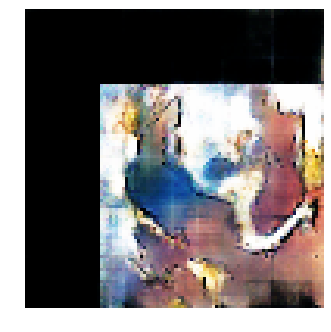


Epoch: 45380, D: -6.318, G: 3.985
Epoch: 45381, D: -5.606, G: 5.322
Epoch: 45382, D: -5.313, G: 4.221
Epoch: 45383, D: -7.872, G: 6.251
Epoch: 45384, D: -4.874, G: 2.49
Epoch: 45385, D: -6.088, G: 3.495
Epoch: 45386, D: -5.274, G: 3.983
Epoch: 45387, D: -6.946, G: 4.212
Epoch: 45388, D: -8.16, G: 4.394
Epoch: 45389, D: -7.428, G: 2.622
Epoch: 45390, D: -6.719, G: 5.542
Epoch: 45391, D: -6.343, G: 3.183
Epoch: 45392, D: -6.756, G: 4.333
Epoch: 45393, D: -5.754, G: 4.155
Epoch: 45394, D: -6.721, G: 4.361
Epoch: 45395, D: -6.018, G: 3.663
Epoch: 45396, D: -6.39, G: 2.741
Epoch: 45397, D: -6.246, G: 3.973
Epoch: 45398, D: -6.385, G: 2.45
Epoch: 45399, D: -6.038, G: 2.509


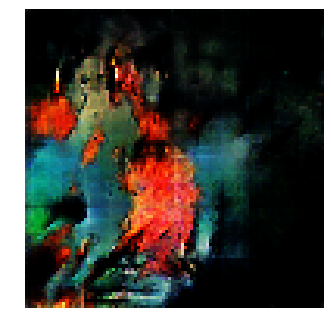


Epoch: 45400, D: -5.446, G: 2.292
Epoch: 45401, D: -6.895, G: 2.117
Epoch: 45402, D: -7.64, G: 4.365
Epoch: 45403, D: -5.208, G: 3.634
Epoch: 45404, D: -5.889, G: 4.408
Epoch: 45405, D: -4.329, G: 2.341
Epoch: 45406, D: -6.217, G: 3.231
Epoch: 45407, D: -5.805, G: 2.38
Epoch: 45408, D: -6.694, G: 2.688
Epoch: 45409, D: -5.605, G: 3.002
Epoch: 45410, D: -6.011, G: 3.058
Epoch: 45411, D: -5.295, G: 3.669
Epoch: 45412, D: -5.924, G: 3.392
Epoch: 45413, D: -5.858, G: 3.441
Epoch: 45414, D: -6.212, G: 3.97
Epoch: 45415, D: -6.771, G: 2.666
Epoch: 45416, D: -6.26, G: 4.352
Epoch: 45417, D: -6.6, G: 4.149
Epoch: 45418, D: -6.4, G: 3.282
Epoch: 45419, D: -6.595, G: 5.772


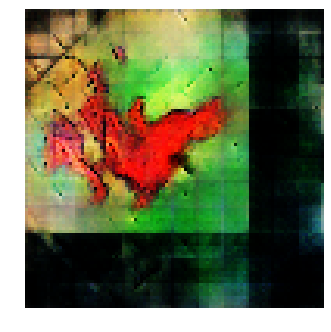


Epoch: 45420, D: -6.021, G: 4.185
Epoch: 45421, D: -6.182, G: 4.42
Epoch: 45422, D: -7.151, G: 4.197
Epoch: 45423, D: -6.269, G: 4.113
Epoch: 45424, D: -6.176, G: 2.933
Epoch: 45425, D: -6.436, G: 4.702
Epoch: 45426, D: -6.223, G: 4.155
Epoch: 45427, D: -7.785, G: 2.999
Epoch: 45428, D: -5.93, G: 2.509
Epoch: 45429, D: -7.402, G: 4.735
Epoch: 45430, D: -7.344, G: 4.567
Epoch: 45431, D: -5.109, G: 3.148
Epoch: 45432, D: -7.388, G: 4.294
Epoch: 45433, D: -5.488, G: 4.416
Epoch: 45434, D: -5.279, G: 4.525
Epoch: 45435, D: -7.36, G: 4.401
Epoch: 45436, D: -7.959, G: 3.261
Epoch: 45437, D: -7.228, G: 3.217
Epoch: 45438, D: -7.12, G: 6.236
Epoch: 45439, D: -5.452, G: 3.862


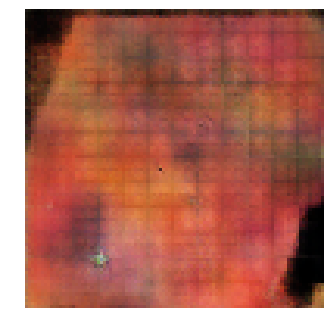


Epoch: 45440, D: -7.426, G: 4.352
Epoch: 45441, D: -5.661, G: 3.14
Epoch: 45442, D: -5.734, G: 1.69
Epoch: 45443, D: -6.682, G: 4.106
Epoch: 45444, D: -5.757, G: 4.183
Epoch: 45445, D: -6.693, G: 3.705
Epoch: 45446, D: -5.561, G: 3.386
Epoch: 45447, D: -6.213, G: 4.24
Epoch: 45448, D: -6.44, G: 4.477
Epoch: 45449, D: -5.841, G: 3.056
Epoch: 45450, D: -6.847, G: 2.637
Epoch: 45451, D: -6.267, G: 3.749
Epoch: 45452, D: -6.214, G: 3.32
Epoch: 45453, D: -5.322, G: 2.489
Epoch: 45454, D: -5.835, G: 4.937
Epoch: 45455, D: -6.336, G: 3.636
Epoch: 45456, D: -6.911, G: 3.906
Epoch: 45457, D: -6.435, G: 3.009
Epoch: 45458, D: -6.557, G: 2.443
Epoch: 45459, D: -6.839, G: 4.597


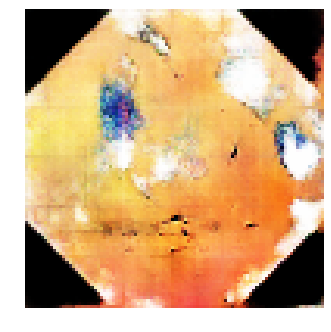


Epoch: 45460, D: -6.188, G: 3.771
Epoch: 45461, D: -6.389, G: 5.221
Epoch: 45462, D: -5.176, G: 4.283
Epoch: 45463, D: -6.534, G: 3.861
Epoch: 45464, D: -7.224, G: 4.759
Epoch: 45465, D: -6.549, G: 5.246
Epoch: 45466, D: -5.642, G: 2.861
Epoch: 45467, D: -6.356, G: 4.753
Epoch: 45468, D: -7.906, G: 3.08
Epoch: 45469, D: -7.793, G: 3.786
Epoch: 45470, D: -7.316, G: 3.435
Epoch: 45471, D: -4.96, G: 3.055
Epoch: 45472, D: -6.427, G: 3.377
Epoch: 45473, D: -5.24, G: 5.517
Epoch: 45474, D: -6.347, G: 2.778
Epoch: 45475, D: -7.01, G: 4.231
Epoch: 45476, D: -6.192, G: 2.761
Epoch: 45477, D: -6.373, G: 3.979
Epoch: 45478, D: -6.885, G: 4.611
Epoch: 45479, D: -5.515, G: 4.815


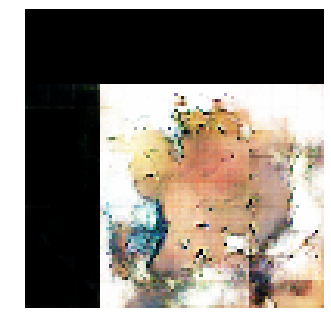


Epoch: 45480, D: -6.053, G: 5.482
Epoch: 45481, D: -6.92, G: 4.078
Epoch: 45482, D: -5.876, G: 5.236
Epoch: 45483, D: -5.187, G: 3.909
Epoch: 45484, D: -8.171, G: 5.204
Epoch: 45485, D: -7.659, G: 2.614
Epoch: 45486, D: -5.299, G: 3.834
Epoch: 45487, D: -6.528, G: 4.646
Epoch: 45488, D: -5.542, G: 2.985
Epoch: 45489, D: -6.594, G: 3.997
Epoch: 45490, D: -4.66, G: 4.446
Epoch: 45491, D: -5.534, G: 3.731
Epoch: 45492, D: -4.997, G: 3.26
Epoch: 45493, D: -5.699, G: 2.758
Epoch: 45494, D: -5.819, G: 4.346
Epoch: 45495, D: -6.208, G: 4.44
Epoch: 45496, D: -5.377, G: 3.268
Epoch: 45497, D: -6.754, G: 2.785
Epoch: 45498, D: -6.866, G: 5.352
Epoch: 45499, D: -6.44, G: 4.079


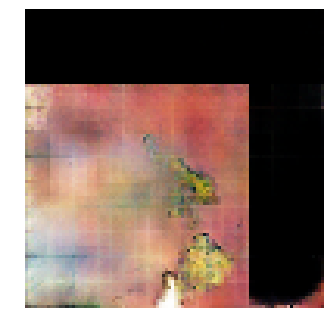


Epoch: 45500, D: -6.203, G: 3.626
Epoch: 45501, D: -9.582, G: 3.994
Epoch: 45502, D: -5.624, G: 3.265
Epoch: 45503, D: -5.396, G: 3.869
Epoch: 45504, D: -7.099, G: 2.914
Epoch: 45505, D: -7.293, G: 3.841
Epoch: 45506, D: -6.525, G: 3.32
Epoch: 45507, D: -8.101, G: 3.562
Epoch: 45508, D: -6.805, G: 3.124
Epoch: 45509, D: -6.045, G: 3.17
Epoch: 45510, D: -5.201, G: 4.511
Epoch: 45511, D: -6.016, G: 2.153
Epoch: 45512, D: -6.401, G: 6.074
Epoch: 45513, D: -7.263, G: 4.812
Epoch: 45514, D: -6.329, G: 2.505
Epoch: 45515, D: -6.817, G: 5.184
Epoch: 45516, D: -5.918, G: 3.341
Epoch: 45517, D: -4.311, G: 5.465
Epoch: 45518, D: -8.48, G: 4.51
Epoch: 45519, D: -7.479, G: 4.503


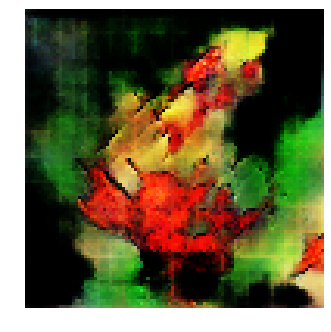


Epoch: 45520, D: -5.27, G: 5.46
Epoch: 45521, D: -5.559, G: 5.976
Epoch: 45522, D: -7.308, G: 4.139
Epoch: 45523, D: -6.664, G: 4.592
Epoch: 45524, D: -5.992, G: 2.851
Epoch: 45525, D: -5.577, G: 4.305
Epoch: 45526, D: -6.954, G: 3.944
Epoch: 45527, D: -4.305, G: 3.778
Epoch: 45528, D: -6.79, G: 3.922
Epoch: 45529, D: -6.241, G: 5.206
Epoch: 45530, D: -4.937, G: 3.92
Epoch: 45531, D: -5.052, G: 5.467
Epoch: 45532, D: -5.189, G: 3.274
Epoch: 45533, D: -4.794, G: 4.04
Epoch: 45534, D: -7.126, G: 3.015
Epoch: 45535, D: -5.12, G: 6.082
Epoch: 45536, D: -7.609, G: 5.03
Epoch: 45537, D: -6.524, G: 3.356
Epoch: 45538, D: -7.643, G: 3.492
Epoch: 45539, D: -6.394, G: 3.63


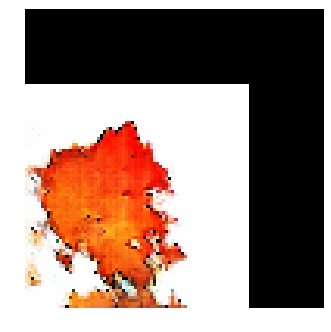


Epoch: 45540, D: -5.763, G: 4.356
Epoch: 45541, D: -7.117, G: 5.581
Epoch: 45542, D: -5.692, G: 1.779
Epoch: 45543, D: -6.44, G: 4.05
Epoch: 45544, D: -6.726, G: 3.8
Epoch: 45545, D: -7.918, G: 4.27
Epoch: 45546, D: -5.431, G: 4.16
Epoch: 45547, D: -6.083, G: 3.322
Epoch: 45548, D: -8.992, G: 3.718
Epoch: 45549, D: -6.968, G: 4.887
Epoch: 45550, D: -5.952, G: 3.263
Epoch: 45551, D: -7.099, G: 3.661
Epoch: 45552, D: -5.594, G: 2.048
Epoch: 45553, D: -6.396, G: 3.877
Epoch: 45554, D: -4.986, G: 4.865
Epoch: 45555, D: -7.695, G: 6.384
Epoch: 45556, D: -5.532, G: 2.666
Epoch: 45557, D: -5.883, G: 3.71
Epoch: 45558, D: -7.858, G: 4.708
Epoch: 45559, D: -6.806, G: 2.899


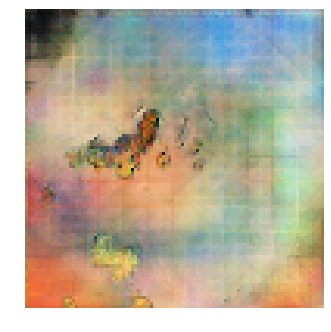


Epoch: 45560, D: -5.87, G: 5.939
Epoch: 45561, D: -6.234, G: 3.183
Epoch: 45562, D: -6.417, G: 3.415
Epoch: 45563, D: -5.062, G: 2.048
Epoch: 45564, D: -6.855, G: 4.972
Epoch: 45565, D: -8.083, G: 4.382
Epoch: 45566, D: -5.762, G: 3.873
Epoch: 45567, D: -5.748, G: 4.507
Epoch: 45568, D: -8.443, G: 4.748
Epoch: 45569, D: -7.125, G: 2.015
Epoch: 45570, D: -6.057, G: 4.257
Epoch: 45571, D: -6.595, G: 3.395
Epoch: 45572, D: -5.184, G: 4.321
Epoch: 45573, D: -7.423, G: 3.156
Epoch: 45574, D: -6.59, G: 3.537
Epoch: 45575, D: -5.454, G: 4.573
Epoch: 45576, D: -5.148, G: 4.411
Epoch: 45577, D: -8.102, G: 3.906
Epoch: 45578, D: -5.067, G: 3.044
Epoch: 45579, D: -6.331, G: 3.574


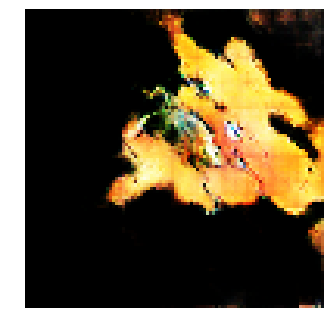


Epoch: 45580, D: -6.146, G: 3.805
Epoch: 45581, D: -6.775, G: 3.514
Epoch: 45582, D: -5.676, G: 4.314
Epoch: 45583, D: -5.586, G: 3.238
Epoch: 45584, D: -7.187, G: 3.265
Epoch: 45585, D: -6.112, G: 2.927
Epoch: 45586, D: -5.655, G: 4.261
Epoch: 45587, D: -5.428, G: 3.397
Epoch: 45588, D: -7.145, G: 2.278
Epoch: 45589, D: -6.355, G: 2.742
Epoch: 45590, D: -6.814, G: 2.76
Epoch: 45591, D: -8.879, G: 4.34
Epoch: 45592, D: -7.288, G: 5.76
Epoch: 45593, D: -6.597, G: 3.506
Epoch: 45594, D: -6.832, G: 2.721
Epoch: 45595, D: -6.191, G: 3.22
Epoch: 45596, D: -7.761, G: 4.177
Epoch: 45597, D: -6.38, G: 1.638
Epoch: 45598, D: -6.624, G: 4.225
Epoch: 45599, D: -7.547, G: 5.623


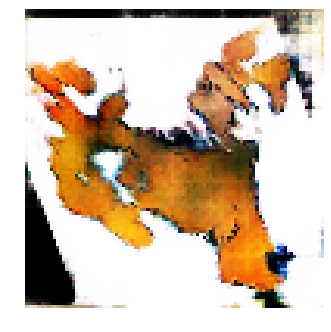


Epoch: 45600, D: -6.334, G: 3.457
Epoch: 45601, D: -6.057, G: 5.123
Epoch: 45602, D: -4.836, G: 4.973
Epoch: 45603, D: -6.325, G: 2.634
Epoch: 45604, D: -7.914, G: 2.647
Epoch: 45605, D: -8.066, G: 4.209
Epoch: 45606, D: -5.306, G: 3.322
Epoch: 45607, D: -6.723, G: 4.769
Epoch: 45608, D: -7.477, G: 2.65
Epoch: 45609, D: -6.752, G: 2.213
Epoch: 45610, D: -5.801, G: 3.284
Epoch: 45611, D: -6.8, G: 3.361
Epoch: 45612, D: -6.382, G: 3.425
Epoch: 45613, D: -6.51, G: 3.326
Epoch: 45614, D: -5.492, G: 2.693
Epoch: 45615, D: -6.474, G: 2.92
Epoch: 45616, D: -6.865, G: 4.404
Epoch: 45617, D: -7.2, G: 2.856
Epoch: 45618, D: -5.171, G: 0.08611
Epoch: 45619, D: -5.068, G: 3.864


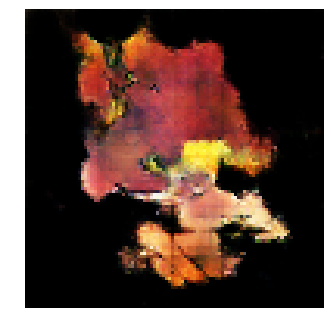


Epoch: 45620, D: -5.283, G: 4.22
Epoch: 45621, D: -6.644, G: 4.244
Epoch: 45622, D: -5.559, G: 3.286
Epoch: 45623, D: -7.441, G: 4.065
Epoch: 45624, D: -6.504, G: 1.256
Epoch: 45625, D: -7.159, G: 2.804
Epoch: 45626, D: -6.953, G: 5.139
Epoch: 45627, D: -7.056, G: 3.852
Epoch: 45628, D: -5.872, G: 4.772
Epoch: 45629, D: -6.702, G: 3.254
Epoch: 45630, D: -6.513, G: 3.825
Epoch: 45631, D: -6.511, G: 1.535
Epoch: 45632, D: -5.822, G: 4.455
Epoch: 45633, D: -4.927, G: 5.119
Epoch: 45634, D: -5.289, G: 3.247
Epoch: 45635, D: -7.211, G: 4.775
Epoch: 45636, D: -7.066, G: 3.726
Epoch: 45637, D: -6.408, G: 3.276
Epoch: 45638, D: -5.934, G: 3.427
Epoch: 45639, D: -7.124, G: 4.28


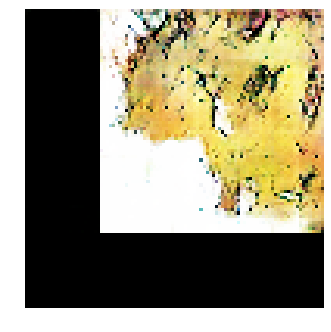


Epoch: 45640, D: -6.022, G: 3.84
Epoch: 45641, D: -5.143, G: 4.845
Epoch: 45642, D: -6.1, G: 3.975
Epoch: 45643, D: -6.426, G: 4.969
Epoch: 45644, D: -6.11, G: 3.116
Epoch: 45645, D: -7.488, G: 3.268
Epoch: 45646, D: -5.728, G: 6.575
Epoch: 45647, D: -7.76, G: 3.457
Epoch: 45648, D: -7.298, G: 3.491
Epoch: 45649, D: -6.09, G: 4.437
Epoch: 45650, D: -7.213, G: 4.896
Epoch: 45651, D: -5.373, G: 4.794
Epoch: 45652, D: -7.408, G: 2.314
Epoch: 45653, D: -6.769, G: 3.653
Epoch: 45654, D: -6.85, G: 5.249
Epoch: 45655, D: -5.825, G: 4.264
Epoch: 45656, D: -6.299, G: 3.861
Epoch: 45657, D: -7.697, G: 4.505
Epoch: 45658, D: -5.51, G: 2.23
Epoch: 45659, D: -7.059, G: 3.644


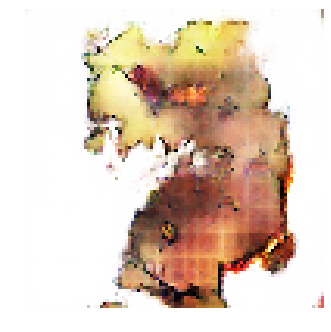


Epoch: 45660, D: -6.699, G: 4.539
Epoch: 45661, D: -6.714, G: 3.699
Epoch: 45662, D: -7.891, G: 3.825
Epoch: 45663, D: -8.145, G: 2.759
Epoch: 45664, D: -7.004, G: 5.852
Epoch: 45665, D: -6.959, G: 2.74
Epoch: 45666, D: -5.937, G: 6.026
Epoch: 45667, D: -5.95, G: 3.775
Epoch: 45668, D: -6.216, G: 3.465
Epoch: 45669, D: -5.839, G: 3.729
Epoch: 45670, D: -4.599, G: 2.884
Epoch: 45671, D: -5.535, G: 4.594
Epoch: 45672, D: -6.663, G: 3.888
Epoch: 45673, D: -6.486, G: 3.14
Epoch: 45674, D: -5.956, G: 4.568
Epoch: 45675, D: -6.225, G: 4.3
Epoch: 45676, D: -5.554, G: 3.755
Epoch: 45677, D: -6.404, G: 5.11
Epoch: 45678, D: -5.941, G: 3.423
Epoch: 45679, D: -6.783, G: 3.952


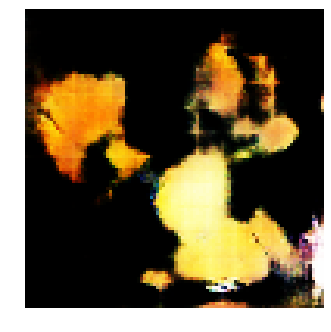


Epoch: 45680, D: -6.523, G: 2.093
Epoch: 45681, D: -4.681, G: 0.9306
Epoch: 45682, D: -6.298, G: 3.817
Epoch: 45683, D: -4.714, G: 3.289
Epoch: 45684, D: -6.162, G: 3.962
Epoch: 45685, D: -5.727, G: 3.485
Epoch: 45686, D: -7.045, G: 3.245
Epoch: 45687, D: -6.813, G: 2.268
Epoch: 45688, D: -6.508, G: 2.779
Epoch: 45689, D: -5.849, G: 2.819
Epoch: 45690, D: -6.218, G: 3.691
Epoch: 45691, D: -6.533, G: 4.385
Epoch: 45692, D: -5.196, G: 3.712
Epoch: 45693, D: -5.352, G: 2.547
Epoch: 45694, D: -6.768, G: 5.213
Epoch: 45695, D: -5.788, G: 2.816
Epoch: 45696, D: -7.03, G: 4.629
Epoch: 45697, D: -5.672, G: 5.305
Epoch: 45698, D: -5.801, G: 3.487
Epoch: 45699, D: -6.393, G: 5.821


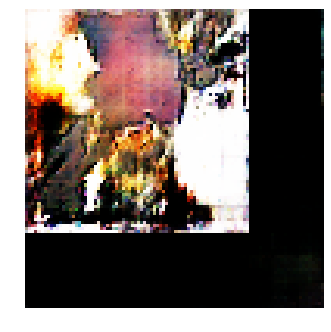


Epoch: 45700, D: -5.999, G: 2.148
Epoch: 45701, D: -8.227, G: 3.83
Epoch: 45702, D: -5.821, G: 3.067
Epoch: 45703, D: -5.781, G: 3.78
Epoch: 45704, D: -6.606, G: 4.821
Epoch: 45705, D: -6.031, G: 3.083
Epoch: 45706, D: -5.43, G: 2.764
Epoch: 45707, D: -6.487, G: 3.958
Epoch: 45708, D: -8.221, G: 3.551
Epoch: 45709, D: -6.041, G: 2.34
Epoch: 45710, D: -6.726, G: 2.97
Epoch: 45711, D: -6.563, G: 2.918
Epoch: 45712, D: -6.465, G: 2.309
Epoch: 45713, D: -6.968, G: 2.806
Epoch: 45714, D: -5.535, G: 3.239
Epoch: 45715, D: -6.347, G: 5.316
Epoch: 45716, D: -5.327, G: 3.675
Epoch: 45717, D: -6.778, G: 3.76
Epoch: 45718, D: -6.635, G: 2.493
Epoch: 45719, D: -6.827, G: 4.74


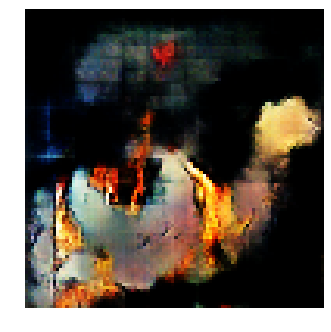


Epoch: 45720, D: -7.337, G: 4.375
Epoch: 45721, D: -5.302, G: 4.748
Epoch: 45722, D: -8.012, G: 4.487
Epoch: 45723, D: -6.21, G: 4.364
Epoch: 45724, D: -5.241, G: 3.177
Epoch: 45725, D: -8.405, G: 3.488
Epoch: 45726, D: -6.562, G: 3.882
Epoch: 45727, D: -6.17, G: 4.771
Epoch: 45728, D: -7.761, G: 3.013
Epoch: 45729, D: -7.536, G: 4.233
Epoch: 45730, D: -8.035, G: 4.457
Epoch: 45731, D: -6.988, G: 3.373
Epoch: 45732, D: -5.373, G: 4.488
Epoch: 45733, D: -5.527, G: 4.61
Epoch: 45734, D: -6.268, G: 4.434
Epoch: 45735, D: -5.712, G: 3.969
Epoch: 45736, D: -6.269, G: 6.463
Epoch: 45737, D: -5.905, G: 4.728
Epoch: 45738, D: -6.142, G: 4.422
Epoch: 45739, D: -6.875, G: 4.13


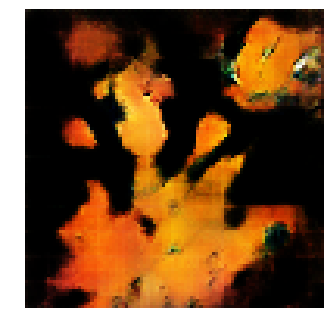


Epoch: 45740, D: -5.023, G: 4.031
Epoch: 45741, D: -6.227, G: 4.862
Epoch: 45742, D: -6.768, G: 2.899
Epoch: 45743, D: -6.854, G: 4.968
Epoch: 45744, D: -5.368, G: 3.601
Epoch: 45745, D: -7.565, G: 4.476
Epoch: 45746, D: -5.458, G: 1.889
Epoch: 45747, D: -7.304, G: 4.866
Epoch: 45748, D: -4.851, G: 3.677
Epoch: 45749, D: -6.707, G: 4.893
Epoch: 45750, D: -7.66, G: 3.959
Epoch: 45751, D: -6.349, G: 3.198
Epoch: 45752, D: -5.958, G: 3.689
Epoch: 45753, D: -5.587, G: 2.523
Epoch: 45754, D: -3.547, G: 4.123
Epoch: 45755, D: -6.353, G: 3.84


In [0]:
#with tf.Session() as sess:
sess = tf.Session()
saver = tf.train.Saver()
#sess.run(tf.global_variables_initializer())
#print('Initialization done!')


#Test saving and loading
#save_path = saver.save(sess, 'drive/Pokemon/Checkpoints/model.ckpt')
ckpt = tf.train.latest_checkpoint('drive/Pokemon_Fire/Final_Checkpoints')
print(ckpt)
saver.restore(sess,ckpt)
print('Restored!')

run_a_gan(sess,G_train_step,G_loss,D_train_step,D_loss,G_extra_step,D_extra_step,saver,num_epoch=15`000)
 
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon_Fire/Saved_model_Final',save_inputs,save_outputs)

In [0]:
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon/Saved_modelGP',save_inputs,save_outputs)

In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

Gen RAM Free: 10.4 GB  | Proc size: 5.2 GB
GPU RAM Free: 503MB | Used: 10936MB | Util  96% | Total 11439MB


In [0]:
!ps ax | grep python

   82 ?        Sl     0:10 /usr/bin/python2 /usr/local/bin/jupyter-notebook -y --no-browser --log-level=DEBUG --debug --NotebookApp.allow_origin="*" --NotebookApp.log_format="%(message)s" --NotebookApp.disable_check_xsrf=True --NotebookApp.token= --Session.key="" --Session.keyfile="" --ContentsManager.untitled_directory="Untitled Folder" --ContentsManager.untitled_file="Untitled File" --ContentsManager.untitled_notebook="Untitled Notebook" --KernelManager.autorestart=True --MultiKernelManager.default_kernel_name="python2" --ip="172.28.0.2" --port=9000 --port-retries=0 --notebook-dir="/content" --NotebookApp.base_url=/tun/m/gpu-1oh0mpcgklgqc/
   90 ?        Ssl  223:25 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-14d934e3-be51-46ed-9bdb-cf6fa1f8fa07.json
24021 ?        Ssl    0:10 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-bd5eb725-93eb-4089-b928-3dc6365a54c7.json
30723 pts/0    Ss+    0:00 /bin/sh -c 

In [0]:
!kill -9 90

In [0]:
#Clear everything
!kill -9 -1

In [0]:
sess.close()